### Comparison between Hodgkin Huxley, LIF and AdEx on 8 sweeps of Long Square on Frontal Lobe of 25 yr old male with epilepsy

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from brian2 import *
from brian2modelfitting import *
# from general_functions import *

WARNING    c:\Users\yjk16\anaconda3\envs\brianfit_env\lib\site-packages\brian2modelfitting\utils.py:1: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm
 [py.warnings]


In [2]:
from general_functions import *

In [4]:
# sweep nos 40-47 from Allen...
ls_current = pd.read_csv('long_square_in.csv', index_col=0).to_numpy()
ls_response = pd.read_csv('long_square_out.csv', index_col=0).to_numpy()

ls_in_amps = ls_current * 10**-12

start = 50_000
end = 102_000

sliced_ls_amps = ls_in_amps[:, start:end]       # len 52_000
sliced_ls_res = ls_response[:, start:end]       # len/50_000 = 1.04

time_step = np.arange(0, len(ls_in_amps[0]))
sampling_rate = 50000
# time_steps = time_step * (1/sampling_rate)

# dt = 1/sampling_rate
# dt_in_ms = (1/sampling_rate) * 1000

sweeps4_to_7_ls_amps = sliced_ls_amps[4:,:]
sweeps4_to_7_ls_res = sliced_ls_res[4:,:]

sweeps_5_to_7_ls_amps = sliced_ls_amps[5:,:]
sweeps_5_to_7_ls_res = sliced_ls_res[5:,:]

reshaped_ls_sweep4_in, reshaped_ls_sweep4_out = reshape_data(sweeps4_to_7_ls_amps[0], sweeps4_to_7_ls_res[0])
reshaped_ls_sweep5_in, reshaped_ls_sweep5_out = reshape_data(sweeps4_to_7_ls_amps[1], sweeps4_to_7_ls_res[1])
reshaped_ls_sweep6_in, reshaped_ls_sweep6_out = reshape_data(sweeps4_to_7_ls_amps[2], sweeps4_to_7_ls_res[2])
reshaped_ls_sweep7_in, reshaped_ls_sweep7_out = reshape_data(sweeps4_to_7_ls_amps[3], sweeps4_to_7_ls_res[3])

In [ ]:
# print(reshaped_ls_sweep5_in[0, 1000:1500])

***
***

# Initial analysis

***

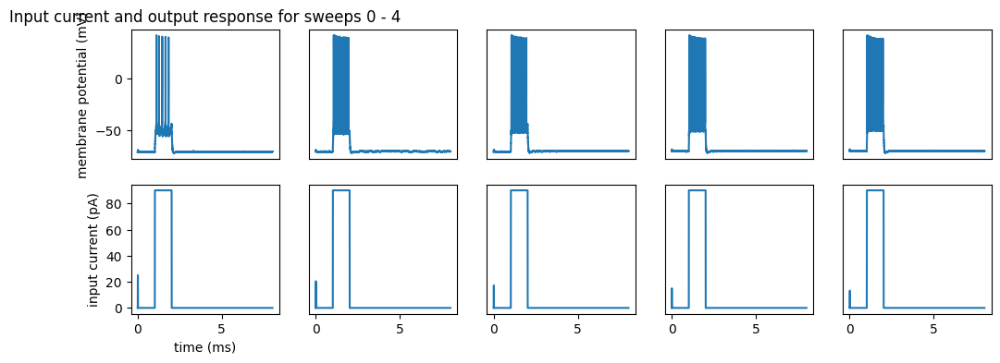

In [5]:
# first 5 long square sweeps (0-4)
# NOTE: inputs aren't accurate as they differ between sweeps
create_initial_in_out(ls_response, ls_in_amps*10**12, 0)

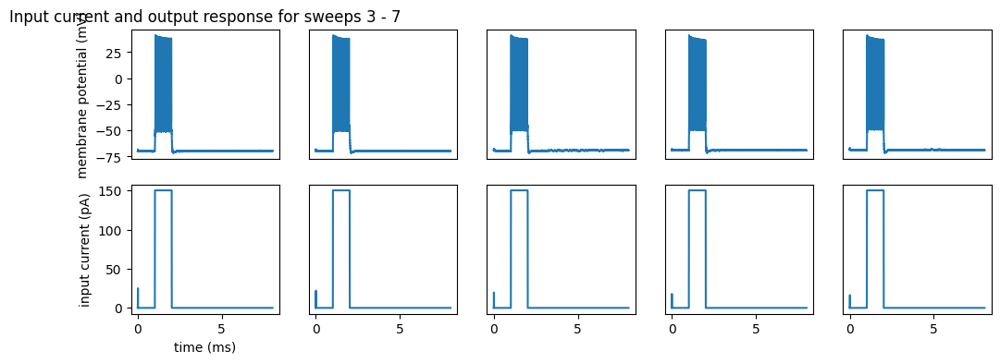

In [6]:
# last 5 long square sweeps (3-7)
# NOTE: inputs aren't accurate
create_initial_in_out(ls_response, ls_in_amps*10**12, 3)

Text(0.5, 1.0, 'Long Square: sweep 0')

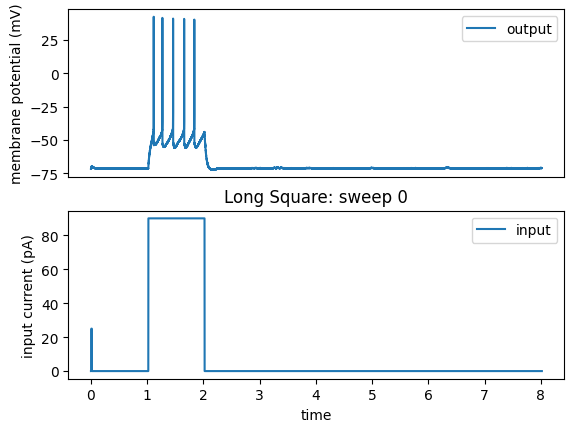

In [7]:
plot_vertical_fit(ls_response[0], ls_in_amps[0]*10**12)
title('Long Square: sweep 0')

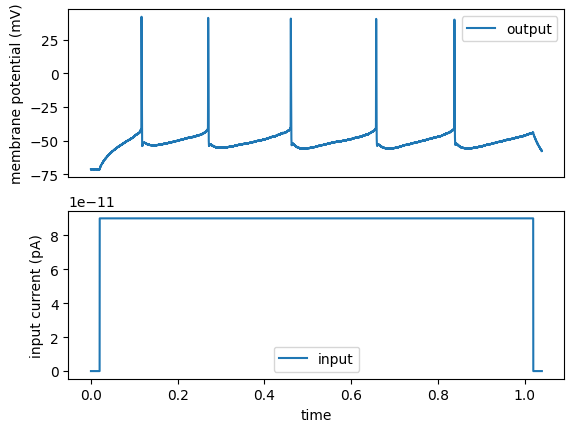

In [8]:
plot_vertical_fit(sliced_ls_res[0], sliced_ls_amps[0], xlimmax=None)

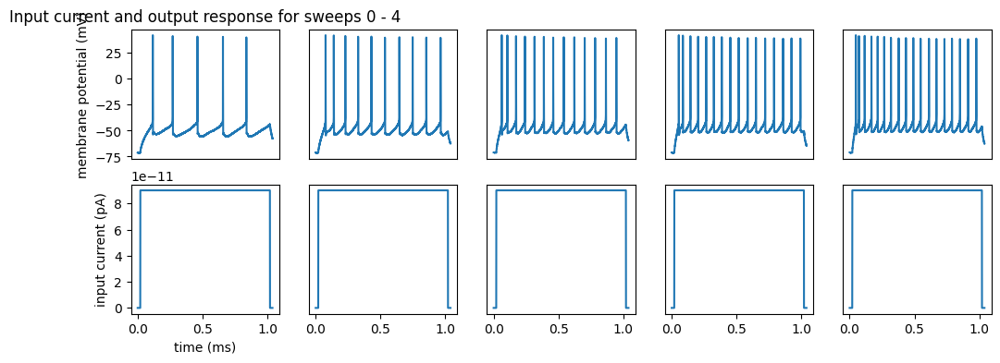

In [11]:
create_initial_in_out(sliced_ls_res, sliced_ls_amps, 0)

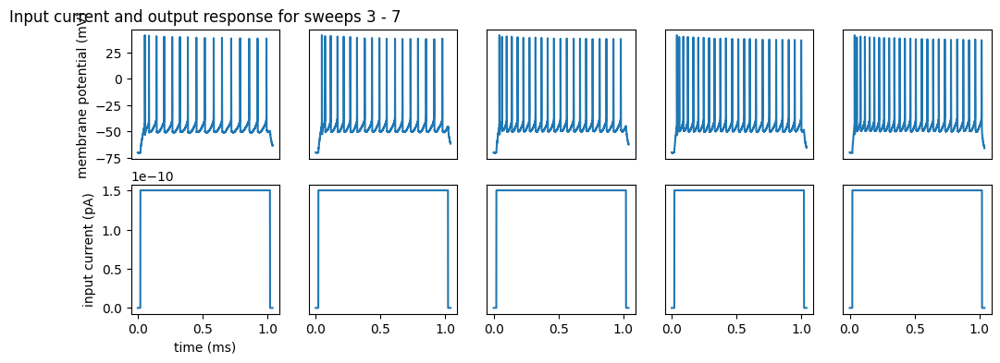

In [13]:
create_initial_in_out(sliced_ls_res, sliced_ls_amps, 3)

([], [])

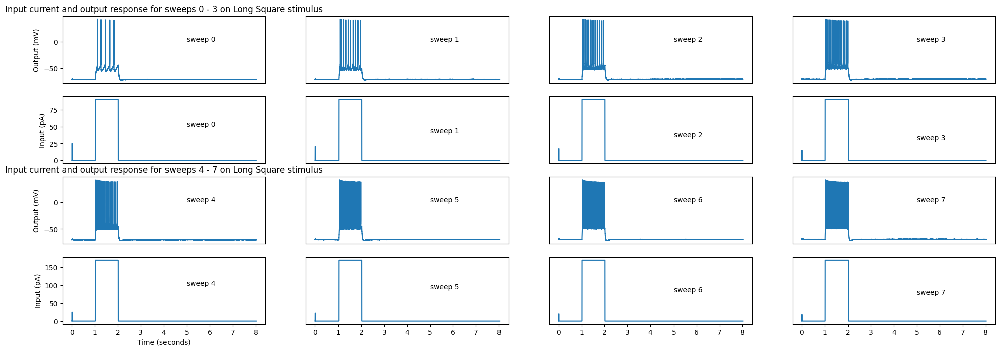

In [18]:
figure(figsize=(24,8))

ts = (np.arange(0, len(ls_current[0]))) * (1/50_000)

subplot(4,4,1)
plot(ts, ls_response[0])
text(5, 0, 'sweep 0')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# xlabel('time (ms)')
ylabel('Output (mV)')
# ylabel('input current (pA)')
title(f'Input current and output response for sweeps 0 - 3 on Long Square stimulus')

subplot(4,4,2)
plot(ts, ls_response[1])
text(5, 0, 'sweep 1')
tick_params(
axis='x',          
which='both',     
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,3)
plot(ts, ls_response[2])
text(5, 0, 'sweep 2')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,4)
plot(ts, ls_response[3])
text(5, 0, 'sweep 3')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,5)
plot(ts, ls_current[0])
text(5, 50, 'sweep 0')
ylabel('Input (pA)')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# yticks([])

subplot(4,4,6)
plot(ts, ls_current[1])
text(5, 50, 'sweep 1')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])
# xlabel('time (ms)')
# ylabel('input current (pA)')
# ylabel('membrane potential (mV)')

subplot(4,4,7)
plot(ts, ls_current[2])
text(5, 50, 'sweep 2')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,8)
plot(ts, ls_current[3])
text(5, 50, 'sweep 3')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,9)
plot(ts, ls_response[4])
text(5, 0, 'sweep 4')
ylabel('Output (mV)')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
title(f'Input current and output response for sweeps 4 - 7 on Long Square stimulus')
# yticks([])

subplot(4,4,10)
plot(ts, ls_response[5])
text(5, 0, 'sweep 5')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,11)
plot(ts, ls_response[6])
text(5, 0, 'sweep 6')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,12)
plot(ts, ls_response[7])
text(5, 0, 'sweep 7')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])


subplot(4,4,13)
plot(ts, ls_current[4])
text(5, 100, 'sweep 4')
xlabel('Time (seconds)')
ylabel('Input (pA)')
# yticks([])

subplot(4,4,14)
plot(ts, ls_current[5])
text(5, 100, 'sweep 5')
yticks([])

subplot(4,4,15)
plot(ts, ls_current[6])
text(5, 100, 'sweep 6')
yticks([])

subplot(4,4,16)
plot(ts, ls_current[7])
text(5, 100, 'sweep 7')
yticks([])

# legend()


([], [])

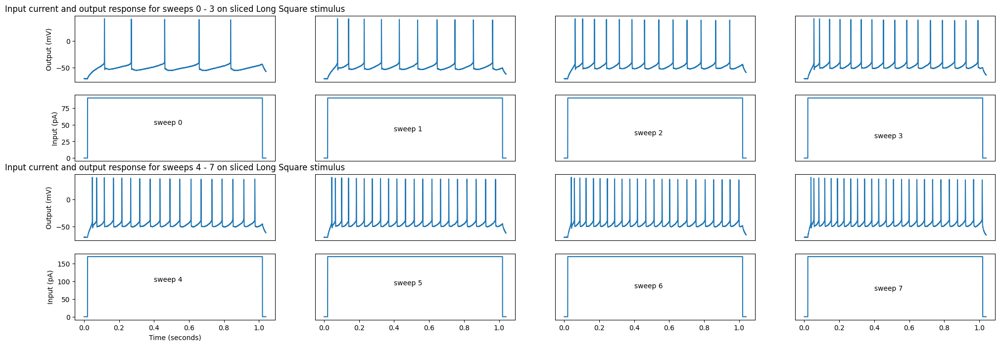

In [21]:
figure(figsize=(24,8))

ts = (np.arange(0, len(sliced_ls_res[0]))) * (1/50_000)

subplot(4,4,1)
plot(ts, sliced_ls_res[0])
# text(5, 0, 'sweep 0')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# xlabel('time (ms)')
ylabel('Output (mV)')
# ylabel('input current (pA)')
title(f'Input current and output response for sweeps 0 - 3 on sliced Long Square stimulus')

subplot(4,4,2)
plot(ts, sliced_ls_res[1])
# text(5, 0, 'sweep 1')
tick_params(
axis='x',          
which='both',     
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,3)
plot(ts, sliced_ls_res[2])
# text(5, 0, 'sweep 2')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,4)
plot(ts, sliced_ls_res[3])
# text(5, 0, 'sweep 3')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,5)
plot(ts, sliced_ls_amps[0]*10**12)
text(0.4, 50, 'sweep 0')
ylabel('Input (pA)')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# yticks([])

subplot(4,4,6)
plot(ts, sliced_ls_amps[1]*10**12)
text(0.4, 50, 'sweep 1')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])
# xlabel('time (ms)')
# ylabel('input current (pA)')
# ylabel('membrane potential (mV)')

subplot(4,4,7)
plot(ts, sliced_ls_amps[2]*10**12)
text(0.4, 50, 'sweep 2')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,8)
plot(ts, sliced_ls_amps[3]*10**12)
text(0.4, 50, 'sweep 3')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,9)
plot(ts, sliced_ls_res[4])
# text(5, 0, 'sweep 4')
ylabel('Output (mV)')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
title(f'Input current and output response for sweeps 4 - 7 on sliced Long Square stimulus')
# yticks([])

subplot(4,4,10)
plot(ts, sliced_ls_res[5])
# text(5, 0, 'sweep 5')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,11)
plot(ts, sliced_ls_res[6])
# text(5, 0, 'sweep 6')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,12)
plot(ts, sliced_ls_res[7])
# text(5, 0, 'sweep 7')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])


subplot(4,4,13)
plot(ts, sliced_ls_amps[4]*10**12)
text(0.4, 100, 'sweep 4')
xlabel('Time (seconds)')
ylabel('Input (pA)')
# yticks([])

subplot(4,4,14)
plot(ts, sliced_ls_amps[5]*10**12)
text(0.4, 100, 'sweep 5')
yticks([])

subplot(4,4,15)
plot(ts, sliced_ls_amps[6]*10**12)
text(0.4, 100, 'sweep 6')
yticks([])

subplot(4,4,16)
plot(ts, sliced_ls_amps[7]*10**12)
text(0.4, 100, 'sweep 7')
yticks([])

Text(0.4, 100, 'sweep 7')

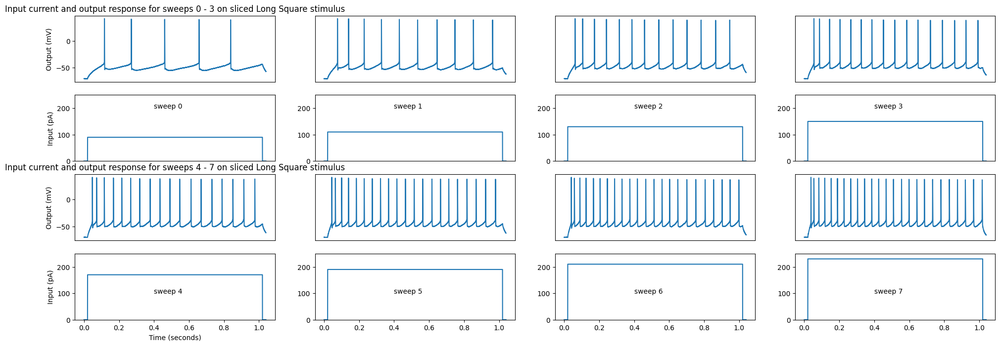

In [24]:
figure(figsize=(24,8))

ts = (np.arange(0, len(sliced_ls_res[0]))) * (1/50_000)

subplot(4,4,1)
plot(ts, sliced_ls_res[0])
# text(5, 0, 'sweep 0')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# xlabel('time (ms)')
ylabel('Output (mV)')
# ylabel('input current (pA)')
title(f'Input current and output response for sweeps 0 - 3 on sliced Long Square stimulus')

subplot(4,4,2)
plot(ts, sliced_ls_res[1])
# text(5, 0, 'sweep 1')
tick_params(
axis='x',          
which='both',     
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,3)
plot(ts, sliced_ls_res[2])
# text(5, 0, 'sweep 2')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,4)
plot(ts, sliced_ls_res[3])
# text(5, 0, 'sweep 3')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,5)
plot(ts, sliced_ls_amps[0]*10**12)
ylim(0, 250)
text(0.4, 200, 'sweep 0')
ylabel('Input (pA)')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# yticks([])

subplot(4,4,6)
plot(ts, sliced_ls_amps[1]*10**12)
ylim(0, 250)
text(0.4, 200, 'sweep 1')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# yticks([])
# xlabel('time (ms)')
# ylabel('input current (pA)')
# ylabel('membrane potential (mV)')

subplot(4,4,7)
plot(ts, sliced_ls_amps[2]*10**12)
ylim(0, 250)
text(0.4, 200, 'sweep 2')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# yticks([])

subplot(4,4,8)
plot(ts, sliced_ls_amps[3]*10**12)
ylim(0, 250)
text(0.4, 200, 'sweep 3')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# yticks([])

subplot(4,4,9)
plot(ts, sliced_ls_res[4])
# text(5, 0, 'sweep 4')
ylabel('Output (mV)')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
title(f'Input current and output response for sweeps 4 - 7 on sliced Long Square stimulus')
# yticks([])

subplot(4,4,10)
plot(ts, sliced_ls_res[5])
# text(5, 0, 'sweep 5')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,11)
plot(ts, sliced_ls_res[6])
# text(5, 0, 'sweep 6')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(4,4,12)
plot(ts, sliced_ls_res[7])
# text(5, 0, 'sweep 7')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])


subplot(4,4,13)
plot(ts, sliced_ls_amps[4]*10**12)
ylim(0, 250)
text(0.4, 100, 'sweep 4')
xlabel('Time (seconds)')
ylabel('Input (pA)')
# yticks([])

subplot(4,4,14)
plot(ts, sliced_ls_amps[5]*10**12)
ylim(0, 250)
text(0.4, 100, 'sweep 5')
# yticks([])

subplot(4,4,15)
plot(ts, sliced_ls_amps[6]*10**12)
ylim(0, 250)
text(0.4, 100, 'sweep 6')
# yticks([])

subplot(4,4,16)
plot(ts, sliced_ls_amps[7]*10**12)
ylim(0, 250)
text(0.4, 100, 'sweep 7')
# yticks([])

Text(0.5, 1.0, 'Long Square: sweep 0')

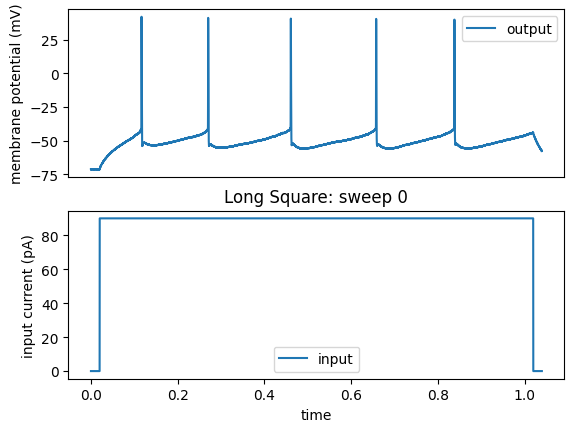

In [19]:
plot_vertical_fit(sliced_ls_res[0], sliced_ls_amps[0]*10**12)
title('Long Square: sweep 0')

Text(0.5, 1.0, 'Long Square: sweep 1')

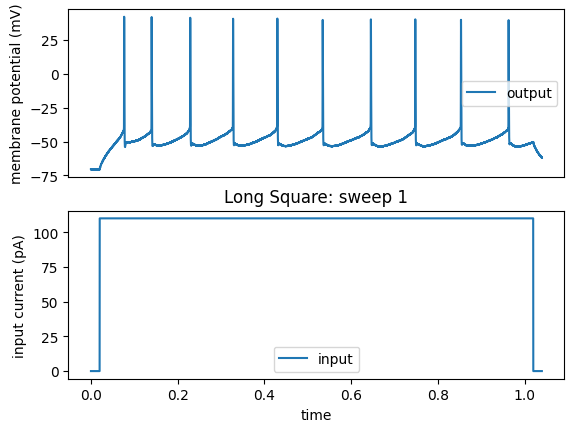

In [20]:
plot_vertical_fit(sliced_ls_res[1], sliced_ls_amps[1]*10**12)
title('Long Square: sweep 1')

Text(0.5, 1.0, 'Long Square: sweep 2')

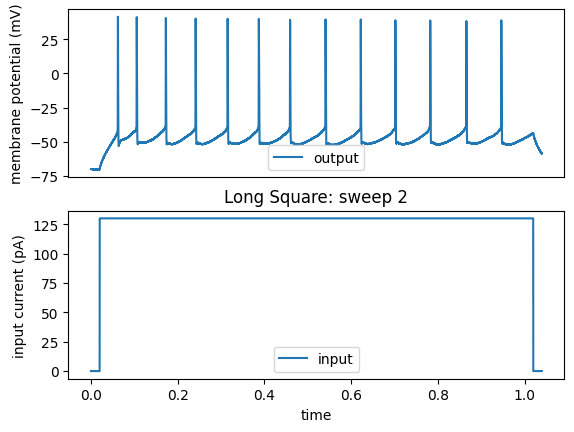

In [21]:
plot_vertical_fit(sliced_ls_res[2], sliced_ls_amps[2]*10**12)
title('Long Square: sweep 2')

Text(0.5, 1.0, 'Long Square: sweep 3')

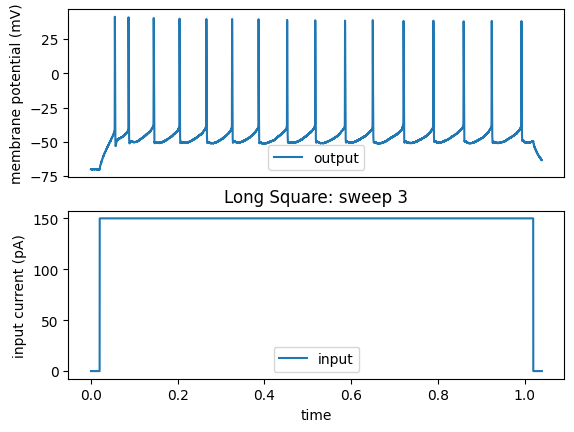

In [22]:
plot_vertical_fit(sliced_ls_res[3], sliced_ls_amps[3]*10**12)
title('Long Square: sweep 3')

Text(0.5, 1.0, 'Long Square: sweep 4')

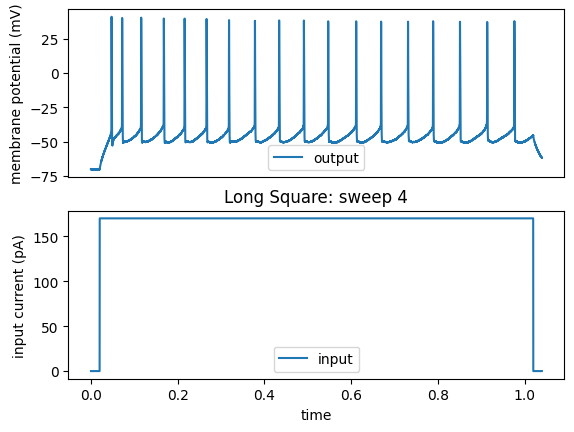

In [23]:
plot_vertical_fit(sliced_ls_res[4], sliced_ls_amps[4]*10**12)
title('Long Square: sweep 4')

Text(0.5, 1.0, 'Long Square: sweep 5')

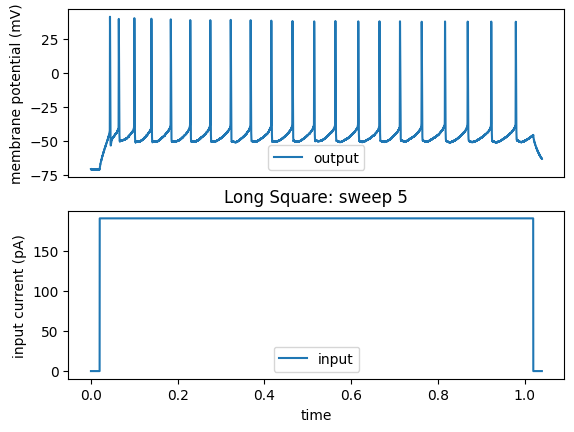

In [24]:
plot_vertical_fit(sliced_ls_res[5], sliced_ls_amps[5]*10**12)
title('Long Square: sweep 5')

Text(0.5, 1.0, 'Long Square: sweep 6')

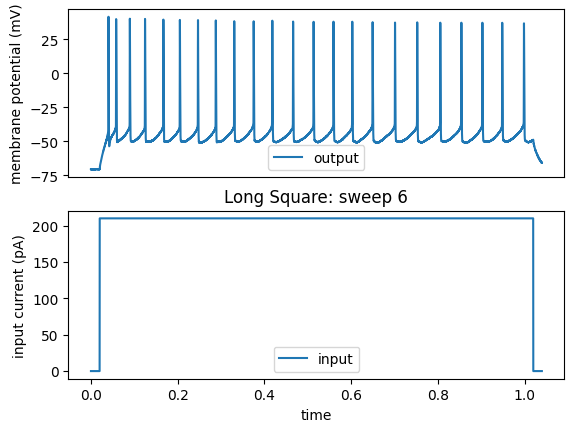

In [25]:
plot_vertical_fit(sliced_ls_res[6], sliced_ls_amps[6]*10**12)
title('Long Square: sweep 6')

Text(0.5, 1.0, 'Long Square: sweep 7')

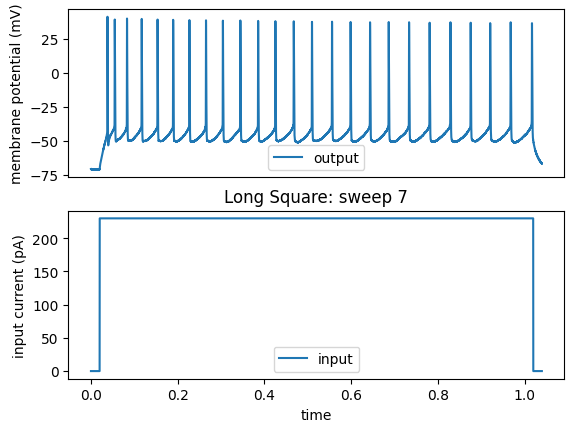

In [26]:
plot_vertical_fit(sliced_ls_res[7], sliced_ls_amps[7]*10**12)
title('Long Square: sweep 7')

***

UPWARDS

***
***

# Run models

***

In [ ]:
# c = 120
# el = -70
# ek = -78
# ena = 40
# vt = -50
# gl = (0-10)
# gna = (1-20)
# gkd = (0.01-4)

hh_ls_0 = run_hh(sliced_ls_amps, sliced_ls_res)

# tt: 6m 3.6s

# previously: Round 9: Best parameters g_kd=0.5715484 uS, g_na=4.84973964 uS, gl=11.15904086 nS (error: 93.3955813 mV^2)

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters g_kd=0.91677042 uS, g_na=3.68519307 uS, gl=8.03135317 nS (error: 149.36990247 mV^2)
Round 1: Best parameters g_kd=1.87583958 uS, g_na=2.03537398 uS, gl=8.0723873 nS (error: 134.57190755 mV^2)
Round 2: Best parameters g_kd=1.83370727 uS, g_na=1.79721227 uS, gl=7.90426855 nS (error: 128.085909 mV^2)
Round 3: Best parameters g_kd=3.62330314 uS, g_na=1.68870934 uS, gl=8.46438752 nS (error: 122.78792186 mV^2)
Round 4: Best parameters g_kd=3.68370405 uS, g_na=1.47964655 uS, gl=7.54666898 nS (error: 113.39694387 mV^2)
Round 5: Best parameters g_kd=3.79834196 uS, g_na=1.32680857 uS, gl=7.01045548 nS (error: 108.79916171 mV^2)
Round 6: Best parameters g_kd=3.75185083 uS, g_na=1.2352505 uS, gl=6.10963145 nS (error: 107.49119969 mV^2)
Round 7: Best parameters g_kd=3.85661347 uS, g_na=1.22251695 uS, gl=6.11184292 nS (error: 106.62718252 mV^2)
Round 8: Best parameters g_kd=3.82534149 uS, g_na=1.17888306 uS, gl=6.54429361 nS (error: 105.99007889 mV^2)
Round 9: Bes

In [ ]:
hh_ls_0_1 = run_hh(sliced_ls_amps, sliced_ls_res)

# tt: 5m 40.9s

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters g_kd=1.86861762 uS, g_na=3.58209207 uS, gl=8.29649643 nS (error: 142.8903694 mV^2)
Round 1: Best parameters g_kd=3.35909916 uS, g_na=3.12778111 uS, gl=8.97550051 nS (error: 137.81661832 mV^2)
Round 2: Best parameters g_kd=3.64019245 uS, g_na=2.25138701 uS, gl=7.48262488 nS (error: 134.22038268 mV^2)
Round 3: Best parameters g_kd=3.29770808 uS, g_na=1.92149691 uS, gl=8.2996566 nS (error: 128.45526297 mV^2)
Round 4: Best parameters g_kd=3.67131837 uS, g_na=1.58442237 uS, gl=7.51206478 nS (error: 114.89863735 mV^2)
Round 5: Best parameters g_kd=3.75793867 uS, g_na=1.43789733 uS, gl=7.75657799 nS (error: 114.22534927 mV^2)
Round 6: Best parameters g_kd=3.87783816 uS, g_na=1.360278 uS, gl=6.3477216 nS (error: 108.23984152 mV^2)
Round 7: Best parameters g_kd=3.80125986 uS, g_na=1.2712122 uS, gl=6.41346687 nS (error: 107.21153731 mV^2)
Round 8: Best parameters g_kd=3.87615941 uS, g_na=1.25642915 uS, gl=6.61544112 nS (error: 106.72637776 mV^2)
Round 9: Best 

Text(0.5, 1.0, 'Long Square sweep 0: initial run')

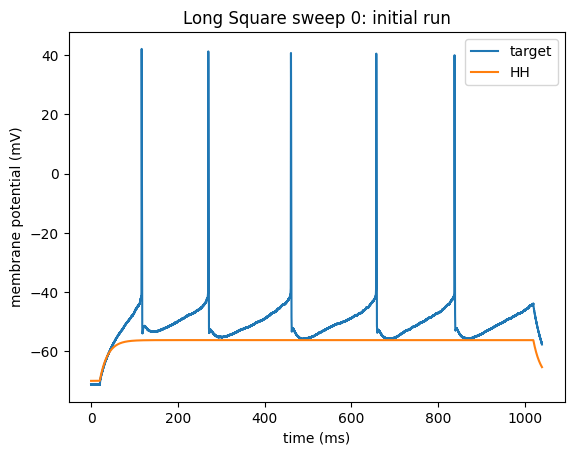

In [33]:
create_comparison_together(sliced_ls_res[0], hh_ls_0_1[0]*1000, d2_title='HH')
title('Long Square sweep 0: initial run')

In [ ]:
# c = 120
# el = -70
# reset = -50mV
# thresh > -40mV
# r = 100 - 300
# tau = 0.01 - 0.03

lif_ls_0 = run_lif(sliced_ls_amps, sliced_ls_res)

# 1m 6.6s

# previously: Round 9: Best parameters R=212.71374831 Mohm, tau=28.68776509 ms (error: 122.76643776 mV^2)

first fit:
Round 0: Best parameters R=183.16742847 Mohm, tau=12.8352798 ms (error: 96.12938469 mV^2)
Round 1: Best parameters R=183.16742847 Mohm, tau=12.8352798 ms (error: 96.12938469 mV^2)
Round 2: Best parameters R=183.16742847 Mohm, tau=12.8352798 ms (error: 96.12938469 mV^2)
Round 3: Best parameters R=178.47661014 Mohm, tau=13.90074417 ms (error: 96.04153019 mV^2)
Round 4: Best parameters R=178.47661014 Mohm, tau=13.90074417 ms (error: 96.04153019 mV^2)
Round 5: Best parameters R=182.79804423 Mohm, tau=19.36064147 ms (error: 96.02872629 mV^2)
Round 6: Best parameters R=182.79804423 Mohm, tau=19.36064147 ms (error: 96.02872629 mV^2)
Round 7: Best parameters R=182.79804423 Mohm, tau=19.36064147 ms (error: 96.02872629 mV^2)
Round 8: Best parameters R=177.29533091 Mohm, tau=13.63772175 ms (error: 95.94324117 mV^2)
Round 9: Best parameters R=178.44291614 Mohm, tau=17.27689569 ms (error: 95.90914524 mV^2)


In [ ]:
lif_ls_0_1 = run_lif(sliced_ls_amps, sliced_ls_res)

# tt: 1m 6s

first fit:
Round 0: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 1: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 2: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 3: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 4: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 5: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 6: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 7: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 8: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)
Round 9: Best parameters R=178.52563484 Mohm, tau=17.30432514 ms (error: 95.75639507 mV^2)


Text(0.5, 1.0, 'Long Square sweep 0: initial run')

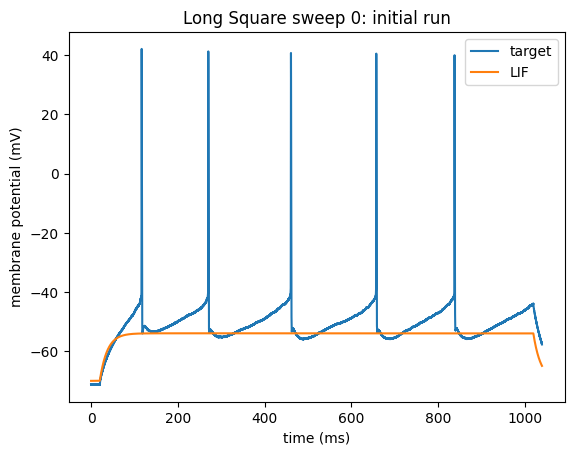

In [34]:
create_comparison_together(sliced_ls_res[0], lif_ls_0_1[0]*1000, d2_title='LIF')
title('Long Square sweep 0: initial run')

In [ ]:
# c = 120
# gl = 5
# vt = -50
# delt = 2
# vc = 5
# vr = -70
# tauw = 120 - 160
# a = 1 - 4
# b = 0 - 0.5 

adex_ls_0 = run_adex(sliced_ls_amps, sliced_ls_res)

# tt: 1m 24s

# previously: Round 9: Best parameters a=3.09298336 nS, b=28.75798888 pA, tauw=157.1830313 ms (error: 174.13839794 mV^2)

first fit:
Round 0: Best parameters a=3.45671934 nS, b=60.40026506 pA, tauw=146.80936793 ms (error: 190.24598851 mV^2)
Round 1: Best parameters a=3.55785764 nS, b=35.0040459 pA, tauw=146.96752578 ms (error: 179.34111189 mV^2)
Round 2: Best parameters a=3.34031139 nS, b=26.54221597 pA, tauw=151.355448 ms (error: 176.38421894 mV^2)
Round 3: Best parameters a=3.34031139 nS, b=26.54221597 pA, tauw=151.355448 ms (error: 176.38421894 mV^2)
Round 4: Best parameters a=3.34031139 nS, b=26.54221597 pA, tauw=151.355448 ms (error: 176.38421894 mV^2)
Round 5: Best parameters a=3.22872639 nS, b=27.74708803 pA, tauw=147.18398118 ms (error: 176.10448826 mV^2)
Round 6: Best parameters a=3.02832414 nS, b=30.10648267 pA, tauw=156.18276623 ms (error: 175.92393422 mV^2)
Round 7: Best parameters a=3.02832414 nS, b=30.10648267 pA, tauw=156.18276623 ms (error: 175.92393422 mV^2)
Round 8: Best parameters a=3.02832414 nS, b=30.10648267 pA, tauw=156.18276623 ms (error: 175.92393422 mV^2)
Round 9: Best parameters

In [ ]:
adex_ls_0_1 = run_adex(sliced_ls_amps, sliced_ls_res)

# tt: 56.1s

first fit:
Round 0: Best parameters a=3.34672383 nS, b=59.13642576 pA, tauw=139.24660582 ms (error: 187.61283411 mV^2)
Round 1: Best parameters a=3.67306611 nS, b=41.68493686 pA, tauw=149.6688453 ms (error: 180.14411085 mV^2)
Round 2: Best parameters a=3.23953361 nS, b=36.69605627 pA, tauw=148.71847798 ms (error: 177.19092667 mV^2)
Round 3: Best parameters a=3.20043497 nS, b=23.66087742 pA, tauw=151.65623072 ms (error: 174.91573161 mV^2)
Round 4: Best parameters a=3.20043497 nS, b=23.66087742 pA, tauw=151.65623072 ms (error: 174.91573161 mV^2)
Round 5: Best parameters a=3.20043497 nS, b=23.66087742 pA, tauw=151.65623072 ms (error: 174.91573161 mV^2)
Round 6: Best parameters a=3.11962839 nS, b=16.45619709 pA, tauw=150.80723584 ms (error: 173.58444782 mV^2)
Round 7: Best parameters a=3.11962839 nS, b=16.45619709 pA, tauw=150.80723584 ms (error: 173.58444782 mV^2)
Round 8: Best parameters a=3.11962839 nS, b=16.45619709 pA, tauw=150.80723584 ms (error: 173.58444782 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Long Square sweep 0: initial run')

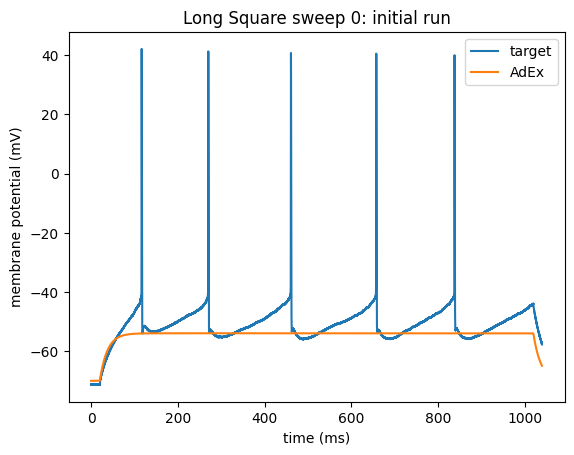

In [35]:
create_comparison_together(sliced_ls_res[0], adex_ls_0_1[0]*1000, d2_title='AdEx')
title('Long Square sweep 0: initial run')

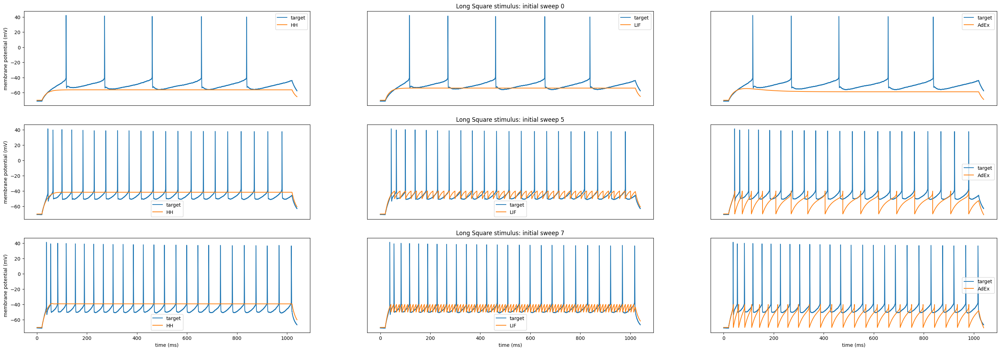

In [43]:
figure(figsize=(36,12))

subplot(3,3,1)
create_comparison_together(sliced_ls_res[0], hh_ls_0_1[0]*1000, d2_title='HH')
# xlim(0, 0.1)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ylabel('membrane potential (mV)')

subplot(3,3,2)
create_comparison_together(sliced_ls_res[0], lif_ls_0_1[0]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
title('Long Square stimulus: initial sweep 0')

subplot(3,3,3)
create_comparison_together(sliced_ls_res[0], adex_ls_0_1[0]*1000, d2_title='AdEx')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)


subplot(3,3,4)
create_comparison_together(sliced_ls_res[5], hh_ls_0_1[5]*1000, d2_title='HH')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
# ax = plt.gca()
# ax.yaxis.set_visible(False)
ylabel('membrane potential (mV)')

subplot(3,3,5)
create_comparison_together(sliced_ls_res[5], lif_ls_0_1[5]*1000, d2_title='LIF')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Long Square stimulus: initial sweep 5')

subplot(3,3,6)
create_comparison_together(sliced_ls_res[5], adex_ls_0_1[5]*1000, d2_title='AdEx')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)



subplot(3,3,7)
create_comparison_together(sliced_ls_res[7], hh_ls_0_1[7]*1000, d2_title='HH')
# xlim(0, 0.1)
ylabel('membrane potential (mV)')

subplot(3,3,8)
create_comparison_together(sliced_ls_res[7], lif_ls_0_1[7]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Long Square stimulus: initial sweep 7')

subplot(3,3,9)
create_comparison_together(sliced_ls_res[7], adex_ls_0_1[7]*1000, d2_title='AdEx')
ax = plt.gca()
ax.yaxis.set_visible(False)

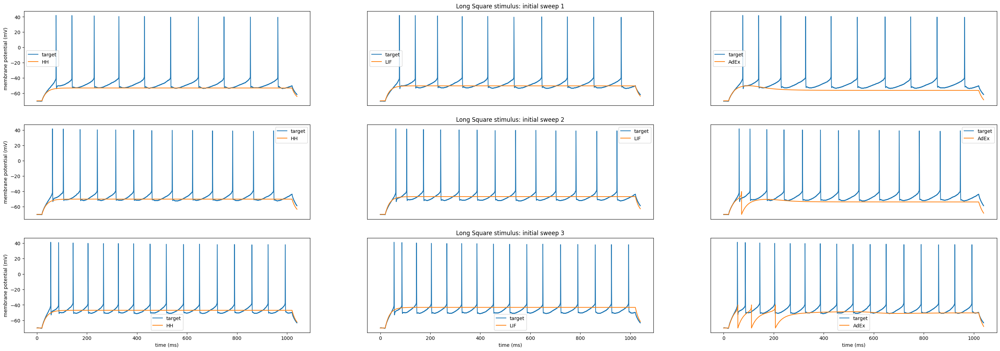

In [44]:
figure(figsize=(36,12))

subplot(3,3,1)
create_comparison_together(sliced_ls_res[1], hh_ls_0_1[1]*1000, d2_title='HH')
# xlim(0, 0.1)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ylabel('membrane potential (mV)')

subplot(3,3,2)
create_comparison_together(sliced_ls_res[1], lif_ls_0_1[1]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
title('Long Square stimulus: initial sweep 1')

subplot(3,3,3)
create_comparison_together(sliced_ls_res[1], adex_ls_0_1[1]*1000, d2_title='AdEx')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)


subplot(3,3,4)
create_comparison_together(sliced_ls_res[2], hh_ls_0_1[2]*1000, d2_title='HH')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
# ax = plt.gca()
# ax.yaxis.set_visible(False)
ylabel('membrane potential (mV)')

subplot(3,3,5)
create_comparison_together(sliced_ls_res[2], lif_ls_0_1[2]*1000, d2_title='LIF')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Long Square stimulus: initial sweep 2')

subplot(3,3,6)
create_comparison_together(sliced_ls_res[2], adex_ls_0_1[2]*1000, d2_title='AdEx')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)



subplot(3,3,7)
create_comparison_together(sliced_ls_res[3], hh_ls_0_1[3]*1000, d2_title='HH')
# xlim(0, 0.1)
ylabel('membrane potential (mV)')

subplot(3,3,8)
create_comparison_together(sliced_ls_res[3], lif_ls_0_1[3]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Long Square stimulus: initial sweep 3')

subplot(3,3,9)
create_comparison_together(sliced_ls_res[3], adex_ls_0_1[3]*1000, d2_title='AdEx')
ax = plt.gca()
ax.yaxis.set_visible(False)

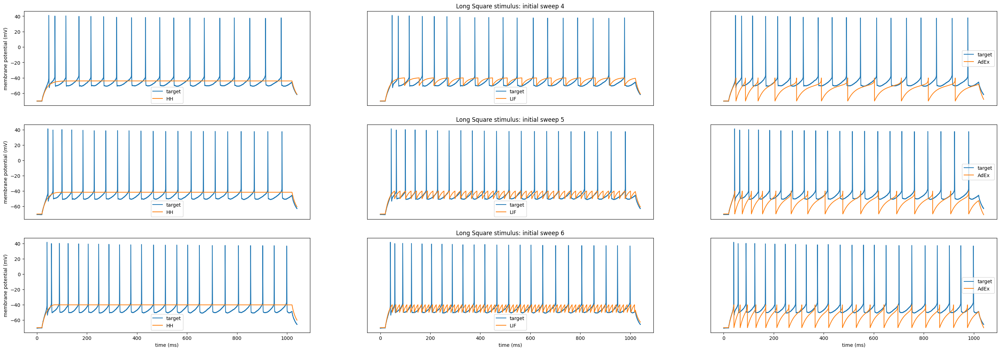

In [45]:
figure(figsize=(36,12))

subplot(3,3,1)
create_comparison_together(sliced_ls_res[4], hh_ls_0_1[4]*1000, d2_title='HH')
# xlim(0, 0.1)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ylabel('membrane potential (mV)')

subplot(3,3,2)
create_comparison_together(sliced_ls_res[4], lif_ls_0_1[4]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
title('Long Square stimulus: initial sweep 4')

subplot(3,3,3)
create_comparison_together(sliced_ls_res[4], adex_ls_0_1[4]*1000, d2_title='AdEx')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)


subplot(3,3,4)
create_comparison_together(sliced_ls_res[5], hh_ls_0_1[5]*1000, d2_title='HH')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
# ax = plt.gca()
# ax.yaxis.set_visible(False)
ylabel('membrane potential (mV)')

subplot(3,3,5)
create_comparison_together(sliced_ls_res[5], lif_ls_0_1[5]*1000, d2_title='LIF')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Long Square stimulus: initial sweep 5')

subplot(3,3,6)
create_comparison_together(sliced_ls_res[5], adex_ls_0_1[5]*1000, d2_title='AdEx')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ax = plt.gca()
ax.yaxis.set_visible(False)



subplot(3,3,7)
create_comparison_together(sliced_ls_res[6], hh_ls_0_1[6]*1000, d2_title='HH')
# xlim(0, 0.1)
ylabel('membrane potential (mV)')

subplot(3,3,8)
create_comparison_together(sliced_ls_res[6], lif_ls_0_1[6]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Long Square stimulus: initial sweep 6')

subplot(3,3,9)
create_comparison_together(sliced_ls_res[6], adex_ls_0_1[6]*1000, d2_title='AdEx')
ax = plt.gca()
ax.yaxis.set_visible(False)

These params aren't suited...

Text(0.5, 1.0, 'Long Square: sweep 0')

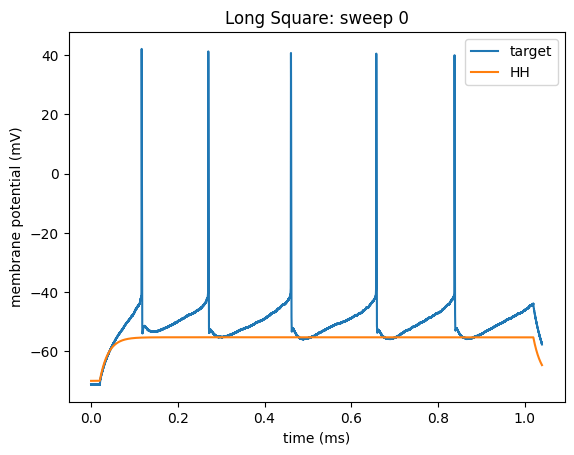

In [31]:
create_comparison_together(sliced_ls_res[0], hh_ls_0[0]*1000, d2_title='HH')
title('Long Square: sweep 0')

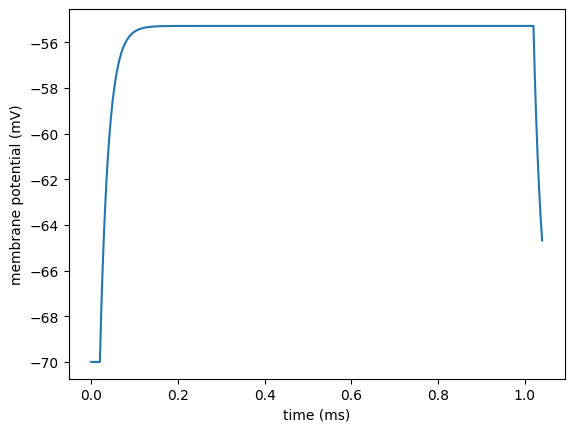

In [32]:
one_plot(hh_ls_0[0]*1000)

Text(0.5, 1.0, 'Long Square: sweep 0')

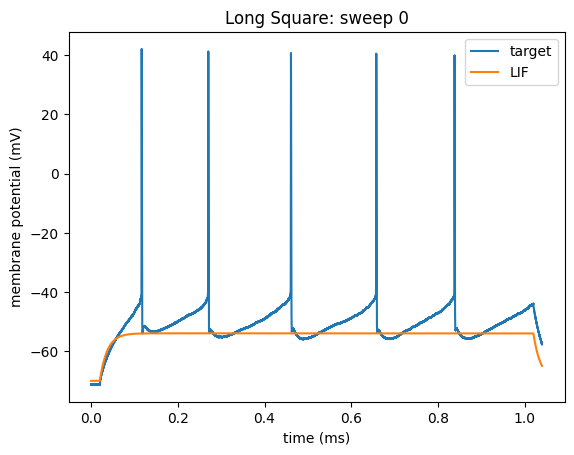

In [33]:
create_comparison_together(sliced_ls_res[0], lif_ls_0[0]*1000, d2_title='LIF')
title('Long Square: sweep 0')

Text(0.5, 1.0, 'Long Square: sweep 0')

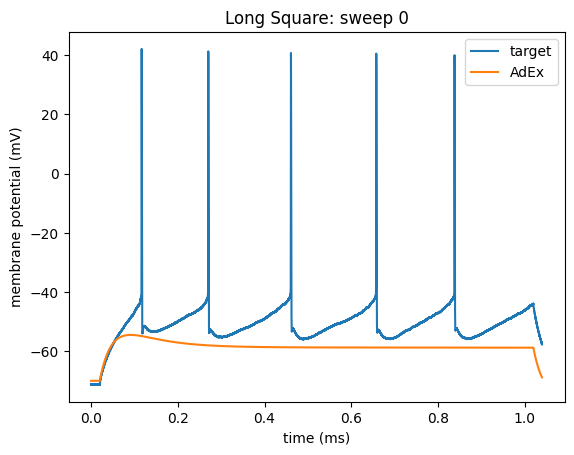

In [34]:
create_comparison_together(sliced_ls_res[0], adex_ls_0[0]*1000, d2_title='AdEx')
title('Long Square: sweep 0')

***

# NEW

***

### Experiment with LIF

Sweep 0

(-60.0, -40.0)

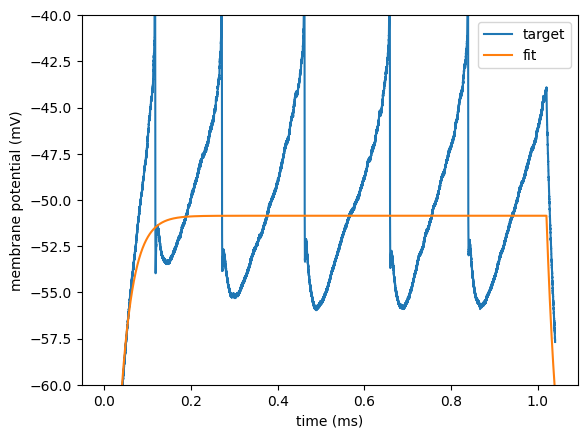

In [59]:
create_comparison_together(sliced_ls_res[0], lif_ls_0[0]*1000)
ylim(-60, -40)

In [ ]:
# set to spike at -55...

In [4]:
lif_ls_1 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=120)

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters R=214.75553958 Mohm, tau=24.89150648 ms (error: 123.21583873 mV^2)
Round 1: Best parameters R=218.21424892 Mohm, tau=22.15927717 ms (error: 123.18238669 mV^2)
Round 2: Best parameters R=181.32690824 Mohm, tau=26.33096379 ms (error: 123.05198378 mV^2)
Round 3: Best parameters R=180.69081501 Mohm, tau=15.3667392 ms (error: 122.98336059 mV^2)
Round 4: Best parameters R=180.69081501 Mohm, tau=15.3667392 ms (error: 122.98336059 mV^2)
Round 5: Best parameters R=210.66706996 Mohm, tau=25.64406422 ms (error: 122.9387121 mV^2)
Round 6: Best parameters R=210.66706996 Mohm, tau=25.64406422 ms (error: 122.9387121 mV^2)
Round 7: Best parameters R=210.66706996 Mohm, tau=25.64406422 ms (error: 122.9387121 mV^2)
Round 8: Best parameters R=182.94966191 Mohm, tau=27.04113989 ms (error: 122.87831214 mV^2)
Round 9: Best parameters R=182.94966191 Mohm, tau=27.04113989 ms (error: 122.87831214 mV^2)


Text(0.5, 1.0, 'cm = 120: long square, sweep 0')

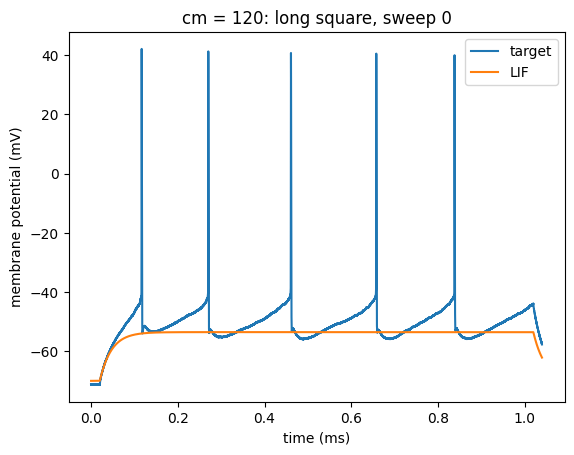

In [37]:
create_comparison_together(sliced_ls_res[0], lif_ls_1[0]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 0')

Text(0.5, 1.0, 'cm = 120: long square, sweep 1')

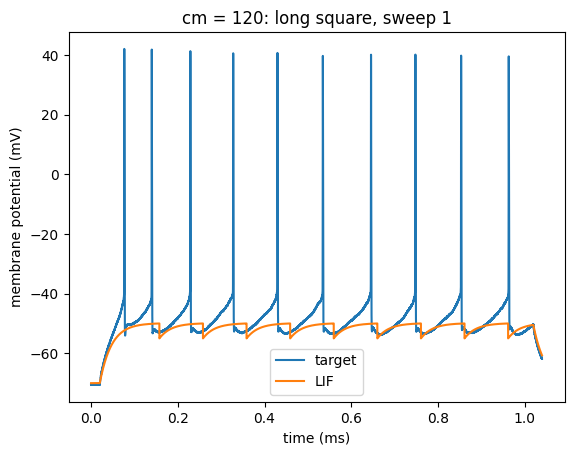

In [38]:
create_comparison_together(sliced_ls_res[1], lif_ls_1[1]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 1')

Text(0.5, 1.0, 'cm = 120: long square, sweep 2')

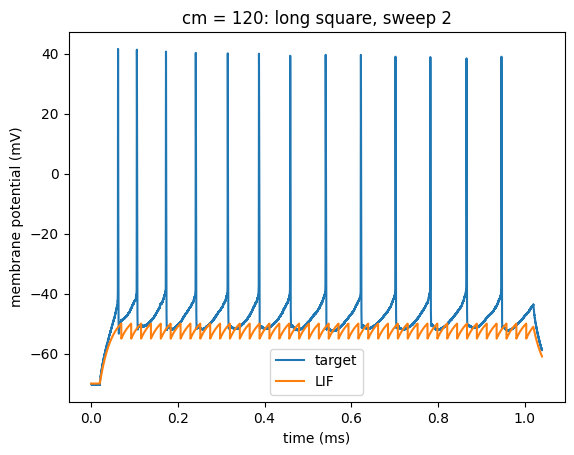

In [39]:
create_comparison_together(sliced_ls_res[2], lif_ls_1[2]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 2')

Text(0.5, 1.0, 'cm = 120: long square, sweep 3')

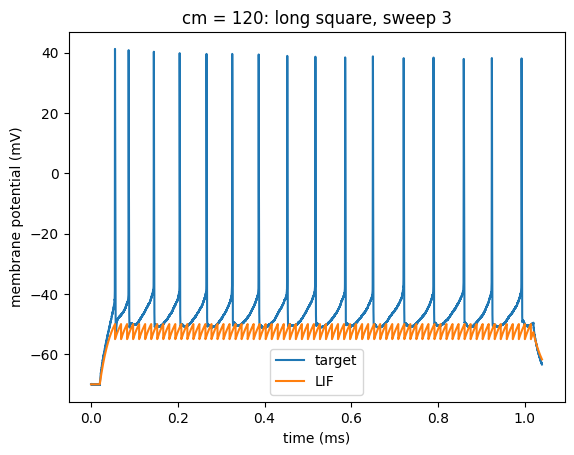

In [40]:
create_comparison_together(sliced_ls_res[3], lif_ls_1[3]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 3')

Text(0.5, 1.0, 'cm = 120: long square, sweep 4')

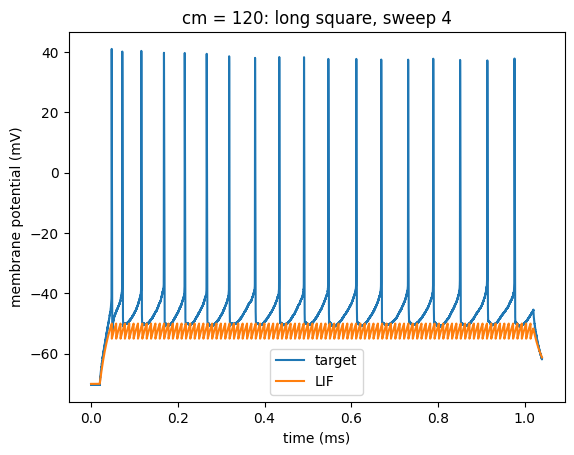

In [41]:
create_comparison_together(sliced_ls_res[4], lif_ls_1[4]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 4')

Text(0.5, 1.0, 'cm = 120: long square, sweep 5')

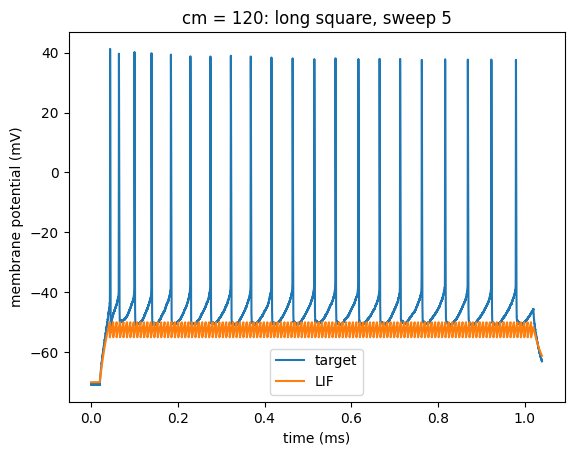

In [42]:
create_comparison_together(sliced_ls_res[5], lif_ls_1[5]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 5')

Text(0.5, 1.0, 'cm = 120: long square, sweep 6')

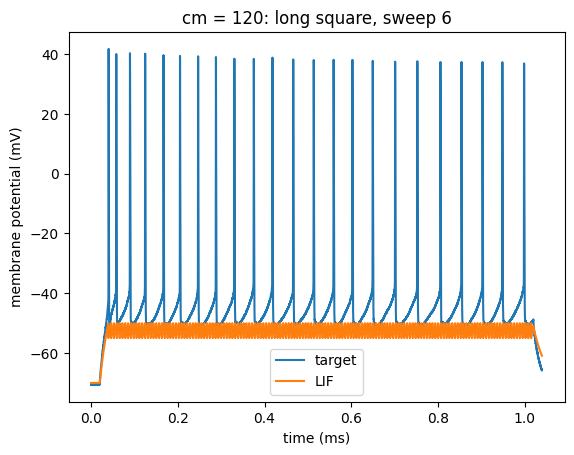

In [52]:
create_comparison_together(sliced_ls_res[6], lif_ls_1[6]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 6')

Text(0.5, 1.0, 'cm = 120: long square, sweep 7')

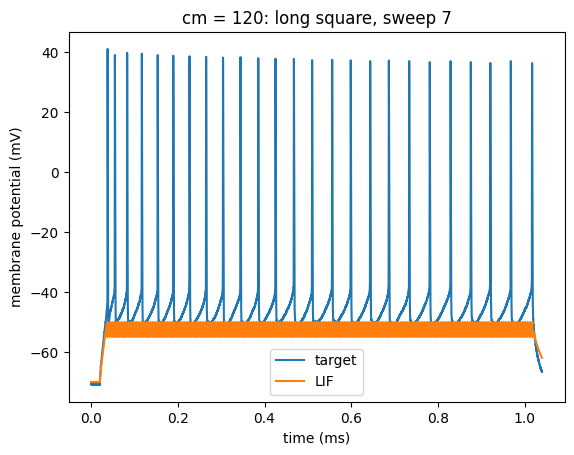

In [53]:
create_comparison_together(sliced_ls_res[7], lif_ls_1[7]*1000, d2_title='LIF')
title('cm = 120: long square, sweep 7')

NOTES: 1st input not strong enough for models?  Or need to change params?

Sweep 1 most accurate for LIF, cm =120.  Then too much.

In [25]:
lif_ls_2 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=180)

first fit:
Round 0: Best parameters R=181.12093808 Mohm, tau=17.14422149 ms (error: 123.19570622 mV^2)
Round 1: Best parameters R=181.12093808 Mohm, tau=17.14422149 ms (error: 123.19570622 mV^2)
Round 2: Best parameters R=208.03749631 Mohm, tau=26.89648902 ms (error: 122.98961087 mV^2)
Round 3: Best parameters R=208.03749631 Mohm, tau=26.89648902 ms (error: 122.98961087 mV^2)
Round 4: Best parameters R=208.03749631 Mohm, tau=26.89648902 ms (error: 122.98961087 mV^2)
Round 5: Best parameters R=208.03749631 Mohm, tau=26.89648902 ms (error: 122.98961087 mV^2)
Round 6: Best parameters R=211.84383799 Mohm, tau=26.28603023 ms (error: 122.92933227 mV^2)
Round 7: Best parameters R=213.70783974 Mohm, tau=27.27393638 ms (error: 122.81414541 mV^2)
Round 8: Best parameters R=213.70783974 Mohm, tau=27.27393638 ms (error: 122.81414541 mV^2)
Round 9: Best parameters R=213.70783974 Mohm, tau=27.27393638 ms (error: 122.81414541 mV^2)


Text(0.5, 1.0, 'cm = 180: long square, sweep 0')

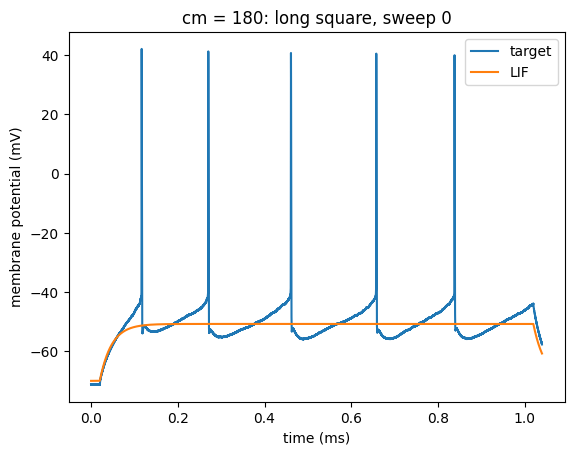

In [44]:
create_comparison_together(sliced_ls_res[0], lif_ls_2[0]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 0')

Text(0.5, 1.0, 'cm = 180: long square, sweep 1')

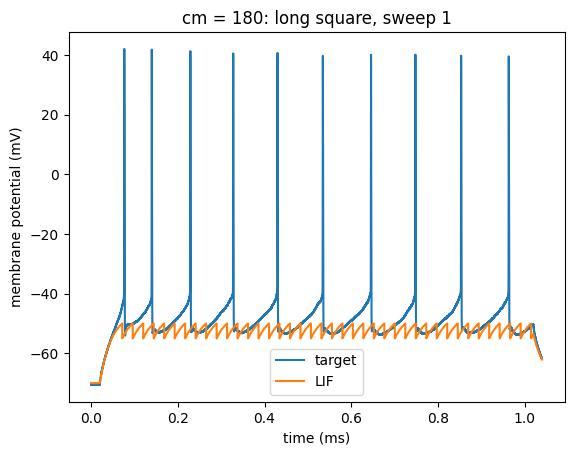

In [45]:
create_comparison_together(sliced_ls_res[1], lif_ls_2[1]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 1')

Text(0.5, 1.0, 'cm = 180: long square, sweep 2')

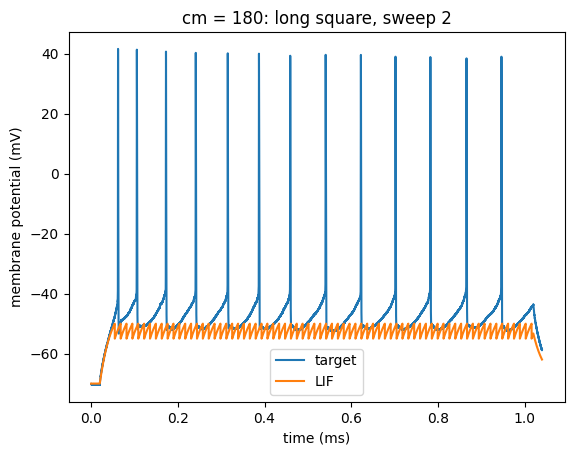

In [46]:
create_comparison_together(sliced_ls_res[2], lif_ls_2[2]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 2')

Text(0.5, 1.0, 'cm = 180: long square, sweep 3')

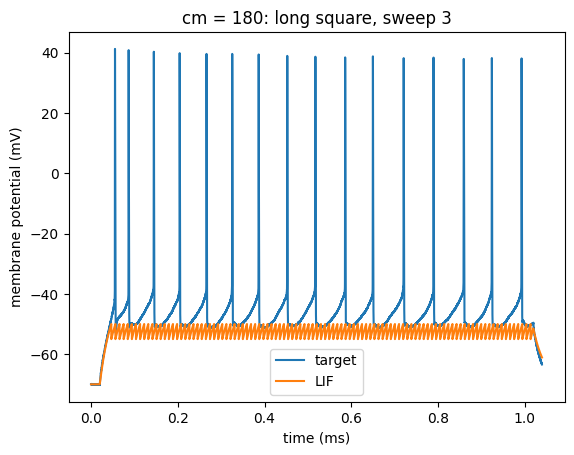

In [58]:
create_comparison_together(sliced_ls_res[3], lif_ls_2[3]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 3')

Text(0.5, 1.0, 'cm = 180: long square, sweep 4')

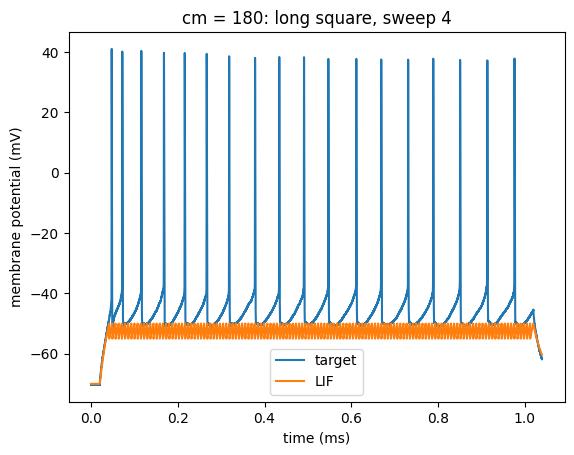

In [59]:
create_comparison_together(sliced_ls_res[4], lif_ls_2[4]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 4')

Text(0.5, 1.0, 'cm = 180: long square, sweep 5')

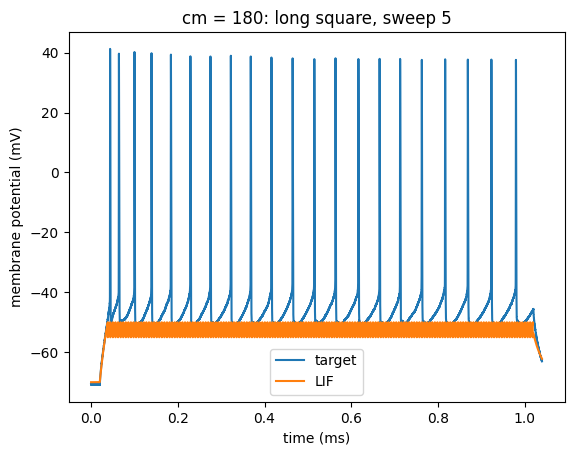

In [60]:
create_comparison_together(sliced_ls_res[5], lif_ls_2[5]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 5')

Text(0.5, 1.0, 'cm = 180: long square, sweep 6')

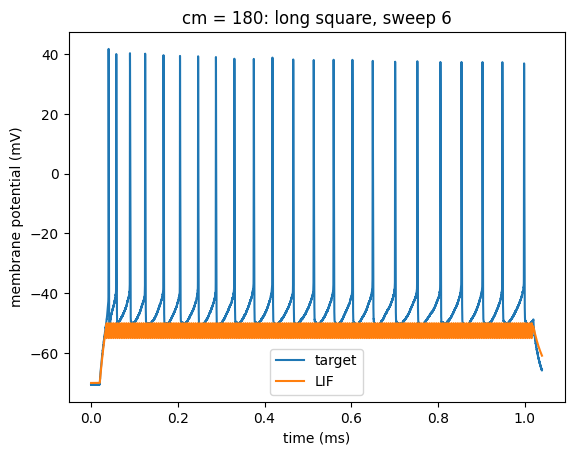

In [61]:
create_comparison_together(sliced_ls_res[6], lif_ls_2[6]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 6')

Text(0.5, 1.0, 'cm = 180: long square, sweep 7')

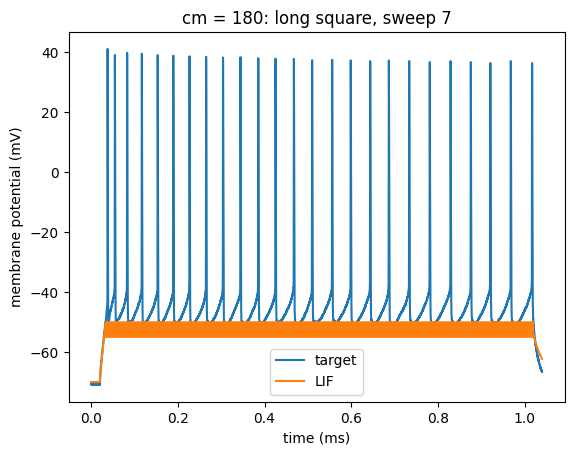

In [62]:
create_comparison_together(sliced_ls_res[7], lif_ls_2[7]*1000, d2_title='LIF')
title('cm = 180: long square, sweep 7')

(-60.0, -40.0)

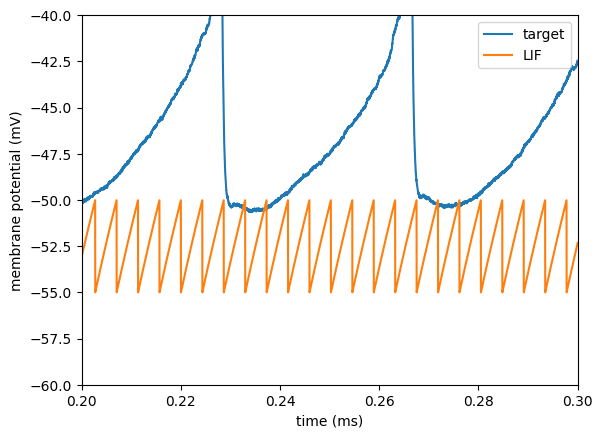

In [63]:
create_comparison_together(sliced_ls_res[7], lif_ls_2[7]*1000, d2_title='LIF')
xlim(0.2, 0.3)
ylim(-60, -40)

In [29]:
lif_ls_3 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=80)

first fit:
Round 0: Best parameters R=179.38346608 Mohm, tau=24.70470945 ms (error: 123.11864245 mV^2)
Round 1: Best parameters R=179.38346608 Mohm, tau=24.70470945 ms (error: 123.11864245 mV^2)
Round 2: Best parameters R=179.38346608 Mohm, tau=24.70470945 ms (error: 123.11864245 mV^2)
Round 3: Best parameters R=179.38346608 Mohm, tau=24.70470945 ms (error: 123.11864245 mV^2)
Round 4: Best parameters R=200.92532714 Mohm, tau=26.13527488 ms (error: 122.82855593 mV^2)
Round 5: Best parameters R=200.92532714 Mohm, tau=26.13527488 ms (error: 122.82855593 mV^2)
Round 6: Best parameters R=200.92532714 Mohm, tau=26.13527488 ms (error: 122.82855593 mV^2)
Round 7: Best parameters R=202.9423427 Mohm, tau=26.5893176 ms (error: 122.67635777 mV^2)
Round 8: Best parameters R=181.03209079 Mohm, tau=28.35526279 ms (error: 122.61878053 mV^2)
Round 9: Best parameters R=181.03209079 Mohm, tau=28.35526279 ms (error: 122.61878053 mV^2)


Text(0.5, 1.0, 'cm = 80: long square, sweep 0')

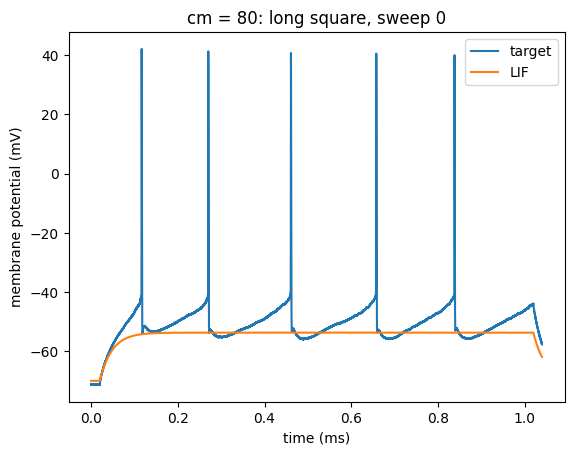

In [47]:
create_comparison_together(sliced_ls_res[0], lif_ls_3[0]*1000, d2_title='LIF')
title('cm = 80: long square, sweep 0')

Text(0.5, 1.0, 'cm = 80: long square, sweep 1')

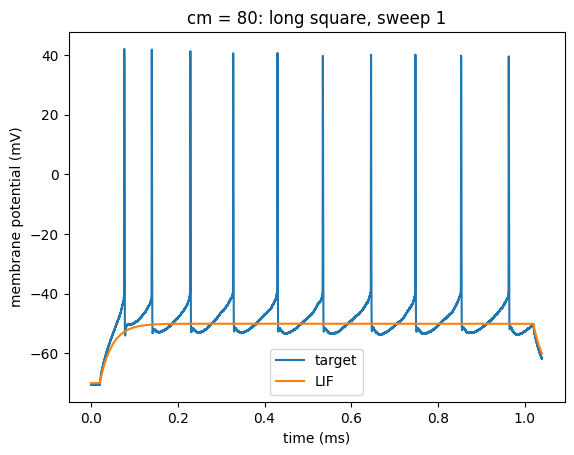

In [48]:
create_comparison_together(sliced_ls_res[1], lif_ls_3[1]*1000, d2_title='LIF')
title('cm = 80: long square, sweep 1')

Text(0.5, 1.0, 'cm = 80: long square, sweep 2')

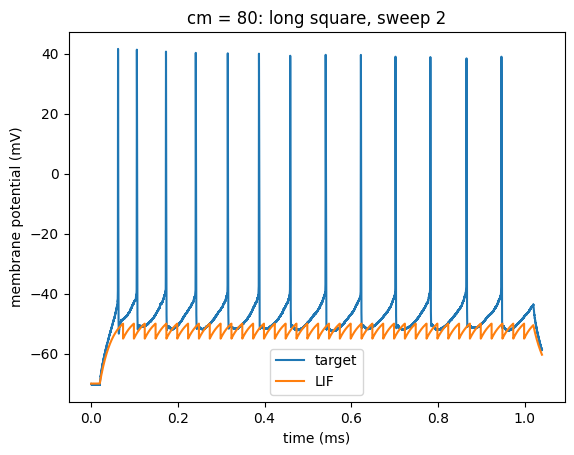

In [49]:
create_comparison_together(sliced_ls_res[2], lif_ls_3[2]*1000, d2_title='LIF')
title('cm = 80: long square, sweep 2')

Text(0.5, 1.0, 'cm = 80: long square, sweep 3')

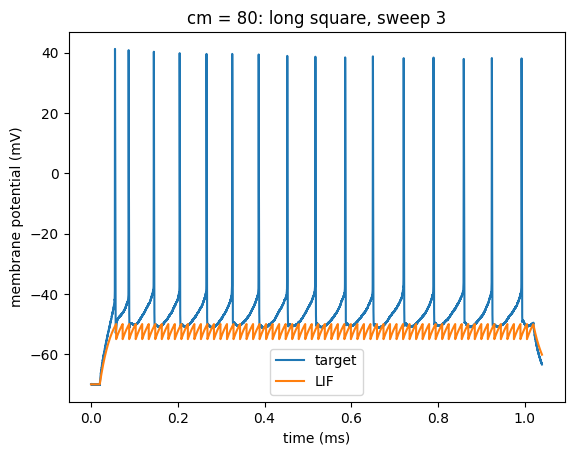

In [50]:
create_comparison_together(sliced_ls_res[3], lif_ls_3[3]*1000, d2_title='LIF')
title('cm = 80: long square, sweep 3')

Nothing for sweeps 0 and 1, then intense.

In [51]:
lif_ls_4 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=100)

first fit:
Round 0: Best parameters R=210.86381801 Mohm, tau=26.08051805 ms (error: 123.19021889 mV^2)
Round 1: Best parameters R=182.37135175 Mohm, tau=23.03542614 ms (error: 123.03273777 mV^2)
Round 2: Best parameters R=182.37135175 Mohm, tau=23.03542614 ms (error: 123.03273777 mV^2)
Round 3: Best parameters R=202.74724931 Mohm, tau=26.52497535 ms (error: 122.85869142 mV^2)
Round 4: Best parameters R=202.74724931 Mohm, tau=26.52497535 ms (error: 122.85869142 mV^2)
Round 5: Best parameters R=202.74724931 Mohm, tau=26.52497535 ms (error: 122.85869142 mV^2)
Round 6: Best parameters R=202.74724931 Mohm, tau=26.52497535 ms (error: 122.85869142 mV^2)
Round 7: Best parameters R=202.74724931 Mohm, tau=26.52497535 ms (error: 122.85869142 mV^2)
Round 8: Best parameters R=203.58104078 Mohm, tau=26.76711967 ms (error: 122.81830512 mV^2)
Round 9: Best parameters R=203.58104078 Mohm, tau=26.76711967 ms (error: 122.81830512 mV^2)


Text(0.5, 1.0, 'cm = 100: long square, sweep 0')

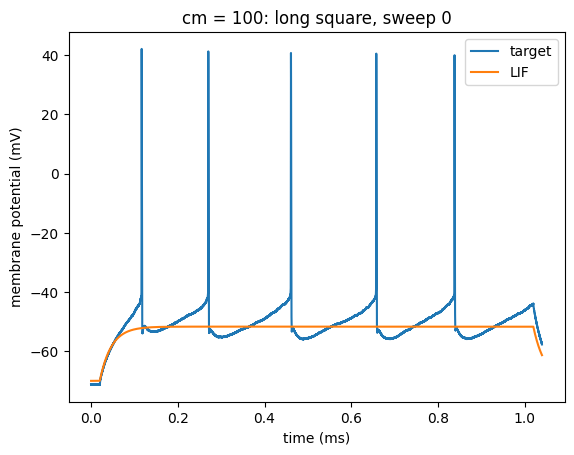

In [54]:
create_comparison_together(sliced_ls_res[0], lif_ls_4[0]*1000, d2_title='LIF')
title('cm = 100: long square, sweep 0')

Text(0.5, 1.0, 'cm = 100: long square, sweep 1')

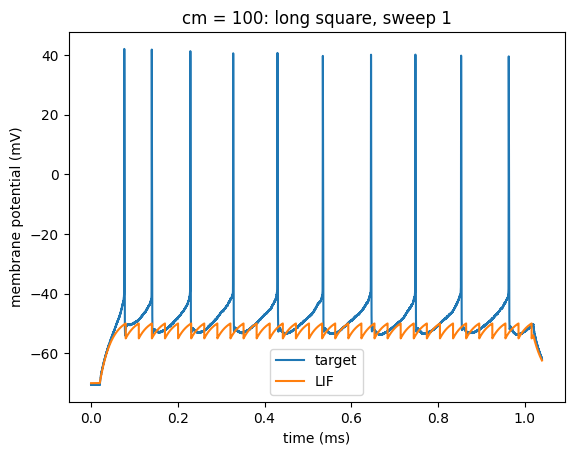

In [55]:
create_comparison_together(sliced_ls_res[1], lif_ls_4[1]*1000, d2_title='LIF')
title('cm = 100: long square, sweep 1')

Text(0.5, 1.0, 'cm = 100: long square, sweep 2')

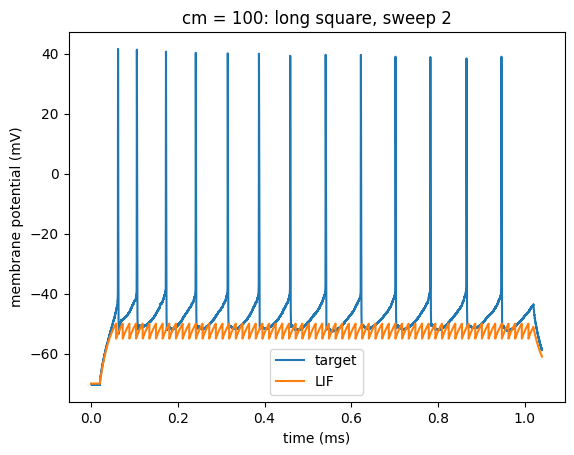

In [56]:
create_comparison_together(sliced_ls_res[2], lif_ls_4[2]*1000, d2_title='LIF')
title('cm = 100: long square, sweep 2')

Nothing for sweep 0, then insane

In [64]:
lif_ls_5 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=110)

first fit:
Round 0: Best parameters R=212.76571833 Mohm, tau=18.78720963 ms (error: 123.34275519 mV^2)
Round 1: Best parameters R=214.0622333 Mohm, tau=23.32154359 ms (error: 123.0788862 mV^2)
Round 2: Best parameters R=214.0622333 Mohm, tau=23.32154359 ms (error: 123.0788862 mV^2)
Round 3: Best parameters R=214.0622333 Mohm, tau=23.32154359 ms (error: 123.0788862 mV^2)
Round 4: Best parameters R=214.0622333 Mohm, tau=23.32154359 ms (error: 123.0788862 mV^2)
Round 5: Best parameters R=215.03692581 Mohm, tau=27.74828198 ms (error: 122.93627508 mV^2)
Round 6: Best parameters R=215.03692581 Mohm, tau=27.74828198 ms (error: 122.93627508 mV^2)
Round 7: Best parameters R=215.03692581 Mohm, tau=27.74828198 ms (error: 122.93627508 mV^2)
Round 8: Best parameters R=215.03692581 Mohm, tau=27.74828198 ms (error: 122.93627508 mV^2)
Round 9: Best parameters R=215.03692581 Mohm, tau=27.74828198 ms (error: 122.93627508 mV^2)


Text(0.5, 1.0, 'cm = 110: long square, sweep 0')

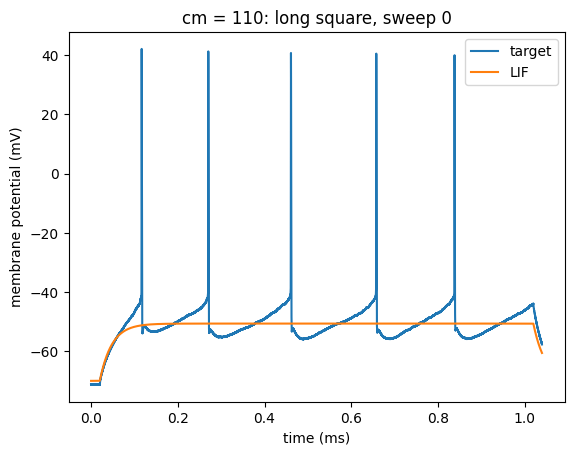

In [65]:
create_comparison_together(sliced_ls_res[0], lif_ls_5[0]*1000, d2_title='LIF')
title('cm = 110: long square, sweep 0')

Text(0.5, 1.0, 'cm = 110: long square, sweep 1')

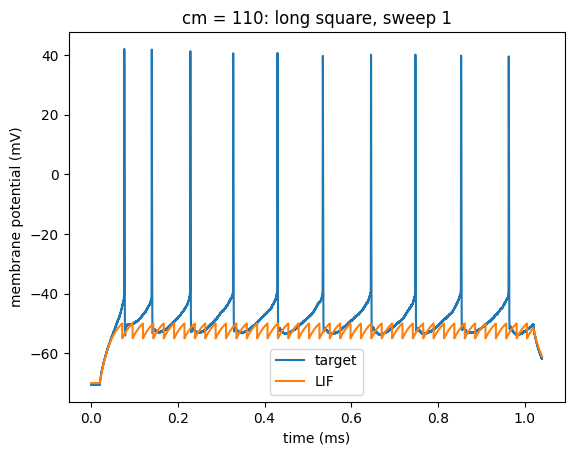

In [66]:
create_comparison_together(sliced_ls_res[1], lif_ls_5[1]*1000, d2_title='LIF')
title('cm = 110: long square, sweep 1')

Text(0.5, 1.0, 'cm = 110: long square, sweep 2')

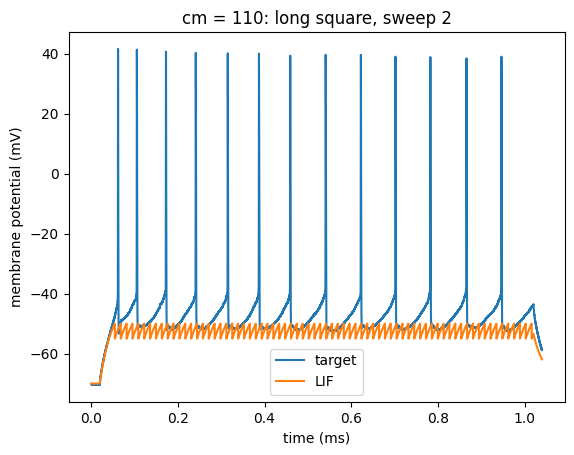

In [67]:
create_comparison_together(sliced_ls_res[2], lif_ls_5[2]*1000, d2_title='LIF')
title('cm = 110: long square, sweep 2')

Text(0.5, 1.0, 'cm = 110: long square, sweep 3')

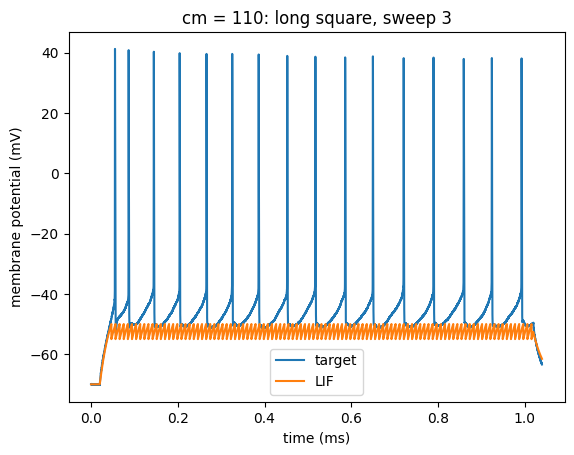

In [68]:
create_comparison_together(sliced_ls_res[3], lif_ls_5[3]*1000, d2_title='LIF')
title('cm = 110: long square, sweep 3')

Text(0.5, 1.0, 'cm = 110: long square, sweep 4')

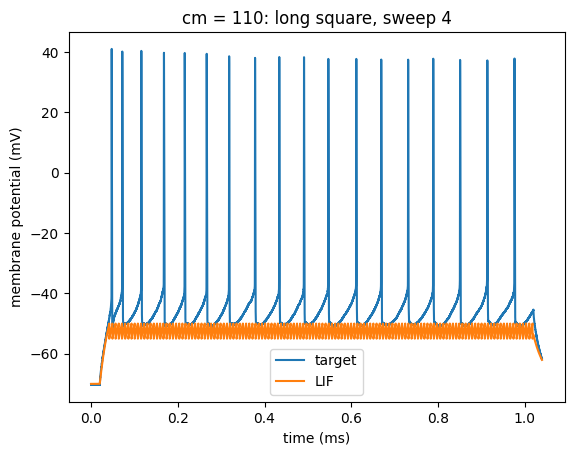

In [70]:
create_comparison_together(sliced_ls_res[4], lif_ls_5[4]*1000, d2_title='LIF')
title('cm = 110: long square, sweep 4')

In [69]:
lif_ls_6 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=150)

first fit:
Round 0: Best parameters R=187.12404491 Mohm, tau=24.05706469 ms (error: 123.39196269 mV^2)
Round 1: Best parameters R=181.05807426 Mohm, tau=25.03897593 ms (error: 122.98077535 mV^2)
Round 2: Best parameters R=181.22108581 Mohm, tau=22.73028285 ms (error: 122.93899619 mV^2)
Round 3: Best parameters R=181.22108581 Mohm, tau=22.73028285 ms (error: 122.93899619 mV^2)
Round 4: Best parameters R=181.22108581 Mohm, tau=22.73028285 ms (error: 122.93899619 mV^2)
Round 5: Best parameters R=181.22108581 Mohm, tau=22.73028285 ms (error: 122.93899619 mV^2)
Round 6: Best parameters R=181.05807426 Mohm, tau=17.95873024 ms (error: 122.81153504 mV^2)
Round 7: Best parameters R=179.77349635 Mohm, tau=21.15861983 ms (error: 122.79152869 mV^2)
Round 8: Best parameters R=179.77349635 Mohm, tau=21.15861983 ms (error: 122.79152869 mV^2)
Round 9: Best parameters R=179.77349635 Mohm, tau=21.15861983 ms (error: 122.79152869 mV^2)


Text(0.5, 1.0, 'cm = 150: long square, sweep 0')

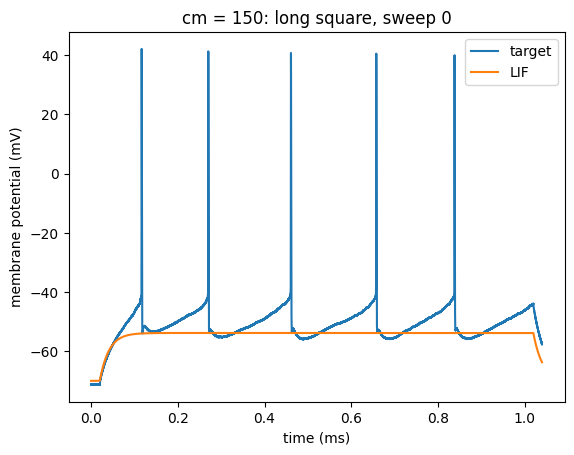

In [75]:
create_comparison_together(sliced_ls_res[0], lif_ls_6[0]*1000, d2_title='LIF')
title('cm = 150: long square, sweep 0')

Text(0.5, 1.0, 'cm = 150: long square, sweep 1')

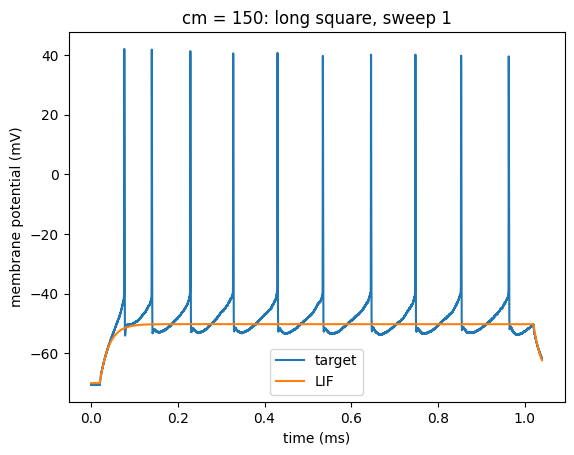

In [76]:
create_comparison_together(sliced_ls_res[1], lif_ls_6[1]*1000, d2_title='LIF')
title('cm = 150: long square, sweep 1')

Text(0.5, 1.0, 'cm = 150: long square, sweep 2')

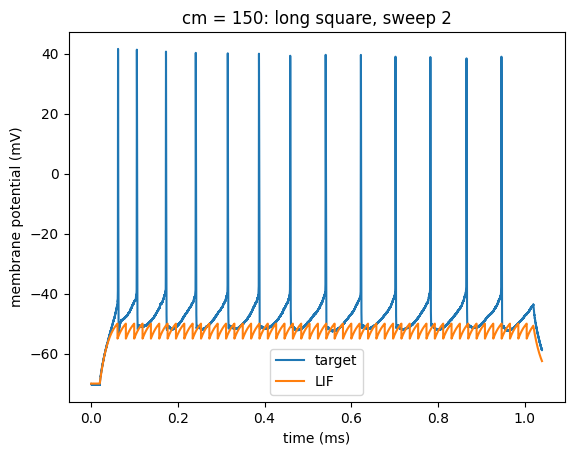

In [77]:
create_comparison_together(sliced_ls_res[2], lif_ls_6[2]*1000, d2_title='LIF')
title('cm = 150: long square, sweep 2')

Text(0.5, 1.0, 'cm = 150: long square, sweep 3')

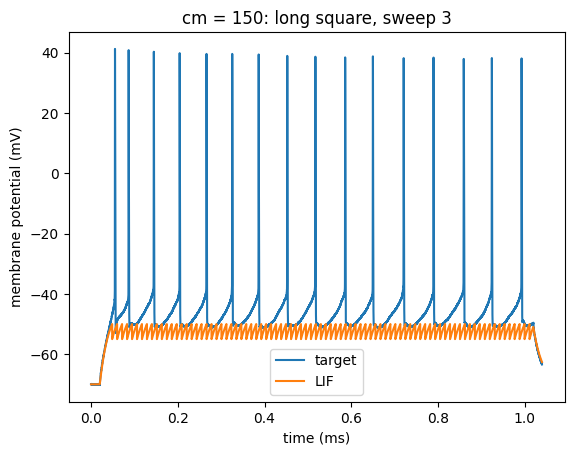

In [78]:
create_comparison_together(sliced_ls_res[3], lif_ls_6[3]*1000, d2_title='LIF')
title('cm = 150: long square, sweep 3')

***

Use cm=120 for now...

In [74]:
# adding refrac = 0.1ms

lif_ls_7 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=120)

first fit:
Round 0: Best parameters R=176.81286231 Mohm, tau=17.80266788 ms (error: 123.45476997 mV^2)
Round 1: Best parameters R=179.54557264 Mohm, tau=16.55225583 ms (error: 123.35197077 mV^2)
Round 2: Best parameters R=181.54280961 Mohm, tau=24.15795028 ms (error: 123.12382079 mV^2)
Round 3: Best parameters R=179.86181863 Mohm, tau=23.44443517 ms (error: 123.12370878 mV^2)
Round 4: Best parameters R=201.69292926 Mohm, tau=20.71052133 ms (error: 123.01878795 mV^2)
Round 5: Best parameters R=201.69292926 Mohm, tau=20.71052133 ms (error: 123.01878795 mV^2)
Round 6: Best parameters R=181.59188075 Mohm, tau=22.08772168 ms (error: 122.96532766 mV^2)
Round 7: Best parameters R=181.38214588 Mohm, tau=22.011578 ms (error: 122.93498316 mV^2)
Round 8: Best parameters R=181.38214588 Mohm, tau=22.011578 ms (error: 122.93498316 mV^2)
Round 9: Best parameters R=179.34568239 Mohm, tau=23.37749799 ms (error: 122.92782555 mV^2)


Text(0.5, 1.0, 'cm = 120, refrac = 0.1 ms: long square, sweep 0')

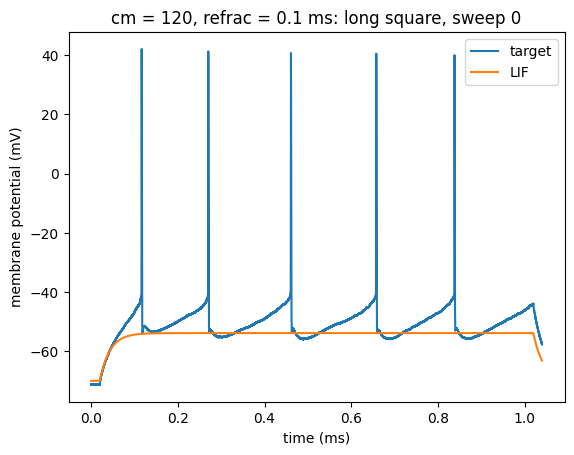

In [79]:
create_comparison_together(sliced_ls_res[0], lif_ls_7[0]*1000, d2_title='LIF')
title('cm = 120, refrac = 0.1 ms: long square, sweep 0')

Text(0.5, 1.0, 'cm = 120, refrac = 0.1 ms: long square, sweep 1')

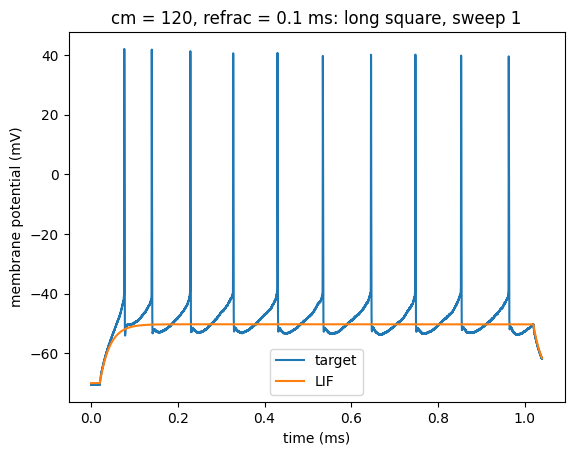

In [80]:
create_comparison_together(sliced_ls_res[1], lif_ls_7[1]*1000, d2_title='LIF')
title('cm = 120, refrac = 0.1 ms: long square, sweep 1')

Text(0.5, 1.0, 'cm = 120, refrac = 0.1 ms: long square, sweep 2')

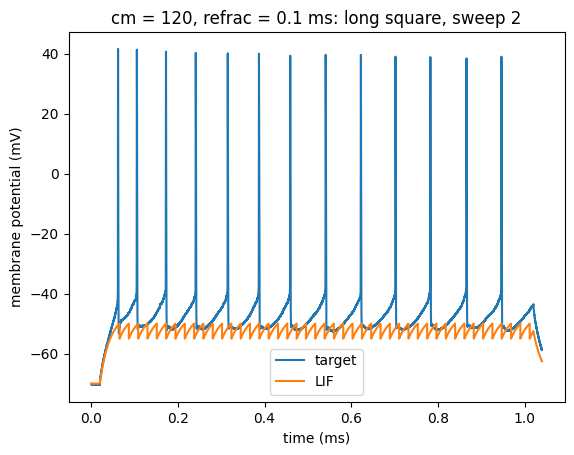

In [81]:
create_comparison_together(sliced_ls_res[2], lif_ls_7[2]*1000, d2_title='LIF')
title('cm = 120, refrac = 0.1 ms: long square, sweep 2')

In [8]:
# not sure it worked above
# adding refrac = 0.1ms

lif_ls_8 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=120)

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters R=181.53756241 Mohm, tau=19.96114875 ms (error: 123.13504187 mV^2)
Round 1: Best parameters R=214.9706396 Mohm, tau=27.21270566 ms (error: 123.10405323 mV^2)
Round 2: Best parameters R=214.9706396 Mohm, tau=27.21270566 ms (error: 123.10405323 mV^2)
Round 3: Best parameters R=214.9706396 Mohm, tau=27.21270566 ms (error: 123.10405323 mV^2)
Round 4: Best parameters R=214.9706396 Mohm, tau=27.21270566 ms (error: 123.10405323 mV^2)
Round 5: Best parameters R=179.31370049 Mohm, tau=21.88251289 ms (error: 123.03290686 mV^2)
Round 6: Best parameters R=179.31370049 Mohm, tau=21.88251289 ms (error: 123.03290686 mV^2)
Round 7: Best parameters R=179.76690327 Mohm, tau=21.40942093 ms (error: 122.96832454 mV^2)
Round 8: Best parameters R=180.30673574 Mohm, tau=22.44859544 ms (error: 122.72468039 mV^2)
Round 9: Best parameters R=180.30673574 Mohm, tau=22.44859544 ms (error: 122.72468039 mV^2)


Text(0.5, 1.0, 'cm = 120, refrac = 0.1 ms: long square, sweep 0')

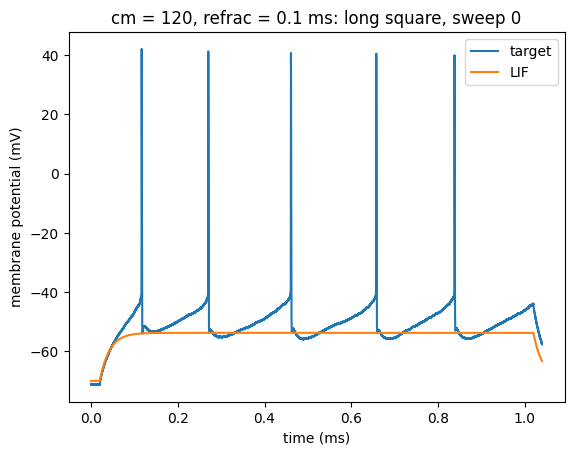

In [9]:
create_comparison_together(sliced_ls_res[0], lif_ls_8[0]*1000, d2_title='LIF')
title('cm = 120, refrac = 0.1 ms: long square, sweep 0')

Text(0.5, 1.0, 'cm = 120, refrac = 0.1 ms: long square, sweep 1')

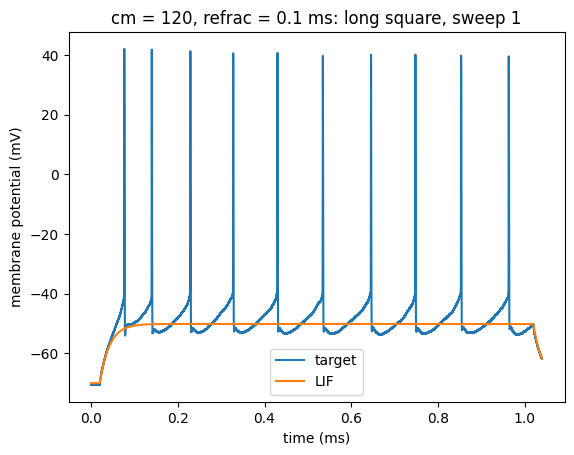

In [10]:
create_comparison_together(sliced_ls_res[1], lif_ls_8[1]*1000, d2_title='LIF')
title('cm = 120, refrac = 0.1 ms: long square, sweep 1')

Text(0.5, 1.0, 'cm = 120, refrac = 0.1 ms: long square, sweep 2')

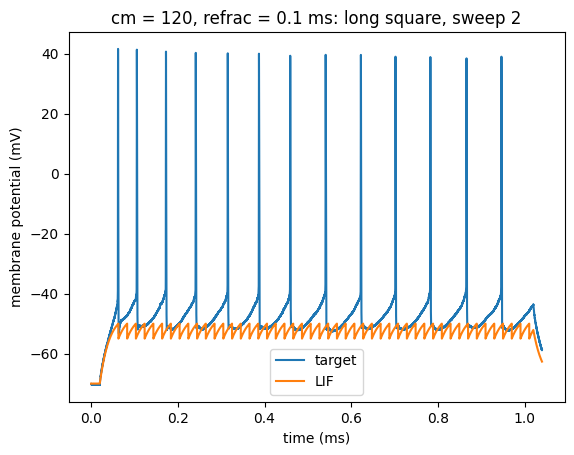

In [11]:
create_comparison_together(sliced_ls_res[2], lif_ls_8[2]*1000, d2_title='LIF')
title('cm = 120, refrac = 0.1 ms: long square, sweep 2')

### NOTE: RETURN TO REFRAC!

In [12]:
# change reset and thresh
# reset = -50
# thres = -40

lif_ls_9 = run_lif(sliced_ls_amps, sliced_ls_res, cm_var=120, reset_var='v=-50*mV', thresh_var='v>-40*mV')

first fit:
Round 0: Best parameters R=182.70446933 Mohm, tau=13.73454723 ms (error: 96.58007598 mV^2)
Round 1: Best parameters R=182.70446933 Mohm, tau=13.73454723 ms (error: 96.58007598 mV^2)
Round 2: Best parameters R=182.70446933 Mohm, tau=13.73454723 ms (error: 96.58007598 mV^2)
Round 3: Best parameters R=182.70446933 Mohm, tau=13.73454723 ms (error: 96.58007598 mV^2)
Round 4: Best parameters R=180.92251001 Mohm, tau=19.19466643 ms (error: 96.40609599 mV^2)
Round 5: Best parameters R=184.91454088 Mohm, tau=22.34197992 ms (error: 96.25083618 mV^2)
Round 6: Best parameters R=184.91454088 Mohm, tau=22.34197992 ms (error: 96.25083618 mV^2)
Round 7: Best parameters R=180.10392899 Mohm, tau=17.47318038 ms (error: 96.09549786 mV^2)
Round 8: Best parameters R=178.46216722 Mohm, tau=14.71340844 ms (error: 96.04520253 mV^2)
Round 9: Best parameters R=178.46216722 Mohm, tau=14.71340844 ms (error: 96.04520253 mV^2)


Text(0.5, 1.0, 'cm=120, reset=-50, thresh=-40: long square, sweep 0')

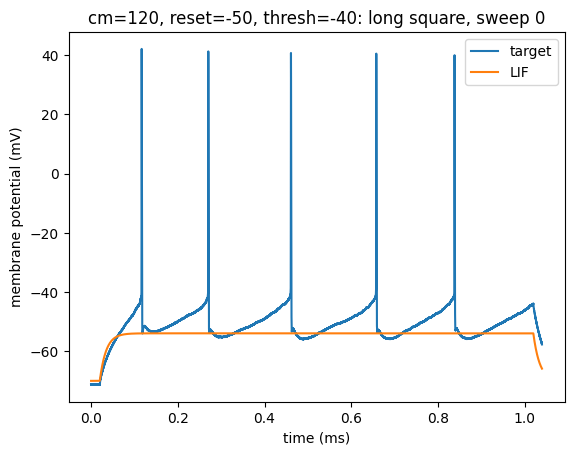

In [13]:
create_comparison_together(sliced_ls_res[0], lif_ls_9[0]*1000, d2_title='LIF')
title('cm=120, reset=-50, thresh=-40: long square, sweep 0')

Text(0.5, 1.0, 'cm=120, reset=-50, thresh=-40: long square, sweep 1')

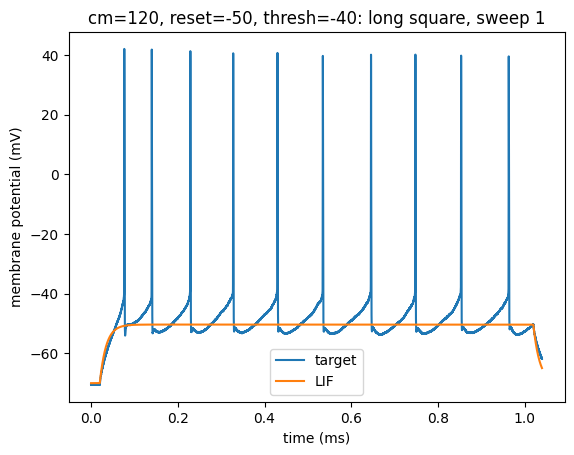

In [14]:
create_comparison_together(sliced_ls_res[1], lif_ls_9[1]*1000, d2_title='LIF')
title('cm=120, reset=-50, thresh=-40: long square, sweep 1')

Text(0.5, 1.0, 'cm=120, reset=-50, thresh=-40: long square, sweep 2')

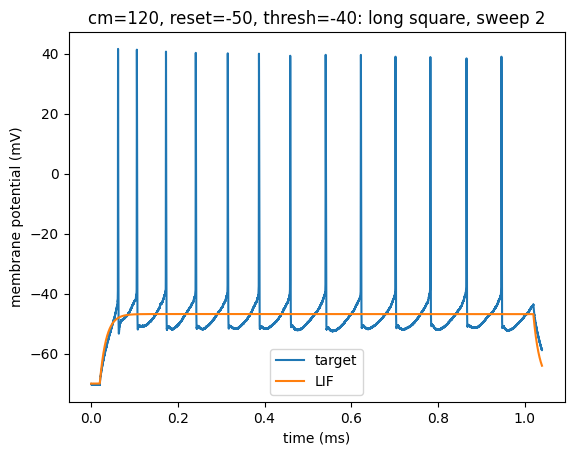

In [15]:
create_comparison_together(sliced_ls_res[2], lif_ls_9[2]*1000, d2_title='LIF')
title('cm=120, reset=-50, thresh=-40: long square, sweep 2')

Text(0.5, 1.0, 'cm=120, reset=-50, thresh=-40: long square, sweep 3')

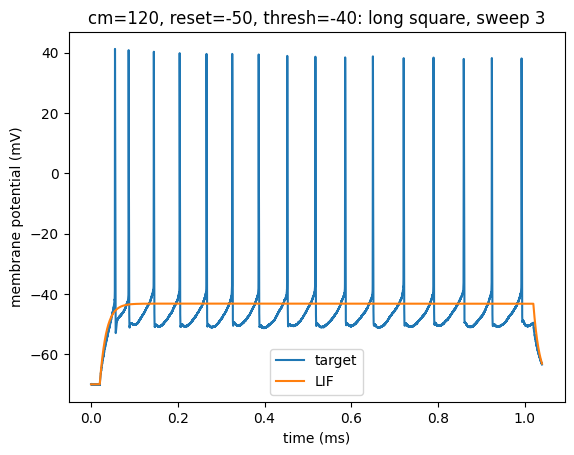

In [16]:
create_comparison_together(sliced_ls_res[3], lif_ls_9[3]*1000, d2_title='LIF')
title('cm=120, reset=-50, thresh=-40: long square, sweep 3')

Text(0.5, 1.0, 'cm=120, reset=-50, thresh=-40: long square, sweep 4')

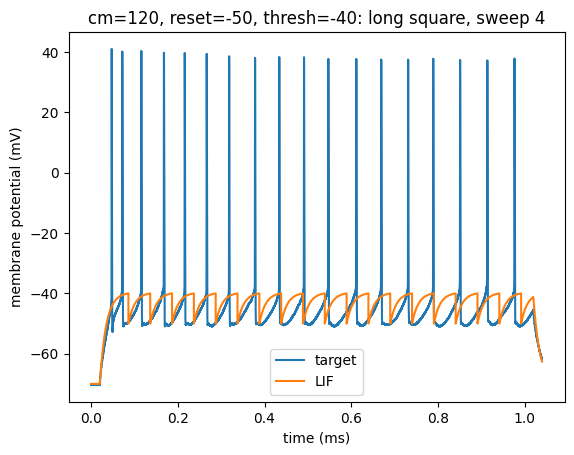

In [17]:
create_comparison_together(sliced_ls_res[4], lif_ls_9[4]*1000, d2_title='LIF')
title('cm=120, reset=-50, thresh=-40: long square, sweep 4')

Text(0.5, 1.0, 'cm=120, reset=-50, thresh=-40: long square, sweep 5')

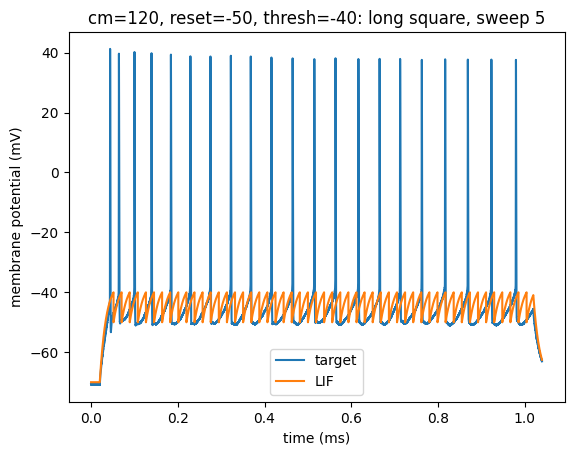

In [18]:
create_comparison_together(sliced_ls_res[5], lif_ls_9[5]*1000, d2_title='LIF')
title('cm=120, reset=-50, thresh=-40: long square, sweep 5')

Needs individual adjustments so running model through a collection doesn't work for LIF here?

Sweep 4 closest for these params.

Usually goes from no spikes to too many on increased input...

***

### Experiment with AdEx

In [ ]:
# c = 120
# gl = 5
# vt = -50
# delt = 2
# vc = 5
# tauw = 120 - 160
# a = 1 - 4
# b = 0 - 0.5

adex_ls_1 = run_adex(sliced_ls_amps, sliced_ls_res)

first fit:
Round 0: Best parameters a=3.17424365 nS, b=58.28229151 pA, tauw=141.00099533 ms (error: 182.11724187 mV^2)
Round 1: Best parameters a=3.40112755 nS, b=35.81839984 pA, tauw=138.97425294 ms (error: 179.8732169 mV^2)
Round 2: Best parameters a=2.00316952 nS, b=25.00807318 pA, tauw=135.80331147 ms (error: 177.20763887 mV^2)
Round 3: Best parameters a=3.00892591 nS, b=21.80483147 pA, tauw=139.0850741 ms (error: 176.76816573 mV^2)
Round 4: Best parameters a=3.00892591 nS, b=21.80483147 pA, tauw=139.0850741 ms (error: 176.76816573 mV^2)
Round 5: Best parameters a=3.10682614 nS, b=19.7771223 pA, tauw=151.75274627 ms (error: 176.26793481 mV^2)
Round 6: Best parameters a=3.05203349 nS, b=18.91770719 pA, tauw=128.29643735 ms (error: 174.88761092 mV^2)
Round 7: Best parameters a=3.05203349 nS, b=18.91770719 pA, tauw=128.29643735 ms (error: 174.88761092 mV^2)
Round 8: Best parameters a=3.05203349 nS, b=18.91770719 pA, tauw=128.29643735 ms (error: 174.88761092 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 0')

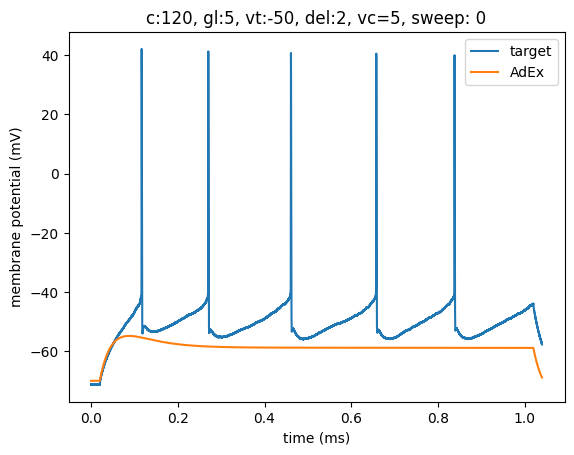

In [20]:
create_comparison_together(sliced_ls_res[0], adex_ls_1[0]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 0')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 1')

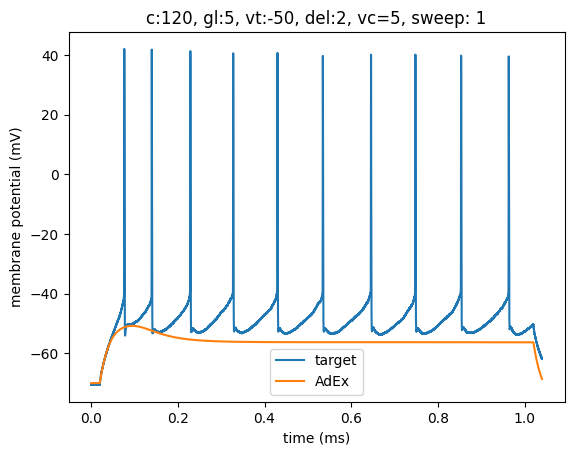

In [21]:
create_comparison_together(sliced_ls_res[1], adex_ls_1[1]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 1')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 2')

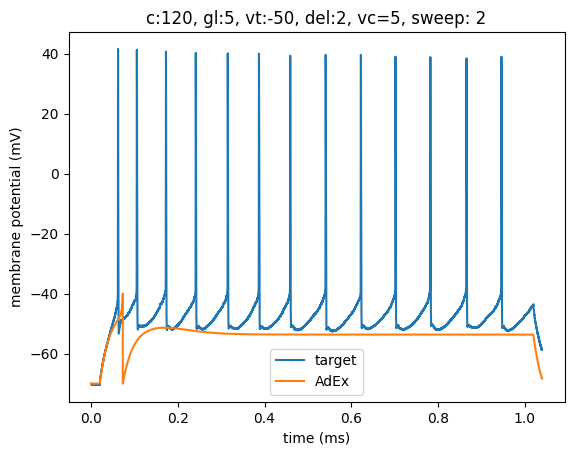

In [22]:
create_comparison_together(sliced_ls_res[2], adex_ls_1[2]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 2')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 3')

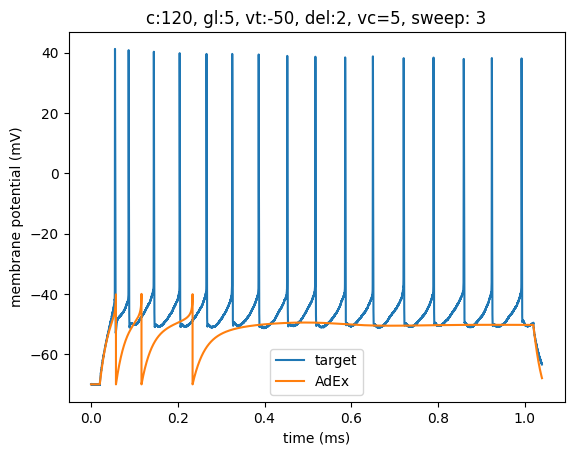

In [23]:
create_comparison_together(sliced_ls_res[3], adex_ls_1[3]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 3')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 4')

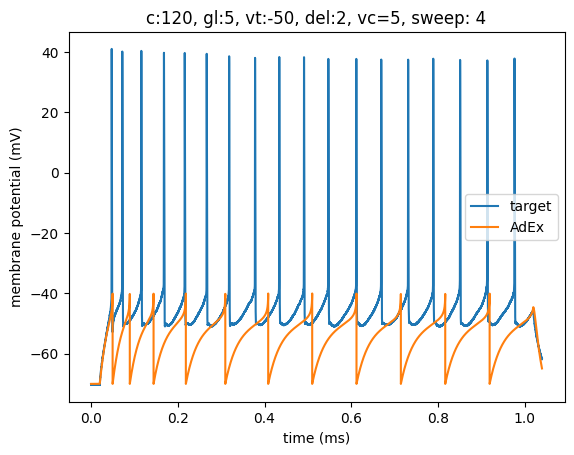

In [24]:
create_comparison_together(sliced_ls_res[4], adex_ls_1[4]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 4')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 5')

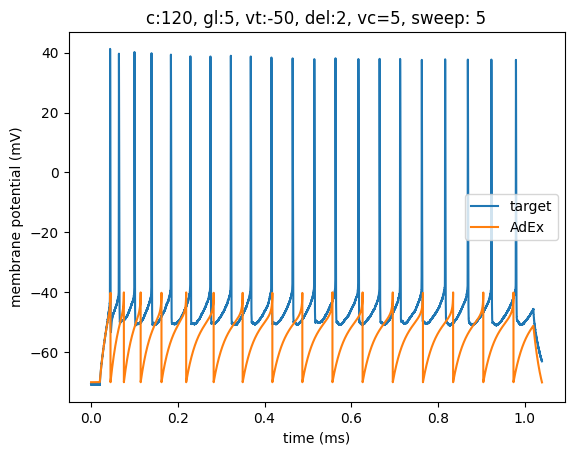

In [25]:
create_comparison_together(sliced_ls_res[5], adex_ls_1[5]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 5')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 6')

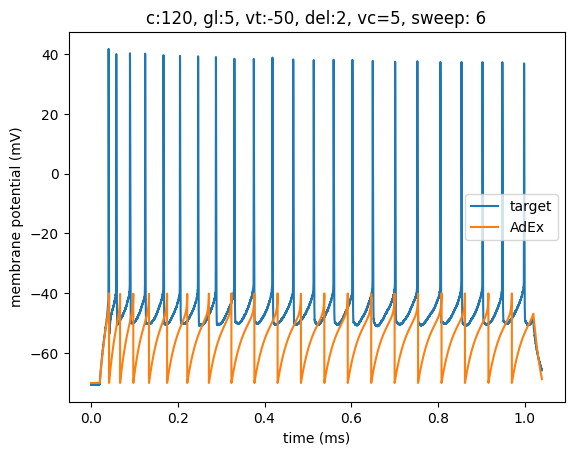

In [26]:
create_comparison_together(sliced_ls_res[6], adex_ls_1[6]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 6')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, sweep: 7')

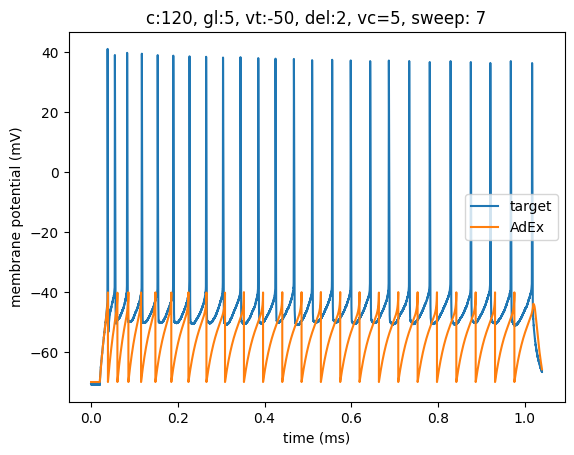

In [27]:
create_comparison_together(sliced_ls_res[7], adex_ls_1[7]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, sweep: 7')

Similar for AdEx??  Needs individual adjustments?

Although bit better...

In [4]:
# change vr from -70 to -50

# c = 120
# gl = 5
# vt = -50
# delt = 2
# vc = 5
# tauw = 120 - 160
# a = 1 - 4
# b = 0 - 0.5

adex_ls_2 = run_adex(sliced_ls_amps, sliced_ls_res, vr=-50)

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters a=3.04902439 nS, b=60.24678739 pA, tauw=154.57025634 ms (error: 138.66924434 mV^2)
Round 1: Best parameters a=2.19327315 nS, b=41.12460125 pA, tauw=131.09059508 ms (error: 118.949236 mV^2)
Round 2: Best parameters a=1.43423087 nS, b=22.99338258 pA, tauw=145.440327 ms (error: 105.58064724 mV^2)
Round 3: Best parameters a=1.35004496 nS, b=18.37300461 pA, tauw=127.1917361 ms (error: 102.04525973 mV^2)
Round 4: Best parameters a=1.22840358 nS, b=13.73722047 pA, tauw=123.68308275 ms (error: 99.46602124 mV^2)
Round 5: Best parameters a=1.1895558 nS, b=9.28722752 pA, tauw=123.31031814 ms (error: 97.38974742 mV^2)
Round 6: Best parameters a=1.08600191 nS, b=9.09420998 pA, tauw=123.69547727 ms (error: 97.0073062 mV^2)
Round 7: Best parameters a=1.09867511 nS, b=6.08081405 pA, tauw=121.65357056 ms (error: 96.32328569 mV^2)
Round 8: Best parameters a=1.05865527 nS, b=5.05000145 pA, tauw=123.77434181 ms (error: 96.079751 mV^2)
Round 9: Best parameters a=1.080415

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 0')

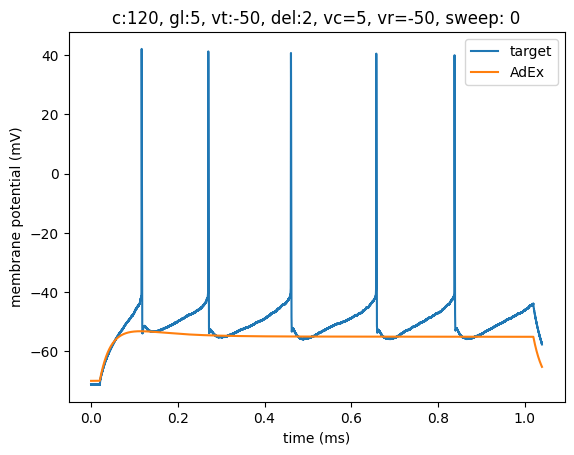

In [5]:
create_comparison_together(sliced_ls_res[0], adex_ls_2[0]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 0')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 1')

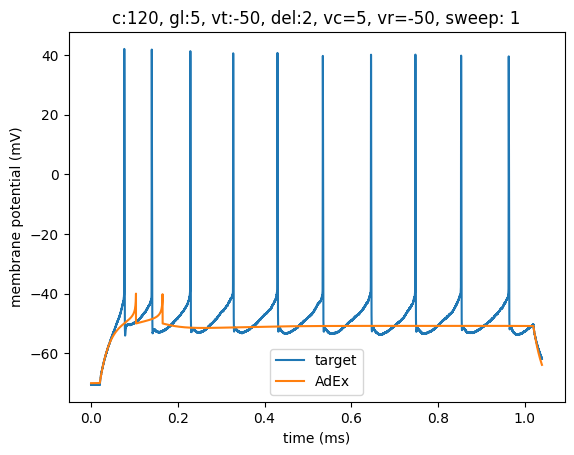

In [6]:
create_comparison_together(sliced_ls_res[1], adex_ls_2[1]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 1')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 2')

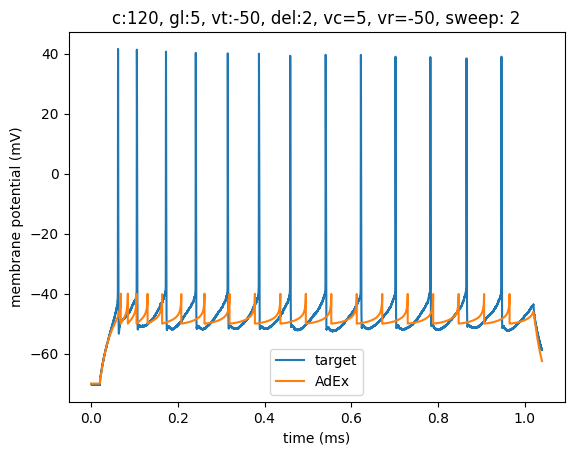

In [7]:
create_comparison_together(sliced_ls_res[2], adex_ls_2[2]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 2')

Text(0.5, 1.0, 'c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 3')

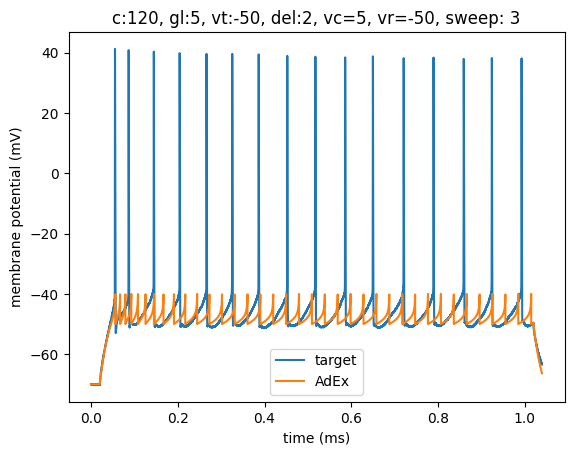

In [8]:
create_comparison_together(sliced_ls_res[3], adex_ls_2[3]*1000, d2_title='AdEx')
title('c:120, gl:5, vt:-50, del:2, vc=5, vr=-50, sweep: 3')

Because it goes from nothing/ too little, to too much in between sweeps, must be individual adjustments?

***

### HH

In [9]:
hh_ls_1 = run_hh(sliced_ls_amps, sliced_ls_res)

first fit:
Round 0: Best parameters g_kd=1.31834577 uS, g_na=15.58855122 uS, gl=16.89446452 nS (error: 95.02898056 mV^2)
Round 1: Best parameters g_kd=0.97770265 uS, g_na=8.40956648 uS, gl=13.39107403 nS (error: 93.81300886 mV^2)
Round 2: Best parameters g_kd=0.97770265 uS, g_na=8.40956648 uS, gl=12.34516927 nS (error: 93.72128983 mV^2)
Round 3: Best parameters g_kd=0.69688471 uS, g_na=6.0027461 uS, gl=11.45743123 nS (error: 93.54654098 mV^2)
Round 4: Best parameters g_kd=0.54872416 uS, g_na=4.71743614 uS, gl=11.78210517 nS (error: 93.51833285 mV^2)
Round 5: Best parameters g_kd=0.40942287 uS, g_na=3.92211 uS, gl=11.09052508 nS (error: 93.40479763 mV^2)
Round 6: Best parameters g_kd=0.44459045 uS, g_na=4.0945773 uS, gl=10.90988968 nS (error: 93.31963177 mV^2)
Round 7: Best parameters g_kd=0.47480448 uS, g_na=4.28506878 uS, gl=10.71845765 nS (error: 93.29196543 mV^2)
Round 8: Best parameters g_kd=0.47480448 uS, g_na=4.28506878 uS, gl=10.71845765 nS (error: 93.29196543 mV^2)
Round 9: Bes

Text(0.5, 1.0, 'sweep: 0')

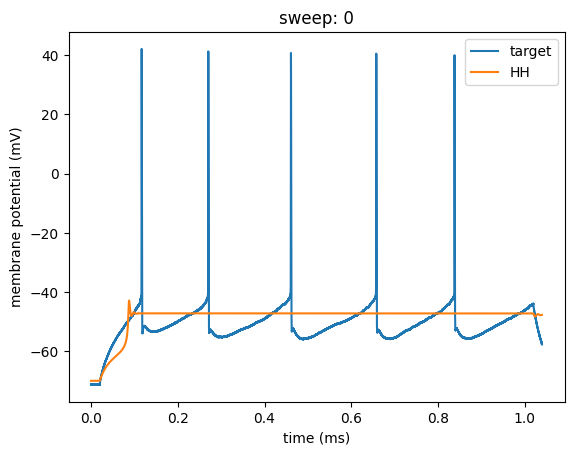

In [13]:
create_comparison_together(sliced_ls_res[0], hh_ls_1[0]*1000, d2_title='HH')
title('sweep: 0')

Text(0.5, 1.0, 'sweep: 1')

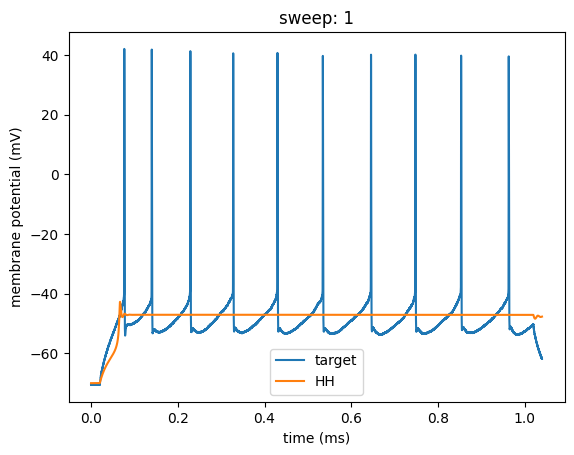

In [14]:
create_comparison_together(sliced_ls_res[1], hh_ls_1[1]*1000, d2_title='HH')
title('sweep: 1')

Text(0.5, 1.0, 'sweep: 2')

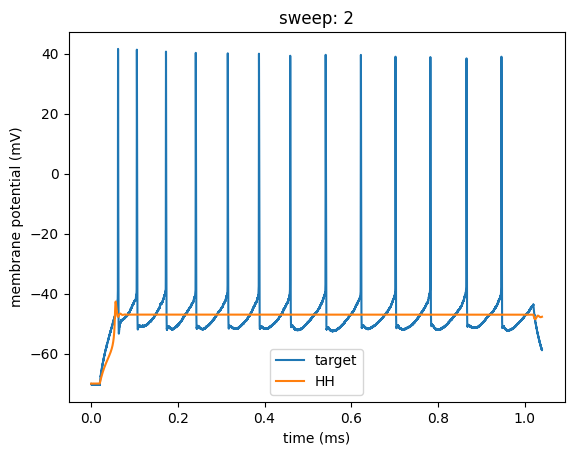

In [15]:
create_comparison_together(sliced_ls_res[2], hh_ls_1[2]*1000, d2_title='HH')
title('sweep: 2')

Text(0.5, 1.0, 'sweep: 3')

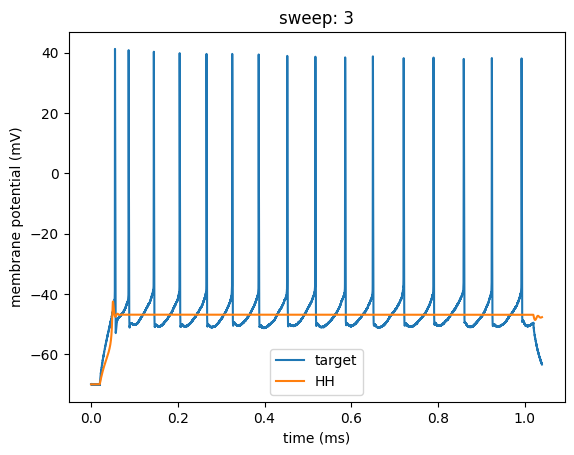

In [16]:
create_comparison_together(sliced_ls_res[3], hh_ls_1[3]*1000, d2_title='HH')
title('sweep: 3')

Text(0.5, 1.0, 'sweep: 4')

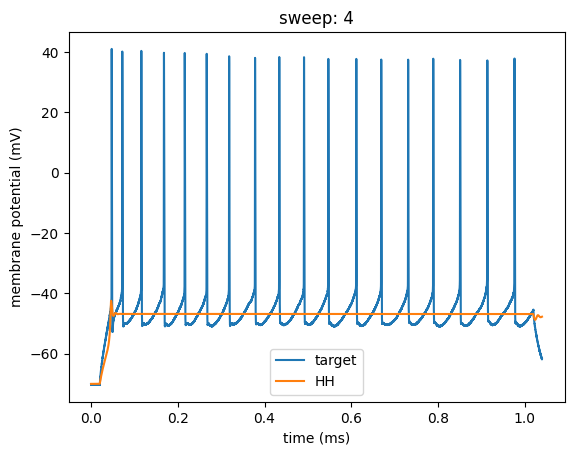

In [17]:
create_comparison_together(sliced_ls_res[4], hh_ls_1[4]*1000, d2_title='HH')
title('sweep: 4')

Text(0.5, 1.0, 'sweep: 5')

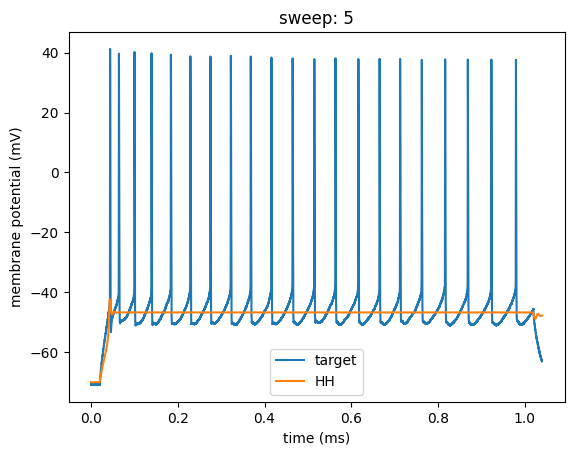

In [18]:
create_comparison_together(sliced_ls_res[5], hh_ls_1[5]*1000, d2_title='HH')
title('sweep: 5')

Text(0.5, 1.0, 'sweep: 6')

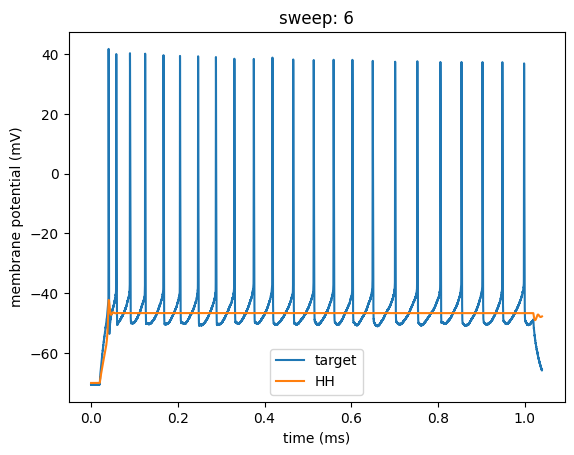

In [19]:
create_comparison_together(sliced_ls_res[6], hh_ls_1[6]*1000, d2_title='HH')
title('sweep: 6')

Text(0.5, 1.0, 'sweep: 7')

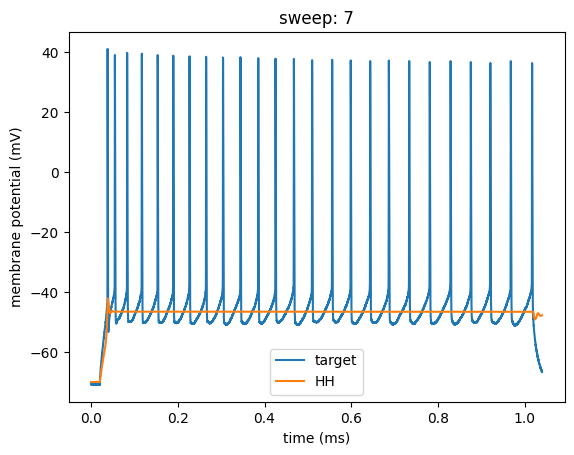

In [20]:
create_comparison_together(sliced_ls_res[7], hh_ls_1[7]*1000, d2_title='HH')
title('sweep: 7')

Text(0.5, 1.0, 'Check difference between sweeps...')

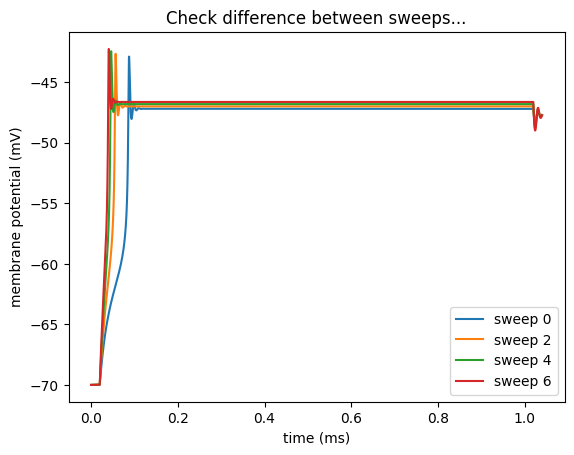

In [22]:
create_comparison_together_four(hh_ls_1[0]*1000, hh_ls_1[2]*1000, hh_ls_1[4]*1000, hh_ls_1[6]*1000, 
                                d1_title='sweep 0', d2_title='sweep 2', d3_title='sweep 4', d4_title='sweep 6')
title('Check difference between sweeps...')

So as input increases, the 'spike' happens earlier (more accurate)... and rest slightly higher...

HH less affected (with current params) by increased input current.

Damped/ sustained oscillations: Resonate-and-fire Neurons, E. M. Izhikevich, 2001.

In [ ]:
hh_ls_2 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120)

# tt: 4m 8.4s

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters g_kd=0.82045599 uS, g_na=11.82604604 uS, gl=20.7280125 nS (error: 118.03850501 mV^2)
Round 1: Best parameters g_kd=0.67927653 uS, g_na=8.7983656 uS, gl=21.01600591 nS (error: 117.97109299 mV^2)
Round 2: Best parameters g_kd=0.40177099 uS, g_na=6.5793556 uS, gl=21.4765417 nS (error: 117.83479408 mV^2)
Round 3: Best parameters g_kd=0.40177099 uS, g_na=6.5793556 uS, gl=21.4765417 nS (error: 117.83479408 mV^2)
Round 4: Best parameters g_kd=283.76136352 nS, g_na=4.45539022 uS, gl=16.45453824 nS (error: 117.53929366 mV^2)
Round 5: Best parameters g_kd=215.44766041 nS, g_na=2.70788204 uS, gl=16.6332991 nS (error: 116.22160787 mV^2)
Round 6: Best parameters g_kd=140.92490772 nS, g_na=2.10938745 uS, gl=14.14126913 nS (error: 114.92083164 mV^2)
Round 7: Best parameters g_kd=117.51021381 nS, g_na=1.78439804 uS, gl=13.66940295 nS (error: 114.85716839 mV^2)
Round 8: Best parameters g_kd=90.50876615 nS, g_na=1.60582246 uS, gl=12.6239781 nS (error: 114.37557762 mV^

Text(0.5, 1.0, 'sweep: 4')

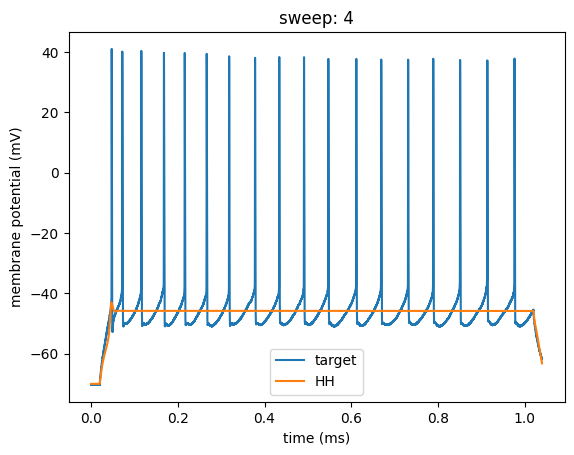

In [6]:
create_comparison_together(sweeps4_to_7_ls_res[0], hh_ls_2[0]*1000, d2_title='HH')
title('sweep: 4')

Text(0.5, 1.0, 'sweep: 5')

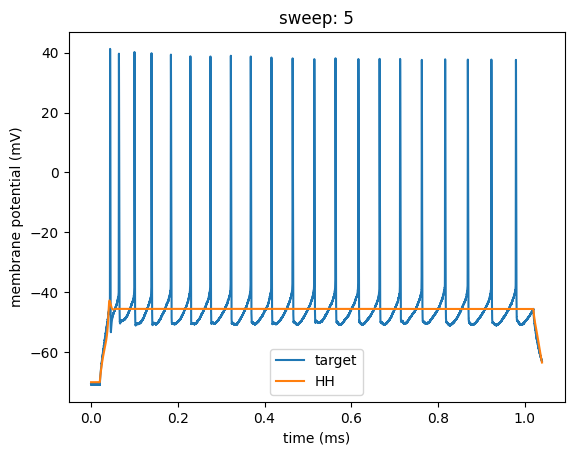

In [7]:
create_comparison_together(sweeps4_to_7_ls_res[1], hh_ls_2[1]*1000, d2_title='HH')
title('sweep: 5')

Text(0.5, 1.0, 'sweep: 6')

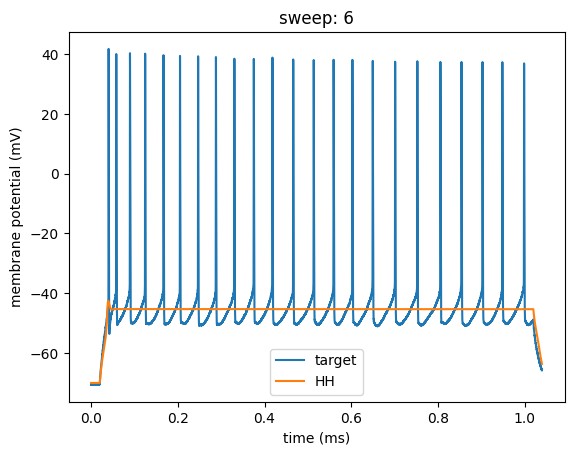

In [8]:
create_comparison_together(sweeps4_to_7_ls_res[2], hh_ls_2[2]*1000, d2_title='HH')
title('sweep: 6')

Text(0.5, 1.0, 'sweep: 7')

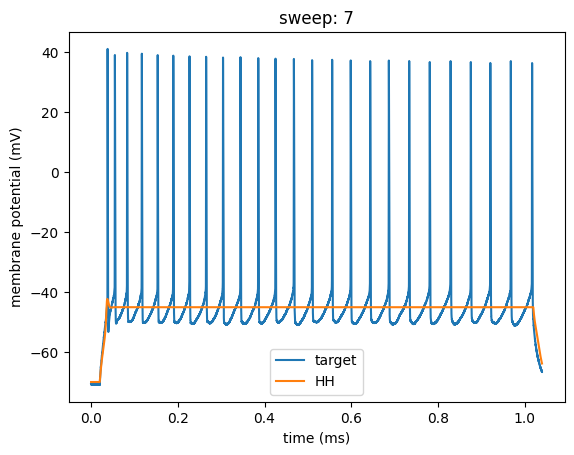

In [9]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_2[3]*1000, d2_title='HH')
title('sweep: 7')

In [ ]:
hh_ls_3 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, el=-50)

# tt: 4m 14.5s

first fit:
Round 0: Best parameters g_kd=0.61181765 uS, g_na=5.17733855 uS, gl=33.3860004 nS (error: 131.48931594 mV^2)
Round 1: Best parameters g_kd=0.40125136 uS, g_na=3.28447998 uS, gl=26.26843218 nS (error: 131.02935728 mV^2)
Round 2: Best parameters g_kd=0.31786157 uS, g_na=2.39081387 uS, gl=32.65183037 nS (error: 130.71003845 mV^2)
Round 3: Best parameters g_kd=240.35031738 nS, g_na=1.92945527 uS, gl=32.25587434 nS (error: 130.3165207 mV^2)
Round 4: Best parameters g_kd=234.54310398 nS, g_na=1.70107809 uS, gl=25.74916702 nS (error: 130.11089552 mV^2)
Round 5: Best parameters g_kd=187.9439097 nS, g_na=1.440033 uS, gl=34.27884072 nS (error: 129.86898015 mV^2)
Round 6: Best parameters g_kd=159.50030991 nS, g_na=1.33318193 uS, gl=35.53220468 nS (error: 129.73268241 mV^2)
Round 7: Best parameters g_kd=194.55424795 nS, g_na=1.23091777 uS, gl=22.87673046 nS (error: 129.55900845 mV^2)
Round 8: Best parameters g_kd=187.88638594 nS, g_na=1.25174133 uS, gl=13.67632926 nS (error: 129.5471669

Text(0.5, 1.0, 'Long Square: c=120, el=-50, sweep 7')

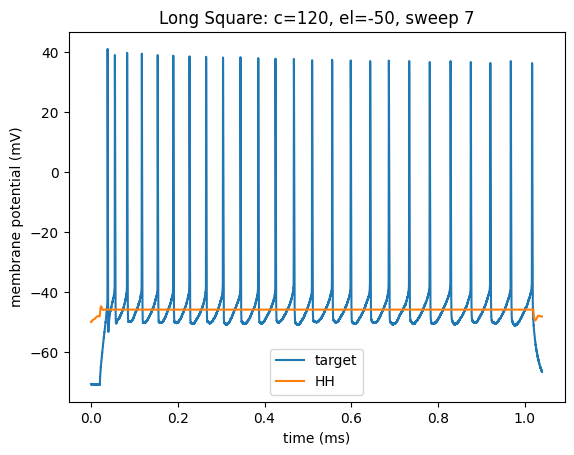

In [11]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_3[3]*1000, d2_title='HH')
title('Long Square: c=120, el=-50, sweep 7')

In [ ]:
hh_ls_4 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, ek=-40)

# tt: 4m 31.9s

first fit:
Round 0: Best parameters g_kd=1.09169337 uS, g_na=4.92709863 uS, gl=22.40496921 nS (error: 134.11835591 mV^2)
Round 1: Best parameters g_kd=0.65565263 uS, g_na=2.8327253 uS, gl=18.55664979 nS (error: 130.43234164 mV^2)
Round 2: Best parameters g_kd=289.69381089 nS, g_na=2.20578695 uS, gl=16.66816153 nS (error: 126.08722883 mV^2)
Round 3: Best parameters g_kd=188.27236866 nS, g_na=1.93807682 uS, gl=16.60567487 nS (error: 123.79795717 mV^2)
Round 4: Best parameters g_kd=143.80022448 nS, g_na=1.86715632 uS, gl=17.05595757 nS (error: 122.57814341 mV^2)
Round 5: Best parameters g_kd=128.76124106 nS, g_na=1.49446948 uS, gl=16.80813065 nS (error: 118.95004693 mV^2)
Round 6: Best parameters g_kd=90.83428707 nS, g_na=1.41614685 uS, gl=15.87828879 nS (error: 118.34873487 mV^2)
Round 7: Best parameters g_kd=69.54674965 nS, g_na=1.28362889 uS, gl=16.08884156 nS (error: 117.49386833 mV^2)
Round 8: Best parameters g_kd=63.33432344 nS, g_na=1.24980797 uS, gl=15.61020805 nS (error: 117.3199

Text(0.5, 1.0, 'Long Square: c=120, ek=-40, sweep 7')

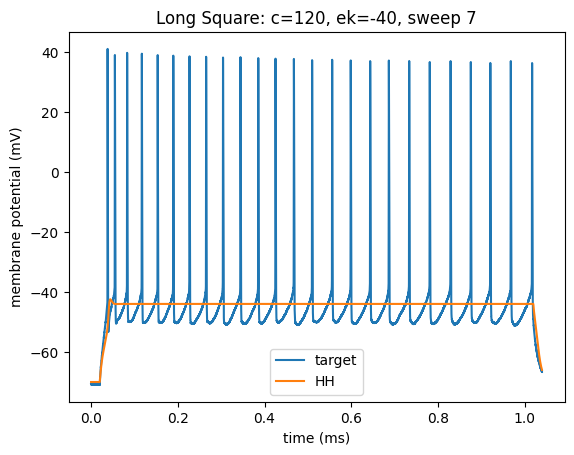

In [13]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_4[3]*1000, d2_title='HH')
title('Long Square: c=120, ek=-40, sweep 7')

In [ ]:
hh_ls_5 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, ek=-40, ena=20)

# tt: 4m 53.9s

first fit:
Round 0: Best parameters g_kd=3.36588973 uS, g_na=5.33839799 uS, gl=34.0635992 nS (error: 229.56784199 mV^2)
Round 1: Best parameters g_kd=3.1365812 uS, g_na=3.01543874 uS, gl=29.51363957 nS (error: 204.40966261 mV^2)
Round 2: Best parameters g_kd=3.68565266 uS, g_na=2.16016498 uS, gl=20.88633771 nS (error: 188.90114006 mV^2)
Round 3: Best parameters g_kd=3.644219 uS, g_na=2.0014525 uS, gl=26.94503593 nS (error: 184.52048119 mV^2)
Round 4: Best parameters g_kd=3.48179336 uS, g_na=1.53365246 uS, gl=22.35550596 nS (error: 178.01949429 mV^2)
Round 5: Best parameters g_kd=3.62063029 uS, g_na=1.43319496 uS, gl=22.91255695 nS (error: 174.96192081 mV^2)
Round 6: Best parameters g_kd=3.71038604 uS, g_na=1.34240127 uS, gl=21.47215535 nS (error: 173.32590856 mV^2)
Round 7: Best parameters g_kd=3.74622025 uS, g_na=1.25776792 uS, gl=21.99084002 nS (error: 171.20050455 mV^2)
Round 8: Best parameters g_kd=3.77285173 uS, g_na=1.20196392 uS, gl=22.62907253 nS (error: 169.62753672 mV^2)
Roun

Text(0.5, 1.0, 'Long Square: c=120, ek=-40, ena=20, sweep 7')

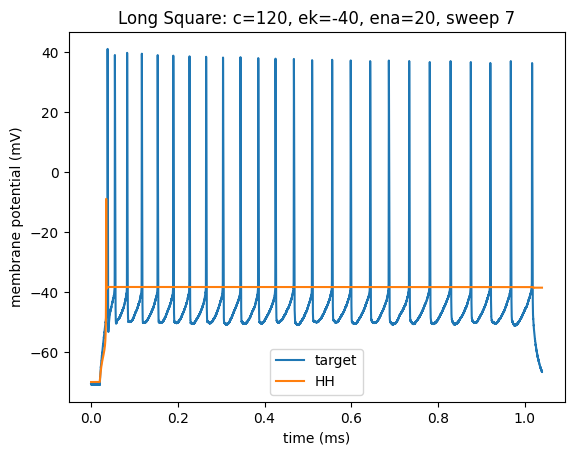

In [15]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_5[3]*1000, d2_title='HH')
title('Long Square: c=120, ek=-40, ena=20, sweep 7')

In [ ]:
hh_ls_6 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, ek=-40, ena=20, glmin=1)

# tt: 4m 41.7s

first fit:
Round 0: Best parameters g_kd=2.9530212 uS, g_na=3.96370123 uS, gl=32.91369732 nS (error: 222.21088335 mV^2)
Round 1: Best parameters g_kd=3.38266687 uS, g_na=2.74363262 uS, gl=22.70826939 nS (error: 200.10943754 mV^2)
Round 2: Best parameters g_kd=3.20579873 uS, g_na=2.13824069 uS, gl=17.47089776 nS (error: 194.78583165 mV^2)
Round 3: Best parameters g_kd=3.54962052 uS, g_na=1.74807199 uS, gl=24.66587191 nS (error: 180.09707112 mV^2)
Round 4: Best parameters g_kd=3.54962052 uS, g_na=1.74807199 uS, gl=24.66587191 nS (error: 180.09707112 mV^2)
Round 5: Best parameters g_kd=3.60155436 uS, g_na=1.53227542 uS, gl=26.01970346 nS (error: 177.61106138 mV^2)
Round 6: Best parameters g_kd=3.68350221 uS, g_na=1.44309346 uS, gl=23.71617711 nS (error: 173.96739744 mV^2)
Round 7: Best parameters g_kd=3.68350221 uS, g_na=1.44309346 uS, gl=23.71617711 nS (error: 173.96739744 mV^2)
Round 8: Best parameters g_kd=3.77755153 uS, g_na=1.37074086 uS, gl=24.74991929 nS (error: 172.96545375 mV^2)


Text(0.5, 1.0, 'Long Square: c=120, ek=-40, ena=20, gl=1-40, sweep 7')

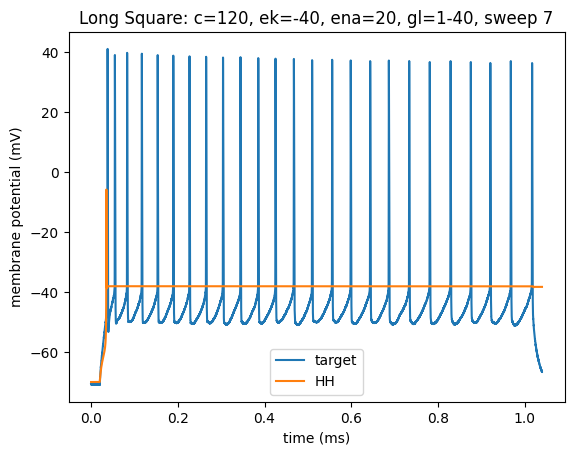

In [23]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_6[3]*1000, d2_title='HH')
title('Long Square: c=120, ek=-40, ena=20, gl=1-40, sweep 7')

In [18]:
hh_ls_7 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, ek=-40, ena=40, glmin=1)

first fit:
Round 0: Best parameters g_kd=2.91004129 uS, g_na=3.34183379 uS, gl=28.27295709 nS (error: 229.44804047 mV^2)
Round 1: Best parameters g_kd=3.49006942 uS, g_na=2.51254413 uS, gl=17.97569294 nS (error: 211.95532987 mV^2)
Round 2: Best parameters g_kd=3.53689982 uS, g_na=2.22533933 uS, gl=27.65531814 nS (error: 199.74990503 mV^2)
Round 3: Best parameters g_kd=3.34614254 uS, g_na=1.66239628 uS, gl=25.73059432 nS (error: 190.35587578 mV^2)
Round 4: Best parameters g_kd=3.52739243 uS, g_na=1.42326321 uS, gl=24.74734551 nS (error: 183.38262302 mV^2)
Round 5: Best parameters g_kd=3.67238288 uS, g_na=1.31367538 uS, gl=20.16808877 nS (error: 182.61550866 mV^2)
Round 6: Best parameters g_kd=3.790124 uS, g_na=1.23833946 uS, gl=23.55396371 nS (error: 178.25115399 mV^2)
Round 7: Best parameters g_kd=3.73327941 uS, g_na=1.17181768 uS, gl=21.28095518 nS (error: 177.97332669 mV^2)
Round 8: Best parameters g_kd=3.78821891 uS, g_na=1.12795416 uS, gl=22.52526462 nS (error: 175.91103598 mV^2)
R

Text(0.5, 1.0, 'Long Square: c=120, ek=-40, ena=40, gl=1-40, sweep 7')

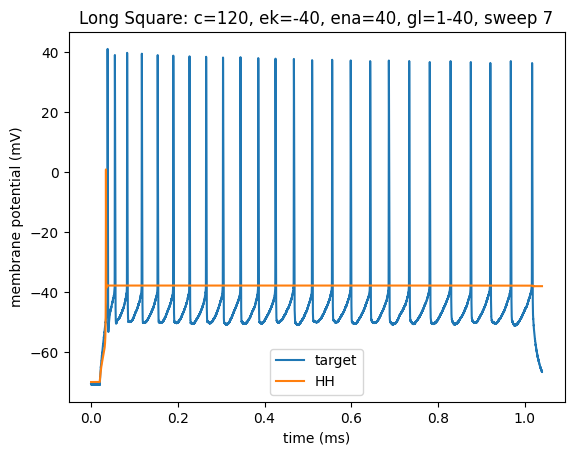

In [24]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_7[3]*1000, d2_title='HH')
title('Long Square: c=120, ek=-40, ena=40, gl=1-40, sweep 7')

In [20]:
hh_ls_8 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, ek=-50, ena=40, glmin=1, glmax=20)

first fit:
Round 0: Best parameters g_kd=3.07389879 uS, g_na=4.05682244 uS, gl=16.59271771 nS (error: 179.87836473 mV^2)
Round 1: Best parameters g_kd=2.9254831 uS, g_na=2.21536405 uS, gl=13.46881619 nS (error: 153.77112007 mV^2)
Round 2: Best parameters g_kd=3.26024534 uS, g_na=1.86928923 uS, gl=15.91286164 nS (error: 142.84731292 mV^2)
Round 3: Best parameters g_kd=3.65639617 uS, g_na=1.73566033 uS, gl=18.5911894 nS (error: 136.67638668 mV^2)
Round 4: Best parameters g_kd=3.73017962 uS, g_na=1.47638514 uS, gl=15.40973688 nS (error: 132.47957724 mV^2)
Round 5: Best parameters g_kd=3.67427774 uS, g_na=1.39605099 uS, gl=18.35439781 nS (error: 130.51585562 mV^2)
Round 6: Best parameters g_kd=3.69108958 uS, g_na=1.27584666 uS, gl=18.55122575 nS (error: 128.47741453 mV^2)
Round 7: Best parameters g_kd=3.80509074 uS, g_na=1.20499849 uS, gl=16.18977463 nS (error: 127.15273743 mV^2)
Round 8: Best parameters g_kd=3.74659043 uS, g_na=1.15333105 uS, gl=19.03668443 nS (error: 126.00795431 mV^2)
R

Text(0.5, 1.0, 'Long Square: c=120, ek=-50, ena=40, gl=1-20, sweep 7')

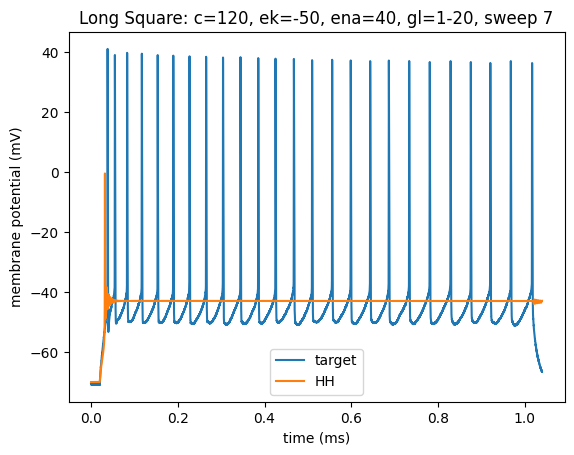

In [25]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_8[3]*1000, d2_title='HH')
title('Long Square: c=120, ek=-50, ena=40, gl=1-20, sweep 7')

In [22]:
hh_ls_9 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=120, ek=-50, ena=40, glmin=1, glmax=10)

first fit:
Round 0: Best parameters g_kd=3.35658134 uS, g_na=3.4228272 uS, gl=7.57732118 nS (error: 169.34727193 mV^2)
Round 1: Best parameters g_kd=3.52315825 uS, g_na=2.50882528 uS, gl=7.85882217 nS (error: 153.42337374 mV^2)
Round 2: Best parameters g_kd=3.38727857 uS, g_na=1.75581608 uS, gl=8.98797121 nS (error: 141.73757905 mV^2)
Round 3: Best parameters g_kd=3.41411865 uS, g_na=1.45986061 uS, gl=8.27392207 nS (error: 136.14740123 mV^2)
Round 4: Best parameters g_kd=3.57841069 uS, g_na=1.35204612 uS, gl=9.07262797 nS (error: 132.83006662 mV^2)
Round 5: Best parameters g_kd=3.71909512 uS, g_na=1.2995533 uS, gl=6.32397726 nS (error: 131.69867473 mV^2)
Round 6: Best parameters g_kd=3.71909512 uS, g_na=1.2995533 uS, gl=6.32397726 nS (error: 131.69867473 mV^2)
Round 7: Best parameters g_kd=3.71909512 uS, g_na=1.2995533 uS, gl=6.32397726 nS (error: 131.69867473 mV^2)
Round 8: Best parameters g_kd=3.71909512 uS, g_na=1.2995533 uS, gl=6.32397726 nS (error: 131.69867473 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Long Square: c=120, ek=-50, ena=40, gl=1-10, sweep 7')

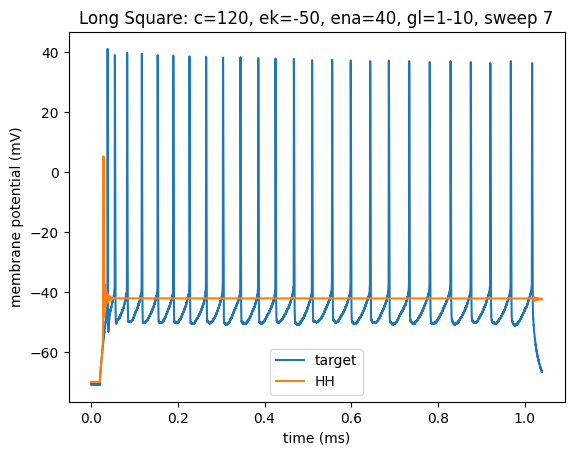

In [26]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_9[3]*1000, d2_title='HH')
title('Long Square: c=120, ek=-50, ena=40, gl=1-10, sweep 7')

In [28]:
hh_ls_10 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=80, ek=-50, ena=40, glmin=1, glmax=10)

first fit:
Round 0: Best parameters g_kd=3.31374185 uS, g_na=3.63747031 uS, gl=6.05734678 nS (error: 174.76670569 mV^2)
Round 1: Best parameters g_kd=3.37284456 uS, g_na=2.44074149 uS, gl=8.33703176 nS (error: 155.10402427 mV^2)
Round 2: Best parameters g_kd=3.64085735 uS, g_na=2.23260236 uS, gl=3.45586033 nS (error: 150.1819897 mV^2)
Round 3: Best parameters g_kd=3.66584421 uS, g_na=1.79300654 uS, gl=8.65182268 nS (error: 141.32179775 mV^2)
Round 4: Best parameters g_kd=3.63642072 uS, g_na=1.49790678 uS, gl=7.67953274 nS (error: 136.55201713 mV^2)
Round 5: Best parameters g_kd=3.75319157 uS, g_na=1.5469486 uS, gl=9.23028167 nS (error: 136.21506909 mV^2)
Round 6: Best parameters g_kd=3.75319157 uS, g_na=1.5469486 uS, gl=9.23028167 nS (error: 136.21506909 mV^2)
Round 7: Best parameters g_kd=3.75319157 uS, g_na=1.5469486 uS, gl=9.23028167 nS (error: 136.21506909 mV^2)
Round 8: Best parameters g_kd=3.75319157 uS, g_na=1.5469486 uS, gl=9.23028167 nS (error: 136.21506909 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Long Square: c=80, ek=-50, ena=40, gl=1-10, sweep 7')

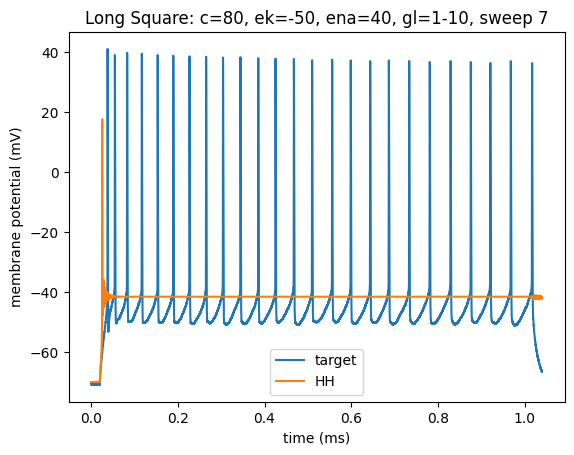

In [30]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_10[3]*1000, d2_title='HH')
title('Long Square: c=80, ek=-50, ena=40, gl=1-10, sweep 7')

In [31]:
hh_ls_11 = run_hh(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res, cm_var=200, ek=-50, ena=40, glmin=1, glmax=10)

first fit:
Round 0: Best parameters g_kd=2.92359201 uS, g_na=3.77299336 uS, gl=7.17867451 nS (error: 179.6002795 mV^2)
Round 1: Best parameters g_kd=3.60591551 uS, g_na=2.72087651 uS, gl=7.14611527 nS (error: 154.35526583 mV^2)
Round 2: Best parameters g_kd=3.68596451 uS, g_na=2.1909918 uS, gl=6.36735824 nS (error: 145.52729593 mV^2)
Round 3: Best parameters g_kd=3.7275414 uS, g_na=1.71062132 uS, gl=5.81090879 nS (error: 137.62191142 mV^2)
Round 4: Best parameters g_kd=3.76635309 uS, g_na=1.50124947 uS, gl=7.43593421 nS (error: 133.55611407 mV^2)
Round 5: Best parameters g_kd=3.7275414 uS, g_na=1.38117352 uS, gl=5.81090879 nS (error: 132.09902123 mV^2)
Round 6: Best parameters g_kd=3.79473092 uS, g_na=1.26468601 uS, gl=6.00456416 nS (error: 129.6311624 mV^2)
Round 7: Best parameters g_kd=3.74179569 uS, g_na=1.18436107 uS, gl=8.11605602 nS (error: 128.02646732 mV^2)
Round 8: Best parameters g_kd=3.81736519 uS, g_na=1.14054071 uS, gl=8.55950374 nS (error: 126.87342504 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Long Square: c=200, ek=-50, ena=40, gl=1-10, sweep 7')

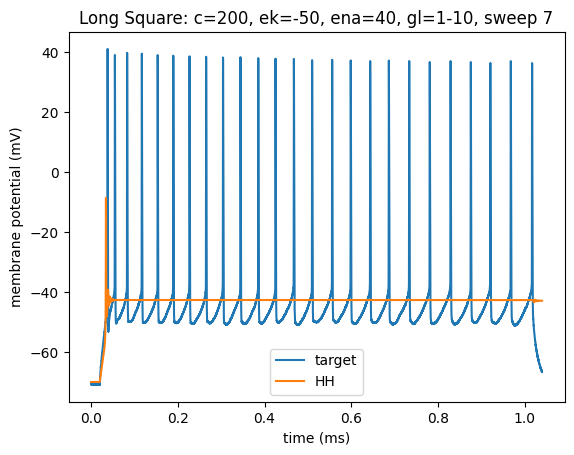

In [32]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_11[3]*1000, d2_title='HH')
title('Long Square: c=200, ek=-50, ena=40, gl=1-10, sweep 7')

Adding more params

In [ ]:
# c=80-200
# el=(-90)-(-50)
# ek=(-90)-(-40)
# ena=(-60)-40
# vt=(-90)-(-50)
# gl=10-40
# gna=1-20
# gk=0.01-4

hh_ls_12 = run_hh_all_params(sweeps4_to_7_ls_amps, sweeps4_to_7_ls_res)

# tt: 10m 47.7s

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters Cm=201.4177961 pF, EK=-69.09129047 mV, ENa=-35.84181174 mV, El=-58.65122114 mV, VT=-57.51176535 mV, g_kd=2.81598019 uS, g_na=8.92800049 uS, gl=17.12563965 nS (error: 117.48521092 mV^2)
Round 1: Best parameters Cm=201.4177961 pF, EK=-69.09129047 mV, ENa=-35.84181174 mV, El=-58.65122114 mV, VT=-57.51176535 mV, g_kd=2.81598019 uS, g_na=8.92800049 uS, gl=17.12563965 nS (error: 117.48521092 mV^2)
Round 2: Best parameters Cm=201.4177961 pF, EK=-69.09129047 mV, ENa=-35.84181174 mV, El=-58.65122114 mV, VT=-57.51176535 mV, g_kd=2.81598019 uS, g_na=8.92800049 uS, gl=17.12563965 nS (error: 117.48521092 mV^2)
Round 3: Best parameters Cm=271.24295423 pF, EK=-70.81383637 mV, ENa=-35.84181174 mV, El=-57.50320497 mV, VT=-57.51176535 mV, g_kd=3.6230237 uS, g_na=8.92800049 uS, gl=18.3265609 nS (error: 117.29288516 mV^2)
Round 4: Best parameters Cm=166.49557429 pF, EK=-82.99609757 mV, ENa=-41.56105764 mV, El=-61.61058456 mV, VT=-60.76966367 mV, g_kd=0.56719585 uS, g_na

Text(0.5, 1.0, 'Long Square: all params optimised, sweep 7')

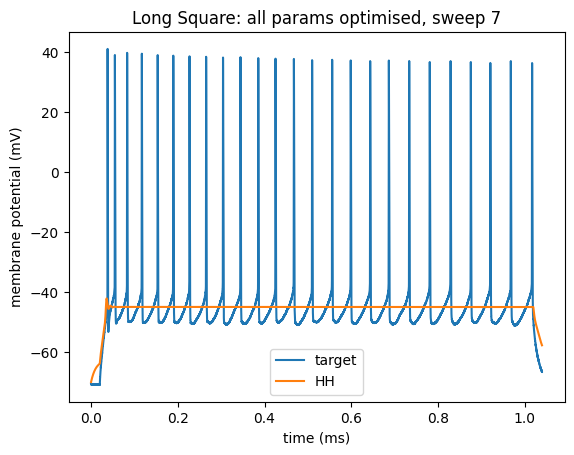

In [6]:
create_comparison_together(sweeps4_to_7_ls_res[3], hh_ls_12[3]*1000, d2_title='HH')
title('Long Square: all params optimised, sweep 7')

***

# Individual sweeps

Sweep 4: HH

In [ ]:
hh_sweep4_0 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out)

# tt: 4m 54.6

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters Cm=123.94844898 pF, EK=-66.10128489 mV, ENa=-5.03089091 mV, El=-78.312313 mV, VT=-81.66974406 mV, g_kd=0.73863045 uS, g_na=4.85007708 uS, gl=29.98344412 nS (error: 99.58549339 mV^2)
Round 1: Best parameters Cm=232.66094288 pF, EK=-49.57930904 mV, ENa=-44.25613734 mV, El=-69.2510168 mV, VT=-72.87200171 mV, g_kd=1.01163546 uS, g_na=14.40133288 uS, gl=27.1765903 nS (error: 94.45692856 mV^2)
Round 2: Best parameters Cm=232.66094288 pF, EK=-49.57930904 mV, ENa=-44.25613734 mV, El=-69.2510168 mV, VT=-72.87200171 mV, g_kd=1.01163546 uS, g_na=14.40133288 uS, gl=27.1765903 nS (error: 94.45692856 mV^2)
Round 3: Best parameters Cm=232.66094288 pF, EK=-49.57930904 mV, ENa=-44.25613734 mV, El=-69.2510168 mV, VT=-72.87200171 mV, g_kd=1.01163546 uS, g_na=14.40133288 uS, gl=27.1765903 nS (error: 94.45692856 mV^2)
Round 4: Best parameters Cm=232.66094288 pF, EK=-49.57930904 mV, ENa=-44.25613734 mV, El=-69.2510168 mV, VT=-72.87200171 mV, g_kd=1.01163546 uS, g_na=14.40

Text(0.5, 1.0, 'Individual run: sweep 4')

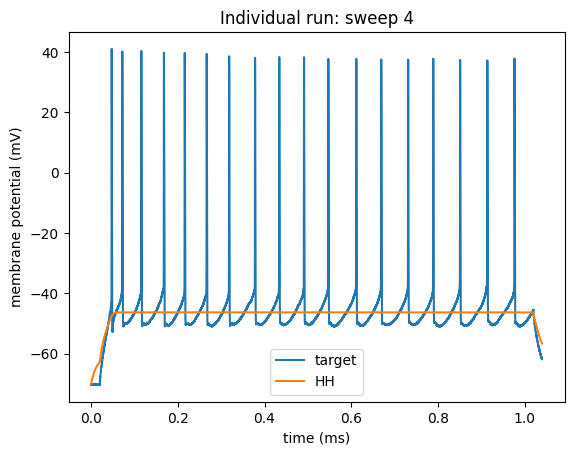

In [18]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_0[0]*1000, d2_title='HH')
title('Individual run: sweep 4')

In [ ]:
# ek experiment
# ek =-90
hh_sweep4_1 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-90)

first fit:
Round 0: Best parameters g_kd=1.29516837 uS, g_na=15.74348322 uS, gl=16.37145199 nS (error: 95.17180567 mV^2)
Round 1: Best parameters g_kd=0.94772745 uS, g_na=14.22264916 uS, gl=17.00738186 nS (error: 94.57512096 mV^2)
Round 2: Best parameters g_kd=0.89033438 uS, g_na=14.22264916 uS, gl=15.06081515 nS (error: 94.53963985 mV^2)
Round 3: Best parameters g_kd=0.70106545 uS, g_na=11.15178009 uS, gl=12.97791285 nS (error: 94.46288023 mV^2)
Round 4: Best parameters g_kd=0.68598924 uS, g_na=10.72935575 uS, gl=13.34752533 nS (error: 94.44195479 mV^2)
Round 5: Best parameters g_kd=0.64341927 uS, g_na=9.83194959 uS, gl=12.91574741 nS (error: 94.41237378 mV^2)
Round 6: Best parameters g_kd=0.59552738 uS, g_na=9.142383 uS, gl=12.48226786 nS (error: 94.39258639 mV^2)
Round 7: Best parameters g_kd=0.59552738 uS, g_na=9.142383 uS, gl=12.48226786 nS (error: 94.39258639 mV^2)
Round 8: Best parameters g_kd=0.54238956 uS, g_na=8.40103527 uS, gl=11.45561467 nS (error: 94.36020727 mV^2)
Round 9

Text(0.5, 1.0, 'Individual sweep 4: ek = -90')

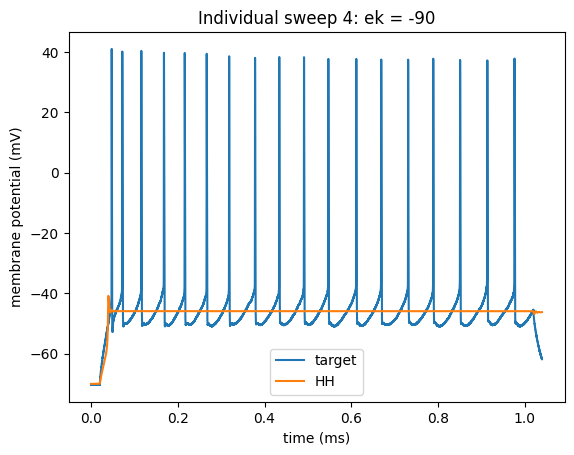

In [66]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_1[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -90')

In [67]:
# ek experiment
# ek = 50
hh_sweep4_2 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=50)

first fit:
Round 0: Best parameters g_kd=1.12676202 uS, g_na=5.7916253 uS, gl=29.92472814 nS (error: 376.79433198 mV^2)
Round 1: Best parameters g_kd=1.08991319 uS, g_na=5.46748325 uS, gl=29.6539788 nS (error: 376.69151105 mV^2)
Round 2: Best parameters g_kd=0.52044247 uS, g_na=4.52839397 uS, gl=27.427952 nS (error: 369.14776918 mV^2)
Round 3: Best parameters g_kd=0.63987177 uS, g_na=6.11320401 uS, gl=28.21812667 nS (error: 354.22640408 mV^2)
Round 4: Best parameters g_kd=0.63987177 uS, g_na=6.11320401 uS, gl=28.21812667 nS (error: 354.22640408 mV^2)
Round 5: Best parameters g_kd=0.47663654 uS, g_na=2.91533 uS, gl=24.54976293 nS (error: 332.03636387 mV^2)
Round 6: Best parameters g_kd=0.47663654 uS, g_na=2.91533 uS, gl=24.54976293 nS (error: 332.03636387 mV^2)
Round 7: Best parameters g_kd=0.47663654 uS, g_na=2.91533 uS, gl=24.54976293 nS (error: 332.03636387 mV^2)
Round 8: Best parameters g_kd=0.48428043 uS, g_na=2.17454871 uS, gl=23.82618196 nS (error: 329.94553403 mV^2)
Round 9: Bes

Text(0.5, 1.0, 'Individual sweep 4: ek = 50')

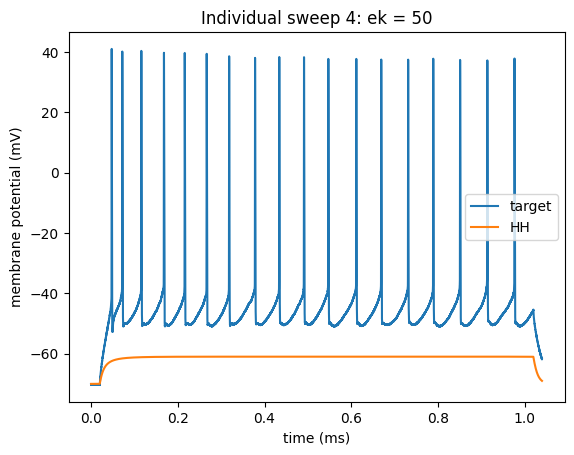

In [78]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_2[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = 50')

In [68]:
# ek experiment
# ek =-120
hh_sweep4_3 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-120)

first fit:
Round 0: Best parameters g_kd=0.85022908 uS, g_na=18.22361793 uS, gl=16.06663786 nS (error: 94.85874119 mV^2)
Round 1: Best parameters g_kd=0.67746964 uS, g_na=17.90425634 uS, gl=15.59155499 nS (error: 94.54470594 mV^2)
Round 2: Best parameters g_kd=0.73286869 uS, g_na=18.46410779 uS, gl=15.71009264 nS (error: 94.52518117 mV^2)
Round 3: Best parameters g_kd=0.6705242 uS, g_na=16.73838113 uS, gl=14.24432048 nS (error: 94.50976245 mV^2)
Round 4: Best parameters g_kd=0.6705242 uS, g_na=16.73838113 uS, gl=14.24432048 nS (error: 94.50976245 mV^2)
Round 5: Best parameters g_kd=0.6705242 uS, g_na=16.73838113 uS, gl=14.24432048 nS (error: 94.50976245 mV^2)
Round 6: Best parameters g_kd=0.60379514 uS, g_na=15.06866636 uS, gl=12.69853545 nS (error: 94.49371668 mV^2)
Round 7: Best parameters g_kd=0.43486574 uS, g_na=11.11232414 uS, gl=15.13626273 nS (error: 94.48599552 mV^2)
Round 8: Best parameters g_kd=0.38358192 uS, g_na=10.22995043 uS, gl=13.79640111 nS (error: 94.43366835 mV^2)
Ro

Text(0.5, 1.0, 'Individual sweep 4: ek = -120')

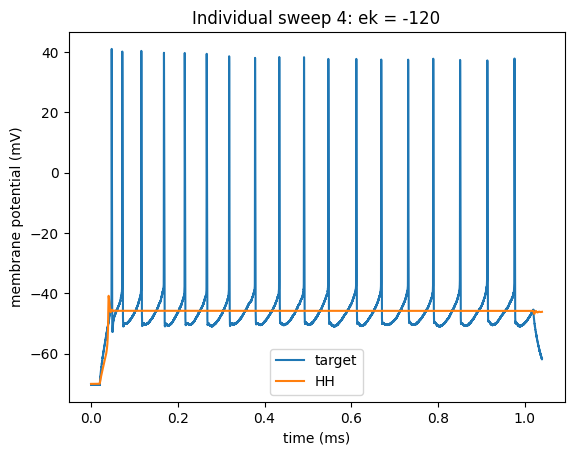

In [79]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_3[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -120')

In [69]:
# ek experiment
# ek =-110
hh_sweep4_4 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-110)

first fit:
Round 0: Best parameters g_kd=0.84140502 uS, g_na=15.48370617 uS, gl=13.95582329 nS (error: 94.84009611 mV^2)
Round 1: Best parameters g_kd=0.81603204 uS, g_na=17.66216942 uS, gl=13.32999505 nS (error: 94.51784201 mV^2)
Round 2: Best parameters g_kd=0.35320146 uS, g_na=8.78557491 uS, gl=11.74458388 nS (error: 94.46679495 mV^2)
Round 3: Best parameters g_kd=0.45143598 uS, g_na=10.09858695 uS, gl=11.78080645 nS (error: 94.41445055 mV^2)
Round 4: Best parameters g_kd=0.45143598 uS, g_na=10.09858695 uS, gl=11.78080645 nS (error: 94.41445055 mV^2)
Round 5: Best parameters g_kd=0.33966451 uS, g_na=7.2740376 uS, gl=11.21850899 nS (error: 94.3830323 mV^2)
Round 6: Best parameters g_kd=0.34659303 uS, g_na=7.44583627 uS, gl=10.79182097 nS (error: 94.3365997 mV^2)
Round 7: Best parameters g_kd=0.34659303 uS, g_na=7.44583627 uS, gl=10.79182097 nS (error: 94.3365997 mV^2)
Round 8: Best parameters g_kd=0.35523535 uS, g_na=7.69095394 uS, gl=10.57302929 nS (error: 94.32011438 mV^2)
Round 9:

Text(0.5, 1.0, 'Individual sweep 4: ek = -110')

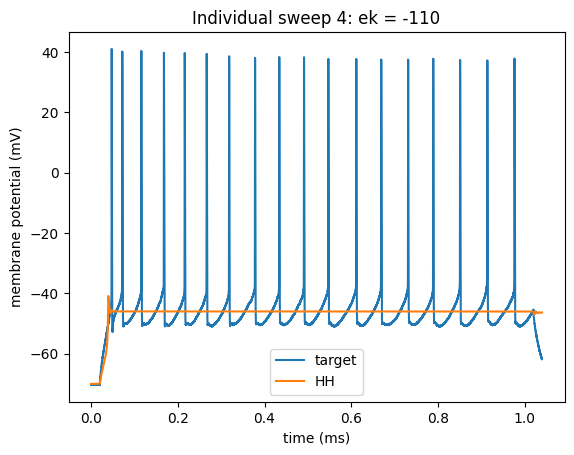

In [80]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_4[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -110')

In [70]:
# ek experiment
# ek =-100
hh_sweep4_5 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-100)

first fit:
Round 0: Best parameters g_kd=0.7019511 uS, g_na=14.50030585 uS, gl=18.66603686 nS (error: 94.66766831 mV^2)
Round 1: Best parameters g_kd=0.53800122 uS, g_na=10.41438437 uS, gl=15.06069327 nS (error: 94.51372941 mV^2)
Round 2: Best parameters g_kd=0.53800122 uS, g_na=10.81681693 uS, gl=13.32370449 nS (error: 94.46864135 mV^2)
Round 3: Best parameters g_kd=0.51215691 uS, g_na=9.1443905 uS, gl=13.22100734 nS (error: 94.45766044 mV^2)
Round 4: Best parameters g_kd=0.4352617 uS, g_na=7.92316153 uS, gl=11.8976382 nS (error: 94.39599497 mV^2)
Round 5: Best parameters g_kd=0.4352617 uS, g_na=7.92316153 uS, gl=11.8976382 nS (error: 94.39599497 mV^2)
Round 6: Best parameters g_kd=0.4352617 uS, g_na=7.92316153 uS, gl=11.38187164 nS (error: 94.35815559 mV^2)
Round 7: Best parameters g_kd=0.4352617 uS, g_na=7.92316153 uS, gl=11.38187164 nS (error: 94.35815559 mV^2)
Round 8: Best parameters g_kd=0.39403367 uS, g_na=7.48030902 uS, gl=10.7391308 nS (error: 94.33326549 mV^2)
Round 9: Best 

Text(0.5, 1.0, 'Individual sweep 4: ek = -100')

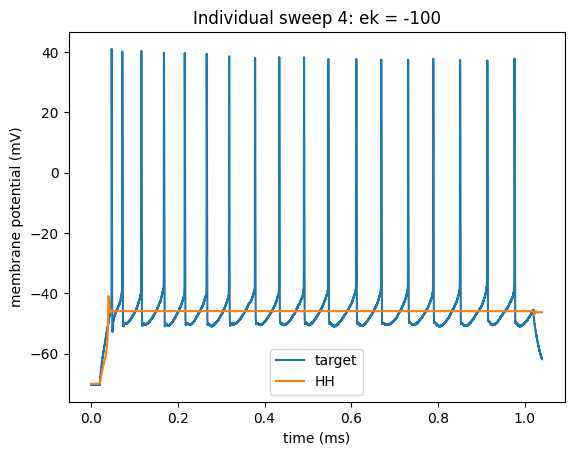

In [81]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_5[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -100')

In [71]:
# ek experiment
# ek =-80
hh_sweep4_6 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-80)

first fit:
Round 0: Best parameters g_kd=0.82534909 uS, g_na=10.90253927 uS, gl=15.92503495 nS (error: 94.60262977 mV^2)
Round 1: Best parameters g_kd=0.76386744 uS, g_na=9.26532737 uS, gl=14.05644555 nS (error: 94.48744913 mV^2)
Round 2: Best parameters g_kd=0.76386744 uS, g_na=9.26532737 uS, gl=14.05644555 nS (error: 94.48744913 mV^2)
Round 3: Best parameters g_kd=0.90900766 uS, g_na=10.95918817 uS, gl=13.98552275 nS (error: 94.45910381 mV^2)
Round 4: Best parameters g_kd=0.3362914 uS, g_na=4.07154064 uS, gl=12.53428552 nS (error: 94.35151171 mV^2)
Round 5: Best parameters g_kd=0.33001887 uS, g_na=3.90110321 uS, gl=11.9901725 nS (error: 94.28597682 mV^2)
Round 6: Best parameters g_kd=288.02504373 nS, g_na=3.95560856 uS, gl=11.95906034 nS (error: 94.21998126 mV^2)
Round 7: Best parameters g_kd=274.45260082 nS, g_na=3.68609174 uS, gl=11.55104177 nS (error: 94.16740851 mV^2)
Round 8: Best parameters g_kd=274.45260082 nS, g_na=3.68609174 uS, gl=11.55104177 nS (error: 94.16740851 mV^2)
Ro

Text(0.5, 1.0, 'Individual sweep 4: ek = -80')

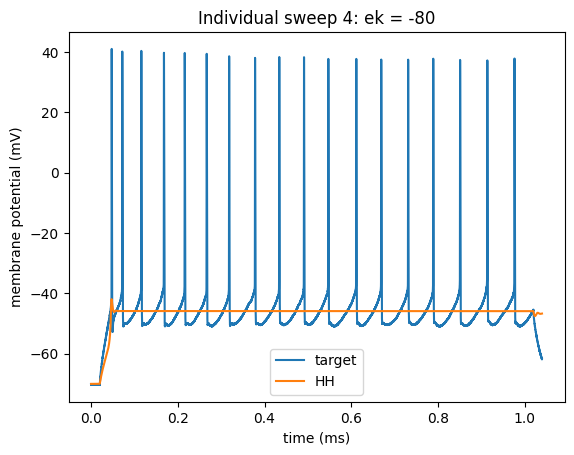

In [82]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_6[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -80')

In [72]:
# ek experiment
# ek =-70
hh_sweep4_7 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-70)

first fit:
Round 0: Best parameters g_kd=1.60462558 uS, g_na=13.12889125 uS, gl=14.11647019 nS (error: 94.50431514 mV^2)
Round 1: Best parameters g_kd=1.10806913 uS, g_na=9.05116574 uS, gl=13.3346714 nS (error: 94.45590398 mV^2)
Round 2: Best parameters g_kd=0.58501869 uS, g_na=5.25053873 uS, gl=13.49045993 nS (error: 94.45176669 mV^2)
Round 3: Best parameters g_kd=0.48229777 uS, g_na=4.69526141 uS, gl=13.48472502 nS (error: 94.38559205 mV^2)
Round 4: Best parameters g_kd=0.48229777 uS, g_na=4.69526141 uS, gl=12.25876165 nS (error: 94.38521471 mV^2)
Round 5: Best parameters g_kd=0.45126208 uS, g_na=4.0688292 uS, gl=11.79773489 nS (error: 94.23750785 mV^2)
Round 6: Best parameters g_kd=0.38265554 uS, g_na=3.63843317 uS, gl=11.45973928 nS (error: 94.17075767 mV^2)
Round 7: Best parameters g_kd=0.35364997 uS, g_na=3.48585296 uS, gl=11.21167837 nS (error: 94.16787042 mV^2)
Round 8: Best parameters g_kd=0.37889897 uS, g_na=3.34140598 uS, gl=11.0521325 nS (error: 94.14337678 mV^2)
Round 9: B

Text(0.5, 1.0, 'Individual sweep 4: ek = -70')

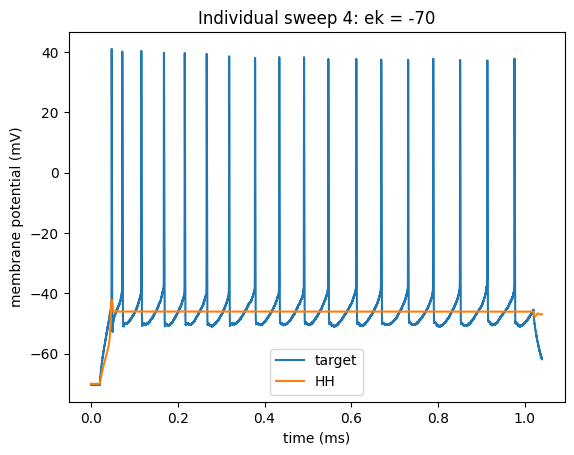

In [83]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_7[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -70')

In [73]:
# ek experiment
# ek =-60
hh_sweep4_8 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-60)

first fit:
Round 0: Best parameters g_kd=2.63670086 uS, g_na=12.21328736 uS, gl=15.56729925 nS (error: 94.56206922 mV^2)
Round 1: Best parameters g_kd=2.36787097 uS, g_na=11.19812184 uS, gl=12.68505418 nS (error: 94.45992176 mV^2)
Round 2: Best parameters g_kd=2.36787097 uS, g_na=11.19812184 uS, gl=12.68505418 nS (error: 94.45992176 mV^2)
Round 3: Best parameters g_kd=1.71695061 uS, g_na=9.05508584 uS, gl=11.5702072 nS (error: 94.43895644 mV^2)
Round 4: Best parameters g_kd=0.57842215 uS, g_na=3.5616357 uS, gl=11.57719045 nS (error: 94.28313412 mV^2)
Round 5: Best parameters g_kd=0.65996705 uS, g_na=3.753935 uS, gl=12.00339288 nS (error: 94.26017541 mV^2)
Round 6: Best parameters g_kd=0.65996705 uS, g_na=3.753935 uS, gl=12.00339288 nS (error: 94.26017541 mV^2)
Round 7: Best parameters g_kd=0.64398705 uS, g_na=3.54324237 uS, gl=11.5702072 nS (error: 94.20912407 mV^2)
Round 8: Best parameters g_kd=0.64398705 uS, g_na=3.54324237 uS, gl=11.5702072 nS (error: 94.20912407 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 4: ek = -60')

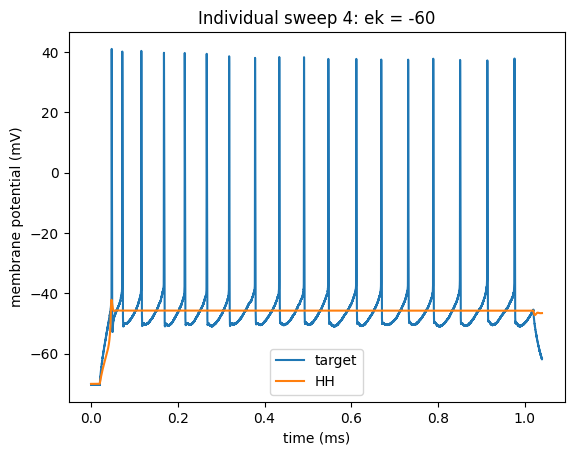

In [84]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_8[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -60')

In [74]:
# ek experiment
# ek =-50
hh_sweep4_9 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-50)

first fit:
Round 0: Best parameters g_kd=2.0599392 uS, g_na=4.43393122 uS, gl=13.79127988 nS (error: 94.70523364 mV^2)
Round 1: Best parameters g_kd=3.44363117 uS, g_na=6.16049661 uS, gl=12.54168348 nS (error: 94.53019966 mV^2)
Round 2: Best parameters g_kd=3.32005074 uS, g_na=4.86757597 uS, gl=11.51325364 nS (error: 94.41448503 mV^2)
Round 3: Best parameters g_kd=2.31592218 uS, g_na=3.24440993 uS, gl=11.4993187 nS (error: 94.40246784 mV^2)
Round 4: Best parameters g_kd=1.80710567 uS, g_na=3.18581981 uS, gl=10.82431175 nS (error: 94.32617434 mV^2)
Round 5: Best parameters g_kd=2.03250087 uS, g_na=2.80382995 uS, gl=10.76316595 nS (error: 94.32317537 mV^2)
Round 6: Best parameters g_kd=1.84749269 uS, g_na=2.97126093 uS, gl=10.73646978 nS (error: 94.26353881 mV^2)
Round 7: Best parameters g_kd=1.84749269 uS, g_na=2.97126093 uS, gl=10.73646978 nS (error: 94.26353881 mV^2)
Round 8: Best parameters g_kd=1.61918 uS, g_na=2.63517187 uS, gl=10.46620363 nS (error: 94.23397682 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 4: ek = -50')

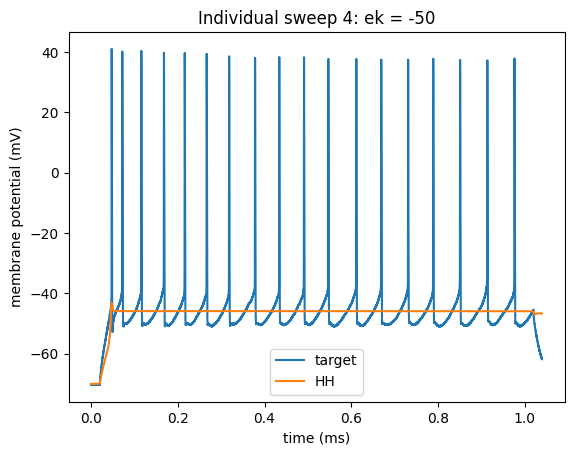

In [85]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_9[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -50')

In [75]:
# ek experiment
# ek =-40
hh_sweep4_10 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-40)

first fit:
Round 0: Best parameters g_kd=0.7480786 uS, g_na=5.29040984 uS, gl=21.74679206 nS (error: 117.75902662 mV^2)
Round 1: Best parameters g_kd=0.74796898 uS, g_na=3.53267746 uS, gl=18.2423704 nS (error: 115.6705145 mV^2)
Round 2: Best parameters g_kd=0.43459453 uS, g_na=2.77719918 uS, gl=16.5424315 nS (error: 112.13479518 mV^2)
Round 3: Best parameters g_kd=302.68648368 nS, g_na=2.39257678 uS, gl=15.03311151 nS (error: 110.461119 mV^2)
Round 4: Best parameters g_kd=188.07668046 nS, g_na=1.95682291 uS, gl=14.71332571 nS (error: 107.13125568 mV^2)
Round 5: Best parameters g_kd=166.27214143 nS, g_na=1.78975781 uS, gl=14.5523112 nS (error: 106.02664215 mV^2)
Round 6: Best parameters g_kd=131.82595612 nS, g_na=1.63857999 uS, gl=14.75196049 nS (error: 104.47806183 mV^2)
Round 7: Best parameters g_kd=114.47048546 nS, g_na=1.44392089 uS, gl=13.70740906 nS (error: 103.62496736 mV^2)
Round 8: Best parameters g_kd=97.81988546 nS, g_na=1.32754825 uS, gl=13.45843238 nS (error: 102.65493666 m

Text(0.5, 1.0, 'Individual sweep 4: ek = -40')

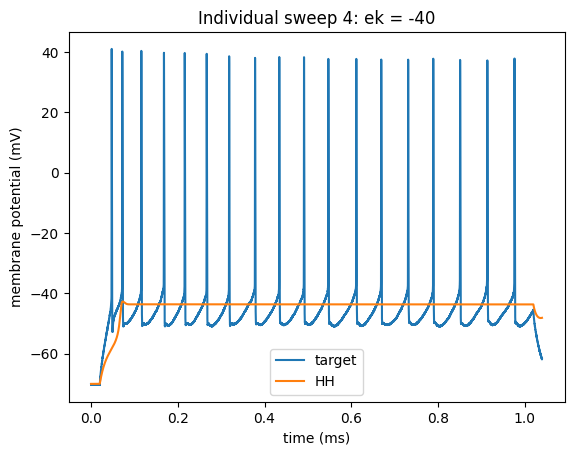

In [86]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_10[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -40')

In [76]:
# ek experiment
# ek =-30
hh_sweep4_11 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-30)

first fit:
Round 0: Best parameters g_kd=0.81585307 uS, g_na=16.48909483 uS, gl=24.38630477 nS (error: 148.31961554 mV^2)
Round 1: Best parameters g_kd=0.47803272 uS, g_na=17.34011558 uS, gl=25.18052129 nS (error: 131.99925681 mV^2)
Round 2: Best parameters g_kd=313.44736617 nS, g_na=16.48909483 uS, gl=24.38630477 nS (error: 126.72521536 mV^2)
Round 3: Best parameters g_kd=230.17311646 nS, g_na=18.594025 uS, gl=26.69200099 nS (error: 123.8166497 mV^2)
Round 4: Best parameters g_kd=191.18581681 nS, g_na=18.53655691 uS, gl=24.58732218 nS (error: 123.14878661 mV^2)
Round 5: Best parameters g_kd=121.62398828 nS, g_na=15.73402146 uS, gl=23.21922495 nS (error: 121.05488769 mV^2)
Round 6: Best parameters g_kd=87.5340859 nS, g_na=7.67461202 uS, gl=19.2747645 nS (error: 119.41670803 mV^2)
Round 7: Best parameters g_kd=98.46648221 nS, g_na=2.33424683 uS, gl=16.18763283 nS (error: 113.44827321 mV^2)
Round 8: Best parameters g_kd=71.82682954 nS, g_na=2.26056658 uS, gl=16.75595563 nS (error: 110.56

Text(0.5, 1.0, 'Individual sweep 4: ek = -30')

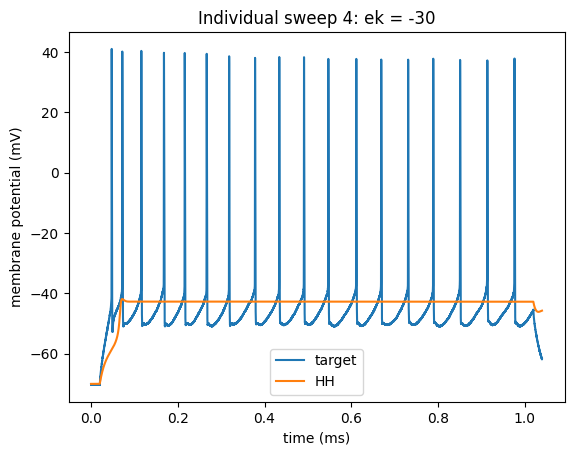

In [87]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_11[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -30')

In [77]:
# ek experiment
# ek =-20
hh_sweep4_12 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-20)

first fit:
Round 0: Best parameters g_kd=0.48869823 uS, g_na=13.06241553 uS, gl=23.50355794 nS (error: 206.62463113 mV^2)
Round 1: Best parameters g_kd=285.31688353 nS, g_na=16.58054989 uS, gl=26.86722249 nS (error: 138.31725416 mV^2)
Round 2: Best parameters g_kd=216.9637567 nS, g_na=18.37275207 uS, gl=25.77946558 nS (error: 130.05179984 mV^2)
Round 3: Best parameters g_kd=139.52340763 nS, g_na=17.52131386 uS, gl=27.54240127 nS (error: 127.24409269 mV^2)
Round 4: Best parameters g_kd=103.24576328 nS, g_na=12.69093795 uS, gl=22.97814082 nS (error: 123.31937416 mV^2)
Round 5: Best parameters g_kd=87.06053037 nS, g_na=4.10892964 uS, gl=20.19872363 nS (error: 121.52930687 mV^2)
Round 6: Best parameters g_kd=76.05594547 nS, g_na=2.4092018 uS, gl=19.00808214 nS (error: 118.84840235 mV^2)
Round 7: Best parameters g_kd=59.43271761 nS, g_na=1.72130537 uS, gl=17.35019544 nS (error: 112.78389254 mV^2)
Round 8: Best parameters g_kd=47.77667548 nS, g_na=1.51955026 uS, gl=15.44851895 nS (error: 110

Text(0.5, 1.0, 'Individual sweep 4: ek = -20')

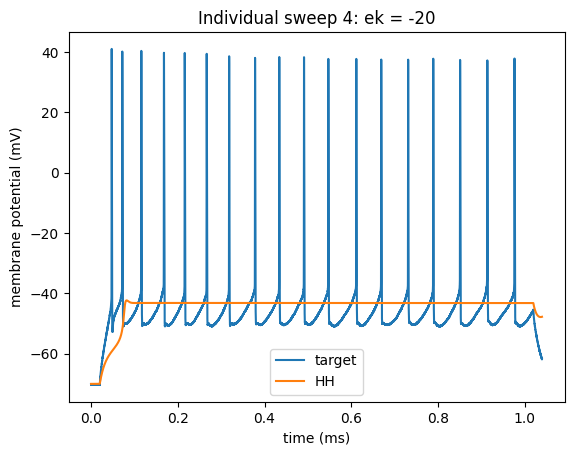

In [88]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_12[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -20')

In [89]:
# ek experiment
# ek =-130
hh_sweep4_13 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-130)

first fit:
Round 0: Best parameters g_kd=0.70049194 uS, g_na=16.65988451 uS, gl=19.48496974 nS (error: 97.31198438 mV^2)
Round 1: Best parameters g_kd=0.50939036 uS, g_na=13.40593189 uS, gl=15.21481745 nS (error: 94.6539459 mV^2)
Round 2: Best parameters g_kd=294.57357714 nS, g_na=9.46345949 uS, gl=13.08203079 nS (error: 94.46451438 mV^2)
Round 3: Best parameters g_kd=294.57357714 nS, g_na=9.46345949 uS, gl=13.08203079 nS (error: 94.46451438 mV^2)
Round 4: Best parameters g_kd=294.57357714 nS, g_na=9.46345949 uS, gl=13.08203079 nS (error: 94.46451438 mV^2)
Round 5: Best parameters g_kd=0.38878441 uS, g_na=11.18757679 uS, gl=13.66311644 nS (error: 94.44824363 mV^2)
Round 6: Best parameters g_kd=0.38878441 uS, g_na=11.18757679 uS, gl=13.66311644 nS (error: 94.44824363 mV^2)
Round 7: Best parameters g_kd=0.34377946 uS, g_na=9.46345949 uS, gl=13.08203079 nS (error: 94.43500075 mV^2)
Round 8: Best parameters g_kd=0.34377946 uS, g_na=9.46345949 uS, gl=13.08203079 nS (error: 94.43500075 mV^2)

Text(0.5, 1.0, 'Individual sweep 4: ek = -130')

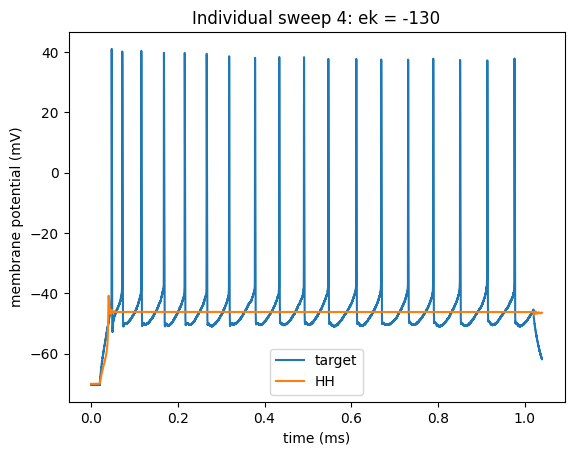

In [90]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_13[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -130')

In [91]:
# ek experiment
# ek = -140
hh_sweep4_14 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-140)

first fit:
Round 0: Best parameters g_kd=0.9049055 uS, g_na=17.40981464 uS, gl=13.06931585 nS (error: 208.1109415 mV^2)
Round 1: Best parameters g_kd=0.51201202 uS, g_na=17.75383247 uS, gl=14.1118461 nS (error: 94.57783858 mV^2)
Round 2: Best parameters g_kd=0.45985584 uS, g_na=14.74337234 uS, gl=12.34653278 nS (error: 94.49157317 mV^2)
Round 3: Best parameters g_kd=0.45985584 uS, g_na=14.74337234 uS, gl=12.34653278 nS (error: 94.49157317 mV^2)
Round 4: Best parameters g_kd=262.38620021 nS, g_na=7.78859332 uS, gl=11.41531821 nS (error: 94.42892344 mV^2)
Round 5: Best parameters g_kd=256.12804445 nS, g_na=8.92827326 uS, gl=12.47768182 nS (error: 94.41231465 mV^2)
Round 6: Best parameters g_kd=265.84119991 nS, g_na=8.57344759 uS, gl=11.37784516 nS (error: 94.34254807 mV^2)
Round 7: Best parameters g_kd=265.84119991 nS, g_na=8.57344759 uS, gl=11.37784516 nS (error: 94.34254807 mV^2)
Round 8: Best parameters g_kd=265.84119991 nS, g_na=8.57344759 uS, gl=11.37784516 nS (error: 94.34254807 mV

Text(0.5, 1.0, 'Individual sweep 4: ek = -140')

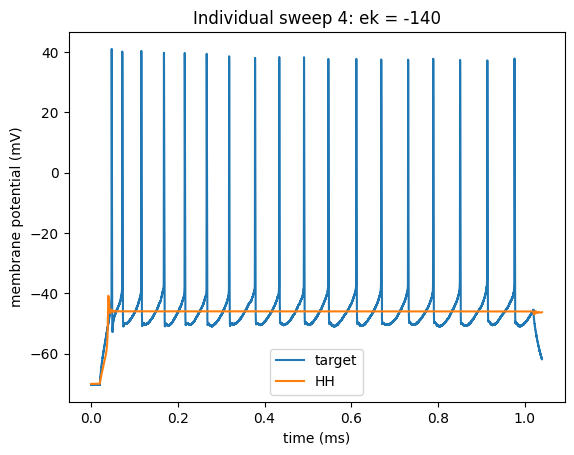

In [92]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_14[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -140')

In [93]:
# ek experiment
# ek =-150
hh_sweep4_15 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-150)

first fit:
Round 0: Best parameters g_kd=0.51225489 uS, g_na=13.43041498 uS, gl=22.02727847 nS (error: 128.90917202 mV^2)
Round 1: Best parameters g_kd=0.41745975 uS, g_na=18.10797708 uS, gl=20.00459079 nS (error: 94.84235398 mV^2)
Round 2: Best parameters g_kd=0.50011064 uS, g_na=17.84601923 uS, gl=16.57108877 nS (error: 94.58025779 mV^2)
Round 3: Best parameters g_kd=0.48022259 uS, g_na=15.9122843 uS, gl=13.52671814 nS (error: 94.53712934 mV^2)
Round 4: Best parameters g_kd=0.48817907 uS, g_na=16.78714541 uS, gl=12.28368091 nS (error: 94.49593934 mV^2)
Round 5: Best parameters g_kd=0.48817907 uS, g_na=16.78714541 uS, gl=13.05138783 nS (error: 94.48900559 mV^2)
Round 6: Best parameters g_kd=0.46019689 uS, g_na=15.65269299 uS, gl=11.82648725 nS (error: 94.48086562 mV^2)
Round 7: Best parameters g_kd=0.46019689 uS, g_na=15.65269299 uS, gl=11.82648725 nS (error: 94.48086562 mV^2)
Round 8: Best parameters g_kd=0.46019689 uS, g_na=15.65269299 uS, gl=11.82648725 nS (error: 94.48086562 mV^2)

Text(0.5, 1.0, 'Individual sweep 4: ek = -150')

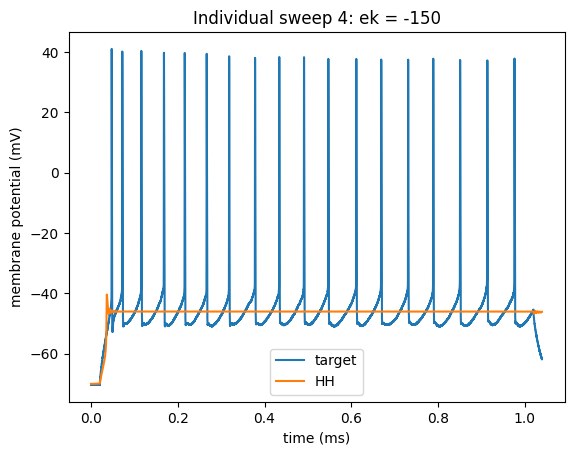

In [94]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_15[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -150')

In [95]:
# ek experiment
# ek =-160
hh_sweep4_16 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, ek=-160)

first fit:
Round 0: Best parameters g_kd=1.95902974 uS, g_na=9.771925 uS, gl=15.16159089 nS (error: 233.56152627 mV^2)
Round 1: Best parameters g_kd=0.35201713 uS, g_na=14.25602118 uS, gl=14.73089508 nS (error: 94.5443987 mV^2)
Round 2: Best parameters g_kd=252.05744215 nS, g_na=9.32264895 uS, gl=12.89003909 nS (error: 94.43304255 mV^2)
Round 3: Best parameters g_kd=252.05744215 nS, g_na=9.32264895 uS, gl=12.89003909 nS (error: 94.43304255 mV^2)
Round 4: Best parameters g_kd=204.60990695 nS, g_na=8.25721902 uS, gl=11.56224996 nS (error: 94.35201694 mV^2)
Round 5: Best parameters g_kd=204.60990695 nS, g_na=8.25721902 uS, gl=11.56224996 nS (error: 94.35201694 mV^2)
Round 6: Best parameters g_kd=211.48893357 nS, g_na=8.18572319 uS, gl=11.20179877 nS (error: 94.33273143 mV^2)
Round 7: Best parameters g_kd=211.48893357 nS, g_na=8.18572319 uS, gl=11.20179877 nS (error: 94.33273143 mV^2)
Round 8: Best parameters g_kd=211.48893357 nS, g_na=8.18572319 uS, gl=11.20179877 nS (error: 94.33273143 m

Text(0.5, 1.0, 'Individual sweep 4: ek = -160')

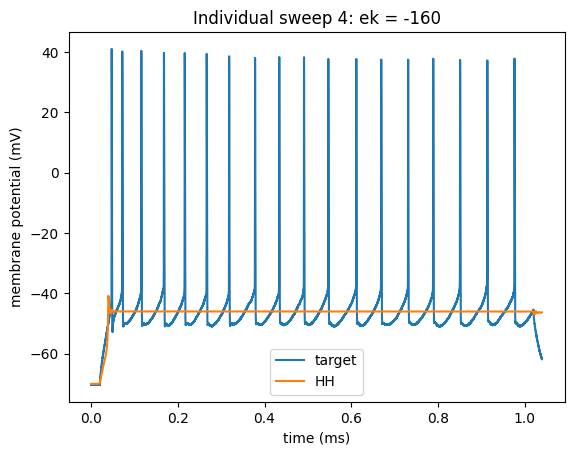

In [96]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_16[0]*1000, d2_title='HH')
title('Individual sweep 4: ek = -160')

In [101]:
# cm experiment
# cm = 80
# keep ek =-70
hh_sweep4_17 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70)

first fit:
Round 0: Best parameters g_kd=1.68249721 uS, g_na=16.8191396 uS, gl=29.89961212 nS (error: 94.53636164 mV^2)
Round 1: Best parameters g_kd=1.04905906 uS, g_na=9.25625729 uS, gl=23.99970179 nS (error: 94.46790965 mV^2)
Round 2: Best parameters g_kd=0.69035995 uS, g_na=7.66713671 uS, gl=22.32886107 nS (error: 94.33296945 mV^2)
Round 3: Best parameters g_kd=0.3629446 uS, g_na=3.92654796 uS, gl=17.53923972 nS (error: 94.13943502 mV^2)
Round 4: Best parameters g_kd=227.17628457 nS, g_na=2.43992683 uS, gl=14.72881114 nS (error: 92.91502139 mV^2)
Round 5: Best parameters g_kd=196.07719473 nS, g_na=2.36906165 uS, gl=14.6460706 nS (error: 92.60980551 mV^2)
Round 6: Best parameters g_kd=169.82169707 nS, g_na=2.16242797 uS, gl=13.44509868 nS (error: 92.43334364 mV^2)
Round 7: Best parameters g_kd=146.46192268 nS, g_na=2.07720087 uS, gl=13.14663624 nS (error: 92.37477223 mV^2)
Round 8: Best parameters g_kd=233.99470966 nS, g_na=2.98046819 uS, gl=17.20006622 nS (error: 92.3089365 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 4: cm=80')

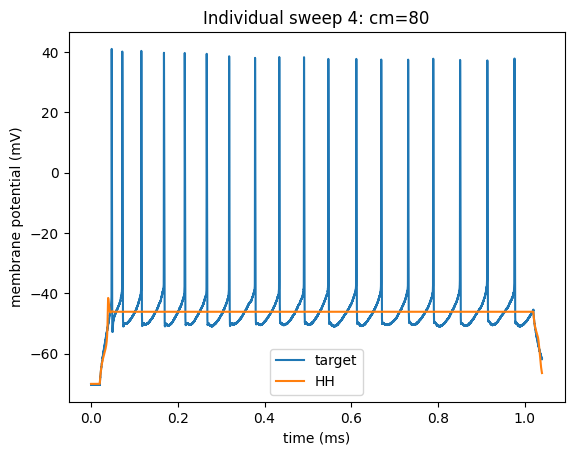

In [102]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_17[0]*1000, d2_title='HH')
title('Individual sweep 4: cm=80')

In [98]:
# cm experiment
# cm = 300

hh_sweep4_18 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 300, ek=-70)

first fit:
Round 0: Best parameters g_kd=1.59484104 uS, g_na=12.00613957 uS, gl=13.9494411 nS (error: 95.66453719 mV^2)
Round 1: Best parameters g_kd=2.11635582 uS, g_na=15.25121663 uS, gl=14.00227975 nS (error: 95.39268029 mV^2)
Round 2: Best parameters g_kd=1.59484104 uS, g_na=12.00613957 uS, gl=12.40909835 nS (error: 95.14688175 mV^2)
Round 3: Best parameters g_kd=2.10373827 uS, g_na=17.18226039 uS, gl=12.02195806 nS (error: 95.07916028 mV^2)
Round 4: Best parameters g_kd=2.19723198 uS, g_na=17.05679251 uS, gl=11.44704016 nS (error: 95.04088052 mV^2)
Round 5: Best parameters g_kd=2.55880566 uS, g_na=18.68632835 uS, gl=11.16530461 nS (error: 94.9598427 mV^2)
Round 6: Best parameters g_kd=2.38842037 uS, g_na=18.59899775 uS, gl=11.06399347 nS (error: 94.89527029 mV^2)
Round 7: Best parameters g_kd=2.43456954 uS, g_na=19.12356898 uS, gl=10.74849092 nS (error: 94.84166866 mV^2)
Round 8: Best parameters g_kd=2.42548938 uS, g_na=18.98961383 uS, gl=10.66234862 nS (error: 94.84071593 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 4: cm=300')

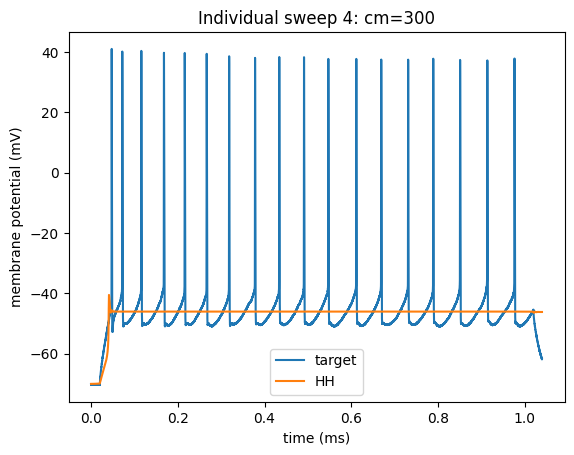

In [99]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_18[0]*1000, d2_title='HH')
title('Individual sweep 4: cm=300')

### oops

In [103]:
# cm experiment
# cm = 40

hh_sweep4_19 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 300, ek=40)

first fit:
Round 0: Best parameters g_kd=1.01348396 uS, g_na=9.38390358 uS, gl=32.01830024 nS (error: 389.90213473 mV^2)
Round 1: Best parameters g_kd=0.75791039 uS, g_na=6.44209837 uS, gl=28.89215731 nS (error: 366.62306828 mV^2)
Round 2: Best parameters g_kd=0.75791039 uS, g_na=6.44209837 uS, gl=28.89215731 nS (error: 366.62306828 mV^2)
Round 3: Best parameters g_kd=0.75791039 uS, g_na=6.44209837 uS, gl=28.89215731 nS (error: 366.62306828 mV^2)
Round 4: Best parameters g_kd=0.39625811 uS, g_na=3.88380457 uS, gl=25.14788981 nS (error: 338.53020689 mV^2)
Round 5: Best parameters g_kd=0.39625811 uS, g_na=3.88380457 uS, gl=25.14788981 nS (error: 338.53020689 mV^2)
Round 6: Best parameters g_kd=0.38109791 uS, g_na=3.09439752 uS, gl=23.98294453 nS (error: 324.30024455 mV^2)
Round 7: Best parameters g_kd=0.39589508 uS, g_na=2.77674327 uS, gl=23.55445154 nS (error: 316.4806272 mV^2)
Round 8: Best parameters g_kd=0.39589508 uS, g_na=2.77674327 uS, gl=23.55445154 nS (error: 316.4806272 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 4: cm=40')

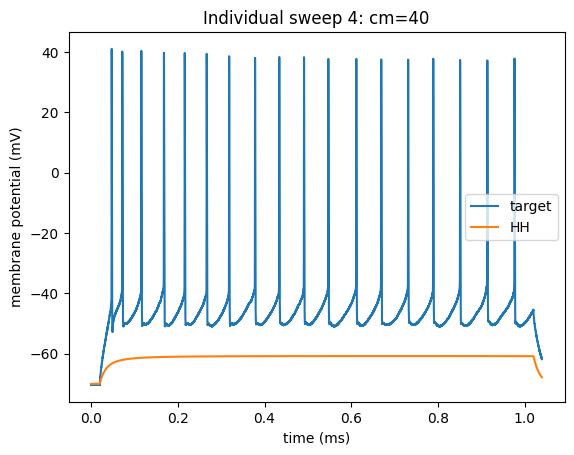

In [104]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_19[0]*1000, d2_title='HH')
title('Individual sweep 4: cm=40')

In [105]:
# ena experiment
# ena=40

hh_sweep4_20 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=80, ek=40, ena=40)

first fit:
Round 0: Best parameters g_kd=0.48469719 uS, g_na=14.59081209 uS, gl=26.58254062 nS (error: 6397.32687515 mV^2)
Round 1: Best parameters g_kd=0.3609658 uS, g_na=10.04299953 uS, gl=35.44939276 nS (error: 5710.00145185 mV^2)
Round 2: Best parameters g_kd=0.67818321 uS, g_na=4.12511922 uS, gl=36.06117883 nS (error: 397.27795928 mV^2)
Round 3: Best parameters g_kd=0.67818321 uS, g_na=4.12511922 uS, gl=36.06117883 nS (error: 397.27795928 mV^2)
Round 4: Best parameters g_kd=0.39158509 uS, g_na=2.37629536 uS, gl=31.86948425 nS (error: 395.31588246 mV^2)
Round 5: Best parameters g_kd=0.39158509 uS, g_na=2.37629536 uS, gl=31.86948425 nS (error: 395.31588246 mV^2)
Round 6: Best parameters g_kd=0.44034324 uS, g_na=1.656227 uS, gl=28.93359503 nS (error: 367.23689923 mV^2)
Round 7: Best parameters g_kd=0.44034324 uS, g_na=1.656227 uS, gl=28.93359503 nS (error: 367.23689923 mV^2)
Round 8: Best parameters g_kd=0.44034324 uS, g_na=1.656227 uS, gl=28.93359503 nS (error: 367.23689923 mV^2)
Ro

In [106]:
# cm experiment again.  accidental typo above...
# cm = 40

hh_sweep4_21 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 40, ek=-70)

first fit:
Round 0: Best parameters g_kd=0.70652525 uS, g_na=7.60991741 uS, gl=22.9458716 nS (error: 95.12455425 mV^2)
Round 1: Best parameters g_kd=1.18872539 uS, g_na=11.47688858 uS, gl=27.99426829 nS (error: 94.67110565 mV^2)
Round 2: Best parameters g_kd=1.18872539 uS, g_na=11.47688858 uS, gl=27.99426829 nS (error: 94.67110565 mV^2)
Round 3: Best parameters g_kd=1.18872539 uS, g_na=11.47688858 uS, gl=27.99426829 nS (error: 94.67110565 mV^2)
Round 4: Best parameters g_kd=1.16101616 uS, g_na=9.28556608 uS, gl=25.31201856 nS (error: 94.21209955 mV^2)
Round 5: Best parameters g_kd=1.16101616 uS, g_na=9.28556608 uS, gl=25.31201856 nS (error: 94.21209955 mV^2)
Round 6: Best parameters g_kd=1.00191013 uS, g_na=8.52688672 uS, gl=26.44061451 nS (error: 93.7918659 mV^2)
Round 7: Best parameters g_kd=1.00191013 uS, g_na=8.52688672 uS, gl=26.44061451 nS (error: 93.7918659 mV^2)
Round 8: Best parameters g_kd=1.00191013 uS, g_na=8.52688672 uS, gl=26.44061451 nS (error: 93.7918659 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 4: cm=40')

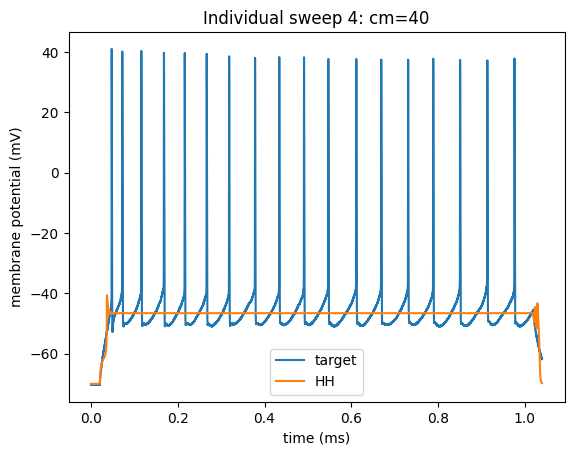

In [107]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_21[0]*1000, d2_title='HH')
title('Individual sweep 4: cm=40')

In [108]:
# cm experiment again.  accidental typo above...
# cm = 60

hh_sweep4_22 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 60, ek=-70)

first fit:
Round 0: Best parameters g_kd=1.62813897 uS, g_na=15.94687855 uS, gl=30.75083926 nS (error: 94.50628342 mV^2)
Round 1: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 2: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 3: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 4: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 5: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 6: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 7: Best parameters g_kd=2.28152441 uS, g_na=15.47463345 uS, gl=29.51715211 nS (error: 94.35889397 mV^2)
Round 8: Best parameters g_kd=0.75885955 uS, g_na=6.28418324 uS, gl=22.79674372 nS (error: 94.23708337 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: cm=60')

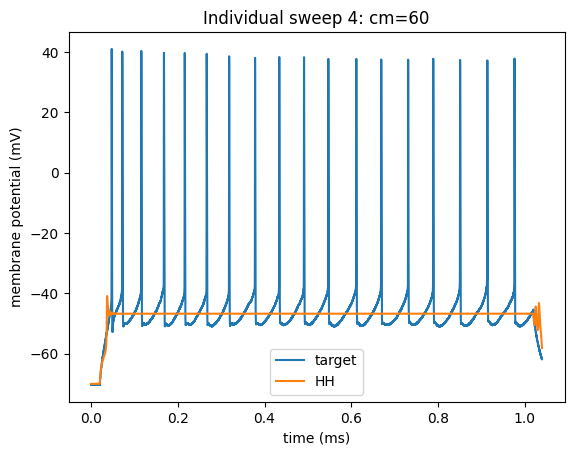

In [109]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_22[0]*1000, d2_title='HH')
title('Individual sweep 4: cm=60')

In [110]:
# ena experiment
# ena = 50

hh_sweep4_23 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=50)

first fit:
Round 0: Best parameters g_kd=0.39469812 uS, g_na=5.44608321 uS, gl=29.45754895 nS (error: 304.24525567 mV^2)
Round 1: Best parameters g_kd=0.34784599 uS, g_na=3.9091263 uS, gl=17.51999203 nS (error: 288.54413318 mV^2)
Round 2: Best parameters g_kd=224.42375924 nS, g_na=2.36508248 uS, gl=20.09624457 nS (error: 262.68657781 mV^2)
Round 3: Best parameters g_kd=206.35967642 nS, g_na=2.15580459 uS, gl=26.65019223 nS (error: 251.34398271 mV^2)
Round 4: Best parameters g_kd=252.91872241 nS, g_na=1.84854529 uS, gl=14.02630794 nS (error: 236.38325061 mV^2)
Round 5: Best parameters g_kd=182.78714129 nS, g_na=1.53213291 uS, gl=23.66925201 nS (error: 226.84756852 mV^2)
Round 6: Best parameters g_kd=223.8527413 nS, g_na=1.40735162 uS, gl=13.20326121 nS (error: 218.5118069 mV^2)
Round 7: Best parameters g_kd=223.8527413 nS, g_na=1.40735162 uS, gl=13.20326121 nS (error: 218.5118069 mV^2)
Round 8: Best parameters g_kd=220.63548801 nS, g_na=1.36203028 uS, gl=12.06206266 nS (error: 217.05300

Text(0.5, 1.0, 'Individual sweep 4: ena=50')

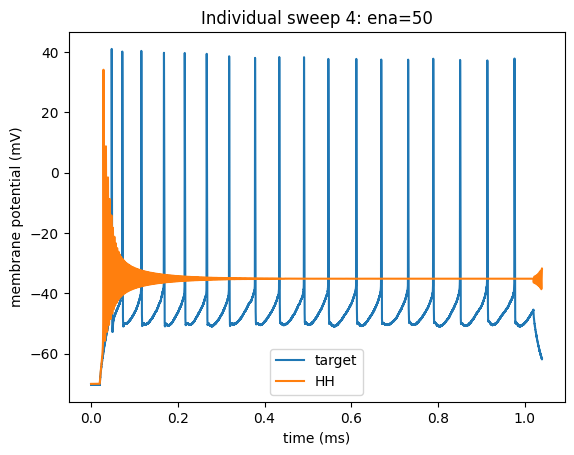

In [111]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_23[0]*1000, d2_title='HH')
title('Individual sweep 4: ena=50')

In [112]:
# ena experiment
# ena = -100

hh_sweep4_24 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=-100)

first fit:
Round 0: Best parameters g_kd=3.40634027 uS, g_na=6.48189001 uS, gl=13.47133074 nS (error: 354.84400318 mV^2)
Round 1: Best parameters g_kd=3.63137808 uS, g_na=2.38470895 uS, gl=12.94865904 nS (error: 317.42984842 mV^2)
Round 2: Best parameters g_kd=0.48953064 uS, g_na=2.25282844 uS, gl=12.01249671 nS (error: 300.92734485 mV^2)
Round 3: Best parameters g_kd=1.28355156 uS, g_na=1.88071418 uS, gl=11.25938202 nS (error: 291.99058118 mV^2)
Round 4: Best parameters g_kd=225.49420676 nS, g_na=1.71996386 uS, gl=11.0620482 nS (error: 282.9543961 mV^2)
Round 5: Best parameters g_kd=0.39945076 uS, g_na=1.45970763 uS, gl=10.98521692 nS (error: 277.02721751 mV^2)
Round 6: Best parameters g_kd=182.29486254 nS, g_na=1.37259031 uS, gl=10.7806547 nS (error: 271.98280675 mV^2)
Round 7: Best parameters g_kd=137.05625544 nS, g_na=1.27035254 uS, gl=10.75196395 nS (error: 268.53810448 mV^2)
Round 8: Best parameters g_kd=252.10738012 nS, g_na=1.2378599 uS, gl=10.60666344 nS (error: 267.1962958 mV

Text(0.5, 1.0, 'Individual sweep 4: ena=-100')

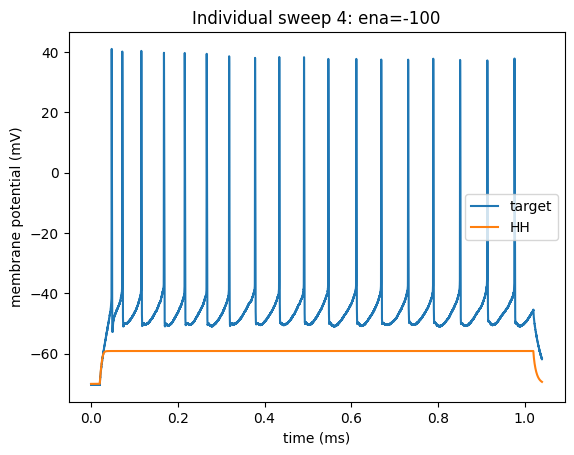

In [113]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_24[0]*1000, d2_title='HH')
title('Individual sweep 4: ena=-100')

In [114]:
# ena experiment
# ena = 0

hh_sweep4_25 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=0)

first fit:
Round 0: Best parameters g_kd=0.5786217 uS, g_na=9.85750414 uS, gl=28.62545742 nS (error: 220.96141267 mV^2)
Round 1: Best parameters g_kd=0.42426686 uS, g_na=6.36820209 uS, gl=21.81299915 nS (error: 210.47704432 mV^2)
Round 2: Best parameters g_kd=308.55364199 nS, g_na=4.62404865 uS, gl=25.21368566 nS (error: 199.18076531 mV^2)
Round 3: Best parameters g_kd=241.84980719 nS, g_na=2.93687246 uS, gl=17.37991372 nS (error: 187.26999958 mV^2)
Round 4: Best parameters g_kd=234.08454451 nS, g_na=2.87105187 uS, gl=22.16502272 nS (error: 186.14267922 mV^2)
Round 5: Best parameters g_kd=191.27842345 nS, g_na=1.98552474 uS, gl=15.68548983 nS (error: 172.4705716 mV^2)
Round 6: Best parameters g_kd=192.32027568 nS, g_na=1.73241308 uS, gl=15.74119353 nS (error: 160.85181911 mV^2)
Round 7: Best parameters g_kd=192.32027568 nS, g_na=1.73241308 uS, gl=15.74119353 nS (error: 160.85181911 mV^2)
Round 8: Best parameters g_kd=192.32027568 nS, g_na=1.73241308 uS, gl=15.74119353 nS (error: 160.85

Text(0.5, 1.0, 'Individual sweep 4: ena=0')

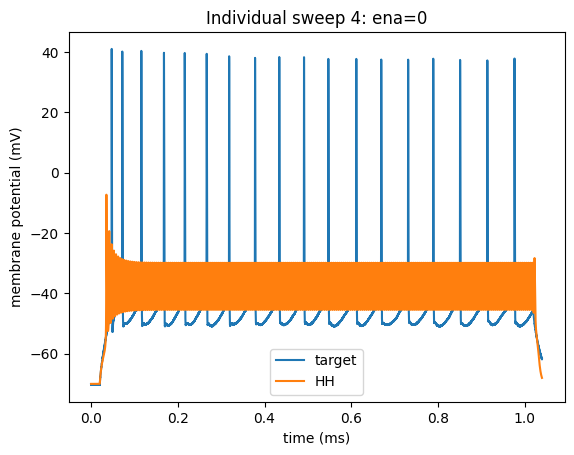

In [115]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_25[0]*1000, d2_title='HH')
title('Individual sweep 4: ena=0')

In [116]:
# ena experiment
# ena = -20

hh_sweep4_26 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=-20)

first fit:
Round 0: Best parameters g_kd=0.87882023 uS, g_na=14.42972138 uS, gl=28.10998005 nS (error: 160.20223933 mV^2)
Round 1: Best parameters g_kd=0.47697812 uS, g_na=7.61361768 uS, gl=19.590371 nS (error: 158.19027368 mV^2)
Round 2: Best parameters g_kd=252.83976527 nS, g_na=3.29857341 uS, gl=12.69379336 nS (error: 146.92641418 mV^2)
Round 3: Best parameters g_kd=260.57737972 nS, g_na=2.29191364 uS, gl=12.51257431 nS (error: 133.53777618 mV^2)
Round 4: Best parameters g_kd=223.91394735 nS, g_na=1.96838634 uS, gl=13.21386045 nS (error: 123.48566916 mV^2)
Round 5: Best parameters g_kd=191.29654978 nS, g_na=1.84716304 uS, gl=16.66147079 nS (error: 123.19000027 mV^2)
Round 6: Best parameters g_kd=158.07643636 nS, g_na=1.47351739 uS, gl=15.94330316 nS (error: 118.74352678 mV^2)
Round 7: Best parameters g_kd=189.24919566 nS, g_na=1.58035784 uS, gl=14.9397788 nS (error: 117.30751829 mV^2)
Round 8: Best parameters g_kd=174.24112628 nS, g_na=1.72357519 uS, gl=18.5988314 nS (error: 115.156

Text(0.5, 1.0, 'Individual sweep 4: ena=-20')

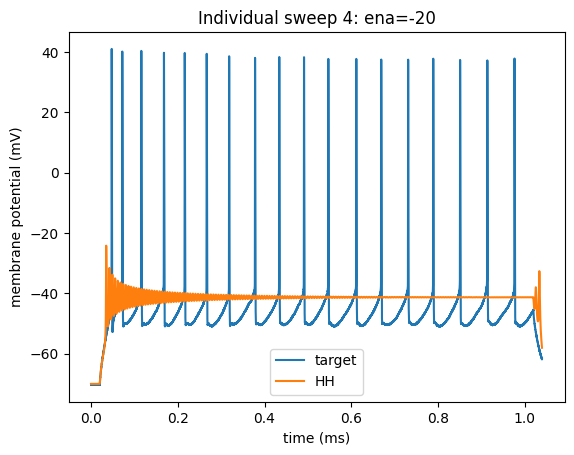

In [117]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_26[0]*1000, d2_title='HH')
title('Individual sweep 4: ena=-20')

In [118]:
# ena experiment
# ena = -170

hh_sweep4_27 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=-170)

first fit:
Round 0: Best parameters g_kd=1.80590556 uS, g_na=5.737935 uS, gl=15.44268414 nS (error: 402.4851276 mV^2)
Round 1: Best parameters g_kd=2.70809897 uS, g_na=3.6854356 uS, gl=14.44466118 nS (error: 379.17865767 mV^2)
Round 2: Best parameters g_kd=2.27404073 uS, g_na=2.34976381 uS, gl=13.43694507 nS (error: 354.99091831 mV^2)
Round 3: Best parameters g_kd=3.02706352 uS, g_na=1.90572819 uS, gl=12.24809726 nS (error: 341.06964774 mV^2)
Round 4: Best parameters g_kd=2.94178401 uS, g_na=1.64660211 uS, gl=11.72676982 nS (error: 332.28528259 mV^2)
Round 5: Best parameters g_kd=2.77035641 uS, g_na=1.41525324 uS, gl=11.40635596 nS (error: 324.23164314 mV^2)
Round 6: Best parameters g_kd=1.21488193 uS, g_na=1.35072557 uS, gl=11.14862311 nS (error: 317.94744485 mV^2)
Round 7: Best parameters g_kd=0.41248789 uS, g_na=1.24398665 uS, gl=11.21173762 nS (error: 313.06154788 mV^2)
Round 8: Best parameters g_kd=247.81031266 nS, g_na=1.23601653 uS, gl=10.79463963 nS (error: 309.91582895 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 4: ena=-170')

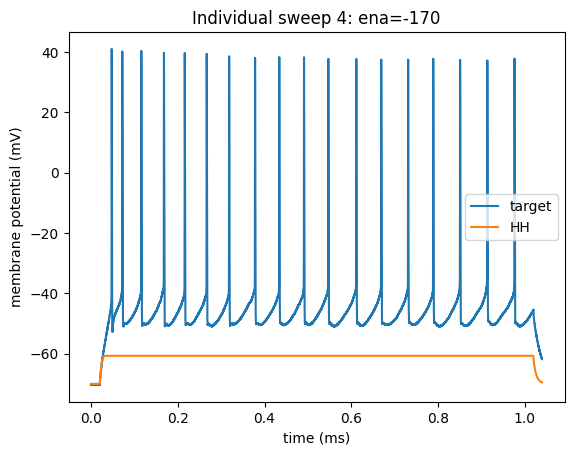

In [119]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_27[0]*1000, d2_title='HH')
title('Individual sweep 4: ena=-170')

In [120]:
# keep ena=50
# vt=-50

hh_sweep4_28 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=50, vt=-50)

first fit:
Round 0: Best parameters g_kd=1.37366923 uS, g_na=8.1521331 uS, gl=13.0373889 nS (error: 213.57710008 mV^2)
Round 1: Best parameters g_kd=0.47345333 uS, g_na=9.97801642 uS, gl=12.13496544 nS (error: 193.5848513 mV^2)
Round 2: Best parameters g_kd=3.22901882 uS, g_na=12.04462904 uS, gl=11.15303062 nS (error: 170.64817022 mV^2)
Round 3: Best parameters g_kd=1.5770552 uS, g_na=12.94035651 uS, gl=10.81306715 nS (error: 162.45457243 mV^2)
Round 4: Best parameters g_kd=1.72748799 uS, g_na=16.54122206 uS, gl=10.49547248 nS (error: 154.58169758 mV^2)
Round 5: Best parameters g_kd=3.69669957 uS, g_na=8.99564469 uS, gl=10.38993318 nS (error: 152.3766203 mV^2)
Round 6: Best parameters g_kd=3.47581717 uS, g_na=17.96358397 uS, gl=10.28846159 nS (error: 149.4184741 mV^2)
Round 7: Best parameters g_kd=0.83197615 uS, g_na=15.16682989 uS, gl=10.201148 nS (error: 147.41302477 mV^2)
Round 8: Best parameters g_kd=3.38986061 uS, g_na=18.83371549 uS, gl=10.15174242 nS (error: 145.97292689 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 4: vt=-50')

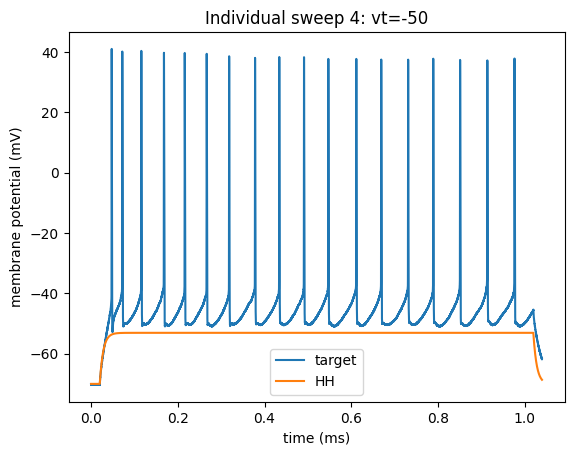

In [121]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_28[0]*1000, d2_title='HH')
title('Individual sweep 4: vt=-50')

In [122]:
# vt=-45

hh_sweep4_29 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=50, vt=-45)

first fit:
Round 0: Best parameters g_kd=1.5000432 uS, g_na=15.64372112 uS, gl=13.32012336 nS (error: 219.64197852 mV^2)
Round 1: Best parameters g_kd=1.14948157 uS, g_na=14.75452131 uS, gl=11.58260737 nS (error: 181.00686442 mV^2)
Round 2: Best parameters g_kd=1.8410847 uS, g_na=15.38296713 uS, gl=11.09787708 nS (error: 169.62800477 mV^2)
Round 3: Best parameters g_kd=3.0570101 uS, g_na=16.89410959 uS, gl=10.72329033 nS (error: 160.72631503 mV^2)
Round 4: Best parameters g_kd=1.92814912 uS, g_na=14.53699893 uS, gl=10.46950688 nS (error: 154.67324189 mV^2)
Round 5: Best parameters g_kd=3.06875442 uS, g_na=17.70679798 uS, gl=10.31561667 nS (error: 150.99389598 mV^2)
Round 6: Best parameters g_kd=2.24369521 uS, g_na=16.75230023 uS, gl=10.23412785 nS (error: 149.05173474 mV^2)
Round 7: Best parameters g_kd=3.20816826 uS, g_na=17.03904409 uS, gl=10.14777398 nS (error: 146.9937279 mV^2)
Round 8: Best parameters g_kd=3.66811916 uS, g_na=17.75659481 uS, gl=10.10700716 nS (error: 146.02192952 

Text(0.5, 1.0, 'Individual sweep 4: vt=-45')

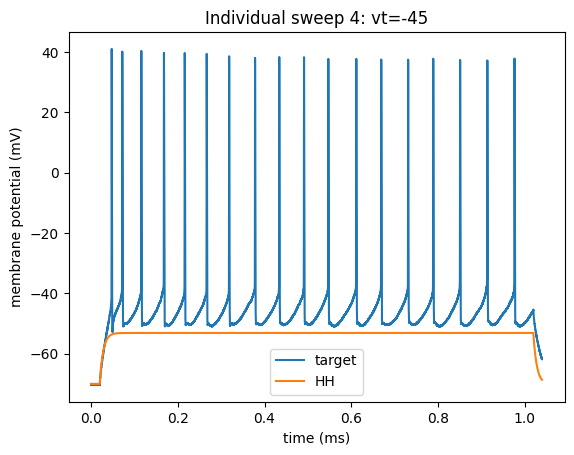

In [123]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_29[0]*1000, d2_title='HH')
title('Individual sweep 4: vt=-45')

In [124]:
# lower gl
# gl = 0-10

hh_sweep4_30 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 80, ek=-70, ena=50, vt=-50, glmin=0, glmax=10)

first fit:
Round 0: Best parameters g_kd=0.81446174 uS, g_na=6.74263246 uS, gl=7.97051297 nS (error: 96.11629277 mV^2)
Round 1: Best parameters g_kd=0.67146352 uS, g_na=2.62625541 uS, gl=7.56967727 nS (error: 94.01099526 mV^2)
Round 2: Best parameters g_kd=1.84070252 uS, g_na=1.92877434 uS, gl=7.25325121 nS (error: 92.60511882 mV^2)
Round 3: Best parameters g_kd=1.84070252 uS, g_na=1.92877434 uS, gl=7.25325121 nS (error: 92.60511882 mV^2)
Round 4: Best parameters g_kd=1.84070252 uS, g_na=1.92877434 uS, gl=7.25325121 nS (error: 92.60511882 mV^2)
Round 5: Best parameters g_kd=1.84070252 uS, g_na=1.92877434 uS, gl=7.25325121 nS (error: 92.60511882 mV^2)
Round 6: Best parameters g_kd=1.76227412 uS, g_na=1.82364622 uS, gl=7.22885074 nS (error: 92.59373648 mV^2)
Round 7: Best parameters g_kd=2.47491758 uS, g_na=1.59040962 uS, gl=7.16962631 nS (error: 92.55175262 mV^2)
Round 8: Best parameters g_kd=2.47491758 uS, g_na=1.59040962 uS, gl=7.16962631 nS (error: 92.55175262 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'Individual sweep 4: gl=0-10')

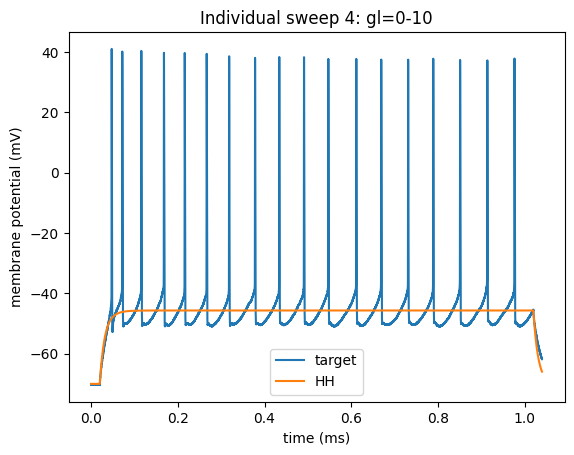

In [125]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_30[0]*1000, d2_title='HH')
title('Individual sweep 4: gl=0-10')

In [126]:
# cm = 120
# gkd_max = 2

hh_sweep4_31 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 120, ek=-70, ena=50, vt=-50, glmin=0, glmax=10, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=1.33793636 uS, g_na=13.51484396 uS, gl=8.39250292 nS (error: 101.23310537 mV^2)
Round 1: Best parameters g_kd=1.63011507 uS, g_na=3.59014558 uS, gl=7.56954465 nS (error: 93.84281949 mV^2)
Round 2: Best parameters g_kd=0.97244481 uS, g_na=2.32619131 uS, gl=7.46216652 nS (error: 93.83100368 mV^2)
Round 3: Best parameters g_kd=0.97244481 uS, g_na=2.32619131 uS, gl=7.46216652 nS (error: 93.83100368 mV^2)
Round 4: Best parameters g_kd=233.96148262 nS, g_na=2.01580623 uS, gl=7.26745846 nS (error: 93.37463019 mV^2)
Round 5: Best parameters g_kd=1.39853037 uS, g_na=1.77676051 uS, gl=7.30343282 nS (error: 93.27336357 mV^2)
Round 6: Best parameters g_kd=226.94039095 nS, g_na=1.71983838 uS, gl=7.27625017 nS (error: 93.18346893 mV^2)
Round 7: Best parameters g_kd=243.32902961 nS, g_na=1.75278456 uS, gl=7.27037597 nS (error: 93.18226473 mV^2)
Round 8: Best parameters g_kd=243.32902961 nS, g_na=1.75278456 uS, gl=7.27037597 nS (error: 93.18226473 mV^2)
Round 9

Text(0.5, 1.0, 'Individual sweep 4: gkd=0.01-2')

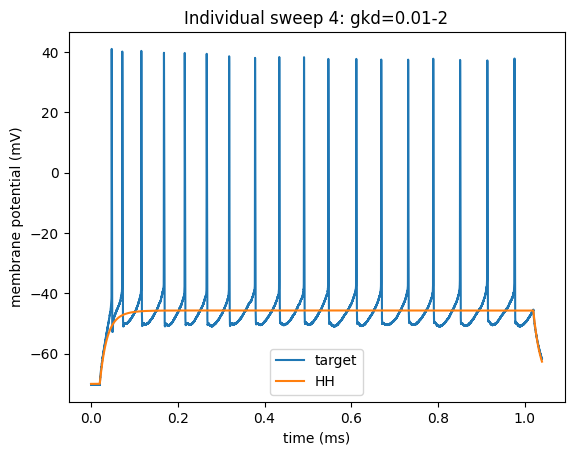

In [127]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_31[0]*1000, d2_title='HH')
title('Individual sweep 4: gkd=0.01-2')

In [129]:
# raise gna
# gna_max=40

hh_sweep4_32 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var= 120, ek=-70, ena=50, vt=-50, glmin=0, gnamax=40, glmax=10, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=0.60454316 uS, g_na=9.34968857 uS, gl=8.1561366 nS (error: 98.23355038 mV^2)
Round 1: Best parameters g_kd=0.81861591 uS, g_na=4.46680442 uS, gl=7.67355559 nS (error: 93.87442525 mV^2)
Round 2: Best parameters g_kd=0.81861591 uS, g_na=4.46680442 uS, gl=7.67355559 nS (error: 93.87442525 mV^2)
Round 3: Best parameters g_kd=0.90240033 uS, g_na=2.49626455 uS, gl=7.32563506 nS (error: 93.69049003 mV^2)
Round 4: Best parameters g_kd=1.340695 uS, g_na=2.42315606 uS, gl=7.29411701 nS (error: 93.59070673 mV^2)
Round 5: Best parameters g_kd=1.1865825 uS, g_na=2.56399459 uS, gl=7.38222844 nS (error: 93.29998788 mV^2)
Round 6: Best parameters g_kd=1.1865825 uS, g_na=2.56399459 uS, gl=7.38222844 nS (error: 93.29998788 mV^2)
Round 7: Best parameters g_kd=1.71699594 uS, g_na=2.1629578 uS, gl=7.31538142 nS (error: 93.22742794 mV^2)
Round 8: Best parameters g_kd=1.43032257 uS, g_na=1.79409379 uS, gl=7.2858992 nS (error: 93.21651336 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'Individual sweep 4: gna=1-40')

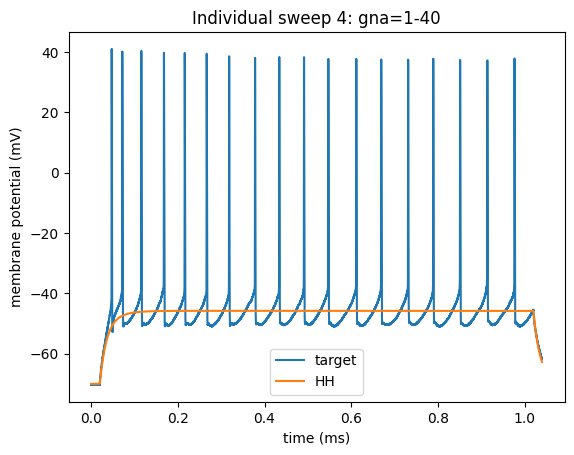

In [130]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep4_32[0]*1000, d2_title='HH')
title('Individual sweep 4: gna=1-40')

Try next sweeep...

In [131]:
# sweep 5

hh_sweep5_0 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out)

first fit:
Round 0: Best parameters g_kd=1.34212056 uS, g_na=14.6681464 uS, gl=14.73212218 nS (error: 94.52619507 mV^2)
Round 1: Best parameters g_kd=1.23960578 uS, g_na=14.33616131 uS, gl=12.81666554 nS (error: 94.51889516 mV^2)
Round 2: Best parameters g_kd=1.23960578 uS, g_na=14.33616131 uS, gl=12.81666554 nS (error: 94.51889516 mV^2)
Round 3: Best parameters g_kd=1.47783546 uS, g_na=15.59846785 uS, gl=11.93214115 nS (error: 94.5107732 mV^2)
Round 4: Best parameters g_kd=0.69002311 uS, g_na=7.27785156 uS, gl=11.59153178 nS (error: 94.42591357 mV^2)
Round 5: Best parameters g_kd=0.69002311 uS, g_na=7.27785156 uS, gl=11.59153178 nS (error: 94.42591357 mV^2)
Round 6: Best parameters g_kd=0.71467104 uS, g_na=7.96321603 uS, gl=11.84725304 nS (error: 94.38189378 mV^2)
Round 7: Best parameters g_kd=0.71467104 uS, g_na=7.96321603 uS, gl=11.84725304 nS (error: 94.38189378 mV^2)
Round 8: Best parameters g_kd=0.71467104 uS, g_na=7.96321603 uS, gl=11.28264143 nS (error: 94.35694513 mV^2)
Round 

Text(0.5, 1.0, 'Individual sweep 5')

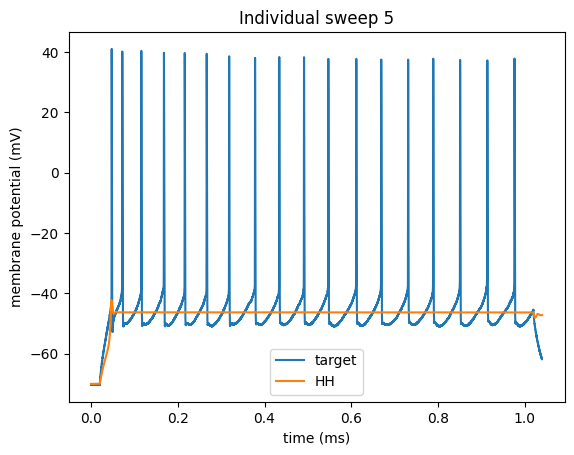

In [132]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_0[0]*1000, d2_title='HH')
title('Individual sweep 5')

In [133]:
# c=120

hh_sweep5_1 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120)

first fit:
Round 0: Best parameters g_kd=1.27485299 uS, g_na=16.62816626 uS, gl=26.3171987 nS (error: 94.55926762 mV^2)
Round 1: Best parameters g_kd=0.46869911 uS, g_na=5.80078244 uS, gl=14.32757092 nS (error: 94.30100484 mV^2)
Round 2: Best parameters g_kd=0.3836389 uS, g_na=5.36499895 uS, gl=15.12804352 nS (error: 94.25189326 mV^2)
Round 3: Best parameters g_kd=237.58858404 nS, g_na=3.1193261 uS, gl=13.76867222 nS (error: 93.95478872 mV^2)
Round 4: Best parameters g_kd=150.75632921 nS, g_na=2.04063916 uS, gl=12.38863918 nS (error: 93.3744808 mV^2)
Round 5: Best parameters g_kd=104.48875161 nS, g_na=1.6234731 uS, gl=11.83239403 nS (error: 92.11190428 mV^2)
Round 6: Best parameters g_kd=88.76934904 nS, g_na=1.45908119 uS, gl=11.32945985 nS (error: 91.98794324 mV^2)
Round 7: Best parameters g_kd=65.39030846 nS, g_na=1.34397583 uS, gl=11.8759545 nS (error: 91.84256634 mV^2)
Round 8: Best parameters g_kd=64.53051835 nS, g_na=1.31499901 uS, gl=11.50729959 nS (error: 91.837117 mV^2)
Round 

Text(0.5, 1.0, 'Individual sweep 5: c=120')

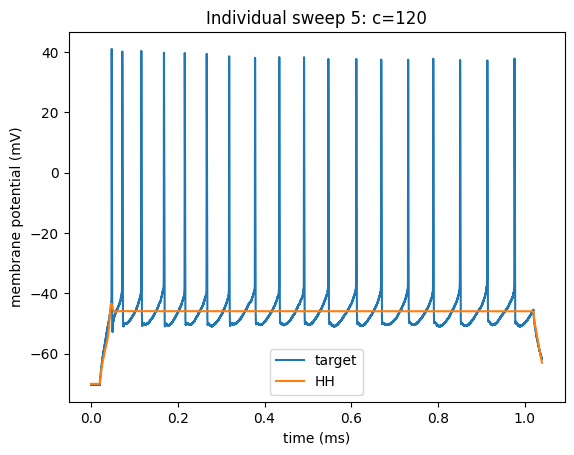

In [134]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_1[0]*1000, d2_title='HH')
title('Individual sweep 5: c=120')

In [135]:
# c=80

hh_sweep5_2 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=80)

first fit:
Round 0: Best parameters g_kd=1.31198317 uS, g_na=16.14770509 uS, gl=29.60519215 nS (error: 94.51835632 mV^2)
Round 1: Best parameters g_kd=0.78537061 uS, g_na=10.78900586 uS, gl=24.99530884 nS (error: 94.41291677 mV^2)
Round 2: Best parameters g_kd=0.78537061 uS, g_na=10.78900586 uS, gl=24.99530884 nS (error: 94.41291677 mV^2)
Round 3: Best parameters g_kd=0.78537061 uS, g_na=10.78900586 uS, gl=24.99530884 nS (error: 94.41291677 mV^2)
Round 4: Best parameters g_kd=301.58727259 nS, g_na=4.28329395 uS, gl=16.4539787 nS (error: 94.29997071 mV^2)
Round 5: Best parameters g_kd=198.93639172 nS, g_na=3.24575909 uS, gl=16.33393388 nS (error: 93.99430259 mV^2)
Round 6: Best parameters g_kd=184.19238076 nS, g_na=3.01854986 uS, gl=17.47752688 nS (error: 92.82882338 mV^2)
Round 7: Best parameters g_kd=210.52579776 nS, g_na=3.36243035 uS, gl=18.05886379 nS (error: 92.36464084 mV^2)
Round 8: Best parameters g_kd=210.52579776 nS, g_na=3.36243035 uS, gl=18.05886379 nS (error: 92.36464084 m

Text(0.5, 1.0, 'Individual sweep 5: c=80')

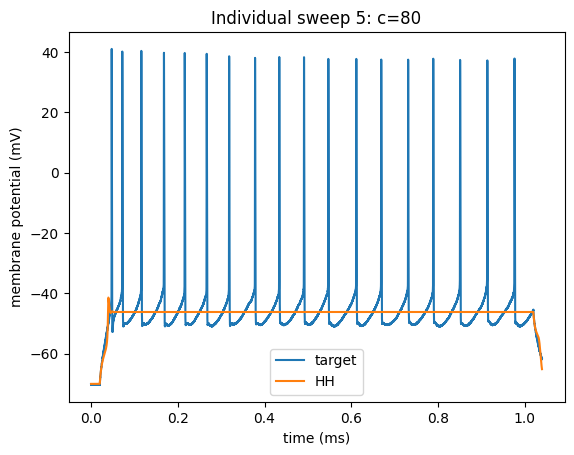

In [136]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_2[0]*1000, d2_title='HH')
title('Individual sweep 5: c=80')

In [137]:
# el=-100

hh_sweep5_3 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, el=-100)

first fit:
Round 0: Best parameters g_kd=2.11716963 uS, g_na=7.70236678 uS, gl=14.12008241 nS (error: 1844.66635933 mV^2)
Round 1: Best parameters g_kd=1.75751285 uS, g_na=8.37964334 uS, gl=12.13250084 nS (error: 1689.06325949 mV^2)
Round 2: Best parameters g_kd=1.90332112 uS, g_na=7.50371956 uS, gl=11.40510596 nS (error: 1621.08060923 mV^2)
Round 3: Best parameters g_kd=1.14467707 uS, g_na=3.10534075 uS, gl=10.8082918 nS (error: 1559.85898304 mV^2)
Round 4: Best parameters g_kd=1.4916986 uS, g_na=2.74485586 uS, gl=10.58386212 nS (error: 1535.4299939 mV^2)
Round 5: Best parameters g_kd=2.12290957 uS, g_na=2.29813093 uS, gl=10.37653856 nS (error: 1512.13067335 mV^2)
Round 6: Best parameters g_kd=305.3081133 nS, g_na=15.72277822 uS, gl=10.34058462 nS (error: 1508.01462201 mV^2)
Round 7: Best parameters g_kd=305.3081133 nS, g_na=15.72277822 uS, gl=10.34058462 nS (error: 1508.01462201 mV^2)
Round 8: Best parameters g_kd=305.3081133 nS, g_na=15.72277822 uS, gl=10.34058462 nS (error: 1508.01

Text(0.5, 1.0, 'Individual sweep 5: el=-100')

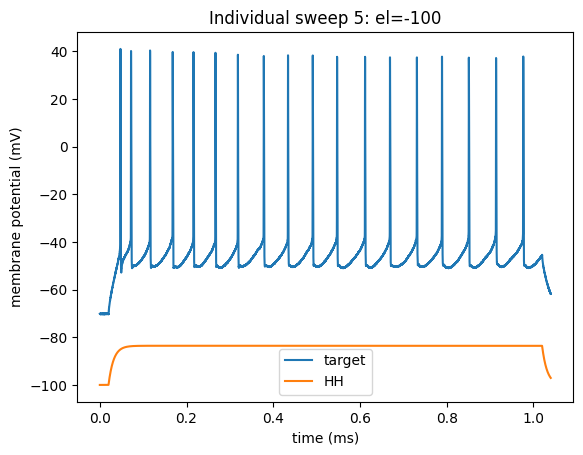

In [138]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_3[0]*1000, d2_title='HH')
title('Individual sweep 5: el=-100')

In [139]:
# el=-10

hh_sweep5_4 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, el=-10)

first fit:
Round 0: Best parameters g_kd=2.36468344 uS, g_na=15.85547319 uS, gl=16.01824538 nS (error: 109.02466785 mV^2)
Round 1: Best parameters g_kd=2.89071045 uS, g_na=17.38164869 uS, gl=14.73748957 nS (error: 108.79988872 mV^2)
Round 2: Best parameters g_kd=2.98940617 uS, g_na=18.47175684 uS, gl=14.00305921 nS (error: 108.55382975 mV^2)
Round 3: Best parameters g_kd=2.87856631 uS, g_na=19.15813384 uS, gl=12.64927162 nS (error: 108.55263316 mV^2)
Round 4: Best parameters g_kd=2.98283254 uS, g_na=18.87910168 uS, gl=12.90200909 nS (error: 108.41502397 mV^2)
Round 5: Best parameters g_kd=2.98283254 uS, g_na=18.87910168 uS, gl=12.90200909 nS (error: 108.41502397 mV^2)
Round 6: Best parameters g_kd=2.98283254 uS, g_na=18.87910168 uS, gl=12.90200909 nS (error: 108.41502397 mV^2)
Round 7: Best parameters g_kd=3.04459268 uS, g_na=19.12074786 uS, gl=13.49015325 nS (error: 108.28343257 mV^2)
Round 8: Best parameters g_kd=3.04459268 uS, g_na=19.12074786 uS, gl=13.49015325 nS (error: 108.28343

Text(0.5, 1.0, 'Individual sweep 5: el=-10')

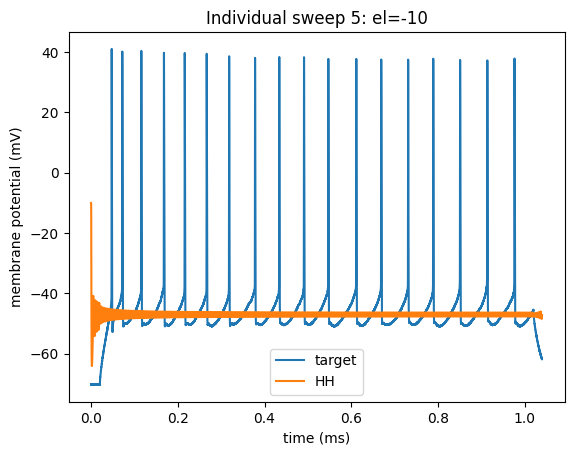

In [140]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_4[0]*1000, d2_title='HH')
title('Individual sweep 5: el=-10')

In [141]:
# el=0

hh_sweep5_5 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, el=0)

first fit:
Round 0: Best parameters g_kd=2.89720011 uS, g_na=15.5181374 uS, gl=21.12318597 nS (error: 109.69426875 mV^2)
Round 1: Best parameters g_kd=2.8311607 uS, g_na=17.30102872 uS, gl=14.71642018 nS (error: 109.29320193 mV^2)
Round 2: Best parameters g_kd=2.89720011 uS, g_na=17.7324451 uS, gl=12.58417227 nS (error: 109.12024456 mV^2)
Round 3: Best parameters g_kd=3.05003173 uS, g_na=18.74643787 uS, gl=14.03238022 nS (error: 109.03329831 mV^2)
Round 4: Best parameters g_kd=3.16806307 uS, g_na=19.14953603 uS, gl=13.95672091 nS (error: 108.99052997 mV^2)
Round 5: Best parameters g_kd=3.16168167 uS, g_na=19.06447787 uS, gl=14.69384294 nS (error: 108.95186414 mV^2)
Round 6: Best parameters g_kd=3.30489894 uS, g_na=19.22496864 uS, gl=16.03095688 nS (error: 108.86802123 mV^2)
Round 7: Best parameters g_kd=3.30489894 uS, g_na=19.22496864 uS, gl=16.03095688 nS (error: 108.86802123 mV^2)
Round 8: Best parameters g_kd=3.30489894 uS, g_na=19.22496864 uS, gl=16.03095688 nS (error: 108.86802123

Text(0.5, 1.0, 'Individual sweep 5: el=0')

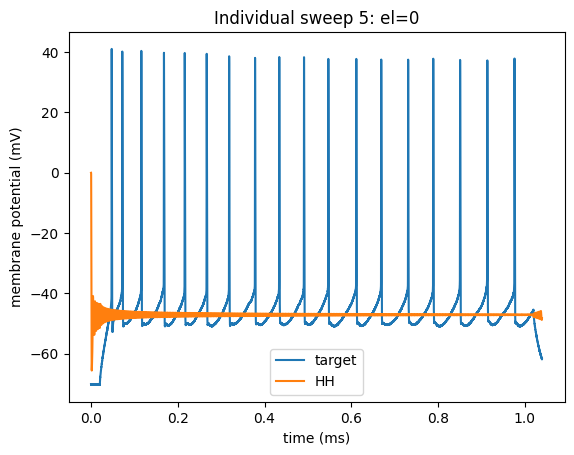

In [142]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_5[0]*1000, d2_title='HH')
title('Individual sweep 5: el=0')

In [143]:
# el=20

hh_sweep5_6 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, el=20)

first fit:
Round 0: Best parameters g_kd=2.96722961 uS, g_na=16.33952958 uS, gl=16.49840824 nS (error: 110.44394802 mV^2)
Round 1: Best parameters g_kd=2.91159692 uS, g_na=17.67623988 uS, gl=12.9293552 nS (error: 110.23545769 mV^2)
Round 2: Best parameters g_kd=3.07874118 uS, g_na=17.90997996 uS, gl=12.25235695 nS (error: 110.16930377 mV^2)
Round 3: Best parameters g_kd=3.15655481 uS, g_na=18.00534567 uS, gl=11.75889428 nS (error: 109.80697843 mV^2)
Round 4: Best parameters g_kd=3.15655481 uS, g_na=18.00534567 uS, gl=11.75889428 nS (error: 109.80697843 mV^2)
Round 5: Best parameters g_kd=3.15248084 uS, g_na=18.6900407 uS, gl=11.06990956 nS (error: 109.74850025 mV^2)
Round 6: Best parameters g_kd=3.23037726 uS, g_na=19.32107448 uS, gl=10.76413768 nS (error: 109.58744557 mV^2)
Round 7: Best parameters g_kd=3.26175699 uS, g_na=19.34075629 uS, gl=11.06272913 nS (error: 109.57720669 mV^2)
Round 8: Best parameters g_kd=3.26175699 uS, g_na=19.34075629 uS, gl=11.06272913 nS (error: 109.5772066

Text(0.5, 1.0, 'Individual sweep 5: el=20')

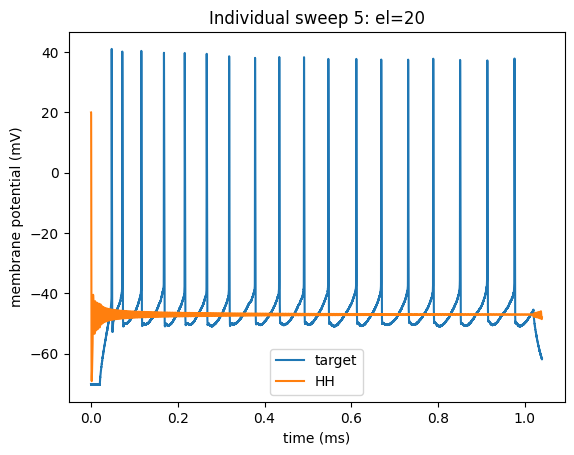

In [144]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_6[0]*1000, d2_title='HH')
title('Individual sweep 5: el=20')

In [145]:
# ek=-100

hh_sweep5_7 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-100)

first fit:
Round 0: Best parameters g_kd=0.59193031 uS, g_na=11.69998916 uS, gl=18.84892086 nS (error: 94.52693198 mV^2)
Round 1: Best parameters g_kd=0.41122782 uS, g_na=7.26427258 uS, gl=14.67582124 nS (error: 94.52165431 mV^2)
Round 2: Best parameters g_kd=267.52011381 nS, g_na=5.70658125 uS, gl=15.36622494 nS (error: 94.23794025 mV^2)
Round 3: Best parameters g_kd=267.52011381 nS, g_na=5.70658125 uS, gl=15.36622494 nS (error: 94.23794025 mV^2)
Round 4: Best parameters g_kd=191.39295908 nS, g_na=4.04759927 uS, gl=13.59283321 nS (error: 94.07547175 mV^2)
Round 5: Best parameters g_kd=146.36277577 nS, g_na=2.740702 uS, gl=15.48746361 nS (error: 93.67309291 mV^2)
Round 6: Best parameters g_kd=100.6447903 nS, g_na=1.94646011 uS, gl=12.6021753 nS (error: 93.12843879 mV^2)
Round 7: Best parameters g_kd=72.0203991 nS, g_na=2.02997574 uS, gl=13.96502933 nS (error: 92.1129004 mV^2)
Round 8: Best parameters g_kd=51.11104389 nS, g_na=1.46890391 uS, gl=11.56456287 nS (error: 91.92827959 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 5: ek=-100')

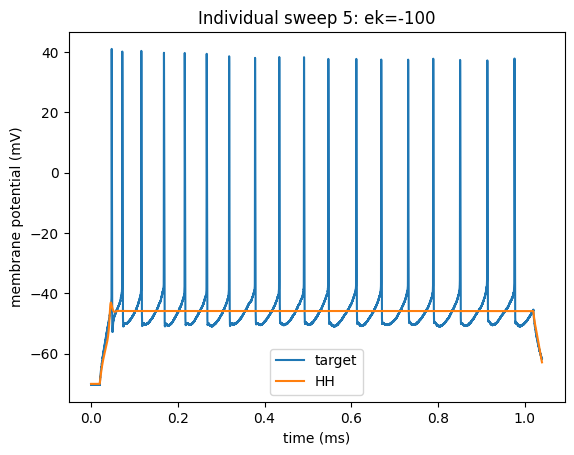

In [146]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_7[0]*1000, d2_title='HH')
title('Individual sweep 5: ek=-100')

In [147]:
# ek=-10

hh_sweep5_8 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-10)

first fit:
Round 0: Best parameters g_kd=0.39982593 uS, g_na=5.08585093 uS, gl=27.14729319 nS (error: 371.49943084 mV^2)
Round 1: Best parameters g_kd=0.3304864 uS, g_na=15.23063851 uS, gl=27.66615473 nS (error: 183.80932284 mV^2)
Round 2: Best parameters g_kd=262.42088388 nS, g_na=16.63802561 uS, gl=30.3259764 nS (error: 144.5541356 mV^2)
Round 3: Best parameters g_kd=148.16135407 nS, g_na=13.80236071 uS, gl=28.73435596 nS (error: 128.6786578 mV^2)
Round 4: Best parameters g_kd=119.60187275 nS, g_na=18.4207567 uS, gl=30.79562023 nS (error: 124.22007253 mV^2)
Round 5: Best parameters g_kd=92.45612638 nS, g_na=16.86191718 uS, gl=30.63226516 nS (error: 122.24724468 mV^2)
Round 6: Best parameters g_kd=72.42717437 nS, g_na=18.5149887 uS, gl=28.87626406 nS (error: 121.0281472 mV^2)
Round 7: Best parameters g_kd=47.95437525 nS, g_na=16.86191718 uS, gl=30.63226516 nS (error: 118.91842185 mV^2)
Round 8: Best parameters g_kd=48.82905495 nS, g_na=5.08585093 uS, gl=20.81740976 nS (error: 114.5788

Text(0.5, 1.0, 'Individual sweep 5: ek=-10')

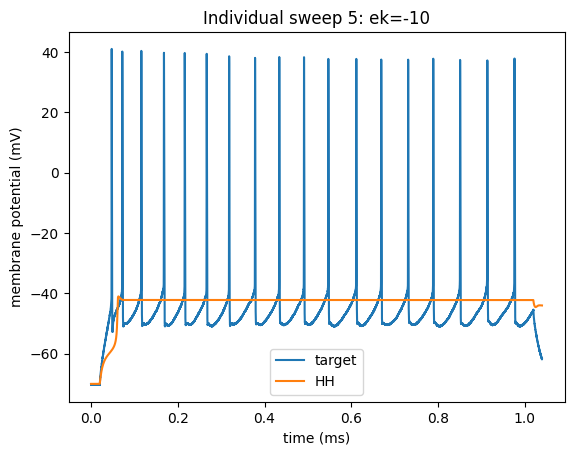

In [148]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_8[0]*1000, d2_title='HH')
title('Individual sweep 5: ek=-10')

In [ ]:
# ek=-50
# ena=0
hh_sweep5_9 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=0)

first fit:
Round 0: Best parameters g_kd=2.79642136 uS, g_na=4.27491208 uS, gl=14.88109027 nS (error: 133.61230297 mV^2)
Round 1: Best parameters g_kd=3.42796816 uS, g_na=2.93272733 uS, gl=24.04242847 nS (error: 111.4305314 mV^2)
Round 2: Best parameters g_kd=3.31702124 uS, g_na=1.93153346 uS, gl=17.04244647 nS (error: 103.96055496 mV^2)
Round 3: Best parameters g_kd=3.64580432 uS, g_na=1.68800471 uS, gl=18.65396004 nS (error: 99.89115861 mV^2)
Round 4: Best parameters g_kd=3.75255899 uS, g_na=1.41427615 uS, gl=16.80366078 nS (error: 97.48029854 mV^2)
Round 5: Best parameters g_kd=3.72971677 uS, g_na=1.26013956 uS, gl=16.3406474 nS (error: 96.52086057 mV^2)
Round 6: Best parameters g_kd=3.85773587 uS, g_na=1.22791491 uS, gl=15.4551137 nS (error: 96.10794149 mV^2)
Round 7: Best parameters g_kd=3.82382268 uS, g_na=1.15529804 uS, gl=20.08541401 nS (error: 95.16391621 mV^2)
Round 8: Best parameters g_kd=3.82586893 uS, g_na=1.17107784 uS, gl=20.0468214 nS (error: 94.29553565 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 5: ek=-50, ena=0')

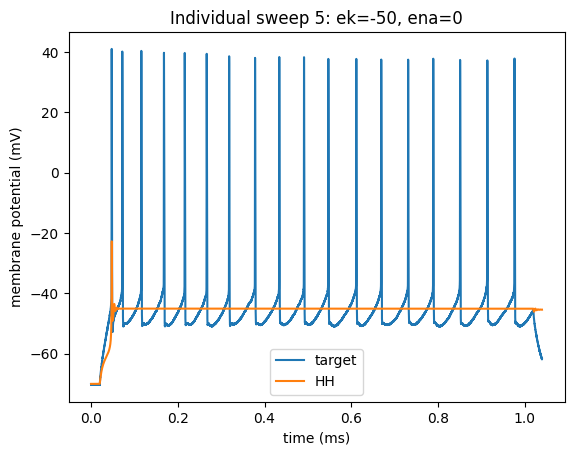

In [152]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_9[0]*1000, d2_title='HH')
title('Individual sweep 5: ek=-50, ena=0')

In [ ]:
# ena=50
hh_sweep5_10 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ena=50)

first fit:
Round 0: Best parameters g_kd=0.78686853 uS, g_na=3.75029667 uS, gl=34.91499262 nS (error: 400.43943242 mV^2)
Round 1: Best parameters g_kd=0.91833196 uS, g_na=2.60229086 uS, gl=31.1016316 nS (error: 368.09626607 mV^2)
Round 2: Best parameters g_kd=0.93613149 uS, g_na=1.94312498 uS, gl=28.88575733 nS (error: 362.50093953 mV^2)
Round 3: Best parameters g_kd=0.31866179 uS, g_na=5.32079838 uS, gl=30.49144031 nS (error: 302.5932611 mV^2)
Round 4: Best parameters g_kd=236.66758283 nS, g_na=1.99032603 uS, gl=15.08495069 nS (error: 230.89594193 mV^2)
Round 5: Best parameters g_kd=231.2907034 nS, g_na=2.03510733 uS, gl=17.51423565 nS (error: 228.56331726 mV^2)
Round 6: Best parameters g_kd=227.4009358 nS, g_na=1.76172765 uS, gl=16.27590665 nS (error: 214.3657352 mV^2)
Round 7: Best parameters g_kd=214.02049762 nS, g_na=1.57160488 uS, gl=14.40141736 nS (error: 212.64109464 mV^2)
Round 8: Best parameters g_kd=196.56126192 nS, g_na=1.3699079 uS, gl=11.98517493 nS (error: 205.28403801 m

Text(0.5, 1.0, 'Individual sweep 5: ena=50')

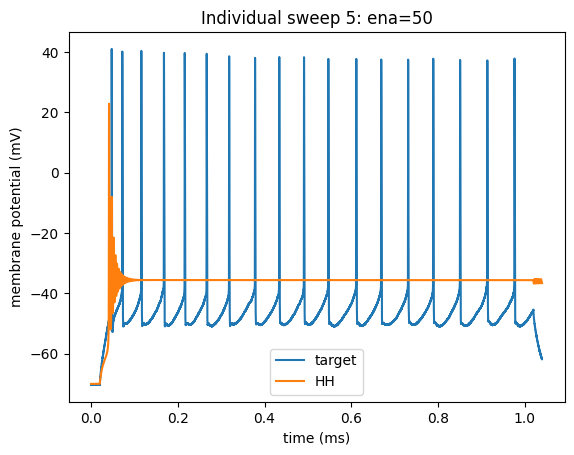

In [153]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_10[0]*1000, d2_title='HH')
title('Individual sweep 5: ena=50')

In [ ]:
# gl = 0-20
# gna = 5-20
# gkd = 0.01-2
hh_sweep5_11 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ena=50, glmin=0, glmax=20, gnamin=5, gkdmin=0.01, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=0.44574901 uS, g_na=7.70447363 uS, gl=4.97767119 nS (error: 336.96841724 mV^2)
Round 1: Best parameters g_kd=0.42640074 uS, g_na=7.08809129 uS, gl=3.62107606 nS (error: 332.2217994 mV^2)
Round 2: Best parameters g_kd=0.39666346 uS, g_na=6.63729833 uS, gl=17.03558332 nS (error: 321.11615955 mV^2)
Round 3: Best parameters g_kd=0.39666346 uS, g_na=6.63729833 uS, gl=17.03558332 nS (error: 321.11615955 mV^2)
Round 4: Best parameters g_kd=0.39666346 uS, g_na=6.63729833 uS, gl=17.03558332 nS (error: 321.11615955 mV^2)
Round 5: Best parameters g_kd=0.38771211 uS, g_na=6.15697135 uS, gl=8.76656403 nS (error: 320.15919534 mV^2)
Round 6: Best parameters g_kd=0.39096693 uS, g_na=5.9734919 uS, gl=5.94882515 nS (error: 318.07367296 mV^2)
Round 7: Best parameters g_kd=0.39096693 uS, g_na=5.9734919 uS, gl=5.94882515 nS (error: 318.07367296 mV^2)
Round 8: Best parameters g_kd=0.39096693 uS, g_na=5.9734919 uS, gl=5.94882515 nS (error: 318.07367296 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ena=50, gl=0-20, gna=5-20, gkd=0.01-2')

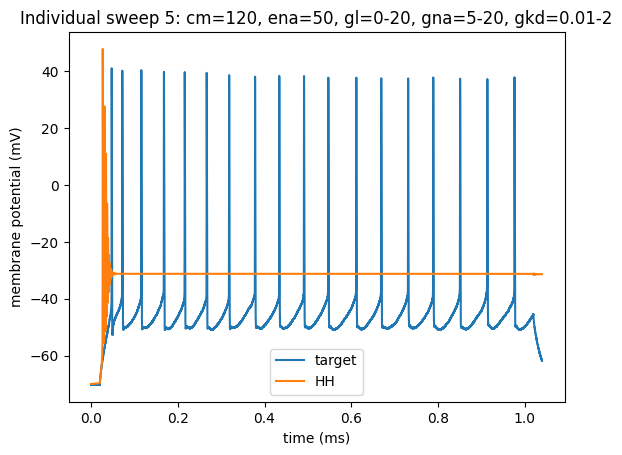

In [154]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_11[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ena=50, gl=0-20, gna=5-20, gkd=0.01-2')

In [ ]:
# vt=-90
hh_sweep5_12 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ena=50, 
                      vt=-90, glmin=0, glmax=20, gnamin=5, gkdmin=0.01, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=0.49034035 uS, g_na=8.51091036 uS, gl=8.75654902 nS (error: 110.24571711 mV^2)
Round 1: Best parameters g_kd=0.43094705 uS, g_na=7.62169385 uS, gl=15.11506376 nS (error: 110.10204086 mV^2)
Round 2: Best parameters g_kd=0.43094705 uS, g_na=7.62169385 uS, gl=15.11506376 nS (error: 110.10204086 mV^2)
Round 3: Best parameters g_kd=0.43094705 uS, g_na=7.62169385 uS, gl=15.11506376 nS (error: 110.10204086 mV^2)
Round 4: Best parameters g_kd=0.37137366 uS, g_na=6.18246834 uS, gl=8.1221657 nS (error: 109.96020027 mV^2)
Round 5: Best parameters g_kd=0.37137366 uS, g_na=6.18246834 uS, gl=8.1221657 nS (error: 109.96020027 mV^2)
Round 6: Best parameters g_kd=0.37137366 uS, g_na=6.18246834 uS, gl=8.1221657 nS (error: 109.96020027 mV^2)
Round 7: Best parameters g_kd=0.37714192 uS, g_na=6.32250019 uS, gl=13.98543942 nS (error: 109.95260131 mV^2)
Round 8: Best parameters g_kd=0.37714192 uS, g_na=6.32250019 uS, gl=13.98543942 nS (error: 109.95260131 mV^2)
Round 

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ena=50, vt=-90, gl=0-20, gna=5-20, gkd=0.01-2')

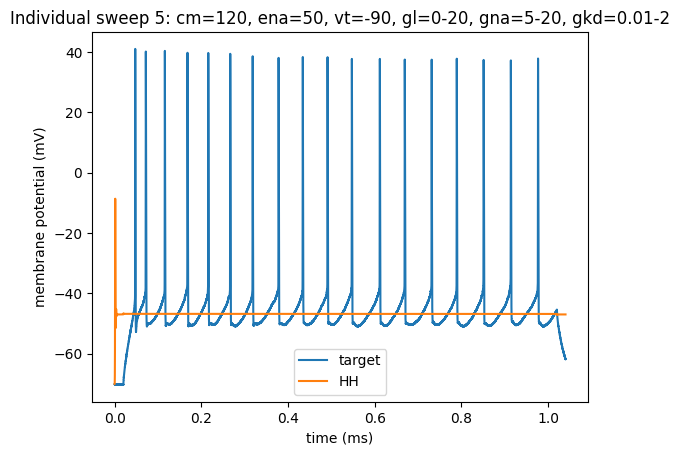

In [156]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_12[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ena=50, vt=-90, gl=0-20, gna=5-20, gkd=0.01-2')

In [ ]:
# vt = -20
hh_sweep5_13 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ena=50, vt=-20, 
                      glmin=0, glmax=20, gnamin=5, gkdmin=0.01, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=0.69039505 uS, g_na=13.62326115 uS, gl=7.00836259 nS (error: 92.94370679 mV^2)
Round 1: Best parameters g_kd=0.69039505 uS, g_na=13.62326115 uS, gl=7.00836259 nS (error: 92.94370679 mV^2)
Round 2: Best parameters g_kd=0.63924967 uS, g_na=9.48173388 uS, gl=6.96437126 nS (error: 92.94205533 mV^2)
Round 3: Best parameters g_kd=0.63924967 uS, g_na=6.82323652 uS, gl=6.96437126 nS (error: 92.94205533 mV^2)
Round 4: Best parameters g_kd=1.60763048 uS, g_na=7.51872586 uS, gl=6.99216744 nS (error: 92.93800175 mV^2)
Round 5: Best parameters g_kd=1.60763048 uS, g_na=6.32433192 uS, gl=6.99216744 nS (error: 92.93800175 mV^2)
Round 6: Best parameters g_kd=1.60763048 uS, g_na=6.32433192 uS, gl=6.99216744 nS (error: 92.93800175 mV^2)
Round 7: Best parameters g_kd=1.91142717 uS, g_na=7.30027724 uS, gl=6.98400723 nS (error: 92.93736497 mV^2)
Round 8: Best parameters g_kd=1.91142717 uS, g_na=7.30027724 uS, gl=6.98400723 nS (error: 92.93736497 mV^2)
Round 9: Best p

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ena=50, vt=-20, gl=0-20, gna=5-20, gkd=0.01-2')

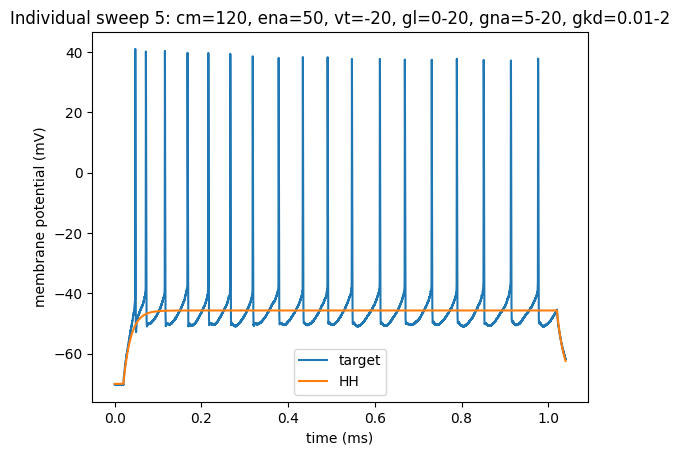

In [158]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_13[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ena=50, vt=-20, gl=0-20, gna=5-20, gkd=0.01-2')

In [159]:
hh_sweep5_14 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ena=50, vt=-20, 
                      glmin=0, glmax=10, gnamin=5, gkdmin=0.01, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=0.80110312 uS, g_na=12.61157398 uS, gl=6.94866319 nS (error: 92.95221554 mV^2)
Round 1: Best parameters g_kd=0.42906706 uS, g_na=15.17919409 uS, gl=7.01897828 nS (error: 92.95061949 mV^2)
Round 2: Best parameters g_kd=281.88452727 nS, g_na=8.21923256 uS, gl=6.98930515 nS (error: 92.93760672 mV^2)
Round 3: Best parameters g_kd=0.5715442 uS, g_na=15.5476826 uS, gl=6.98243136 nS (error: 92.93741603 mV^2)
Round 4: Best parameters g_kd=0.35511188 uS, g_na=13.9245463 uS, gl=6.98243136 nS (error: 92.93741603 mV^2)
Round 5: Best parameters g_kd=0.35511188 uS, g_na=13.9245463 uS, gl=6.98243136 nS (error: 92.93741603 mV^2)
Round 6: Best parameters g_kd=214.19273485 nS, g_na=7.95061119 uS, gl=6.98243136 nS (error: 92.93741603 mV^2)
Round 7: Best parameters g_kd=214.19273485 nS, g_na=7.95061119 uS, gl=6.98243136 nS (error: 92.93741603 mV^2)
Round 8: Best parameters g_kd=214.19273485 nS, g_na=7.95061119 uS, gl=6.98243136 nS (error: 92.93741603 mV^2)
Round 9:

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ena=50, vt=-20, gl=0-10, gna=5-20, gkd=0.01-2')

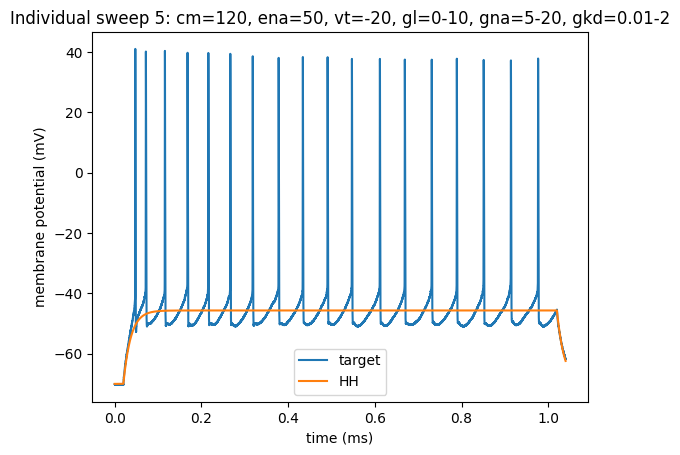

In [160]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_14[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ena=50, vt=-20, gl=0-10, gna=5-20, gkd=0.01-2')

In [ ]:
# ek=-50
# ena=50
# vt=-70
hh_sweep5_14 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=50, vt=-70, 
                      glmin=0, glmax=10, gnamin=5, gkdmin=0.01, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=1.73705043 uS, g_na=7.71684058 uS, gl=7.92586723 nS (error: 275.48884327 mV^2)
Round 1: Best parameters g_kd=1.85637814 uS, g_na=6.59073283 uS, gl=8.50532109 nS (error: 251.60210891 mV^2)
Round 2: Best parameters g_kd=1.85711334 uS, g_na=5.92034768 uS, gl=9.23082475 nS (error: 240.64263921 mV^2)
Round 3: Best parameters g_kd=1.92176323 uS, g_na=5.66310946 uS, gl=8.94877738 nS (error: 233.50148969 mV^2)
Round 4: Best parameters g_kd=1.93105177 uS, g_na=5.56440612 uS, gl=9.28155539 nS (error: 231.2871479 mV^2)
Round 5: Best parameters g_kd=1.88200009 uS, g_na=5.35042806 uS, gl=9.40092634 nS (error: 229.90418557 mV^2)
Round 6: Best parameters g_kd=1.88200009 uS, g_na=5.35042806 uS, gl=9.40092634 nS (error: 229.90418557 mV^2)
Round 7: Best parameters g_kd=1.92962777 uS, g_na=5.45314485 uS, gl=9.31170132 nS (error: 229.49564304 mV^2)
Round 8: Best parameters g_kd=1.92962777 uS, g_na=5.45314485 uS, gl=9.31170132 nS (error: 229.49564304 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ek=-50, ena=50, vt=-20, gl=0-10, gna=5-20, gkd=0.01-2')

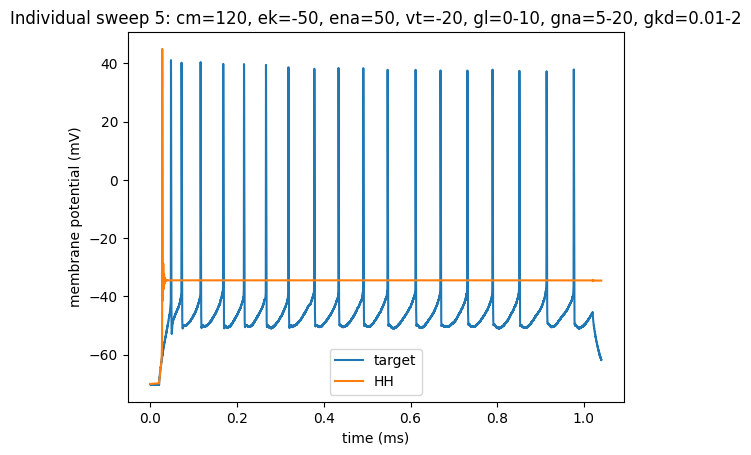

In [162]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_14[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ek=-50, ena=50, vt=-20, gl=0-10, gna=5-20, gkd=0.01-2')

In [163]:
# ek=-50
# ena=50
# vt=-70

# gl = 0-6

hh_sweep5_15 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=50, vt=-70, 
                      glmin=0, glmax=6, gnamin=5, gkdmin=0.01, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=1.63683704 uS, g_na=8.19570137 uS, gl=3.53512031 nS (error: 291.60749035 mV^2)
Round 1: Best parameters g_kd=1.78744968 uS, g_na=6.01784559 uS, gl=3.80802773 nS (error: 248.70915961 mV^2)
Round 2: Best parameters g_kd=1.82549383 uS, g_na=5.79648117 uS, gl=1.70328339 nS (error: 244.15634861 mV^2)
Round 3: Best parameters g_kd=1.88430934 uS, g_na=5.50751233 uS, gl=4.70729271 nS (error: 234.85509286 mV^2)
Round 4: Best parameters g_kd=1.91875466 uS, g_na=5.33560439 uS, gl=2.80766521 nS (error: 231.29660381 mV^2)
Round 5: Best parameters g_kd=1.92941728 uS, g_na=5.29299754 uS, gl=4.6277135 nS (error: 229.17603629 mV^2)
Round 6: Best parameters g_kd=1.94397465 uS, g_na=5.23882896 uS, gl=5.34903904 nS (error: 227.24297512 mV^2)
Round 7: Best parameters g_kd=1.94333102 uS, g_na=5.16069764 uS, gl=5.62156012 nS (error: 225.80735355 mV^2)
Round 8: Best parameters g_kd=1.96899164 uS, g_na=5.17381748 uS, gl=5.49084855 nS (error: 224.96578233 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ek=-50, ena=50, vt=-20, gl=0-6, gna=5-20, gkd=0.01-2')

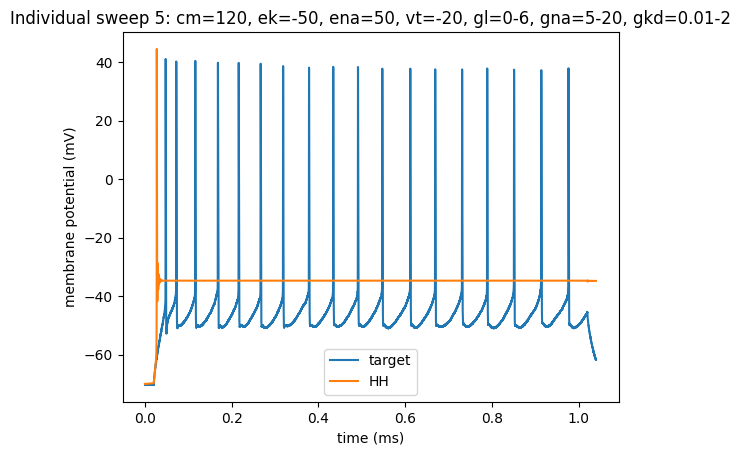

In [164]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_15[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ek=-50, ena=50, vt=-20, gl=0-6, gna=5-20, gkd=0.01-2')

In [170]:
# ek=-50
# ena=50
# vt=-70

# gl = 0-6
# gkd=0.01-1

hh_sweep5_16 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=50, vt=-70, 
                      glmin=0, glmax=6, gnamin=5, gkdmin=0.01, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.8576487 uS, g_na=8.26588995 uS, gl=1.56616018 nS (error: 383.95886796 mV^2)
Round 1: Best parameters g_kd=0.92552473 uS, g_na=6.36105652 uS, gl=0.85230727 nS (error: 333.99917292 mV^2)
Round 2: Best parameters g_kd=0.92929316 uS, g_na=5.88221851 uS, gl=1.09988 nS (error: 322.65195179 mV^2)
Round 3: Best parameters g_kd=0.95055391 uS, g_na=5.61872524 uS, gl=4.12522788 nS (error: 310.83296024 mV^2)
Round 4: Best parameters g_kd=0.96407529 uS, g_na=5.44662201 uS, gl=4.12522788 nS (error: 305.14445082 mV^2)
Round 5: Best parameters g_kd=0.96745692 uS, g_na=5.34089068 uS, gl=4.97072535 nS (error: 301.48997866 mV^2)
Round 6: Best parameters g_kd=0.9732555 uS, g_na=5.20143157 uS, gl=5.17934433 nS (error: 297.33679086 mV^2)
Round 7: Best parameters g_kd=0.98348859 uS, g_na=5.17502692 uS, gl=5.23762704 nS (error: 295.42390805 mV^2)
Round 8: Best parameters g_kd=0.98407954 uS, g_na=5.10766567 uS, gl=5.24233699 nS (error: 293.77340119 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 5: cm=120, ek=-50, ena=50, vt=-20, gl=0-6, gna=5-20, gkd=0.01-1')

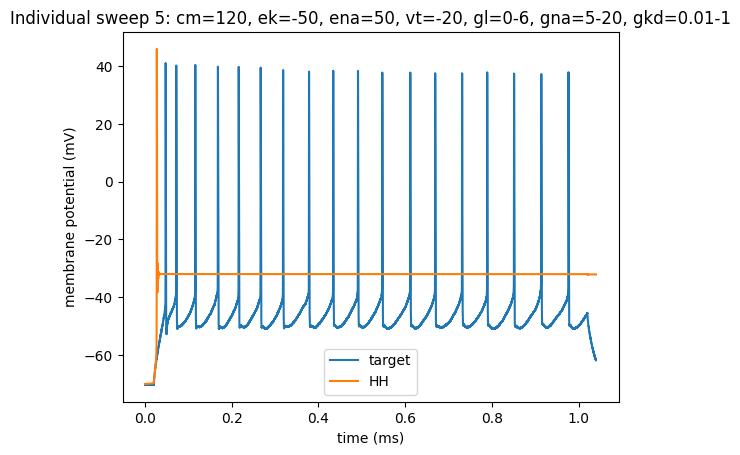

In [171]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep5_16[0]*1000, d2_title='HH')
title('Individual sweep 5: cm=120, ek=-50, ena=50, vt=-20, gl=0-6, gna=5-20, gkd=0.01-1')

Attempt at sweep 6

In [ ]:
# cm=120
# ek=-50
# ena=40
hh_sweep6_0 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=40)

first fit:
Round 0: Best parameters g_kd=3.42982663 uS, g_na=3.72157675 uS, gl=30.17905332 nS (error: 147.21505204 mV^2)
Round 1: Best parameters g_kd=3.71544141 uS, g_na=2.49468059 uS, gl=21.45968196 nS (error: 127.64933454 mV^2)
Round 2: Best parameters g_kd=3.63954925 uS, g_na=2.05780903 uS, gl=24.38352714 nS (error: 120.03839888 mV^2)
Round 3: Best parameters g_kd=3.62908546 uS, g_na=1.67762683 uS, gl=19.13028108 nS (error: 115.24530459 mV^2)
Round 4: Best parameters g_kd=3.78489854 uS, g_na=1.4912374 uS, gl=21.73671399 nS (error: 109.55163217 mV^2)
Round 5: Best parameters g_kd=3.80028939 uS, g_na=1.32388725 uS, gl=18.64399963 nS (error: 107.53238264 mV^2)
Round 6: Best parameters g_kd=3.78974337 uS, g_na=1.20769331 uS, gl=16.56506791 nS (error: 105.65317912 mV^2)
Round 7: Best parameters g_kd=3.86669743 uS, g_na=1.16824922 uS, gl=22.63771748 nS (error: 104.2648831 mV^2)
Round 8: Best parameters g_kd=3.83727558 uS, g_na=1.17494658 uS, gl=22.92660528 nS (error: 102.93944315 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-50, ena=40')

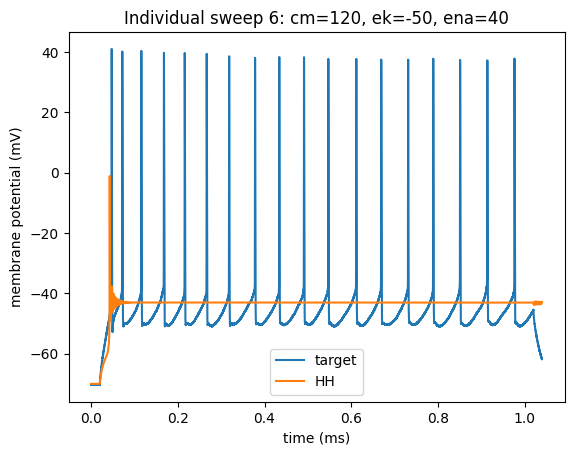

In [173]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_0[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-50, ena=40')

In [ ]:
# gl = 1-6
# gkd = 0.001-1
hh_sweep6_1 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=40,
                     glmin=1, glmax=6, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.810126 uS, g_na=4.56967936 uS, gl=2.4107563 nS (error: 290.34591126 mV^2)
Round 1: Best parameters g_kd=0.79049182 uS, g_na=2.8229564 uS, gl=4.38793541 nS (error: 240.34035869 mV^2)
Round 2: Best parameters g_kd=0.89483379 uS, g_na=1.83926536 uS, gl=2.96412847 nS (error: 195.9290115 mV^2)
Round 3: Best parameters g_kd=0.89591755 uS, g_na=1.63950716 uS, gl=1.97878807 nS (error: 188.62990794 mV^2)
Round 4: Best parameters g_kd=0.95033431 uS, g_na=1.44867591 uS, gl=4.13248475 nS (error: 174.47318193 mV^2)
Round 5: Best parameters g_kd=0.94775064 uS, g_na=1.28792231 uS, gl=3.71474263 nS (error: 167.77457344 mV^2)
Round 6: Best parameters g_kd=0.95529759 uS, g_na=1.17774621 uS, gl=4.63628105 nS (error: 161.22764331 mV^2)
Round 7: Best parameters g_kd=0.95522205 uS, g_na=1.13604605 uS, gl=5.72639996 nS (error: 158.20404157 mV^2)
Round 8: Best parameters g_kd=0.95682929 uS, g_na=1.09757992 uS, gl=5.80783873 nS (error: 156.14015938 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-50, ena=40, gl=1-6, gkd=0.001-1')

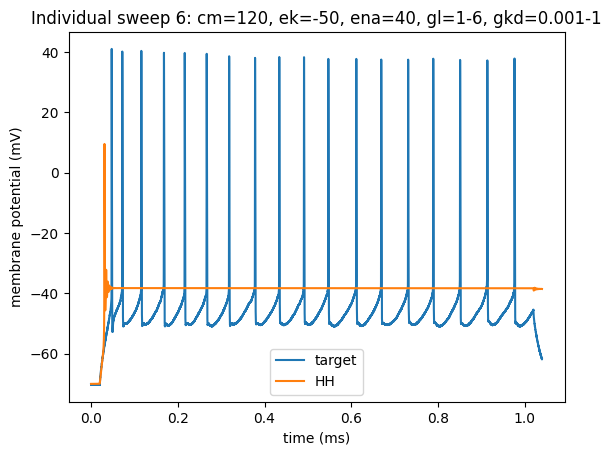

In [176]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_1[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-50, ena=40, gl=1-6, gkd=0.001-1')

In [177]:
# gnamin=5
hh_sweep6_2 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=40,
                     glmin=1, glmax=6, gnamin=5, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.7606533 uS, g_na=6.87390664 uS, gl=2.72146023 nS (error: 351.36050779 mV^2)
Round 1: Best parameters g_kd=0.89575463 uS, g_na=6.59671201 uS, gl=4.46774421 nS (error: 321.26114903 mV^2)
Round 2: Best parameters g_kd=0.94341993 uS, g_na=5.96769535 uS, gl=2.66399507 nS (error: 303.73598462 mV^2)
Round 3: Best parameters g_kd=0.965379 uS, g_na=5.7333727 uS, gl=4.33118914 nS (error: 294.56901648 mV^2)
Round 4: Best parameters g_kd=0.97052547 uS, g_na=5.50038381 uS, gl=2.72942201 nS (error: 290.54057148 mV^2)
Round 5: Best parameters g_kd=0.9776233 uS, g_na=5.36215522 uS, gl=5.41820781 nS (error: 284.30469139 mV^2)
Round 6: Best parameters g_kd=0.98468843 uS, g_na=5.28681184 uS, gl=4.46326668 nS (error: 282.74959111 mV^2)
Round 7: Best parameters g_kd=0.98683145 uS, g_na=5.20568093 uS, gl=5.40720642 nS (error: 279.90692796 mV^2)
Round 8: Best parameters g_kd=0.98736801 uS, g_na=5.15819081 uS, gl=5.71363463 nS (error: 278.54149778 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-50, ena=40, gl=1-6, gna = 5-20, gkd=0.001-1')

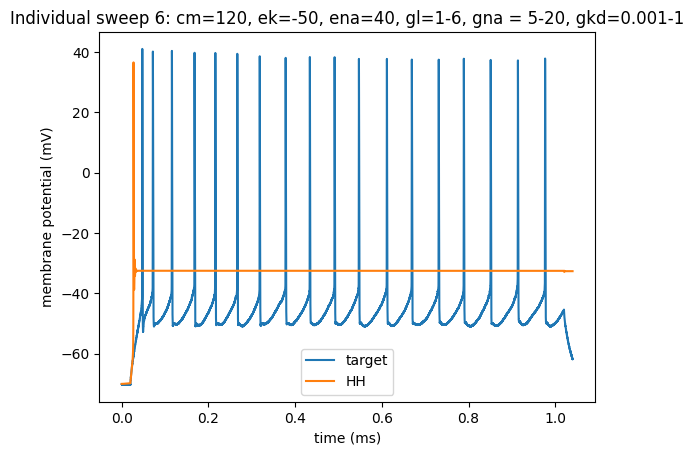

In [178]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_2[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-50, ena=40, gl=1-6, gna = 5-20, gkd=0.001-1')

In [179]:
# ek=-20
hh_sweep6_3 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-20, ena=40,
                     glmin=1, glmax=6, gnamin=5, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.89139085 uS, g_na=7.88663661 uS, gl=4.07442317 nS (error: 948.0564542 mV^2)
Round 1: Best parameters g_kd=0.93959226 uS, g_na=6.73826411 uS, gl=3.67427355 nS (error: 919.85618826 mV^2)
Round 2: Best parameters g_kd=0.96750608 uS, g_na=6.18522378 uS, gl=4.61324892 nS (error: 901.09925433 mV^2)
Round 3: Best parameters g_kd=0.9574546 uS, g_na=5.66126039 uS, gl=5.46434198 nS (error: 887.7795614 mV^2)
Round 4: Best parameters g_kd=0.95626206 uS, g_na=5.49679856 uS, gl=5.42895707 nS (error: 884.59134422 mV^2)
Round 5: Best parameters g_kd=0.97521324 uS, g_na=5.33690047 uS, gl=5.72713822 nS (error: 877.91282194 mV^2)
Round 6: Best parameters g_kd=0.98184092 uS, g_na=5.27231408 uS, gl=5.78588548 nS (error: 875.62727829 mV^2)
Round 7: Best parameters g_kd=0.97836771 uS, g_na=5.17363891 uS, gl=5.78448119 nS (error: 873.88136819 mV^2)
Round 8: Best parameters g_kd=0.98669559 uS, g_na=5.16012522 uS, gl=5.84929492 nS (error: 872.50273917 mV^2)
Round 9: Be

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-20, ena=40, gl=1-6, gna = 5-20, gkd=0.001-1')

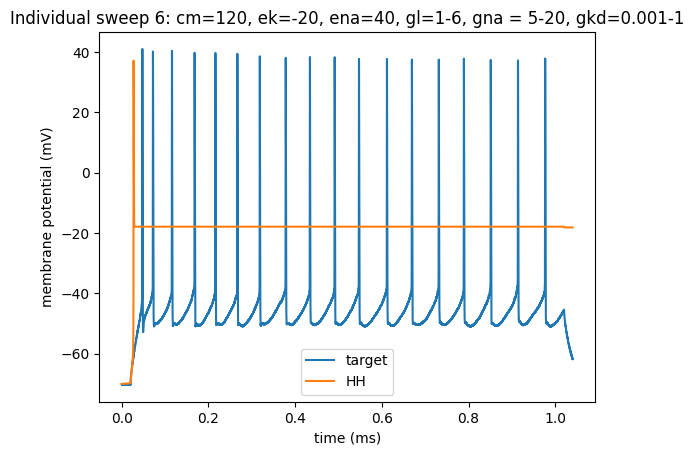

In [180]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_3[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-20, ena=40, gl=1-6, gna = 5-20, gkd=0.001-1')

In [181]:
# ek=-60
hh_sweep6_4 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-60, ena=40,
                     glmin=1, glmax=6, gnamin=5, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.86757047 uS, g_na=7.56726409 uS, gl=2.95309074 nS (error: 289.42689649 mV^2)
Round 1: Best parameters g_kd=0.91563613 uS, g_na=6.31251717 uS, gl=1.84052696 nS (error: 262.14452762 mV^2)
Round 2: Best parameters g_kd=0.89247812 uS, g_na=5.7826663 uS, gl=4.63165687 nS (error: 253.3459301 mV^2)
Round 3: Best parameters g_kd=0.95502815 uS, g_na=5.72712326 uS, gl=5.24299134 nS (error: 244.75670552 mV^2)
Round 4: Best parameters g_kd=0.95055386 uS, g_na=5.43306787 uS, gl=5.39631736 nS (error: 239.90453571 mV^2)
Round 5: Best parameters g_kd=0.96416832 uS, g_na=5.30053846 uS, gl=5.34056104 nS (error: 235.91768793 mV^2)
Round 6: Best parameters g_kd=0.97201368 uS, g_na=5.21433818 uS, gl=5.12405199 nS (error: 233.44222711 mV^2)
Round 7: Best parameters g_kd=0.97973588 uS, g_na=5.19106623 uS, gl=5.78339945 nS (error: 231.8256453 mV^2)
Round 8: Best parameters g_kd=0.98491964 uS, g_na=5.14638944 uS, gl=5.64585355 nS (error: 230.75833738 mV^2)
Round 9: Be

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-60, ena=40, gl=1-6, gna = 5-20, gkd=0.001-1')

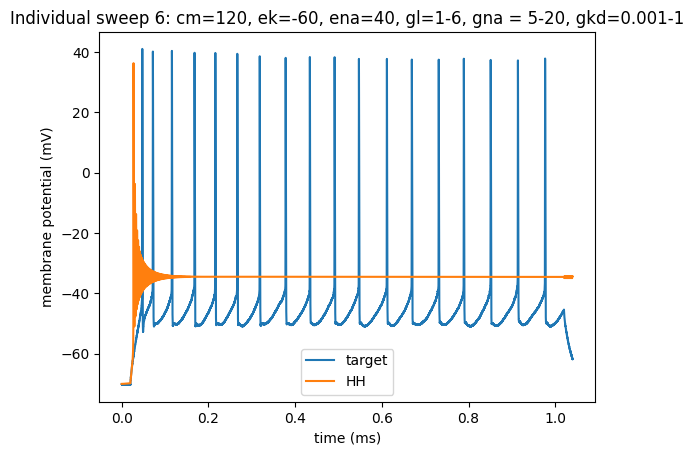

In [182]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_4[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-60, ena=40, gl=1-6, gna = 5-20, gkd=0.001-1')

(0.0, 0.1)

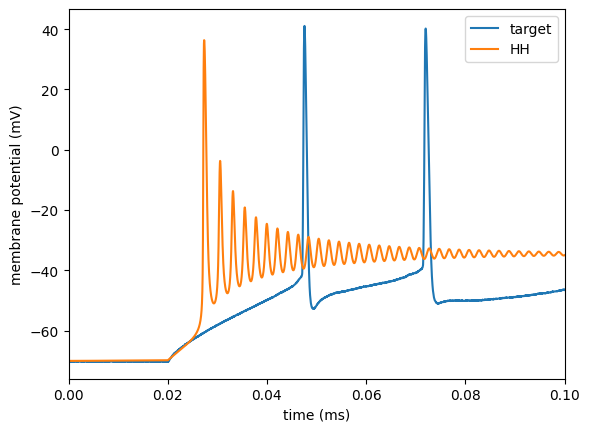

In [183]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_4[0]*1000, d2_title='HH')
xlim(0, 0.1)

In [184]:
# gna=10-20
hh_sweep6_5 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-60, ena=40,
                     glmin=1, glmax=6, gnamin=10, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.8944308 uS, g_na=11.09669937 uS, gl=4.61661646 nS (error: 336.91296777 mV^2)
Round 1: Best parameters g_kd=0.91055927 uS, g_na=10.8117818 uS, gl=4.81980209 nS (error: 330.25599671 mV^2)
Round 2: Best parameters g_kd=0.92935496 uS, g_na=10.66833874 uS, gl=4.51644054 nS (error: 325.57891885 mV^2)
Round 3: Best parameters g_kd=0.95306976 uS, g_na=10.48696368 uS, gl=4.94685472 nS (error: 319.2515219 mV^2)
Round 4: Best parameters g_kd=0.97480699 uS, g_na=10.54386091 uS, gl=4.84493965 nS (error: 316.9486753 mV^2)
Round 5: Best parameters g_kd=0.97703568 uS, g_na=10.32253659 uS, gl=4.63200442 nS (error: 313.81108516 mV^2)
Round 6: Best parameters g_kd=0.98526577 uS, g_na=10.29944833 uS, gl=4.97020742 nS (error: 312.12505328 mV^2)
Round 7: Best parameters g_kd=0.98153293 uS, g_na=10.20424182 uS, gl=5.32716294 nS (error: 311.11707941 mV^2)
Round 8: Best parameters g_kd=0.98799155 uS, g_na=10.21810312 uS, gl=5.48557912 nS (error: 310.30992113 mV^2)
Rou

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-60, ena=40, gl=1-6, gna = 10-20, gkd=0.001-1')

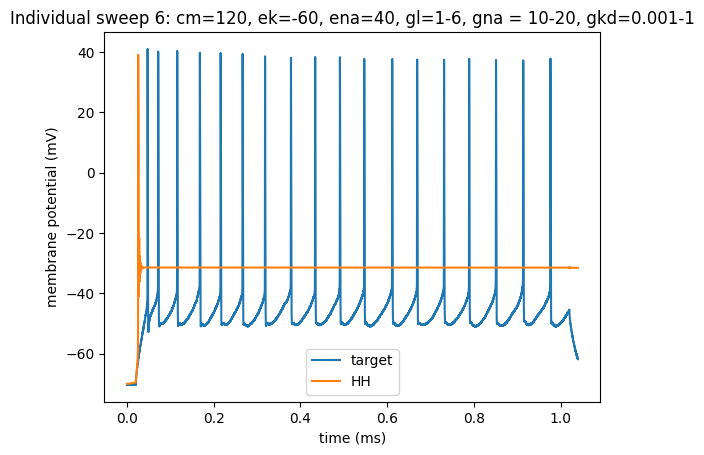

In [185]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_5[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-60, ena=40, gl=1-6, gna = 10-20, gkd=0.001-1')

In [186]:
# ek=-70
# ena=50
# gna=6-20
hh_sweep6_6 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-70, ena=50,
                     glmin=1, glmax=6, gnamin=6, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.7579939 uS, g_na=9.0123639 uS, gl=5.08736061 nS (error: 311.46731611 mV^2)
Round 1: Best parameters g_kd=0.66523556 uS, g_na=7.52293967 uS, gl=5.47024127 nS (error: 303.37242148 mV^2)
Round 2: Best parameters g_kd=0.6613892 uS, g_na=7.05877573 uS, gl=4.46972002 nS (error: 299.12714684 mV^2)
Round 3: Best parameters g_kd=0.6613892 uS, g_na=7.05877573 uS, gl=4.46972002 nS (error: 299.12714684 mV^2)
Round 4: Best parameters g_kd=0.6613892 uS, g_na=7.05877573 uS, gl=4.46972002 nS (error: 299.12714684 mV^2)
Round 5: Best parameters g_kd=0.6181488 uS, g_na=6.57966855 uS, gl=2.64775902 nS (error: 297.13607269 mV^2)
Round 6: Best parameters g_kd=0.6181488 uS, g_na=6.57966855 uS, gl=2.64775902 nS (error: 297.13607269 mV^2)
Round 7: Best parameters g_kd=0.63734834 uS, g_na=6.42012321 uS, gl=1.32310436 nS (error: 293.5955847 mV^2)
Round 8: Best parameters g_kd=0.63734834 uS, g_na=6.42012321 uS, gl=1.32310436 nS (error: 293.5955847 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-70, ena=50, gl=1-6, gna = 6-20, gkd=0.001-1')

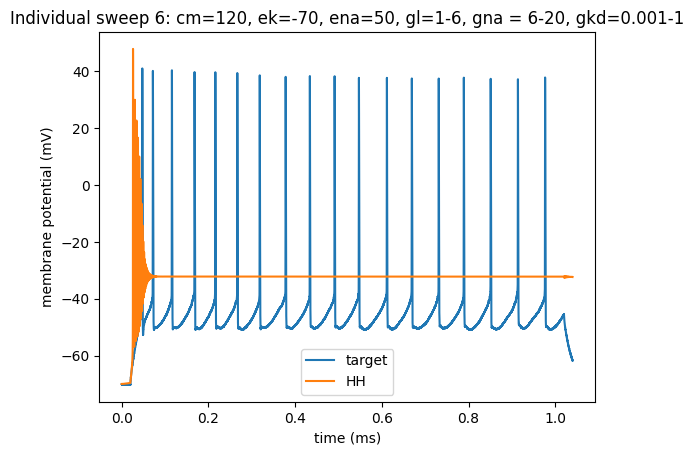

In [187]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_6[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-70, ena=50, gl=1-6, gna = 6-20, gkd=0.001-1')

In [188]:
# ek=-50
# ena=40
# gna=6-20
hh_sweep6_7 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-50, ena=40,
                     glmin=1, glmax=6, gnamin=6, gkdmin=0.001, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.84469474 uS, g_na=8.7993832 uS, gl=3.34522909 nS (error: 372.15475276 mV^2)
Round 1: Best parameters g_kd=0.89549266 uS, g_na=7.69109212 uS, gl=4.63304417 nS (error: 342.12818313 mV^2)
Round 2: Best parameters g_kd=0.91917648 uS, g_na=7.04508191 uS, gl=4.47255959 nS (error: 326.61780818 mV^2)
Round 3: Best parameters g_kd=0.93805363 uS, g_na=6.80078909 uS, gl=4.33574136 nS (error: 319.41274033 mV^2)
Round 4: Best parameters g_kd=0.94374679 uS, g_na=6.49107775 uS, gl=5.07032665 nS (error: 311.91940566 mV^2)
Round 5: Best parameters g_kd=0.97086584 uS, g_na=6.48283038 uS, gl=4.63651017 nS (error: 308.63597349 mV^2)
Round 6: Best parameters g_kd=0.97054617 uS, g_na=6.38316221 uS, gl=5.47055887 nS (error: 305.9622201 mV^2)
Round 7: Best parameters g_kd=0.97896078 uS, g_na=6.27079968 uS, gl=5.18685444 nS (error: 302.96963817 mV^2)
Round 8: Best parameters g_kd=0.98119864 uS, g_na=6.22601312 uS, gl=5.56125707 nS (error: 301.46966869 mV^2)
Round 9: B

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-50, ena=40, gl=1-6, gna=6-20, gkd=0.001-1')

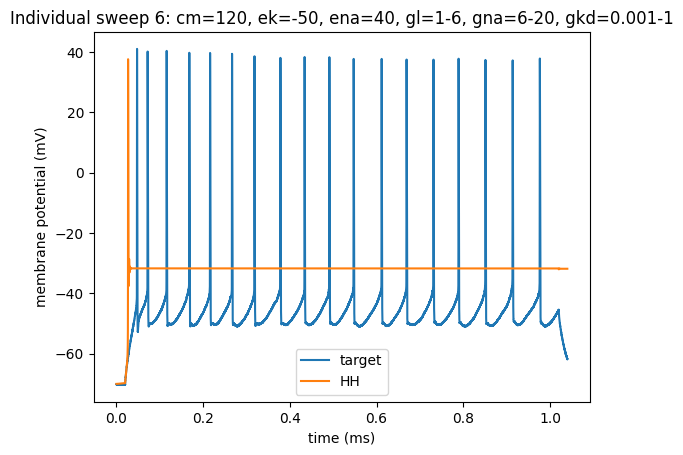

In [189]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_7[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-50, ena=40, gl=1-6, gna=6-20, gkd=0.001-1')

In [193]:
# cm=80
# ek=-50
# ena=40
# gna=6-20
# gkd=0-1
hh_sweep6_8 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=80, ek=-50, ena=40,
                     glmin=1, glmax=6, gnamin=6, gkdmin=0, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.81332299 uS, g_na=7.86094428 uS, gl=4.87411054 nS (error: 361.05027755 mV^2)
Round 1: Best parameters g_kd=0.81332299 uS, g_na=6.90426979 uS, gl=5.37961066 nS (error: 341.58125014 mV^2)
Round 2: Best parameters g_kd=0.89362172 uS, g_na=6.56461966 uS, gl=5.56144142 nS (error: 321.91756952 mV^2)
Round 3: Best parameters g_kd=0.93654923 uS, g_na=6.37828943 uS, gl=2.96321278 nS (error: 314.69559699 mV^2)
Round 4: Best parameters g_kd=0.96003949 uS, g_na=6.30543361 uS, gl=5.36533043 nS (error: 307.9107214 mV^2)
Round 5: Best parameters g_kd=0.97078744 uS, g_na=6.28493961 uS, gl=5.4761291 nS (error: 306.04307761 mV^2)
Round 6: Best parameters g_kd=0.96630153 uS, g_na=6.20758415 uS, gl=5.74159146 nS (error: 304.83080917 mV^2)
Round 7: Best parameters g_kd=0.9796492 uS, g_na=6.16764761 uS, gl=5.74159146 nS (error: 302.38304932 mV^2)
Round 8: Best parameters g_kd=0.98225837 uS, g_na=6.12437842 uS, gl=5.65943806 nS (error: 301.27822222 mV^2)
Round 9: Be

Text(0.5, 1.0, 'Individual sweep 6: cm=80, ek=-50, ena=40, gl=1-6, gna=6-20, gkd=0-1')

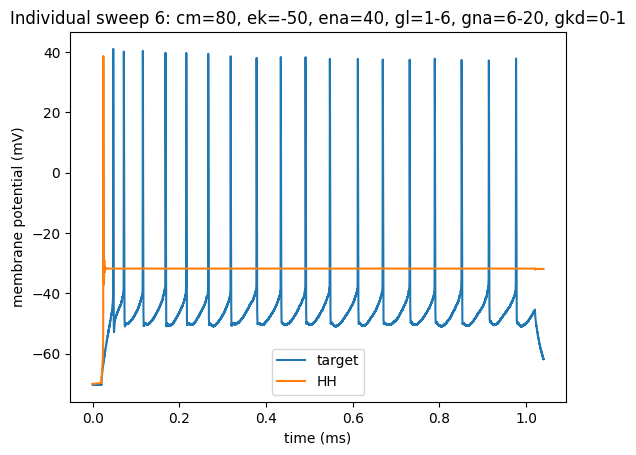

In [194]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_8[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=80, ek=-50, ena=40, gl=1-6, gna=6-20, gkd=0-1')

In [199]:
# cm=80
# ek=-70
# ena=40
# gna=6-20
# gkd=0-1
hh_sweep6_9 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=80, ek=-70, ena=40,
                     glmin=1, glmax=6, gnamin=6, gkdmin=0, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.59655912 uS, g_na=7.66169349 uS, gl=3.55813791 nS (error: 304.10041037 mV^2)
Round 1: Best parameters g_kd=0.58282189 uS, g_na=7.10305641 uS, gl=2.61433197 nS (error: 300.35202465 mV^2)
Round 2: Best parameters g_kd=0.58282189 uS, g_na=7.10305641 uS, gl=2.61433197 nS (error: 300.35202465 mV^2)
Round 3: Best parameters g_kd=0.56480976 uS, g_na=6.9280417 uS, gl=3.99611691 nS (error: 299.45739814 mV^2)
Round 4: Best parameters g_kd=0.56480976 uS, g_na=6.9280417 uS, gl=3.99611691 nS (error: 299.45739814 mV^2)
Round 5: Best parameters g_kd=0.55161054 uS, g_na=6.54982483 uS, gl=2.64450115 nS (error: 298.240026 mV^2)
Round 6: Best parameters g_kd=0.5386834 uS, g_na=6.58070554 uS, gl=2.7739327 nS (error: 298.21675678 mV^2)
Round 7: Best parameters g_kd=0.53645624 uS, g_na=6.32807128 uS, gl=4.62251408 nS (error: 296.39847064 mV^2)
Round 8: Best parameters g_kd=0.53358748 uS, g_na=6.3858316 uS, gl=3.77173077 nS (error: 296.27477958 mV^2)
Round 9: Best p

Text(0.5, 1.0, 'Individual sweep 6: cm=80, ek=-70, ena=40, gl=1-6, gna=6-20, gkd=0-1')

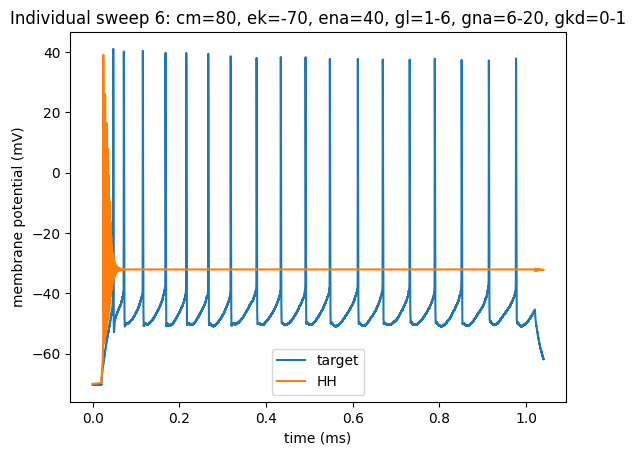

In [200]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_9[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=80, ek=-70, ena=40, gl=1-6, gna=6-20, gkd=0-1')

In [202]:
# cm=80
# ek=-60
# ena=40
# gna=6-20
# gkd=0-1
hh_sweep6_10 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=80, ek=-60, ena=40,
                     glmin=1, glmax=6, gnamin=6, gkdmin=0, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.85242229 uS, g_na=8.20686982 uS, gl=2.48691724 nS (error: 304.44990868 mV^2)
Round 1: Best parameters g_kd=0.87339869 uS, g_na=7.06418899 uS, gl=2.30146214 nS (error: 282.38218202 mV^2)
Round 2: Best parameters g_kd=0.91022141 uS, g_na=6.59169338 uS, gl=4.00874519 nS (error: 268.10384053 mV^2)
Round 3: Best parameters g_kd=0.94739106 uS, g_na=6.38702772 uS, gl=5.06931071 nS (error: 259.41813204 mV^2)
Round 4: Best parameters g_kd=0.94444963 uS, g_na=6.28661051 uS, gl=5.27379921 nS (error: 257.86713814 mV^2)
Round 5: Best parameters g_kd=0.95736215 uS, g_na=6.19887161 uS, gl=5.53233377 nS (error: 254.64864857 mV^2)
Round 6: Best parameters g_kd=0.97049235 uS, g_na=6.1552837 uS, gl=5.45318861 nS (error: 252.49913463 mV^2)
Round 7: Best parameters g_kd=0.97132851 uS, g_na=6.09642834 uS, gl=5.57047018 nS (error: 251.40035362 mV^2)
Round 8: Best parameters g_kd=0.97942359 uS, g_na=6.10464103 uS, gl=5.70439384 nS (error: 250.67565243 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 6: cm=80, ek=-60, ena=40, gl=1-6, gna=6-20, gkd=0-1')

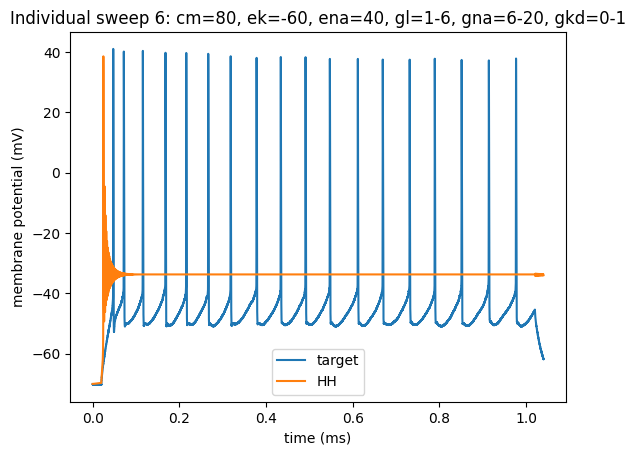

In [203]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_10[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=80, ek=-60, ena=40, gl=1-6, gna=6-20, gkd=0-1')

In [207]:
# cm=80
# ek=-60
# ena=40
# gna=6-20
# gkd=0-0.5
hh_sweep6_11 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=80, ek=-60, ena=40,
                     glmin=1, glmax=6, gnamin=6, gkdmin=0, gkdmax=0.5)

first fit:
Round 0: Best parameters g_kd=0.40504437 uS, g_na=8.33313627 uS, gl=4.80126999 nS (error: 423.99313844 mV^2)
Round 1: Best parameters g_kd=0.45950226 uS, g_na=7.32055145 uS, gl=5.25554904 nS (error: 376.86447655 mV^2)
Round 2: Best parameters g_kd=0.46105149 uS, g_na=6.76321999 uS, gl=5.30513181 nS (error: 363.00889843 mV^2)
Round 3: Best parameters g_kd=0.47723699 uS, g_na=6.52492598 uS, gl=4.94059295 nS (error: 352.28593146 mV^2)
Round 4: Best parameters g_kd=0.47564203 uS, g_na=6.36421968 uS, gl=5.57775411 nS (error: 348.04573426 mV^2)
Round 5: Best parameters g_kd=0.4864635 uS, g_na=6.36488097 uS, gl=5.60467417 nS (error: 344.60564465 mV^2)
Round 6: Best parameters g_kd=0.48985786 uS, g_na=6.26334788 uS, gl=5.67517028 nS (error: 341.00643452 mV^2)
Round 7: Best parameters g_kd=0.48879899 uS, g_na=6.18304542 uS, gl=5.66573134 nS (error: 339.38090442 mV^2)
Round 8: Best parameters g_kd=0.49200306 uS, g_na=6.15563038 uS, gl=5.78205246 nS (error: 337.59432131 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 6: cm=80, ek=-60, ena=40, gl=1-6, gna=6-20, gkd=0-0.5')

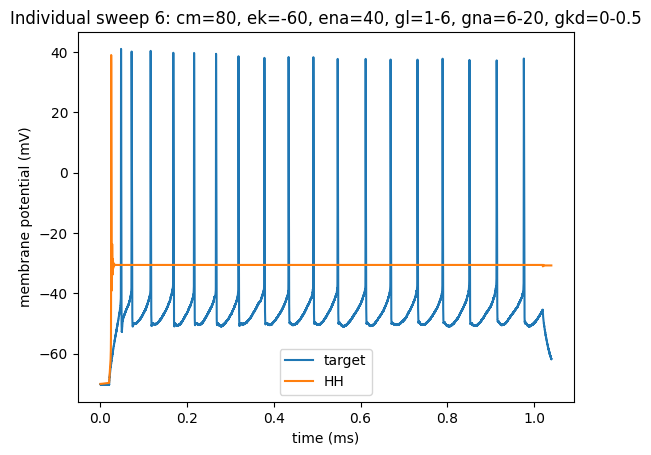

In [208]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_11[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=80, ek=-60, ena=40, gl=1-6, gna=6-20, gkd=0-0.5')

In [211]:
# cm=120
# ek=-70
# ena=40
# gl=0-6
# gna=6-40
# gkd=0-0.5
hh_sweep6_12 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-70, ena=40,
                     glmin=0, glmax=6, gnamin=6, gnamax=40, gkdmin=0, gkdmax=0.5)

first fit:
Round 0: Best parameters g_kd=0.42632938 uS, g_na=10.01318929 uS, gl=2.39731978 nS (error: 398.75465894 mV^2)
Round 1: Best parameters g_kd=0.45005016 uS, g_na=8.59910717 uS, gl=4.68031431 nS (error: 359.11558284 mV^2)
Round 2: Best parameters g_kd=0.47252106 uS, g_na=7.45752452 uS, gl=3.19162544 nS (error: 330.15958 mV^2)
Round 3: Best parameters g_kd=0.4713887 uS, g_na=7.04514194 uS, gl=4.06010014 nS (error: 321.06751522 mV^2)
Round 4: Best parameters g_kd=0.47504008 uS, g_na=6.69393198 uS, gl=4.3657903 nS (error: 312.21086195 mV^2)
Round 5: Best parameters g_kd=0.48490521 uS, g_na=6.63644699 uS, gl=5.20225485 nS (error: 307.28177357 mV^2)
Round 6: Best parameters g_kd=0.48833312 uS, g_na=6.37537499 uS, gl=5.60628694 nS (error: 300.3798552 mV^2)
Round 7: Best parameters g_kd=0.48932272 uS, g_na=6.37032958 uS, gl=5.48363559 nS (error: 300.12198386 mV^2)
Round 8: Best parameters g_kd=0.48834505 uS, g_na=6.23969001 uS, gl=5.63770936 nS (error: 297.42884195 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 6: cm=120, ek=-70, ena=40, gl=0-6, gna=6-40, gkd=0-0.5')

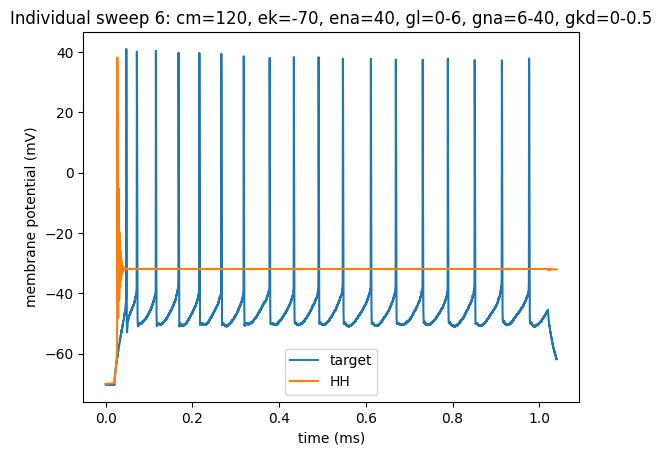

In [212]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_12[0]*1000, d2_title='HH')
title('Individual sweep 6: cm=120, ek=-70, ena=40, gl=0-6, gna=6-40, gkd=0-0.5')

In [215]:
hh_sweep6_13 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_min=60, glmin=0, gkdmax=3)

first fit:
Round 0: Best parameters Cm=115.18258401 pF, EK=-54.73131649 mV, ENa=-35.10848575 mV, El=-77.00981276 mV, VT=-74.69210924 mV, g_kd=2.04683755 uS, g_na=11.63234185 uS, gl=20.2377986 nS (error: 98.007212 mV^2)
Round 1: Best parameters Cm=154.04748523 pF, EK=-74.31369302 mV, ENa=-42.95973398 mV, El=-57.72188031 mV, VT=-61.33410653 mV, g_kd=1.46202373 uS, g_na=6.27641645 uS, gl=12.62180919 nS (error: 96.09273593 mV^2)
Round 2: Best parameters Cm=129.59883051 pF, EK=-80.85365433 mV, ENa=-42.09517697 mV, El=-70.40661216 mV, VT=-60.87527452 mV, g_kd=1.05810062 uS, g_na=7.39599102 uS, gl=5.35186373 nS (error: 92.00266139 mV^2)
Round 3: Best parameters Cm=129.59883051 pF, EK=-80.85365433 mV, ENa=-42.09517697 mV, El=-70.40661216 mV, VT=-60.87527452 mV, g_kd=1.05810062 uS, g_na=7.39599102 uS, gl=5.35186373 nS (error: 92.00266139 mV^2)
Round 4: Best parameters Cm=129.59883051 pF, EK=-80.85365433 mV, ENa=-42.09517697 mV, El=-70.40661216 mV, VT=-60.87527452 mV, g_kd=1.05810062 uS, g_na=7.

Text(0.5, 1.0, 'Individual sweep 6: all params')

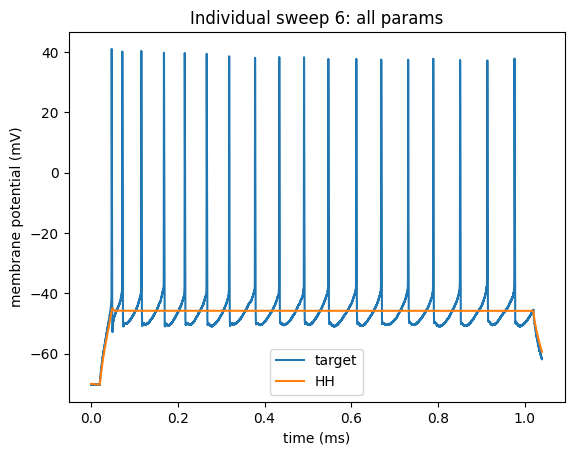

In [216]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_13[0]*1000, d2_title='HH')
title('Individual sweep 6: all params')

In [223]:
hh_sweep6_14 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_min=80, cm_max=200, ena_min=-40, glmin=0, gkdmax=3)

first fit:
Round 0: Best parameters Cm=153.94681129 pF, EK=-55.74506564 mV, ENa=10.7496669 mV, El=-74.480228 mV, VT=-75.96350893 mV, g_kd=2.60181188 uS, g_na=3.45230362 uS, gl=22.99341138 nS (error: 97.27605788 mV^2)
Round 1: Best parameters Cm=153.94681129 pF, EK=-55.74506564 mV, ENa=10.7496669 mV, El=-74.480228 mV, VT=-75.96350893 mV, g_kd=2.60181188 uS, g_na=3.45230362 uS, gl=22.99341138 nS (error: 97.27605788 mV^2)
Round 2: Best parameters Cm=153.94681129 pF, EK=-55.74506564 mV, ENa=10.7496669 mV, El=-74.480228 mV, VT=-75.96350893 mV, g_kd=2.60181188 uS, g_na=3.45230362 uS, gl=22.99341138 nS (error: 97.27605788 mV^2)
Round 3: Best parameters Cm=181.37484852 pF, EK=-53.38733656 mV, ENa=-8.44209472 mV, El=-58.2522699 mV, VT=-55.74608569 mV, g_kd=1.34816962 uS, g_na=2.81390577 uS, gl=18.89273936 nS (error: 96.64446802 mV^2)
Round 4: Best parameters Cm=181.37484852 pF, EK=-53.38733656 mV, ENa=-8.44209472 mV, El=-58.2522699 mV, VT=-55.74608569 mV, g_kd=1.34816962 uS, g_na=2.81390577 uS,

Text(0.5, 1.0, 'Individual sweep 6: all params')

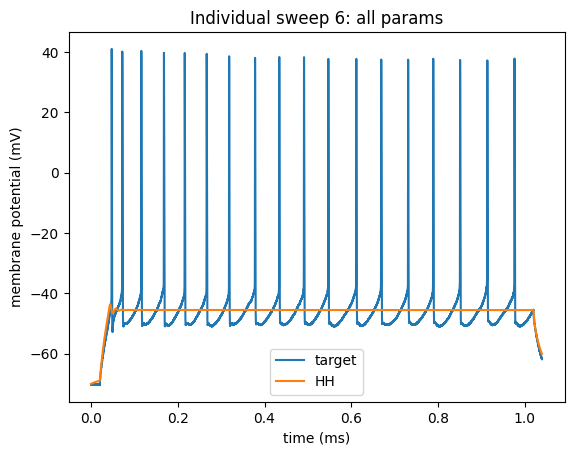

In [224]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_14[0]*1000, d2_title='HH')
title('Individual sweep 6: all params')

In [225]:
hh_sweep6_15 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_min=80, cm_max=200, ena_min=-40, glmin=0, gkdmax=3)

first fit:
Round 0: Best parameters Cm=126.06716393 pF, EK=-49.85163165 mV, ENa=-25.32872812 mV, El=-63.90753242 mV, VT=-81.04756989 mV, g_kd=2.497984 uS, g_na=6.99928064 uS, gl=14.26524059 nS (error: 107.8933665 mV^2)
Round 1: Best parameters Cm=159.44319405 pF, EK=-54.8989628 mV, ENa=-29.58177143 mV, El=-69.17836814 mV, VT=-69.83003018 mV, g_kd=2.18299443 uS, g_na=3.94680723 uS, gl=20.87495417 nS (error: 96.62184588 mV^2)
Round 2: Best parameters Cm=159.44319405 pF, EK=-54.8989628 mV, ENa=-29.58177143 mV, El=-69.17836814 mV, VT=-69.83003018 mV, g_kd=2.18299443 uS, g_na=3.94680723 uS, gl=20.87495417 nS (error: 96.62184588 mV^2)
Round 3: Best parameters Cm=174.73305563 pF, EK=-62.39114911 mV, ENa=-30.64931296 mV, El=-57.64886604 mV, VT=-63.6607646 mV, g_kd=1.97622025 uS, g_na=2.78917123 uS, gl=13.35258 nS (error: 96.24881779 mV^2)
Round 4: Best parameters Cm=174.0878337 pF, EK=-76.26693729 mV, ENa=-31.85717142 mV, El=-56.48029202 mV, VT=-63.65330849 mV, g_kd=1.22489688 uS, g_na=2.81770

Text(0.5, 1.0, 'Individual sweep 6: all params')

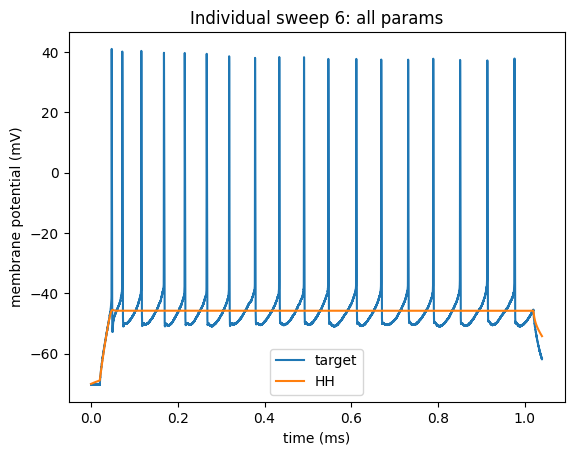

In [229]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_15[0]*1000, d2_title='HH')
title('Individual sweep 6: all params')

In [226]:
hh_sweep6_16 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_min=80, cm_max=200, ena_min=-40, glmin=0, gkdmax=3)

first fit:
Round 0: Best parameters Cm=136.33408935 pF, EK=-55.07271778 mV, ENa=-24.87546617 mV, El=-72.70122251 mV, VT=-76.3208386 mV, g_kd=2.14247497 uS, g_na=8.59362111 uS, gl=9.52807078 nS (error: 101.91564025 mV^2)
Round 1: Best parameters Cm=136.33408935 pF, EK=-55.07271778 mV, ENa=-24.87546617 mV, El=-72.70122251 mV, VT=-76.3208386 mV, g_kd=2.14247497 uS, g_na=8.59362111 uS, gl=9.52807078 nS (error: 101.91564025 mV^2)
Round 2: Best parameters Cm=111.04420868 pF, EK=-55.16727603 mV, ENa=-30.2173004 mV, El=-76.6619956 mV, VT=-73.16399008 mV, g_kd=0.84998006 uS, g_na=2.98141027 uS, gl=7.75718806 nS (error: 97.709482 mV^2)
Round 3: Best parameters Cm=97.21370339 pF, EK=-60.58266021 mV, ENa=-30.09501364 mV, El=-76.6619956 mV, VT=-73.16399008 mV, g_kd=0.84998006 uS, g_na=2.98141027 uS, gl=7.75718806 nS (error: 95.26135429 mV^2)
Round 4: Best parameters Cm=166.67230559 pF, EK=-75.05769374 mV, ENa=-32.37684503 mV, El=-64.29998709 mV, VT=-58.7073636 mV, g_kd=1.40506035 uS, g_na=2.1153831

Text(0.5, 1.0, 'Individual sweep 6: all params')

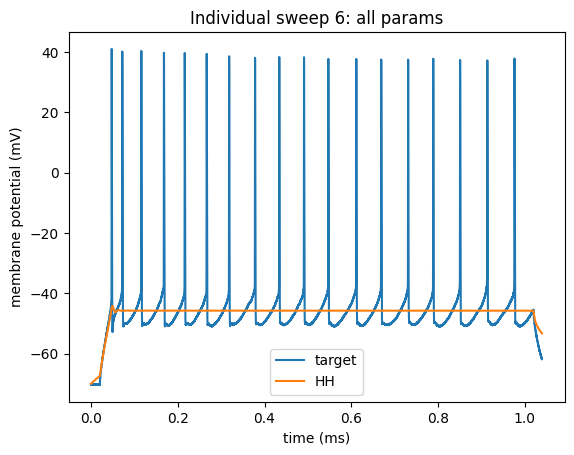

In [230]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_16[0]*1000, d2_title='HH')
title('Individual sweep 6: all params')

In [227]:
hh_sweep6_17 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_min=80, cm_max=200, ena_min=-40, glmin=0, gkdmax=3)

first fit:
Round 0: Best parameters Cm=174.90431742 pF, EK=-51.33755358 mV, ENa=-16.12472201 mV, El=-72.32971161 mV, VT=-78.05208584 mV, g_kd=1.94197702 uS, g_na=5.17359524 uS, gl=24.48903771 nS (error: 99.9060239 mV^2)
Round 1: Best parameters Cm=171.41224693 pF, EK=-58.4220891 mV, ENa=-33.02337669 mV, El=-74.39830526 mV, VT=-77.80779774 mV, g_kd=1.81760225 uS, g_na=13.61857312 uS, gl=32.06731856 nS (error: 95.94445445 mV^2)
Round 2: Best parameters Cm=171.41224693 pF, EK=-58.4220891 mV, ENa=-33.02337669 mV, El=-74.39830526 mV, VT=-77.80779774 mV, g_kd=1.81760225 uS, g_na=13.61857312 uS, gl=32.06731856 nS (error: 95.94445445 mV^2)
Round 3: Best parameters Cm=174.92762057 pF, EK=-62.66883328 mV, ENa=-32.42725786 mV, El=-73.22062906 mV, VT=-74.59650586 mV, g_kd=2.22961332 uS, g_na=13.7241643 uS, gl=16.17814341 nS (error: 95.57514727 mV^2)
Round 4: Best parameters Cm=174.92762057 pF, EK=-62.66883328 mV, ENa=-32.42725786 mV, El=-73.22062906 mV, VT=-74.59650586 mV, g_kd=2.22961332 uS, g_na

Text(0.5, 1.0, 'Individual sweep 6: all params')

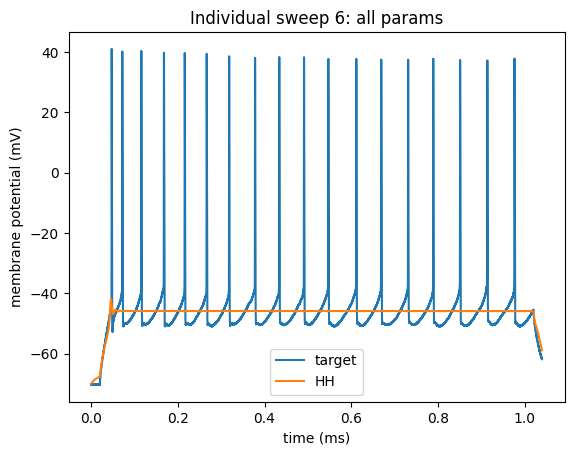

In [231]:
create_comparison_together(reshaped_ls_sweep4_out[0], hh_sweep6_17[0]*1000, d2_title='HH')
title('Individual sweep 6: all params')

In [228]:
hh_sweep6_18 = run_hh_all_params(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_min=80, cm_max=200, ena_min=-40, glmin=0, gkdmax=3)

first fit:
Round 0: Best parameters Cm=111.88607541 pF, EK=-63.4351385 mV, ENa=-18.89217879 mV, El=-66.12418165 mV, VT=-82.22992878 mV, g_kd=0.98395406 uS, g_na=10.14379992 uS, gl=9.23354976 nS (error: 108.4217725 mV^2)
Round 1: Best parameters Cm=152.93947723 pF, EK=-47.15100762 mV, ENa=-30.92299197 mV, El=-74.11695075 mV, VT=-83.4138755 mV, g_kd=1.99805346 uS, g_na=7.56092703 uS, gl=31.19630252 nS (error: 107.46114852 mV^2)
Round 2: Best parameters Cm=163.83954694 pF, EK=-50.3490946 mV, ENa=-35.44378433 mV, El=-69.58075976 mV, VT=-73.57101355 mV, g_kd=1.30638923 uS, g_na=5.0332548 uS, gl=29.90493399 nS (error: 95.65269202 mV^2)
Round 3: Best parameters Cm=163.83954694 pF, EK=-50.3490946 mV, ENa=-35.44378433 mV, El=-69.58075976 mV, VT=-73.57101355 mV, g_kd=1.30638923 uS, g_na=5.0332548 uS, gl=29.90493399 nS (error: 95.65269202 mV^2)
Round 4: Best parameters Cm=163.83954694 pF, EK=-50.3490946 mV, ENa=-35.44378433 mV, El=-69.58075976 mV, VT=-73.57101355 mV, g_kd=1.30638923 uS, g_na=5.03

Text(0.5, 1.0, 'Individual sweep 6: all params')

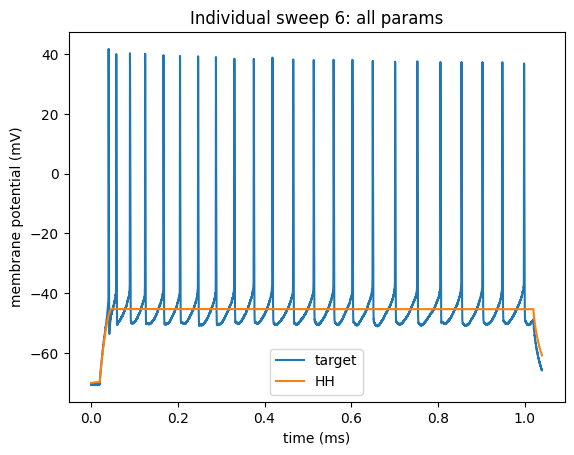

In [250]:
create_comparison_together(reshaped_ls_sweep6_out[0], hh_sweep6_18[0]*1000, d2_title='HH')
title('Individual sweep 6: all params')

In [233]:
# cm=120
# ek=-80
# ena=60
# gl=0-6
# vt=-50
# gna=5-40
# gkd=0-0.5
hh_sweep6_19 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-80, ena=60, vt=-50, 
                     glmin=0, glmax=6, gnamin=5, gnamax=40, gkdmin=0, gkdmax=0.5)

first fit:
Round 0: Best parameters g_kd=0.40935444 uS, g_na=12.85983569 uS, gl=2.31208022 nS (error: 824.99210969 mV^2)
Round 1: Best parameters g_kd=0.42970521 uS, g_na=11.44474548 uS, gl=4.42927273 nS (error: 562.83671995 mV^2)
Round 2: Best parameters g_kd=0.44940909 uS, g_na=7.8387575 uS, gl=5.00614002 nS (error: 417.06717691 mV^2)
Round 3: Best parameters g_kd=0.45360816 uS, g_na=7.3365263 uS, gl=5.41905249 nS (error: 393.78244409 mV^2)
Round 4: Best parameters g_kd=0.45491598 uS, g_na=7.07171403 uS, gl=5.63582247 nS (error: 362.37807541 mV^2)
Round 5: Best parameters g_kd=0.47262771 uS, g_na=6.95597414 uS, gl=5.69353295 nS (error: 328.81433008 mV^2)
Round 6: Best parameters g_kd=0.47314548 uS, g_na=6.58713797 uS, gl=5.64631645 nS (error: 324.75422619 mV^2)
Round 7: Best parameters g_kd=0.46582381 uS, g_na=6.45530852 uS, gl=5.84463996 nS (error: 311.95969659 mV^2)
Round 8: Best parameters g_kd=0.47797786 uS, g_na=6.10779837 uS, gl=5.75772359 nS (error: 306.1475115 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 6: c=120, ek=-80, ena=60, vt=-50, gl=0-6, gna=5-40, gkd=0-0.5')

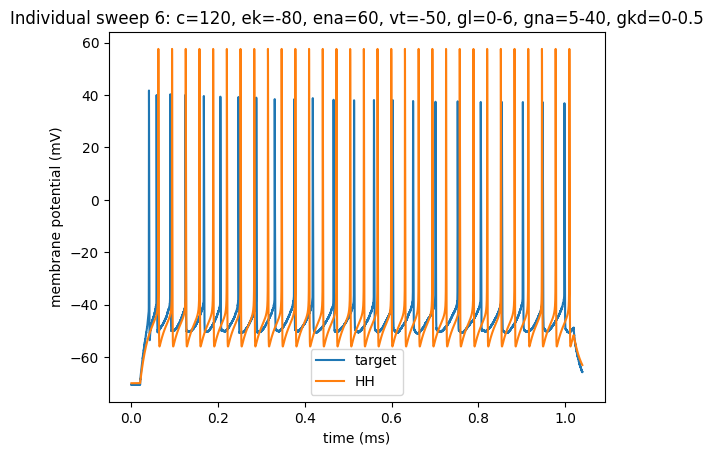

In [249]:
create_comparison_together(reshaped_ls_sweep6_out[0], hh_sweep6_19[0]*1000, d2_title='HH')
title('Individual sweep 6: c=120, ek=-80, ena=60, vt=-50, gl=0-6, gna=5-40, gkd=0-0.5')

In [237]:
# cm=120
# ek=-80
# ena=50
# gl=0-6
# vt=-50
# gna=5-40
# gkd=0-2
hh_sweep6_20 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-80, ena=50, vt=-50, 
                     glmin=0, glmax=6, gnamin=5, gnamax=40, gkdmin=0, gkdmax=2)

first fit:
Round 0: Best parameters g_kd=1.3837538 uS, g_na=10.58195741 uS, gl=4.99934677 nS (error: 327.63676735 mV^2)
Round 1: Best parameters g_kd=0.89497739 uS, g_na=8.09168723 uS, gl=5.06778527 nS (error: 299.71212605 mV^2)
Round 2: Best parameters g_kd=1.03201517 uS, g_na=7.27518464 uS, gl=5.4441637 nS (error: 285.41107529 mV^2)
Round 3: Best parameters g_kd=1.7276105 uS, g_na=6.3982753 uS, gl=5.63245068 nS (error: 264.41636127 mV^2)
Round 4: Best parameters g_kd=1.7276105 uS, g_na=6.3982753 uS, gl=5.63245068 nS (error: 264.41636127 mV^2)
Round 5: Best parameters g_kd=1.52743771 uS, g_na=6.17687411 uS, gl=5.80513297 nS (error: 261.85552111 mV^2)
Round 6: Best parameters g_kd=1.22992407 uS, g_na=5.94682472 uS, gl=5.82469446 nS (error: 258.53524639 mV^2)
Round 7: Best parameters g_kd=1.11642863 uS, g_na=6.21534711 uS, gl=5.88037287 nS (error: 248.69995418 mV^2)
Round 8: Best parameters g_kd=0.89497739 uS, g_na=5.69332602 uS, gl=5.89747665 nS (error: 245.70649644 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 6: c=120, ek=-80, ena=50, vt=-50, gl=0-6, gna=5-40, gkd=0-2')

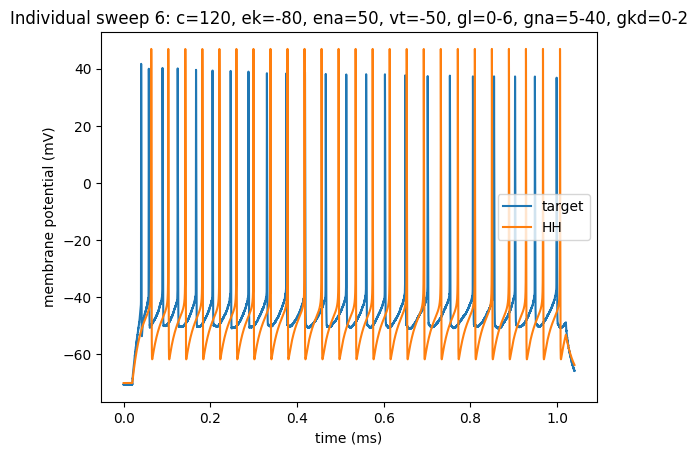

In [248]:
create_comparison_together(reshaped_ls_sweep6_out[0], hh_sweep6_20[0]*1000, d2_title='HH')
title('Individual sweep 6: c=120, ek=-80, ena=50, vt=-50, gl=0-6, gna=5-40, gkd=0-2')

In [239]:
# cm=120
# ek=-80
# ena=40
# gl=0-6
# vt=-50
# gna=5-40
# gkd=0-3
hh_sweep6_21 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-80, ena=40, vt=-50, 
                     glmin=0, glmax=6, gnamin=5, gnamax=40, gkdmin=0, gkdmax=3)

first fit:
Round 0: Best parameters g_kd=1.51246612 uS, g_na=10.01585706 uS, gl=5.30212539 nS (error: 287.04961012 mV^2)
Round 1: Best parameters g_kd=1.48895944 uS, g_na=8.09161735 uS, gl=5.4576753 nS (error: 267.43772923 mV^2)
Round 2: Best parameters g_kd=0.84900553 uS, g_na=6.97766973 uS, gl=5.42535689 nS (error: 253.35091922 mV^2)
Round 3: Best parameters g_kd=1.16623608 uS, g_na=6.29217099 uS, gl=5.71602436 nS (error: 241.58073166 mV^2)
Round 4: Best parameters g_kd=0.71207869 uS, g_na=5.91622223 uS, gl=5.76018028 nS (error: 231.60755678 mV^2)
Round 5: Best parameters g_kd=0.84383275 uS, g_na=5.94086277 uS, gl=5.81950884 nS (error: 230.90179944 mV^2)
Round 6: Best parameters g_kd=0.79917637 uS, g_na=5.50571096 uS, gl=5.82888464 nS (error: 226.43589856 mV^2)
Round 7: Best parameters g_kd=1.05782081 uS, g_na=5.47313263 uS, gl=5.86730018 nS (error: 213.43658578 mV^2)
Round 8: Best parameters g_kd=1.05782081 uS, g_na=5.47313263 uS, gl=5.86730018 nS (error: 213.43658578 mV^2)
Round 9:

Text(0.5, 1.0, 'Individual sweep 6: c=120, ek=-80, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-3')

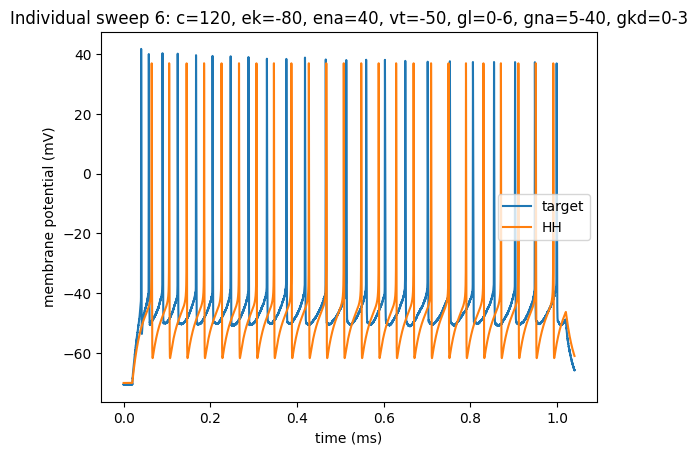

In [247]:
create_comparison_together(reshaped_ls_sweep6_out[0], hh_sweep6_21[0]*1000, d2_title='HH')
title('Individual sweep 6: c=120, ek=-80, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-3')

In [241]:
# cm=120
# ek=-70
# ena=40
# gl=0-6
# vt=-50
# gna=5-40
# gkd=0-3
hh_sweep6_22 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-70, ena=40, vt=-50, 
                     glmin=0, glmax=6, gnamin=5, gnamax=40, gkdmin=0, gkdmax=3)

first fit:
Round 0: Best parameters g_kd=1.23221965 uS, g_na=12.06746334 uS, gl=5.3371625 nS (error: 292.87516895 mV^2)
Round 1: Best parameters g_kd=2.26350864 uS, g_na=9.93398354 uS, gl=5.12532329 nS (error: 268.32880043 mV^2)
Round 2: Best parameters g_kd=2.30877348 uS, g_na=8.35871055 uS, gl=5.66956322 nS (error: 238.59727554 mV^2)
Round 3: Best parameters g_kd=2.36541065 uS, g_na=7.02787492 uS, gl=5.56129925 nS (error: 222.23932171 mV^2)
Round 4: Best parameters g_kd=1.89381993 uS, g_na=6.48379772 uS, gl=5.63611219 nS (error: 218.25218376 mV^2)
Round 5: Best parameters g_kd=2.56966316 uS, g_na=6.40920266 uS, gl=5.81862627 nS (error: 212.54695108 mV^2)
Round 6: Best parameters g_kd=2.52376255 uS, g_na=5.89524416 uS, gl=5.8650045 nS (error: 210.64129676 mV^2)
Round 7: Best parameters g_kd=2.62994275 uS, g_na=6.04653246 uS, gl=5.85216406 nS (error: 208.65952784 mV^2)
Round 8: Best parameters g_kd=2.53139149 uS, g_na=5.76828775 uS, gl=5.85216406 nS (error: 204.61387191 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 6: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-3')

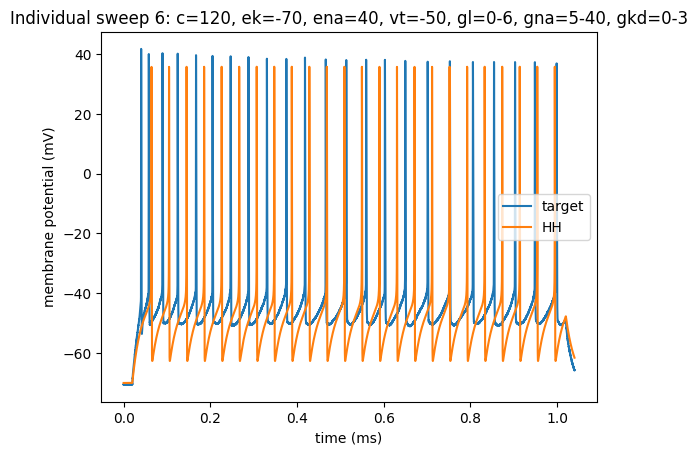

In [246]:
create_comparison_together(reshaped_ls_sweep6_out[0], hh_sweep6_22[0]*1000, d2_title='HH')
title('Individual sweep 6: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-3')

In [243]:
# cm=120
# ek=-70
# ena=40
# gl=0-6
# vt=-50
# gna=5-40
# gkd=0-4
hh_sweep6_23 = run_hh(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, ek=-70, ena=40, vt=-50, 
                     glmin=0, glmax=6, gnamin=5, gnamax=40, gkdmin=0, gkdmax=4)

first fit:
Round 0: Best parameters g_kd=2.04517046 uS, g_na=14.40034538 uS, gl=5.15545626 nS (error: 275.25104094 mV^2)
Round 1: Best parameters g_kd=2.00832899 uS, g_na=9.9805128 uS, gl=4.93042355 nS (error: 252.84234262 mV^2)
Round 2: Best parameters g_kd=2.00832899 uS, g_na=9.9805128 uS, gl=4.93042355 nS (error: 252.84234262 mV^2)
Round 3: Best parameters g_kd=2.42830482 uS, g_na=9.58832031 uS, gl=4.75643568 nS (error: 248.86790358 mV^2)
Round 4: Best parameters g_kd=2.41231385 uS, g_na=7.25597115 uS, gl=5.08646655 nS (error: 248.53800771 mV^2)
Round 5: Best parameters g_kd=2.41231385 uS, g_na=7.25597115 uS, gl=5.08646655 nS (error: 248.53800771 mV^2)
Round 6: Best parameters g_kd=2.11787275 uS, g_na=7.91690025 uS, gl=4.96403903 nS (error: 245.64581866 mV^2)
Round 7: Best parameters g_kd=3.08648815 uS, g_na=8.49033823 uS, gl=5.01027457 nS (error: 240.77931115 mV^2)
Round 8: Best parameters g_kd=3.08648815 uS, g_na=8.49033823 uS, gl=5.01027457 nS (error: 240.77931115 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 6: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-4')

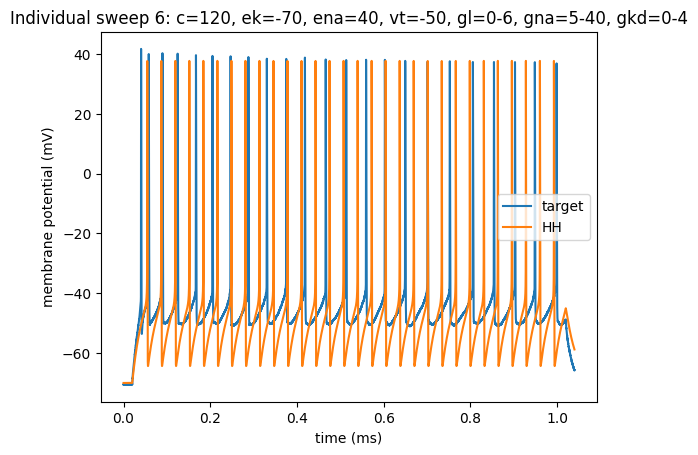

In [244]:
create_comparison_together(reshaped_ls_sweep6_out[0], hh_sweep6_23[0]*1000, d2_title='HH')
title('Individual sweep 6: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-4')

In [245]:

hh_sweep7_0 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70, ena=40, vt=-50, 
                     glmin=0, glmax=6, gnamin=5, gnamax=40, gkdmin=0, gkdmax=4)

first fit:
Round 0: Best parameters g_kd=2.8536329 uS, g_na=13.09735662 uS, gl=5.39681391 nS (error: 389.78377843 mV^2)
Round 1: Best parameters g_kd=2.96732674 uS, g_na=9.0718884 uS, gl=5.43471771 nS (error: 355.48098959 mV^2)
Round 2: Best parameters g_kd=2.79065984 uS, g_na=7.36900806 uS, gl=5.41977907 nS (error: 342.25852275 mV^2)
Round 3: Best parameters g_kd=2.71652219 uS, g_na=7.21016335 uS, gl=5.71185124 nS (error: 331.88725124 mV^2)
Round 4: Best parameters g_kd=2.4953066 uS, g_na=6.48654182 uS, gl=5.75184969 nS (error: 324.30029409 mV^2)
Round 5: Best parameters g_kd=2.91380043 uS, g_na=6.30810935 uS, gl=5.85673174 nS (error: 314.96613892 mV^2)
Round 6: Best parameters g_kd=3.5596368 uS, g_na=5.96406499 uS, gl=5.86904764 nS (error: 295.35784619 mV^2)
Round 7: Best parameters g_kd=3.57011074 uS, g_na=5.83409197 uS, gl=5.85739825 nS (error: 293.15440429 mV^2)
Round 8: Best parameters g_kd=3.57011074 uS, g_na=5.83409197 uS, gl=5.85739825 nS (error: 293.15440429 mV^2)
Round 9: Be

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-4')

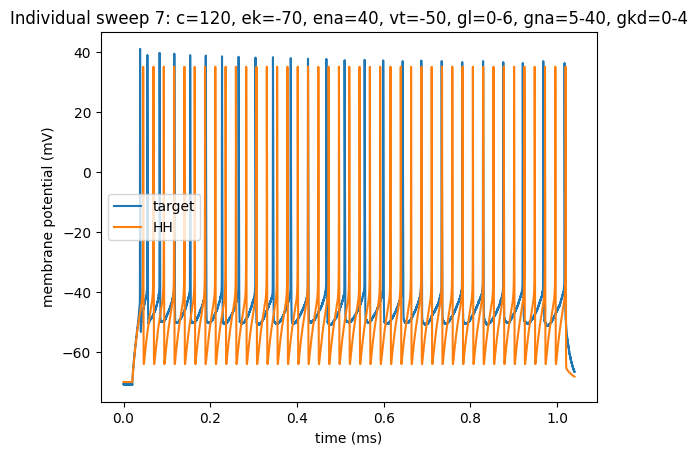

In [251]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_0[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-40, gkd=0-4')

In [6]:
# c=120
hh_sweep7_1 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120)

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters g_kd=0.49148838 uS, g_na=7.62249907 uS, gl=20.62794997 nS (error: 139.88756512 mV^2)
Round 1: Best parameters g_kd=0.4090427 uS, g_na=6.21503726 uS, gl=19.20751056 nS (error: 139.86509988 mV^2)
Round 2: Best parameters g_kd=0.38060293 uS, g_na=4.10127213 uS, gl=19.63720209 nS (error: 138.96771815 mV^2)
Round 3: Best parameters g_kd=193.048565 nS, g_na=2.30137458 uS, gl=15.7825 nS (error: 137.78349787 mV^2)
Round 4: Best parameters g_kd=172.11581691 nS, g_na=2.76237822 uS, gl=17.61240516 nS (error: 136.28923847 mV^2)
Round 5: Best parameters g_kd=141.12709413 nS, g_na=2.34426689 uS, gl=15.82594672 nS (error: 135.96169446 mV^2)
Round 6: Best parameters g_kd=104.16652337 nS, g_na=2.08528873 uS, gl=15.32036118 nS (error: 135.43926671 mV^2)
Round 7: Best parameters g_kd=81.86213841 nS, g_na=1.61099205 uS, gl=13.3916502 nS (error: 135.24955591 mV^2)
Round 8: Best parameters g_kd=71.41710131 nS, g_na=1.65050253 uS, gl=13.4302338 nS (error: 135.1600949 mV^2)

Text(0.5, 1.0, 'Individual sweep 7: c=120')

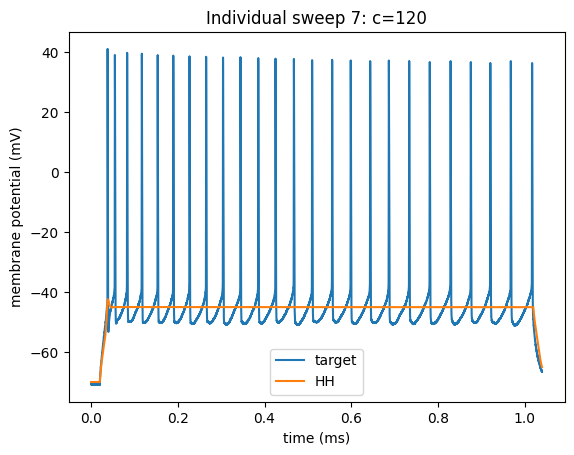

In [7]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_1[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120')

In [8]:
# c=120
# ek=-70
hh_sweep7_2 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70)

first fit:
Round 0: Best parameters g_kd=0.7691092 uS, g_na=11.23404745 uS, gl=27.84632869 nS (error: 139.8858347 mV^2)
Round 1: Best parameters g_kd=0.7691092 uS, g_na=11.23404745 uS, gl=27.84632869 nS (error: 139.8858347 mV^2)
Round 2: Best parameters g_kd=0.32810422 uS, g_na=5.32013724 uS, gl=23.28128031 nS (error: 139.34373105 mV^2)
Round 3: Best parameters g_kd=0.32211464 uS, g_na=3.26322512 uS, gl=18.80701752 nS (error: 137.46031054 mV^2)
Round 4: Best parameters g_kd=273.95214326 nS, g_na=2.7330067 uS, gl=17.21668496 nS (error: 137.21084017 mV^2)
Round 5: Best parameters g_kd=220.89588921 nS, g_na=2.35541299 uS, gl=15.66613012 nS (error: 136.636403 mV^2)
Round 6: Best parameters g_kd=133.2025881 nS, g_na=1.78855748 uS, gl=13.94198351 nS (error: 135.5636474 mV^2)
Round 7: Best parameters g_kd=87.13795104 nS, g_na=1.48587911 uS, gl=13.38220663 nS (error: 135.13385781 mV^2)
Round 8: Best parameters g_kd=66.14770827 nS, g_na=1.38877387 uS, gl=13.08005414 nS (error: 135.07562147 mV^2

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70')

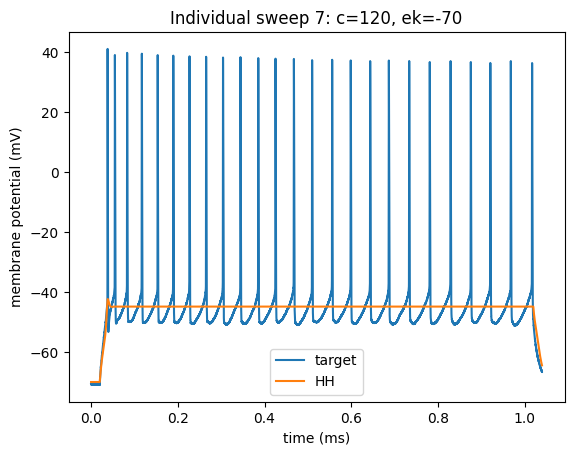

In [9]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_2[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70')

In [10]:
# c=120
# ek=-70
# ena = 40
hh_sweep7_3 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70, ena=40)

first fit:
Round 0: Best parameters g_kd=0.43422752 uS, g_na=4.94141659 uS, gl=33.31871978 nS (error: 284.33575522 mV^2)
Round 1: Best parameters g_kd=0.37065821 uS, g_na=2.8924981 uS, gl=16.46072365 nS (error: 254.67340152 mV^2)
Round 2: Best parameters g_kd=0.32981181 uS, g_na=2.23462188 uS, gl=18.78655307 nS (error: 240.83780818 mV^2)
Round 3: Best parameters g_kd=0.32981181 uS, g_na=2.23462188 uS, gl=18.78655307 nS (error: 240.83780818 mV^2)
Round 4: Best parameters g_kd=0.31885308 uS, g_na=1.7680432 uS, gl=13.74909909 nS (error: 235.15740506 mV^2)
Round 5: Best parameters g_kd=0.32981181 uS, g_na=1.77826296 uS, gl=12.57015783 nS (error: 229.4027739 mV^2)
Round 6: Best parameters g_kd=0.32981181 uS, g_na=1.77826296 uS, gl=12.57015783 nS (error: 229.4027739 mV^2)
Round 7: Best parameters g_kd=267.96003117 nS, g_na=1.59491231 uS, gl=14.04862271 nS (error: 228.84577155 mV^2)
Round 8: Best parameters g_kd=296.48724448 nS, g_na=1.68275694 uS, gl=14.7830063 nS (error: 227.4548545 mV^2)
R

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70, ena=40')

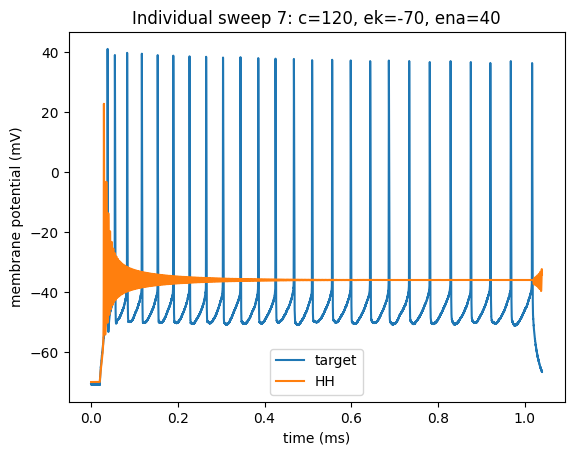

In [11]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_3[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70, ena=40')

In [12]:
# c=120
# ek=-70
# ena = 40
# vt=-50
hh_sweep7_4 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70, ena=40, vt=-50)

first fit:
Round 0: Best parameters g_kd=1.49305949 uS, g_na=15.94050832 uS, gl=12.86198902 nS (error: 185.75673338 mV^2)
Round 1: Best parameters g_kd=0.96038404 uS, g_na=13.35233299 uS, gl=11.60580444 nS (error: 160.27633679 mV^2)
Round 2: Best parameters g_kd=0.46701049 uS, g_na=17.36674453 uS, gl=11.22140008 nS (error: 148.15961242 mV^2)
Round 3: Best parameters g_kd=1.78297718 uS, g_na=14.42596264 uS, gl=11.07798812 nS (error: 147.1892846 mV^2)
Round 4: Best parameters g_kd=1.4839313 uS, g_na=8.56019931 uS, gl=10.6248547 nS (error: 142.03273135 mV^2)
Round 5: Best parameters g_kd=0.36856555 uS, g_na=9.07560635 uS, gl=10.63910148 nS (error: 140.72516635 mV^2)
Round 6: Best parameters g_kd=286.88793633 nS, g_na=8.96772485 uS, gl=10.62733326 nS (error: 140.38336467 mV^2)
Round 7: Best parameters g_kd=241.98643043 nS, g_na=6.77666654 uS, gl=10.4394577 nS (error: 140.06106889 mV^2)
Round 8: Best parameters g_kd=0.81737186 uS, g_na=6.19403022 uS, gl=10.35927196 nS (error: 139.52820095 m

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70, ena=40, vt=-50')

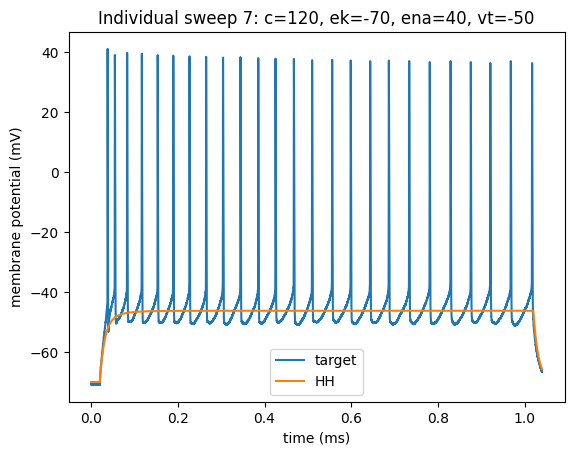

In [13]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_4[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70, ena=40, vt=-50')

In [14]:
# c=120
# ek=-70
# ena = 40
# vt=-50
# gl=0-6
hh_sweep7_5 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70, ena=40, vt=-50, glmin=0, glmax=6)

first fit:
Round 0: Best parameters g_kd=2.5335495 uS, g_na=4.71584454 uS, gl=4.37933863 nS (error: 334.48875925 mV^2)
Round 1: Best parameters g_kd=2.93567433 uS, g_na=3.12468649 uS, gl=5.13414553 nS (error: 296.70826239 mV^2)
Round 2: Best parameters g_kd=3.2431091 uS, g_na=2.61996182 uS, gl=5.36367635 nS (error: 257.05509444 mV^2)
Round 3: Best parameters g_kd=2.54291841 uS, g_na=2.20846144 uS, gl=5.486353 nS (error: 252.46413179 mV^2)
Round 4: Best parameters g_kd=3.27718259 uS, g_na=1.66905477 uS, gl=5.51619251 nS (error: 240.75262881 mV^2)
Round 5: Best parameters g_kd=3.01102842 uS, g_na=1.59242188 uS, gl=5.55567949 nS (error: 236.70452043 mV^2)
Round 6: Best parameters g_kd=3.30594939 uS, g_na=1.40024972 uS, gl=5.42473291 nS (error: 229.41602742 mV^2)
Round 7: Best parameters g_kd=3.39742838 uS, g_na=1.4163943 uS, gl=5.65017514 nS (error: 228.77274212 mV^2)
Round 8: Best parameters g_kd=3.62399978 uS, g_na=1.27591908 uS, gl=5.61148697 nS (error: 225.34378345 mV^2)
Round 9: Best

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6')

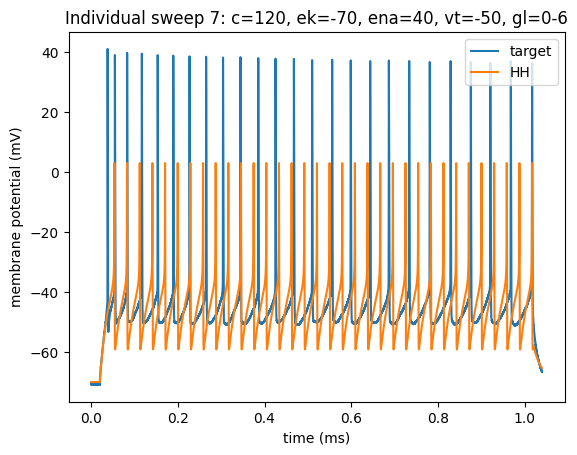

In [15]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_5[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6')

In [16]:
# c=120
# ek=-70
# ena = 40
# vt=-50
# gl=0-6
# gna=5-20
hh_sweep7_6 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70, ena=40, vt=-50, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20)

first fit:
Round 0: Best parameters g_kd=2.21282396 uS, g_na=7.58416036 uS, gl=4.46264675 nS (error: 357.44049798 mV^2)
Round 1: Best parameters g_kd=1.72469881 uS, g_na=6.41156522 uS, gl=4.80053834 nS (error: 337.72480561 mV^2)
Round 2: Best parameters g_kd=3.45122877 uS, g_na=6.60507509 uS, gl=4.56376566 nS (error: 328.37522403 mV^2)
Round 3: Best parameters g_kd=3.18229988 uS, g_na=6.22800247 uS, gl=5.44291101 nS (error: 324.33001373 mV^2)
Round 4: Best parameters g_kd=3.11073741 uS, g_na=5.56395471 uS, gl=5.38611884 nS (error: 319.9092266 mV^2)
Round 5: Best parameters g_kd=3.44046149 uS, g_na=5.54377463 uS, gl=5.6320103 nS (error: 314.41406822 mV^2)
Round 6: Best parameters g_kd=3.44046149 uS, g_na=5.54377463 uS, gl=5.6320103 nS (error: 314.41406822 mV^2)
Round 7: Best parameters g_kd=3.53360177 uS, g_na=5.30690381 uS, gl=5.56846516 nS (error: 296.53863182 mV^2)
Round 8: Best parameters g_kd=3.65379168 uS, g_na=5.26287804 uS, gl=5.53072144 nS (error: 292.31298754 mV^2)
Round 9: Be

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-20')

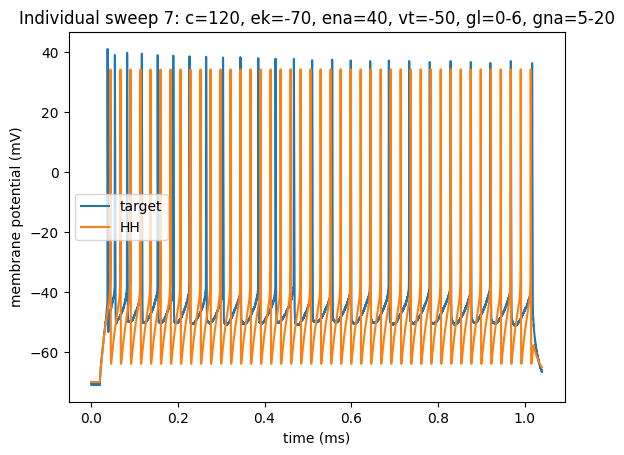

In [17]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_6[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-20')

In [18]:
# c=120
# ek=-70
# ena = 40
# vt=-50
# gl=0-6
# gna=5-20
# gkd=0-8
hh_sweep7_7 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-70, ena=40, vt=-50, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=6.41311446 uS, g_na=8.48992747 uS, gl=4.81077946 nS (error: 356.61022372 mV^2)
Round 1: Best parameters g_kd=6.41924235 uS, g_na=6.66598692 uS, gl=5.04960117 nS (error: 333.85069185 mV^2)
Round 2: Best parameters g_kd=5.94149078 uS, g_na=6.58307337 uS, gl=5.32544847 nS (error: 312.14720077 mV^2)
Round 3: Best parameters g_kd=6.33163978 uS, g_na=6.55039011 uS, gl=5.27262114 nS (error: 310.91713138 mV^2)
Round 4: Best parameters g_kd=6.33163978 uS, g_na=6.55039011 uS, gl=5.27262114 nS (error: 310.91713138 mV^2)
Round 5: Best parameters g_kd=6.15448149 uS, g_na=6.27007158 uS, gl=5.26294434 nS (error: 309.62238488 mV^2)
Round 6: Best parameters g_kd=5.45850615 uS, g_na=5.93292293 uS, gl=5.29549157 nS (error: 302.54056471 mV^2)
Round 7: Best parameters g_kd=5.45850615 uS, g_na=5.93292293 uS, gl=5.29549157 nS (error: 302.54056471 mV^2)
Round 8: Best parameters g_kd=5.45850615 uS, g_na=5.93292293 uS, gl=5.29549157 nS (error: 302.54056471 mV^2)
Round 9:

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

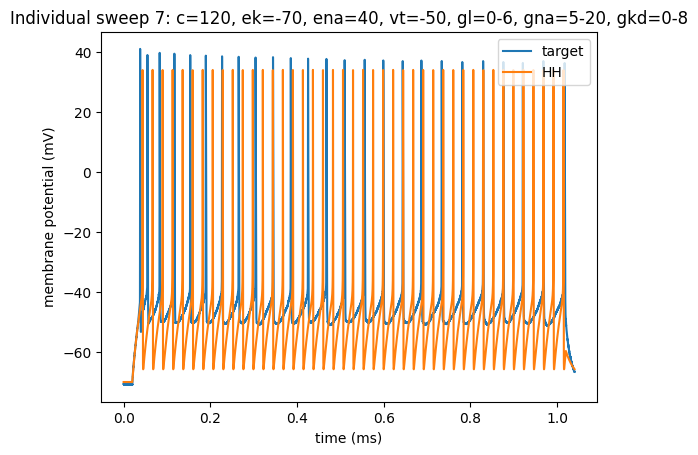

In [19]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_7[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-70, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

In [20]:
# change ek

# c=120
# ek=-50
# ena = 40
# vt=-50
# gl=0-6
# gna=5-20
# gkd=0-8
hh_sweep7_8 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=40, vt=-50, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=6.7133295 uS, g_na=9.35354783 uS, gl=2.53477208 nS (error: 429.05900656 mV^2)
Round 1: Best parameters g_kd=6.77611876 uS, g_na=8.36116139 uS, gl=4.95023744 nS (error: 366.91599478 mV^2)
Round 2: Best parameters g_kd=6.81258433 uS, g_na=6.74079084 uS, gl=5.5111011 nS (error: 344.06173489 mV^2)
Round 3: Best parameters g_kd=7.49331296 uS, g_na=6.83025222 uS, gl=5.35928822 nS (error: 331.69241209 mV^2)
Round 4: Best parameters g_kd=7.46641675 uS, g_na=6.47475664 uS, gl=5.5562903 nS (error: 312.19430894 mV^2)
Round 5: Best parameters g_kd=7.46641675 uS, g_na=6.47475664 uS, gl=5.5562903 nS (error: 312.19430894 mV^2)
Round 6: Best parameters g_kd=7.64538185 uS, g_na=5.7486969 uS, gl=5.69384341 nS (error: 302.08505388 mV^2)
Round 7: Best parameters g_kd=7.6621959 uS, g_na=5.56889636 uS, gl=5.68698248 nS (error: 296.70111485 mV^2)
Round 8: Best parameters g_kd=7.6621959 uS, g_na=5.56889636 uS, gl=5.68698248 nS (error: 296.70111485 mV^2)
Round 9: Best p

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

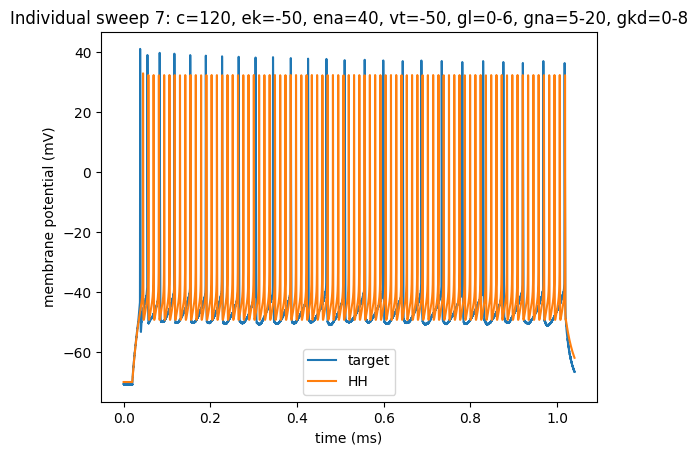

In [21]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_8[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

In [22]:
# make ek more negative

# c=120
# ek=-90
# ena = 40
# vt=-50
# gl=0-6
# gna=5-20
# gkd=0-8
hh_sweep7_9 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-90, ena=40, vt=-50, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=1.53351581 uS, g_na=7.70535479 uS, gl=4.80002836 nS (error: 430.83995786 mV^2)
Round 1: Best parameters g_kd=1.69590711 uS, g_na=7.17960928 uS, gl=4.47449296 nS (error: 405.80635696 mV^2)
Round 2: Best parameters g_kd=1.38431203 uS, g_na=7.23538084 uS, gl=5.29046226 nS (error: 387.67152839 mV^2)
Round 3: Best parameters g_kd=0.97692469 uS, g_na=6.06742929 uS, gl=5.31868214 nS (error: 349.86729843 mV^2)
Round 4: Best parameters g_kd=0.97692469 uS, g_na=6.06742929 uS, gl=5.31868214 nS (error: 349.86729843 mV^2)
Round 5: Best parameters g_kd=0.97692469 uS, g_na=6.06742929 uS, gl=5.31868214 nS (error: 349.86729843 mV^2)
Round 6: Best parameters g_kd=0.97692469 uS, g_na=6.06742929 uS, gl=5.31868214 nS (error: 349.86729843 mV^2)
Round 7: Best parameters g_kd=0.92094346 uS, g_na=5.8764932 uS, gl=5.43545712 nS (error: 340.64925419 mV^2)
Round 8: Best parameters g_kd=0.85213891 uS, g_na=5.50429328 uS, gl=5.57124397 nS (error: 334.79926062 mV^2)
Round 9: 

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-90, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

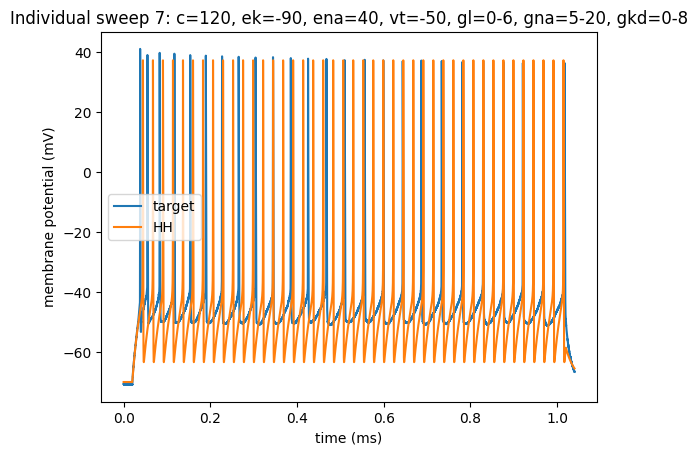

In [23]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_9[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-90, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

In [24]:
# ek=-110

# c=120
# ek=-110
# ena = 40
# vt=-50
# gl=0-6
# gna=5-20
# gkd=0-8
hh_sweep7_10 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-110, ena=40, vt=-50, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=1.47585745 uS, g_na=8.52654759 uS, gl=5.00678847 nS (error: 509.00211286 mV^2)
Round 1: Best parameters g_kd=0.70202871 uS, g_na=7.77363025 uS, gl=5.04712923 nS (error: 446.31998599 mV^2)
Round 2: Best parameters g_kd=0.54131932 uS, g_na=6.8480124 uS, gl=5.38573115 nS (error: 374.92181337 mV^2)
Round 3: Best parameters g_kd=0.54131932 uS, g_na=6.8480124 uS, gl=5.38573115 nS (error: 374.92181337 mV^2)
Round 4: Best parameters g_kd=0.54131932 uS, g_na=6.8480124 uS, gl=5.38573115 nS (error: 374.92181337 mV^2)
Round 5: Best parameters g_kd=0.54131932 uS, g_na=6.8480124 uS, gl=5.38573115 nS (error: 374.92181337 mV^2)
Round 6: Best parameters g_kd=0.54131932 uS, g_na=6.8480124 uS, gl=5.38573115 nS (error: 374.92181337 mV^2)
Round 7: Best parameters g_kd=0.54131932 uS, g_na=6.8480124 uS, gl=5.38573115 nS (error: 374.92181337 mV^2)
Round 8: Best parameters g_kd=0.52522468 uS, g_na=6.07232319 uS, gl=5.65716149 nS (error: 366.02775965 mV^2)
Round 9: Best 

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-110, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

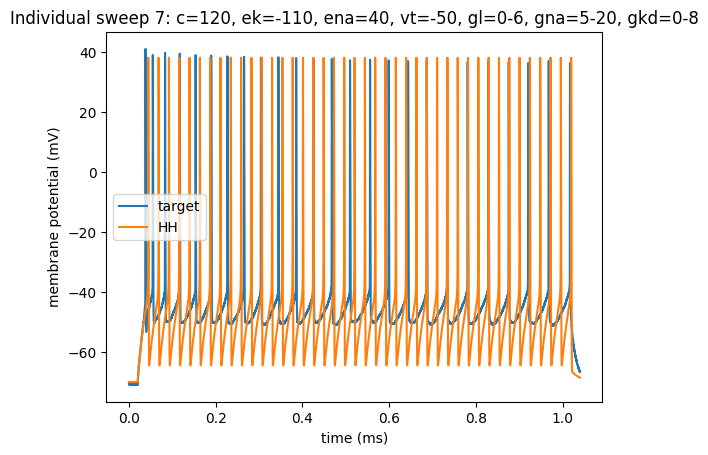

In [25]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_10[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-110, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

In [26]:
# change el/ vt

# c=120
# el=-50
# ek=-90
# ena = 40
# vt=-40
# gl=0-6
# gna=5-20
# gkd=0-8
hh_sweep7_11 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, el=-50, ek=-90, ena=40, vt=-40, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=3.94365981 uS, g_na=9.88453826 uS, gl=5.39146444 nS (error: 423.46041519 mV^2)
Round 1: Best parameters g_kd=4.79076034 uS, g_na=7.31988416 uS, gl=5.59965269 nS (error: 393.90533454 mV^2)
Round 2: Best parameters g_kd=2.98053578 uS, g_na=6.87525946 uS, gl=5.26949774 nS (error: 382.54671897 mV^2)
Round 3: Best parameters g_kd=2.94544422 uS, g_na=6.48254243 uS, gl=5.26956607 nS (error: 377.92969514 mV^2)
Round 4: Best parameters g_kd=1.70183391 uS, g_na=5.86618489 uS, gl=5.54826046 nS (error: 377.30783139 mV^2)
Round 5: Best parameters g_kd=2.98053578 uS, g_na=5.66090035 uS, gl=5.25332764 nS (error: 376.82385666 mV^2)
Round 6: Best parameters g_kd=2.98053578 uS, g_na=5.66090035 uS, gl=5.25332764 nS (error: 376.82385666 mV^2)
Round 7: Best parameters g_kd=2.06546335 uS, g_na=6.55381513 uS, gl=5.69177416 nS (error: 367.6026566 mV^2)
Round 8: Best parameters g_kd=2.06546335 uS, g_na=6.55381513 uS, gl=5.69177416 nS (error: 367.6026566 mV^2)
Round 9: B

Text(0.5, 1.0, 'Individual sweep 7: c=120, el=-50, ek=-90, ena=40, vt=-40, gl=0-6, gna=5-20, gkd=0-8')

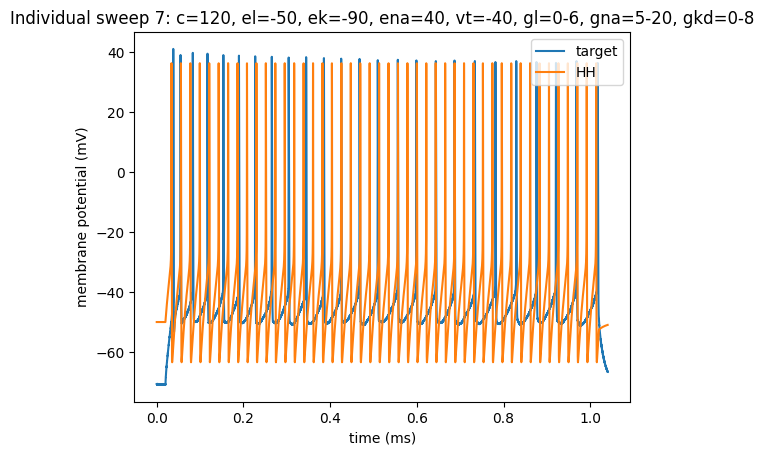

In [31]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_11[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, el=-50, ek=-90, ena=40, vt=-40, gl=0-6, gna=5-20, gkd=0-8')

In [28]:
# change el/ vt back
# try ek=-50

# c=120
# ek=-50
# ena = 40
# vt=-40
# gl=0-6
# gna=5-20
# gkd=0-8
hh_sweep7_12 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=40, vt=-50, \
                     glmin=0, glmax=6, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=6.29700655 uS, g_na=9.10717309 uS, gl=4.71379914 nS (error: 405.70898848 mV^2)
Round 1: Best parameters g_kd=7.27576339 uS, g_na=8.49608143 uS, gl=5.33883761 nS (error: 354.07507605 mV^2)
Round 2: Best parameters g_kd=6.97199323 uS, g_na=6.90395542 uS, gl=5.56684772 nS (error: 331.73922084 mV^2)
Round 3: Best parameters g_kd=7.46903792 uS, g_na=6.79367356 uS, gl=5.63444524 nS (error: 317.54551079 mV^2)
Round 4: Best parameters g_kd=7.63806031 uS, g_na=6.05402013 uS, gl=5.78026661 nS (error: 309.88105793 mV^2)
Round 5: Best parameters g_kd=7.56336211 uS, g_na=6.26964608 uS, gl=5.82634424 nS (error: 304.3370313 mV^2)
Round 6: Best parameters g_kd=7.69287515 uS, g_na=5.87615009 uS, gl=5.7719273 nS (error: 302.52051181 mV^2)
Round 7: Best parameters g_kd=7.59773113 uS, g_na=5.68958066 uS, gl=5.72255251 nS (error: 298.57387415 mV^2)
Round 8: Best parameters g_kd=7.77302215 uS, g_na=5.47652027 uS, gl=5.82865348 nS (error: 289.69030457 mV^2)
Round 9: B

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

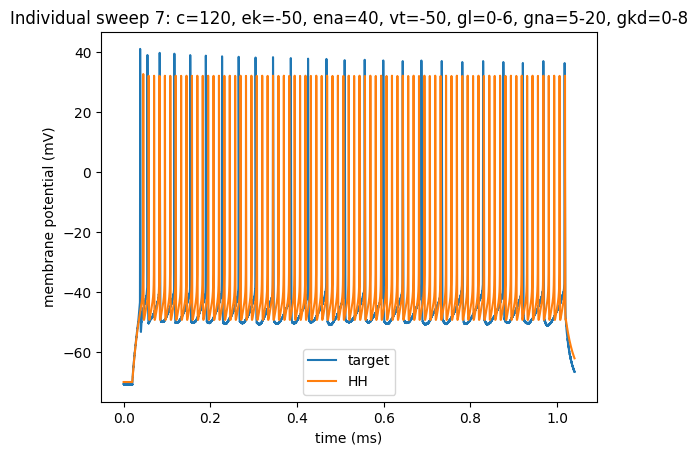

In [32]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_12[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-6, gna=5-20, gkd=0-8')

In [33]:
# try expand gl... 0-20
# try ek=-50

# c=120
# ek=-50
# ena = 40
# vt=-40
# gl=0-20
# gna=5-20
# gkd=0-8
hh_sweep7_13 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=40, vt=-50, \
                     glmin=0, glmax=20, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=6.20254027 uS, g_na=7.32826123 uS, gl=10.44445134 nS (error: 142.34460885 mV^2)
Round 1: Best parameters g_kd=6.56305561 uS, g_na=6.12700004 uS, gl=10.4450567 nS (error: 141.38063233 mV^2)
Round 2: Best parameters g_kd=5.10081817 uS, g_na=5.81098644 uS, gl=10.26918121 nS (error: 138.14505315 mV^2)
Round 3: Best parameters g_kd=5.10081817 uS, g_na=5.81098644 uS, gl=10.26918121 nS (error: 138.14505315 mV^2)
Round 4: Best parameters g_kd=5.10081817 uS, g_na=5.81098644 uS, gl=10.26918121 nS (error: 138.14505315 mV^2)
Round 5: Best parameters g_kd=5.10081817 uS, g_na=5.81098644 uS, gl=10.26918121 nS (error: 138.14505315 mV^2)
Round 6: Best parameters g_kd=1.67907194 uS, g_na=5.89060497 uS, gl=10.28690438 nS (error: 135.77379324 mV^2)
Round 7: Best parameters g_kd=1.67907194 uS, g_na=5.89060497 uS, gl=10.28690438 nS (error: 135.77379324 mV^2)
Round 8: Best parameters g_kd=1.67907194 uS, g_na=5.89060497 uS, gl=10.28690438 nS (error: 135.77379324 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-20, gna=5-20, gkd=0-8')

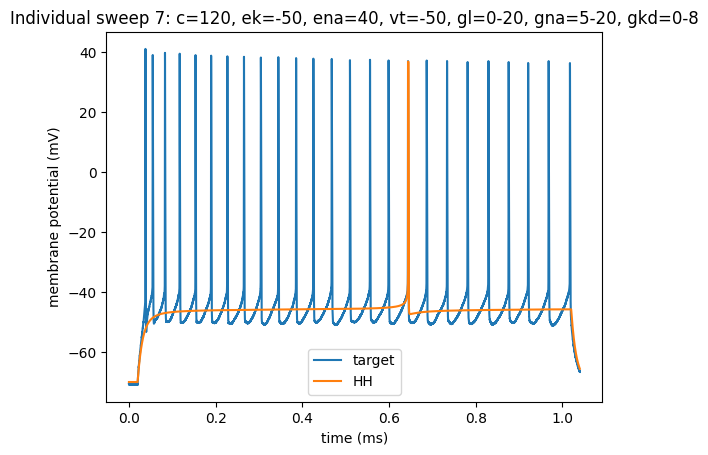

In [34]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_13[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-20, gna=5-20, gkd=0-8')

In [35]:
# try reduce gl... 0-10
# try ek=-50

# c=120
# ek=-50
# ena = 40
# vt=-40
# gl=0-20
# gna=5-20
# gkd=0-8
hh_sweep7_14 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=40, vt=-50, \
                     glmin=0, glmax=10, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=6.15559825 uS, g_na=9.32745376 uS, gl=8.58733573 nS (error: 270.87442028 mV^2)
Round 1: Best parameters g_kd=5.97548229 uS, g_na=6.62633414 uS, gl=9.15831881 nS (error: 225.07545824 mV^2)
Round 2: Best parameters g_kd=6.85706362 uS, g_na=6.26275742 uS, gl=9.30294797 nS (error: 205.35642483 mV^2)
Round 3: Best parameters g_kd=5.78225172 uS, g_na=6.01008954 uS, gl=9.54907405 nS (error: 202.88474095 mV^2)
Round 4: Best parameters g_kd=5.99051661 uS, g_na=5.87910604 uS, gl=9.62411494 nS (error: 181.22117921 mV^2)
Round 5: Best parameters g_kd=5.19395151 uS, g_na=5.76257317 uS, gl=9.68132754 nS (error: 157.19663795 mV^2)
Round 6: Best parameters g_kd=5.19395151 uS, g_na=5.76257317 uS, gl=9.68132754 nS (error: 157.19663795 mV^2)
Round 7: Best parameters g_kd=5.19395151 uS, g_na=5.76257317 uS, gl=9.68132754 nS (error: 157.19663795 mV^2)
Round 8: Best parameters g_kd=5.19395151 uS, g_na=5.76257317 uS, gl=9.68132754 nS (error: 157.19663795 mV^2)
Round 9:

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

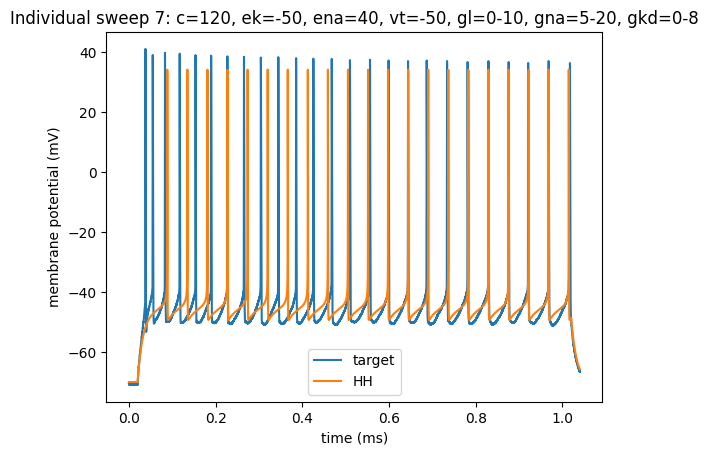

In [36]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_14[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

In [37]:
# closest so far.  repeat to see if any diff.

# try reduce gl... 0-10
# try ek=-50

# c=120
# ek=-50
# ena = 40
# vt=-40
# gl=0-20
# gna=5-20
# gkd=0-8
hh_sweep7_14_1 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=40, vt=-50, \
                     glmin=0, glmax=10, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=5.25582808 uS, g_na=8.70235201 uS, gl=8.91852294 nS (error: 274.07602358 mV^2)
Round 1: Best parameters g_kd=6.76697889 uS, g_na=7.12652574 uS, gl=9.26072326 nS (error: 221.36007951 mV^2)
Round 2: Best parameters g_kd=6.42697771 uS, g_na=6.99099631 uS, gl=9.45030208 nS (error: 202.1831475 mV^2)
Round 3: Best parameters g_kd=3.5195586 uS, g_na=6.2120815 uS, gl=9.56665578 nS (error: 188.47820003 mV^2)
Round 4: Best parameters g_kd=6.18431498 uS, g_na=6.28344684 uS, gl=9.68268178 nS (error: 181.38215352 mV^2)
Round 5: Best parameters g_kd=6.27923161 uS, g_na=5.85814842 uS, gl=9.68070456 nS (error: 170.907226 mV^2)
Round 6: Best parameters g_kd=6.79498343 uS, g_na=5.67739579 uS, gl=9.65059004 nS (error: 169.58657903 mV^2)
Round 7: Best parameters g_kd=7.2184355 uS, g_na=6.19156297 uS, gl=9.72548678 nS (error: 167.11372124 mV^2)
Round 8: Best parameters g_kd=7.2184355 uS, g_na=6.19156297 uS, gl=9.72548678 nS (error: 167.11372124 mV^2)
Round 9: Best p

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

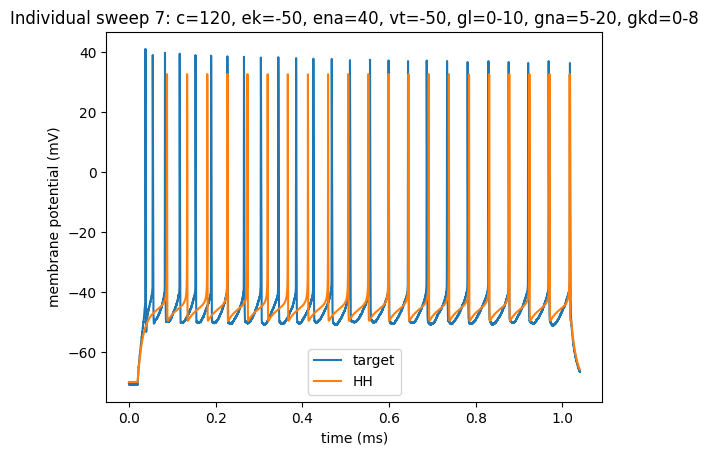

In [38]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_14_1[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=40, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

In [39]:
# raise ena... +10

# try reduce gl... 0-10
# try ek=-50

# c=120
# ek=-50
# ena = 50
# vt=-40
# gl=0-20
# gna=5-20
# gkd=0-8
hh_sweep7_15 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=50, vt=-50, \
                     glmin=0, glmax=10, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=3.65677351 uS, g_na=9.77018783 uS, gl=8.442368 nS (error: 350.24884883 mV^2)
Round 1: Best parameters g_kd=3.49364627 uS, g_na=7.71700713 uS, gl=9.02104332 nS (error: 305.47132323 mV^2)
Round 2: Best parameters g_kd=5.12128146 uS, g_na=7.5782385 uS, gl=9.49825198 nS (error: 235.79083544 mV^2)
Round 3: Best parameters g_kd=5.92903404 uS, g_na=6.65846993 uS, gl=9.64464655 nS (error: 220.11596476 mV^2)
Round 4: Best parameters g_kd=5.37999972 uS, g_na=6.39774016 uS, gl=9.6551237 nS (error: 194.06338209 mV^2)
Round 5: Best parameters g_kd=7.05246672 uS, g_na=5.99243986 uS, gl=9.58726741 nS (error: 186.10007484 mV^2)
Round 6: Best parameters g_kd=6.94354016 uS, g_na=5.77495783 uS, gl=9.81994744 nS (error: 185.63948052 mV^2)
Round 7: Best parameters g_kd=6.92504647 uS, g_na=6.14699905 uS, gl=9.81744713 nS (error: 170.37825957 mV^2)
Round 8: Best parameters g_kd=6.92504647 uS, g_na=6.14699905 uS, gl=9.81744713 nS (error: 170.37825957 mV^2)
Round 9: Bes

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=50, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

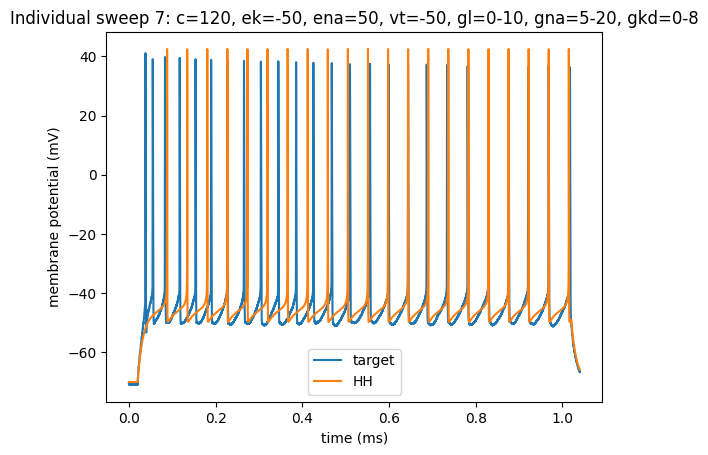

In [40]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_15[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=50, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

# BEST HH SWEEP 7? 

hh_sweep7_16 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=45, vt=-50, \
                     glmin=0, glmax=10, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

In [41]:
# ena=45

# try reduce gl... 0-10
# try ek=-50

# c=120
# ek=-50
# ena = 45
# vt=-40
# gl=0-20
# gna=5-20
# gkd=0-8
hh_sweep7_16 = run_hh(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, ek=-50, ena=45, vt=-50, \
                     glmin=0, glmax=10, gnamin=5, gnamax=20, gkdmin=0, gkdmax=8)

first fit:
Round 0: Best parameters g_kd=6.96719718 uS, g_na=8.05282278 uS, gl=8.71987021 nS (error: 268.85061472 mV^2)
Round 1: Best parameters g_kd=7.29066032 uS, g_na=8.13421934 uS, gl=9.31050699 nS (error: 231.82859879 mV^2)
Round 2: Best parameters g_kd=6.61671421 uS, g_na=6.85591334 uS, gl=9.41892112 nS (error: 218.98300035 mV^2)
Round 3: Best parameters g_kd=7.29934633 uS, g_na=6.05932518 uS, gl=9.54478485 nS (error: 181.64680088 mV^2)
Round 4: Best parameters g_kd=7.34378091 uS, g_na=5.91068645 uS, gl=9.52084407 nS (error: 181.47316739 mV^2)
Round 5: Best parameters g_kd=7.67618187 uS, g_na=5.67537919 uS, gl=9.69262604 nS (error: 168.1724557 mV^2)
Round 6: Best parameters g_kd=7.67618187 uS, g_na=5.67537919 uS, gl=9.69262604 nS (error: 168.1724557 mV^2)
Round 7: Best parameters g_kd=7.67618187 uS, g_na=5.67537919 uS, gl=9.69262604 nS (error: 168.1724557 mV^2)
Round 8: Best parameters g_kd=7.67618187 uS, g_na=5.67537919 uS, gl=9.69262604 nS (error: 168.1724557 mV^2)
Round 9: Bes

Text(0.5, 1.0, 'Individual sweep 7: c=120, ek=-50, ena=45, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

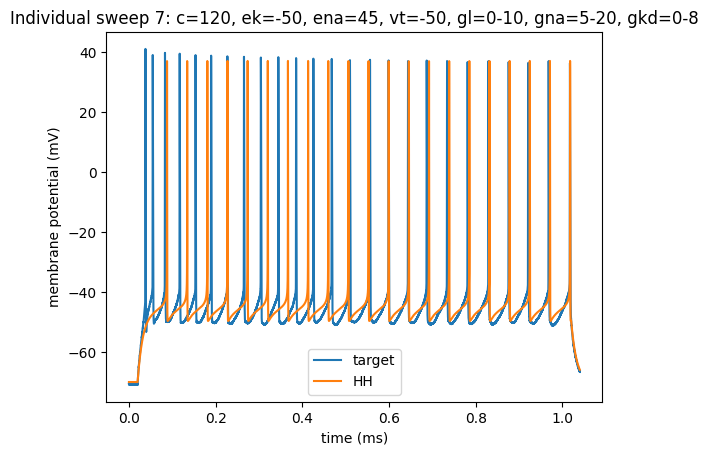

In [42]:
create_comparison_together(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, d2_title='HH')
title('Individual sweep 7: c=120, ek=-50, ena=45, vt=-50, gl=0-10, gna=5-20, gkd=0-8')

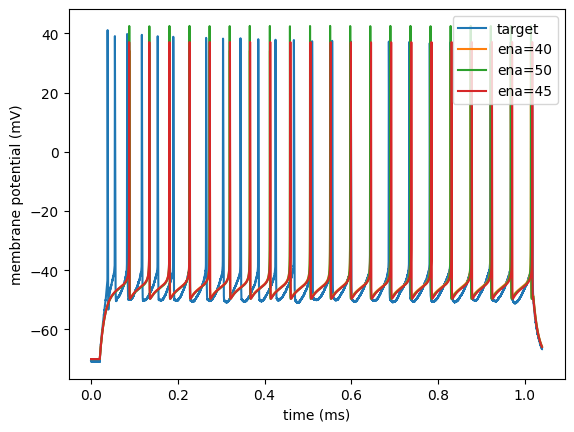

In [71]:
create_comparison_together_four(reshaped_ls_sweep7_out[0], hh_sweep7_14[0]*1000, hh_sweep7_15[0]*1000, hh_sweep7_16[0]*1000,\
                                d2_title='ena=40', d3_title='ena=50', d4_title='ena=45')

***

***

Sweep 4: LIF

In [ ]:
lif_sweep4_0 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out)

# tt: 41.1s

first fit:
Round 0: Best parameters R=125.38173002 Mohm, tau=16.78257272 ms (error: 129.4511532 mV^2)
Round 1: Best parameters R=116.43122741 Mohm, tau=12.82223813 ms (error: 112.17945327 mV^2)
Round 2: Best parameters R=117.56290114 Mohm, tau=13.40777616 ms (error: 110.6263465 mV^2)
Round 3: Best parameters R=117.61057222 Mohm, tau=11.62012566 ms (error: 110.36772069 mV^2)
Round 4: Best parameters R=117.61057222 Mohm, tau=11.62012566 ms (error: 110.36772069 mV^2)
Round 5: Best parameters R=117.61057222 Mohm, tau=11.62012566 ms (error: 110.36772069 mV^2)
Round 6: Best parameters R=117.61057222 Mohm, tau=11.62012566 ms (error: 110.36772069 mV^2)
Round 7: Best parameters R=117.61057222 Mohm, tau=11.62012566 ms (error: 110.36772069 mV^2)
Round 8: Best parameters R=117.61057222 Mohm, tau=11.60334486 ms (error: 110.36656903 mV^2)
Round 9: Best parameters R=117.61057222 Mohm, tau=11.60334486 ms (error: 110.36656903 mV^2)


Text(0.5, 1.0, 'Individual run: sweep 4')

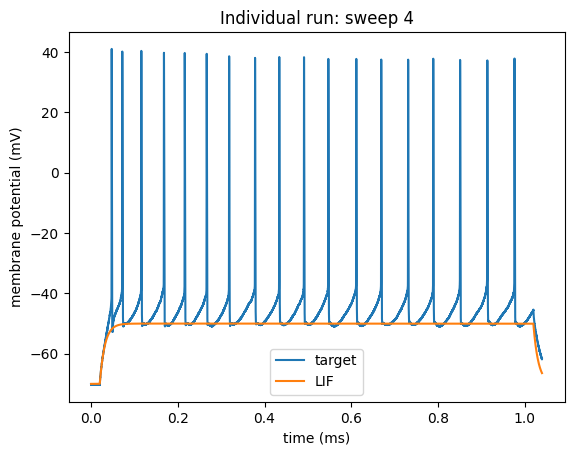

In [19]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_0[0]*1000, d2_title='LIF')
title('Individual run: sweep 4')

In [190]:
lif_sweep4_1 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-40*mV')

first fit:
Round 0: Best parameters R=141.66703394 Mohm, tau=16.6630009 ms (error: 92.94113236 mV^2)
Round 1: Best parameters R=142.30004671 Mohm, tau=14.62786426 ms (error: 92.60750601 mV^2)
Round 2: Best parameters R=141.63614035 Mohm, tau=12.1100491 ms (error: 92.50066526 mV^2)
Round 3: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)
Round 4: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)
Round 5: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)
Round 6: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)
Round 7: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)
Round 8: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)
Round 9: Best parameters R=143.12348582 Mohm, tau=12.16735653 ms (error: 92.43377297 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-40')

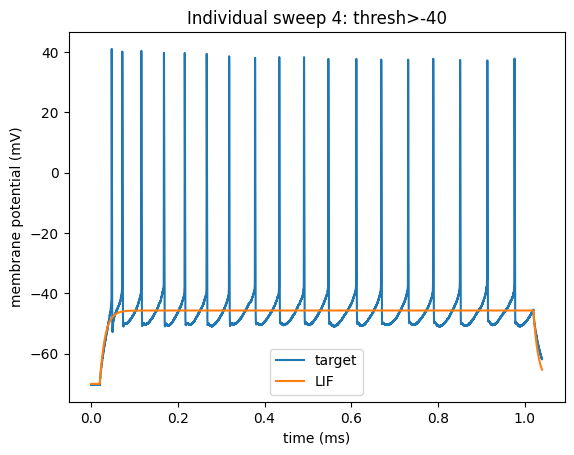

In [191]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_1[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-40')

In [ ]:
# thres > 53
# r = 100-100_000
# t = 0.0001-0.03
lif_sweep4_2 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-53*mV', r_max=100000*10**6, t_min=0.0001)

first fit:
Round 0: Best parameters R=23.0354129 Gohm, tau=25.05396952 ms (error: 122.16502058 mV^2)
Round 1: Best parameters R=23.19648986 Gohm, tau=25.49974062 ms (error: 122.12608864 mV^2)
Round 2: Best parameters R=23.19648986 Gohm, tau=25.49974062 ms (error: 122.12608864 mV^2)
Round 3: Best parameters R=24.70842216 Gohm, tau=27.06684649 ms (error: 122.11211475 mV^2)
Round 4: Best parameters R=25.20728503 Gohm, tau=28.69361879 ms (error: 122.06457576 mV^2)
Round 5: Best parameters R=25.50609037 Gohm, tau=28.6136003 ms (error: 122.05747596 mV^2)
Round 6: Best parameters R=25.50646895 Gohm, tau=28.83624697 ms (error: 122.05641978 mV^2)
Round 7: Best parameters R=25.50646895 Gohm, tau=28.83624697 ms (error: 122.05641978 mV^2)
Round 8: Best parameters R=25.49133357 Gohm, tau=28.77528093 ms (error: 122.05633015 mV^2)
Round 9: Best parameters R=26.44543402 Gohm, tau=29.40872288 ms (error: 122.05468692 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-53, r=100-100_000, tau=0.0001-0.03')

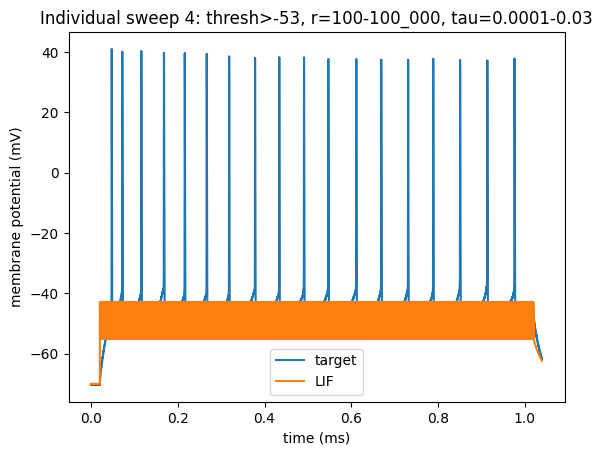

In [204]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_2[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-53, r=100-100_000, tau=0.0001-0.03')

In [ ]:

lif_sweep4_3 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-53*mV', r_max=10_000*10**6, t_min=0.0001)

first fit:
Round 0: Best parameters R=5.23880211 Gohm, tau=6.42587815 ms (error: 124.06301682 mV^2)
Round 1: Best parameters R=8.0055847 Gohm, tau=9.04741906 ms (error: 123.06799279 mV^2)
Round 2: Best parameters R=8.89491832 Gohm, tau=9.91147637 ms (error: 122.93139177 mV^2)
Round 3: Best parameters R=8.9478032 Gohm, tau=10.04049835 ms (error: 122.91690119 mV^2)
Round 4: Best parameters R=8.9478032 Gohm, tau=10.04049835 ms (error: 122.91690119 mV^2)
Round 5: Best parameters R=9.26512069 Gohm, tau=10.42134658 ms (error: 122.86998582 mV^2)
Round 6: Best parameters R=9.43644854 Gohm, tau=10.4332828 ms (error: 122.86802399 mV^2)
Round 7: Best parameters R=9.54116523 Gohm, tau=10.78992657 ms (error: 122.83159908 mV^2)
Round 8: Best parameters R=9.66080776 Gohm, tau=10.84242348 ms (error: 122.81743012 mV^2)
Round 9: Best parameters R=9.66080776 Gohm, tau=10.84242348 ms (error: 122.81743012 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-53, r=100-10_000, tau=0.0001-0.03')

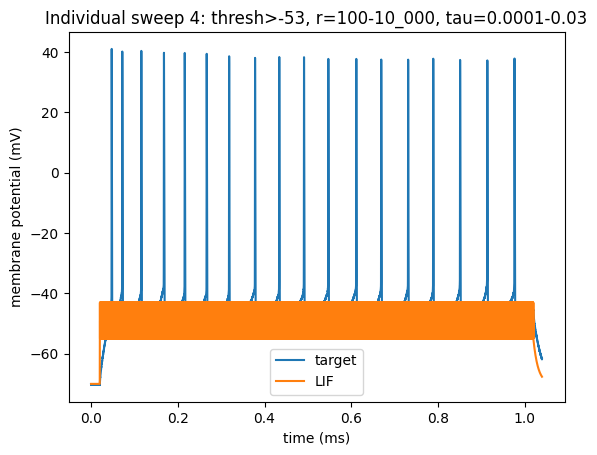

In [205]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_3[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-53, r=100-10_000, tau=0.0001-0.03')

In [198]:
# r = 100-1000
# t = 0.001-0.03
lif_sweep4_4 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-53*mV', r_max=1_000*10**6, t_min=0.001)

first fit:
Round 0: Best parameters R=224.10408803 Mohm, tau=25.71099472 ms (error: 156.89013084 mV^2)
Round 1: Best parameters R=203.71336354 Mohm, tau=26.01881785 ms (error: 156.79119489 mV^2)
Round 2: Best parameters R=164.7771683 Mohm, tau=25.73602912 ms (error: 156.42021237 mV^2)
Round 3: Best parameters R=160.4641108 Mohm, tau=26.92063767 ms (error: 156.35848127 mV^2)
Round 4: Best parameters R=160.4641108 Mohm, tau=26.92063767 ms (error: 156.35848127 mV^2)
Round 5: Best parameters R=160.4641108 Mohm, tau=26.92063767 ms (error: 156.35848127 mV^2)
Round 6: Best parameters R=157.70645467 Mohm, tau=25.82747689 ms (error: 156.24849709 mV^2)
Round 7: Best parameters R=157.70645467 Mohm, tau=25.82747689 ms (error: 156.24849709 mV^2)
Round 8: Best parameters R=157.70645467 Mohm, tau=25.82747689 ms (error: 156.24849709 mV^2)
Round 9: Best parameters R=157.70645467 Mohm, tau=25.82747689 ms (error: 156.24849709 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-53, r=100-1_000, tau=0.001-0.03')

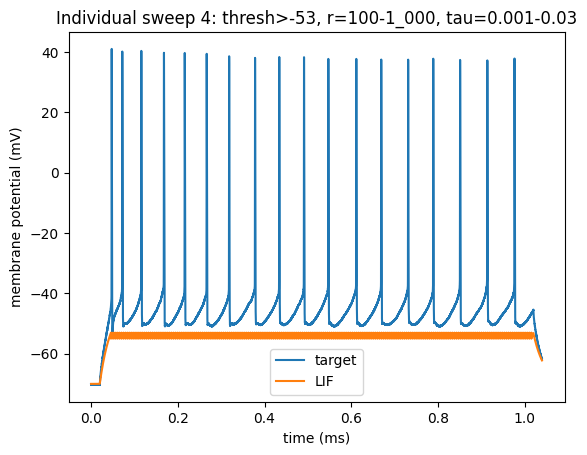

In [206]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_4[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-53, r=100-1_000, tau=0.001-0.03')

In [209]:
# r = 100-500
# t = 0.001-0.03
lif_sweep4_5 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-53*mV', r_max=500*10**6, t_min=0.001)

first fit:
Round 0: Best parameters R=166.87236605 Mohm, tau=23.11521133 ms (error: 156.58519787 mV^2)
Round 1: Best parameters R=172.83980037 Mohm, tau=23.29426612 ms (error: 156.57089639 mV^2)
Round 2: Best parameters R=157.85995745 Mohm, tau=25.84914262 ms (error: 156.22505014 mV^2)
Round 3: Best parameters R=127.43610622 Mohm, tau=18.92207884 ms (error: 156.15850115 mV^2)
Round 4: Best parameters R=131.80127965 Mohm, tau=19.89693703 ms (error: 155.89152247 mV^2)
Round 5: Best parameters R=131.80127965 Mohm, tau=19.89693703 ms (error: 155.89152247 mV^2)
Round 6: Best parameters R=131.80127965 Mohm, tau=19.89693703 ms (error: 155.89152247 mV^2)
Round 7: Best parameters R=131.80127965 Mohm, tau=19.89693703 ms (error: 155.89152247 mV^2)
Round 8: Best parameters R=113.65675524 Mohm, tau=10.39956159 ms (error: 155.74534705 mV^2)
Round 9: Best parameters R=109.59026388 Mohm, tau=11.99321517 ms (error: 155.36363339 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-53, r=100-500, tau=0.001-0.03')

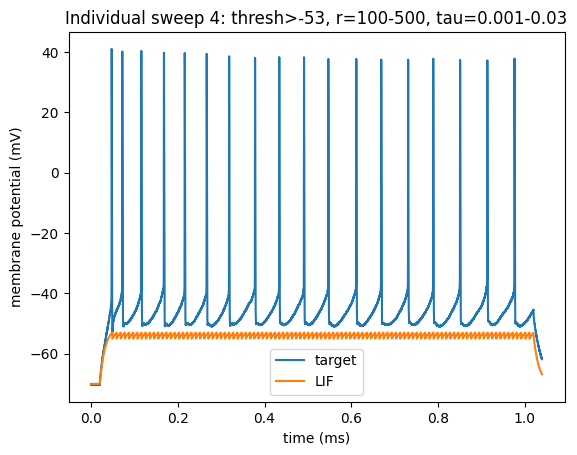

In [210]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_5[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-53, r=100-500, tau=0.001-0.03')

In [213]:
# thresh > -40
# r = 100-300
# t = 0.01-0.03
lif_sweep4_6 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-40*mV', r_max=300*10**6, t_min=0.01)

first fit:
Round 0: Best parameters R=147.27783333 Mohm, tau=12.80285238 ms (error: 92.88986687 mV^2)
Round 1: Best parameters R=142.20723867 Mohm, tau=11.67666972 ms (error: 92.46315319 mV^2)
Round 2: Best parameters R=142.20723867 Mohm, tau=11.67666972 ms (error: 92.46315319 mV^2)
Round 3: Best parameters R=143.69373723 Mohm, tau=12.84415416 ms (error: 92.45251391 mV^2)
Round 4: Best parameters R=143.79136422 Mohm, tau=11.54116372 ms (error: 92.45241735 mV^2)
Round 5: Best parameters R=142.46673288 Mohm, tau=11.85588523 ms (error: 92.44885051 mV^2)
Round 6: Best parameters R=143.29557324 Mohm, tau=11.94751654 ms (error: 92.43426627 mV^2)
Round 7: Best parameters R=143.18184318 Mohm, tau=12.01570012 ms (error: 92.43357724 mV^2)
Round 8: Best parameters R=143.18184318 Mohm, tau=12.01570012 ms (error: 92.43357724 mV^2)
Round 9: Best parameters R=143.18184318 Mohm, tau=12.01570012 ms (error: 92.43357724 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-40, r=100-300, tau=0.01-0.03')

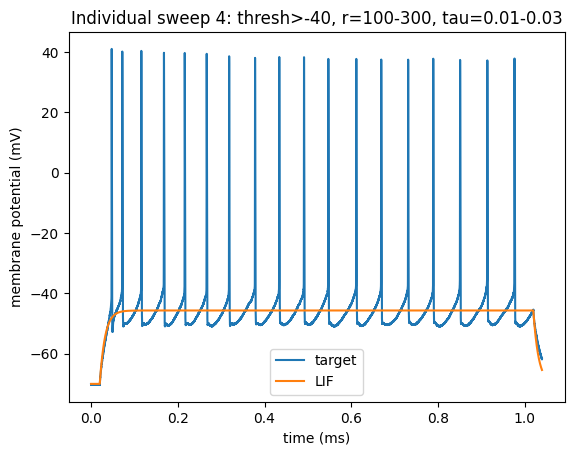

In [214]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_6[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-40, r=100-300, tau=0.01-0.03')

In [217]:
# thresh > -50
# r = 100-300
# t = 0.01-0.03
lif_sweep4_7 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, thresh_var='v>-50*mV', r_max=300*10**6, t_min=0.01)

first fit:
Round 0: Best parameters R=122.17940026 Mohm, tau=22.53366207 ms (error: 128.87855217 mV^2)
Round 1: Best parameters R=117.02268208 Mohm, tau=13.68411066 ms (error: 111.43719423 mV^2)
Round 2: Best parameters R=117.46600669 Mohm, tau=14.44677907 ms (error: 110.92837153 mV^2)
Round 3: Best parameters R=117.46600669 Mohm, tau=14.44677907 ms (error: 110.92837153 mV^2)
Round 4: Best parameters R=117.49458924 Mohm, tau=13.85485957 ms (error: 110.7896139 mV^2)
Round 5: Best parameters R=117.60269204 Mohm, tau=11.85765575 ms (error: 110.39648962 mV^2)
Round 6: Best parameters R=117.60269204 Mohm, tau=11.85765575 ms (error: 110.39648962 mV^2)
Round 7: Best parameters R=117.62939712 Mohm, tau=11.43381313 ms (error: 110.32928783 mV^2)
Round 8: Best parameters R=117.62939712 Mohm, tau=11.24395367 ms (error: 110.31876666 mV^2)
Round 9: Best parameters R=117.62939712 Mohm, tau=11.24395367 ms (error: 110.31876666 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: thresh>-50, r=100-300, tau=0.01-0.03')

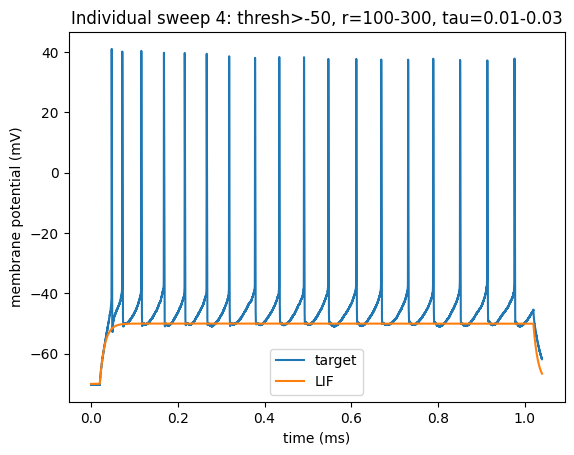

In [218]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_7[0]*1000, d2_title='LIF')
title('Individual sweep 4: thresh>-50, r=100-300, tau=0.01-0.03')

In [235]:

lif_sweep4_8 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120)

first fit:
Round 0: Best parameters R=128.80386032 Mohm, tau=15.46779259 ms (error: 129.58405625 mV^2)
Round 1: Best parameters R=116.90157331 Mohm, tau=17.99131421 ms (error: 112.51414835 mV^2)
Round 2: Best parameters R=116.90157331 Mohm, tau=17.99131421 ms (error: 112.51414835 mV^2)
Round 3: Best parameters R=116.28684528 Mohm, tau=13.06038433 ms (error: 112.42291219 mV^2)
Round 4: Best parameters R=116.45887992 Mohm, tau=11.89948212 ms (error: 112.04233155 mV^2)
Round 5: Best parameters R=116.55643351 Mohm, tau=12.73003222 ms (error: 111.98451209 mV^2)
Round 6: Best parameters R=116.55643351 Mohm, tau=12.73003222 ms (error: 111.98451209 mV^2)
Round 7: Best parameters R=117.08399641 Mohm, tau=12.11853522 ms (error: 111.1551047 mV^2)
Round 8: Best parameters R=117.08399641 Mohm, tau=12.11853522 ms (error: 111.1551047 mV^2)
Round 9: Best parameters R=117.08399641 Mohm, tau=12.11853522 ms (error: 111.1551047 mV^2)


Text(0.5, 1.0, 'Individual sweep 4: cm=120')

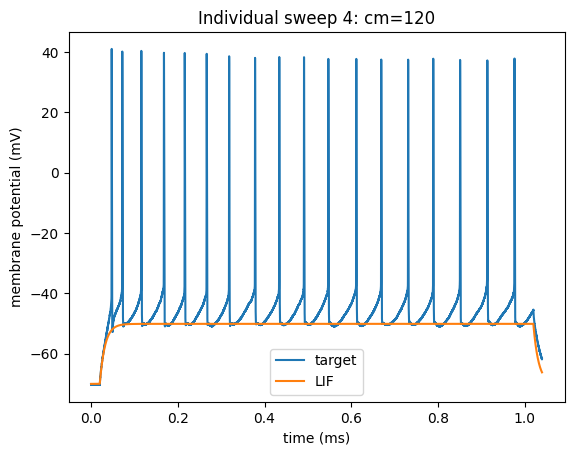

In [236]:
create_comparison_together(reshaped_ls_sweep4_out[0], lif_sweep4_8[0]*1000, d2_title='LIF')
title('Individual sweep 4: cm=120')

Curious that this over-spiked when run as a collection...

try sweep 5

In [219]:

lif_sweep5_0 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120)

first fit:
Round 0: Best parameters R=120.41337123 Mohm, tau=18.53351968 ms (error: 126.96540217 mV^2)
Round 1: Best parameters R=117.64008484 Mohm, tau=14.20047769 ms (error: 110.64020128 mV^2)
Round 2: Best parameters R=117.64008484 Mohm, tau=14.20047769 ms (error: 110.64020128 mV^2)
Round 3: Best parameters R=117.63046458 Mohm, tau=13.2000981 ms (error: 110.50254274 mV^2)
Round 4: Best parameters R=117.64008484 Mohm, tau=11.58458167 ms (error: 110.32390848 mV^2)
Round 5: Best parameters R=117.64008484 Mohm, tau=11.58458167 ms (error: 110.32390848 mV^2)
Round 6: Best parameters R=117.64008484 Mohm, tau=11.58458167 ms (error: 110.32390848 mV^2)
Round 7: Best parameters R=117.64008484 Mohm, tau=11.18353397 ms (error: 110.30082449 mV^2)
Round 8: Best parameters R=117.64008484 Mohm, tau=11.18353397 ms (error: 110.30082449 mV^2)
Round 9: Best parameters R=117.64448842 Mohm, tau=10.98136259 ms (error: 110.28607758 mV^2)


Text(0.5, 1.0, 'Individual sweep 5')

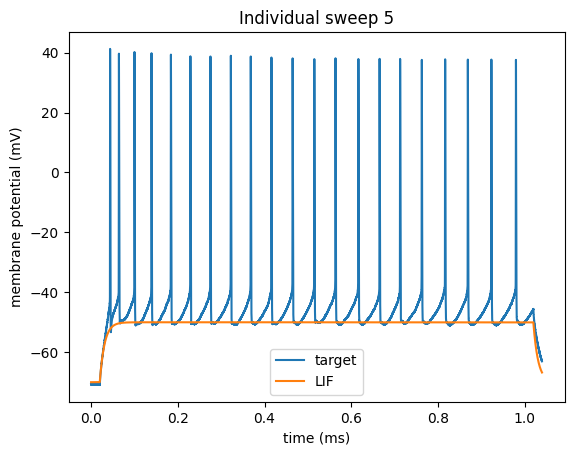

In [220]:
create_comparison_together(reshaped_ls_sweep5_out[0], lif_sweep5_0[0]*1000, d2_title='LIF')
title('Individual sweep 5')

In [221]:

lif_sweep5_1 = run_lif(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, cm_var=120, reset_var='v=-60*mV')

first fit:
Round 0: Best parameters R=130.00751674 Mohm, tau=16.81132937 ms (error: 154.72948434 mV^2)
Round 1: Best parameters R=117.22851648 Mohm, tau=22.66244226 ms (error: 113.37182793 mV^2)
Round 2: Best parameters R=117.01139981 Mohm, tau=15.03302351 ms (error: 111.68679195 mV^2)
Round 3: Best parameters R=117.41551377 Mohm, tau=12.423017 ms (error: 110.71283084 mV^2)
Round 4: Best parameters R=117.44490884 Mohm, tau=12.07459769 ms (error: 110.6372664 mV^2)
Round 5: Best parameters R=117.63094775 Mohm, tau=12.423017 ms (error: 110.40899505 mV^2)
Round 6: Best parameters R=117.58498726 Mohm, tau=11.16134356 ms (error: 110.37701764 mV^2)
Round 7: Best parameters R=117.58498726 Mohm, tau=11.16134356 ms (error: 110.37701764 mV^2)
Round 8: Best parameters R=117.58498726 Mohm, tau=11.16134356 ms (error: 110.37701764 mV^2)
Round 9: Best parameters R=117.62008286 Mohm, tau=10.90445818 ms (error: 110.31753833 mV^2)


Text(0.5, 1.0, 'Individual sweep 5, reset = -60')

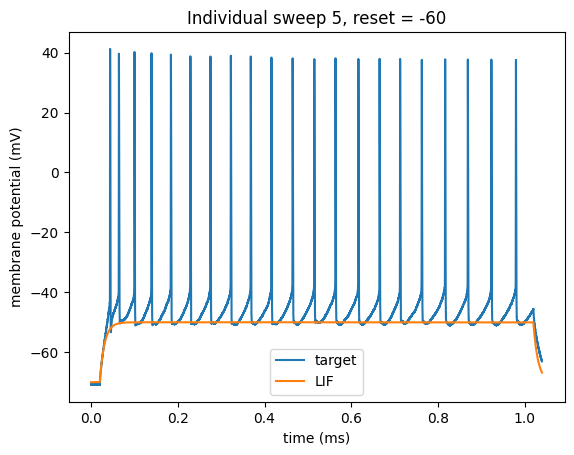

In [222]:
create_comparison_together(reshaped_ls_sweep5_out[0], lif_sweep5_1[0]*1000, d2_title='LIF')
title('Individual sweep 5, reset = -60')

Sweep 7

In [45]:

lif_sweep7_0 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, reset_var='v=-60*mV', thresh_var='v>-55*mV')

first fit:
Round 0: Best parameters R=125.36566255 Mohm, tau=23.73164107 ms (error: 286.36940672 mV^2)
Round 1: Best parameters R=122.64172319 Mohm, tau=16.5403436 ms (error: 286.13663393 mV^2)
Round 2: Best parameters R=112.09988268 Mohm, tau=22.96279908 ms (error: 285.21448126 mV^2)
Round 3: Best parameters R=111.8834779 Mohm, tau=23.22046947 ms (error: 284.69720841 mV^2)
Round 4: Best parameters R=111.8834779 Mohm, tau=23.22046947 ms (error: 284.69720841 mV^2)
Round 5: Best parameters R=108.50756914 Mohm, tau=23.08042034 ms (error: 284.55240091 mV^2)
Round 6: Best parameters R=108.50756914 Mohm, tau=23.08042034 ms (error: 284.55240091 mV^2)
Round 7: Best parameters R=108.50756914 Mohm, tau=23.07277764 ms (error: 284.53359847 mV^2)
Round 8: Best parameters R=108.50756914 Mohm, tau=23.07277764 ms (error: 284.53359847 mV^2)
Round 9: Best parameters R=106.79616374 Mohm, tau=13.98122042 ms (error: 283.66171394 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset = -60, thresh=-55')

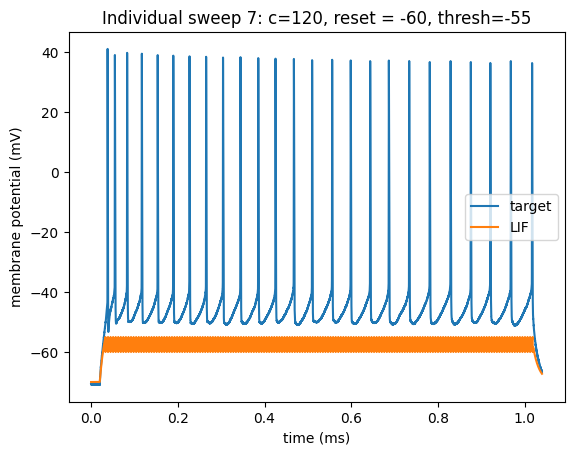

In [46]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_0[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset = -60, thresh=-55')

In [47]:

lif_sweep7_1 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, reset_var='v=-50*mV', thresh_var='v>-40*mV')

first fit:
Round 0: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 1: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 2: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 3: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 4: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 5: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 6: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 7: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 8: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)
Round 9: Best parameters R=228.29423469 Mohm, tau=24.1736247 ms (error: 137.65796175 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40')

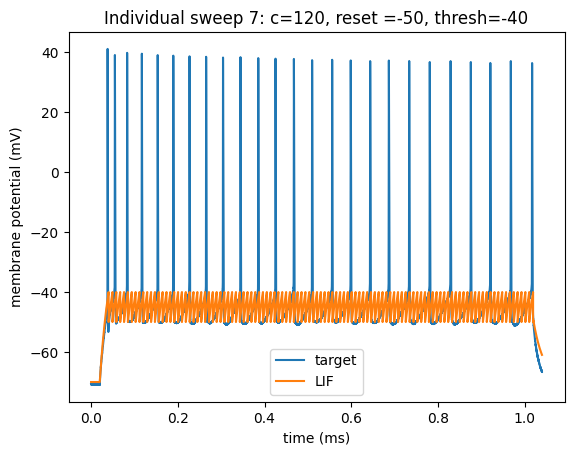

In [48]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_1[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40')

In [49]:
lif_sweep7_2 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=200*10**6)

first fit:
Round 0: Best parameters R=112.84884259 Mohm, tau=14.68026433 ms (error: 137.09199795 mV^2)
Round 1: Best parameters R=109.10425672 Mohm, tau=11.84934967 ms (error: 135.86552898 mV^2)
Round 2: Best parameters R=109.31966113 Mohm, tau=11.24473781 ms (error: 135.69713381 mV^2)
Round 3: Best parameters R=110.09535588 Mohm, tau=10.97495976 ms (error: 135.61951132 mV^2)
Round 4: Best parameters R=110.26703607 Mohm, tau=10.6289368 ms (error: 135.54902732 mV^2)
Round 5: Best parameters R=109.83020353 Mohm, tau=10.5018612 ms (error: 135.51480307 mV^2)
Round 6: Best parameters R=109.66926293 Mohm, tau=10.34622949 ms (error: 135.48520057 mV^2)
Round 7: Best parameters R=110.02909564 Mohm, tau=10.32829596 ms (error: 135.48117654 mV^2)
Round 8: Best parameters R=110.35703787 Mohm, tau=10.18576493 ms (error: 135.46484119 mV^2)
Round 9: Best parameters R=109.83020353 Mohm, tau=10.13366299 ms (error: 135.44244147 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-200')

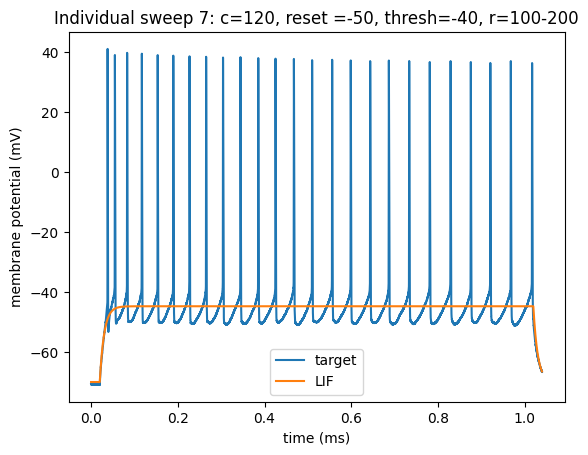

In [50]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_2[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-200')

In [51]:
lif_sweep7_3 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=250*10**6)

first fit:
Round 0: Best parameters R=171.45203339 Mohm, tau=18.86892348 ms (error: 139.77339809 mV^2)
Round 1: Best parameters R=214.2044308 Mohm, tau=22.47383431 ms (error: 137.63561525 mV^2)
Round 2: Best parameters R=219.12269676 Mohm, tau=14.73924823 ms (error: 137.32659072 mV^2)
Round 3: Best parameters R=219.12269676 Mohm, tau=14.73924823 ms (error: 137.32659072 mV^2)
Round 4: Best parameters R=204.04850078 Mohm, tau=12.7049607 ms (error: 137.03524377 mV^2)
Round 5: Best parameters R=204.04850078 Mohm, tau=12.7049607 ms (error: 137.03524377 mV^2)
Round 6: Best parameters R=204.04850078 Mohm, tau=12.7049607 ms (error: 137.03524377 mV^2)
Round 7: Best parameters R=204.04850078 Mohm, tau=12.7049607 ms (error: 137.03524377 mV^2)
Round 8: Best parameters R=110.18114322 Mohm, tau=13.31571777 ms (error: 136.25312903 mV^2)
Round 9: Best parameters R=110.95366537 Mohm, tau=11.02668558 ms (error: 135.68612648 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-250')

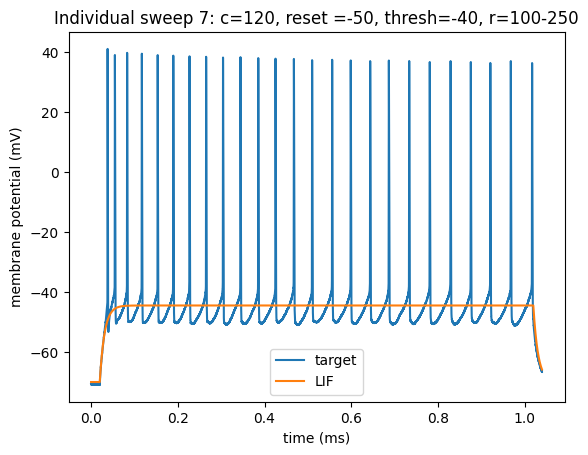

In [52]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_3[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-250')

In [53]:
lif_sweep7_4 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', t_max=1)

first fit:
Round 0: Best parameters R=261.82221563 Mohm, tau=146.72724112 ms (error: 161.35989207 mV^2)
Round 1: Best parameters R=267.94093208 Mohm, tau=142.54454021 ms (error: 149.64820909 mV^2)
Round 2: Best parameters R=268.05990208 Mohm, tau=67.07820674 ms (error: 147.23521583 mV^2)
Round 3: Best parameters R=260.86701089 Mohm, tau=50.01234013 ms (error: 142.18484123 mV^2)
Round 4: Best parameters R=260.45930279 Mohm, tau=52.58025854 ms (error: 141.55342258 mV^2)
Round 5: Best parameters R=272.88914102 Mohm, tau=58.09007333 ms (error: 139.22419862 mV^2)
Round 6: Best parameters R=272.88914102 Mohm, tau=58.09007333 ms (error: 139.22419862 mV^2)
Round 7: Best parameters R=272.88914102 Mohm, tau=58.09007333 ms (error: 139.22419862 mV^2)
Round 8: Best parameters R=272.88914102 Mohm, tau=58.09007333 ms (error: 139.22419862 mV^2)
Round 9: Best parameters R=272.88914102 Mohm, tau=58.09007333 ms (error: 139.22419862 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, tau=0.01-1')

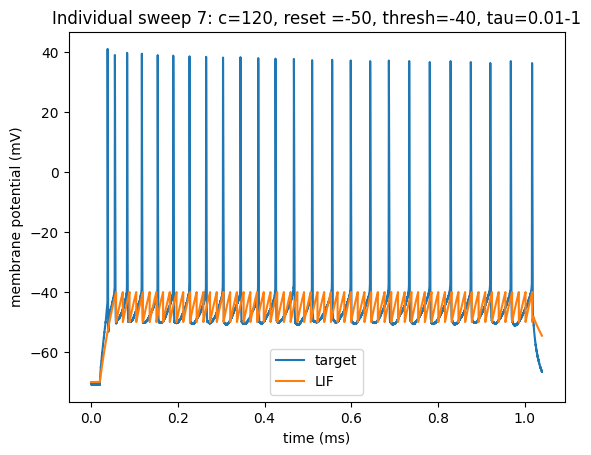

In [54]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_4[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, tau=0.01-1')

# BEST LIF SWEEP 7?  lif_sweep7_5

In [55]:
lif_sweep7_5 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', t_max=5)

first fit:
Round 0: Best parameters R=260.71311215 Mohm, tau=0.80906073 s (error: 224.42365379 mV^2)
Round 1: Best parameters R=255.72057094 Mohm, tau=0.44511907 s (error: 185.45905975 mV^2)
Round 2: Best parameters R=272.59713502 Mohm, tau=0.32568084 s (error: 172.24102882 mV^2)
Round 3: Best parameters R=269.78709747 Mohm, tau=227.6293395 ms (error: 164.69458521 mV^2)
Round 4: Best parameters R=261.25195217 Mohm, tau=186.17595713 ms (error: 160.56177863 mV^2)
Round 5: Best parameters R=285.99733932 Mohm, tau=159.11483296 ms (error: 147.76238805 mV^2)
Round 6: Best parameters R=285.99733932 Mohm, tau=159.11483296 ms (error: 147.76238805 mV^2)
Round 7: Best parameters R=285.99733932 Mohm, tau=159.11483296 ms (error: 147.76238805 mV^2)
Round 8: Best parameters R=285.99733932 Mohm, tau=159.11483296 ms (error: 147.76238805 mV^2)
Round 9: Best parameters R=285.99733932 Mohm, tau=159.11483296 ms (error: 147.76238805 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, tau=0.01-5')

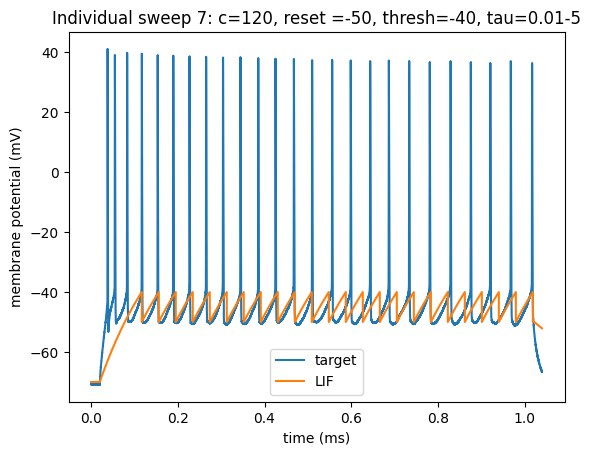

In [56]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_5[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, tau=0.01-5')

In [57]:
# again
lif_sweep7_5_1 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', t_max=5)

first fit:
Round 0: Best parameters R=256.55512213 Mohm, tau=0.778111 s (error: 222.44538044 mV^2)
Round 1: Best parameters R=275.93273089 Mohm, tau=0.49083272 s (error: 190.02874655 mV^2)
Round 2: Best parameters R=278.27739194 Mohm, tau=283.65319858 ms (error: 167.09158662 mV^2)
Round 3: Best parameters R=277.802585 Mohm, tau=220.87880878 ms (error: 162.32432252 mV^2)
Round 4: Best parameters R=275.80749502 Mohm, tau=169.86963058 ms (error: 150.90610881 mV^2)
Round 5: Best parameters R=283.53039236 Mohm, tau=155.74345955 ms (error: 149.45434249 mV^2)
Round 6: Best parameters R=251.58248828 Mohm, tau=144.85313294 ms (error: 148.73692277 mV^2)
Round 7: Best parameters R=279.5931386 Mohm, tau=153.18340637 ms (error: 147.21034422 mV^2)
Round 8: Best parameters R=279.5931386 Mohm, tau=153.18340637 ms (error: 147.21034422 mV^2)
Round 9: Best parameters R=279.5931386 Mohm, tau=153.18340637 ms (error: 147.21034422 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, tau=0.01-5')

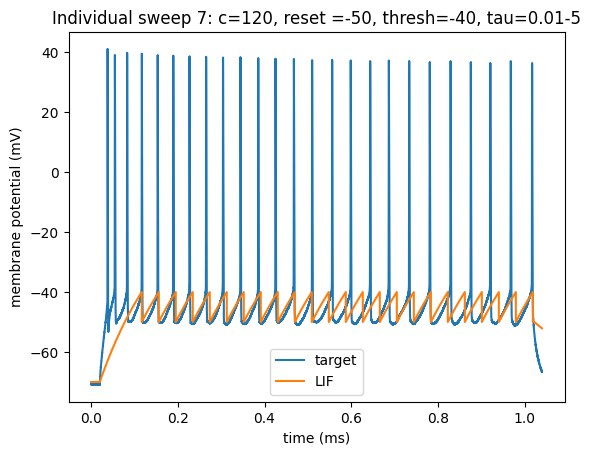

In [58]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_5[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, tau=0.01-5')

In [59]:
# raise r?
lif_sweep7_6 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=400*10**6, t_max=5)

first fit:
Round 0: Best parameters R=292.08632798 Mohm, tau=0.70234897 s (error: 202.64115906 mV^2)
Round 1: Best parameters R=0.33579743 Gohm, tau=0.42954984 s (error: 172.03204886 mV^2)
Round 2: Best parameters R=306.28810824 Mohm, tau=256.34541495 ms (error: 163.48782161 mV^2)
Round 3: Best parameters R=0.32041528 Gohm, tau=224.30430723 ms (error: 149.67503793 mV^2)
Round 4: Best parameters R=0.36256079 Gohm, tau=132.99402223 ms (error: 145.65277961 mV^2)
Round 5: Best parameters R=0.35276509 Gohm, tau=110.44445951 ms (error: 145.57131634 mV^2)
Round 6: Best parameters R=0.36850836 Gohm, tau=93.67923484 ms (error: 142.62496199 mV^2)
Round 7: Best parameters R=0.37931868 Gohm, tau=72.37841019 ms (error: 140.58946575 mV^2)
Round 8: Best parameters R=0.37931868 Gohm, tau=72.37841019 ms (error: 140.58946575 mV^2)
Round 9: Best parameters R=0.37931868 Gohm, tau=72.37841019 ms (error: 140.58946575 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-400, tau=0.01-5')

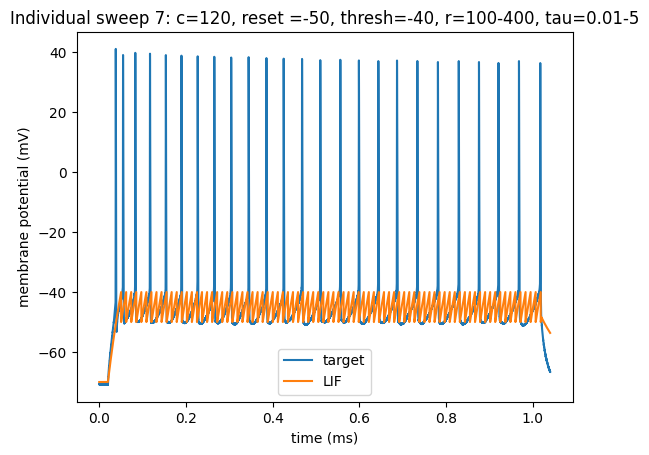

In [60]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_6[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-400, tau=0.01-5')

In [61]:
# r_max=350?
lif_sweep7_7 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=350*10**6, t_max=5)

first fit:
Round 0: Best parameters R=294.2264273 Mohm, tau=0.82823519 s (error: 214.53939465 mV^2)
Round 1: Best parameters R=303.37639009 Mohm, tau=0.33852382 s (error: 171.54990257 mV^2)
Round 2: Best parameters R=277.51171137 Mohm, tau=225.13119181 ms (error: 163.01028149 mV^2)
Round 3: Best parameters R=250.99948046 Mohm, tau=143.46871462 ms (error: 148.694453 mV^2)
Round 4: Best parameters R=0.32327063 Gohm, tau=192.15157811 ms (error: 147.97625662 mV^2)
Round 5: Best parameters R=303.42575339 Mohm, tau=174.59773005 ms (error: 147.37610699 mV^2)
Round 6: Best parameters R=0.32192121 Gohm, tau=97.59246052 ms (error: 144.92551937 mV^2)
Round 7: Best parameters R=0.32698248 Gohm, tau=91.54559429 ms (error: 143.62040292 mV^2)
Round 8: Best parameters R=0.32522356 Gohm, tau=77.93223858 ms (error: 140.70525334 mV^2)
Round 9: Best parameters R=0.32522356 Gohm, tau=77.93223858 ms (error: 140.70525334 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-350, tau=0.01-5')

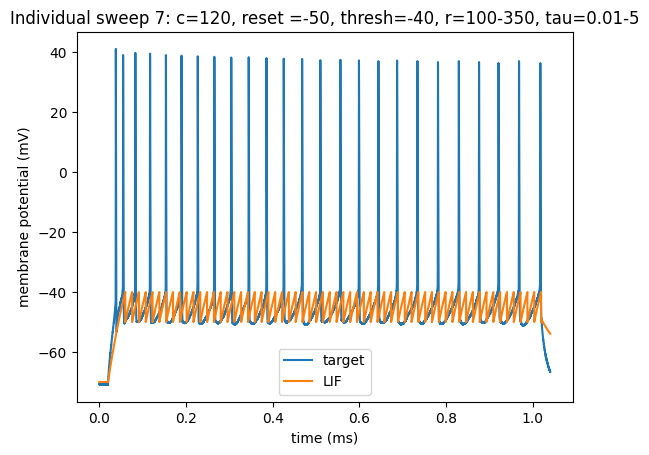

In [62]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_7[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-350, tau=0.01-5')

In [63]:
# r_max=325
lif_sweep7_8 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=325*10**6, t_max=5)

first fit:
Round 0: Best parameters R=288.06196633 Mohm, tau=0.71945989 s (error: 206.63313727 mV^2)
Round 1: Best parameters R=248.97268861 Mohm, tau=0.33798642 s (error: 178.26958539 mV^2)
Round 2: Best parameters R=288.09415849 Mohm, tau=217.80349965 ms (error: 161.19906265 mV^2)
Round 3: Best parameters R=280.24709039 Mohm, tau=183.49055013 ms (error: 154.04351725 mV^2)
Round 4: Best parameters R=272.2931212 Mohm, tau=146.61621313 ms (error: 147.72549804 mV^2)
Round 5: Best parameters R=233.9250019 Mohm, tau=126.85368453 ms (error: 145.78618047 mV^2)
Round 6: Best parameters R=309.53677177 Mohm, tau=105.62709474 ms (error: 144.29117733 mV^2)
Round 7: Best parameters R=309.53677177 Mohm, tau=105.62709474 ms (error: 144.29117733 mV^2)
Round 8: Best parameters R=314.24169581 Mohm, tau=107.48629221 ms (error: 142.96143396 mV^2)
Round 9: Best parameters R=0.3177204 Gohm, tau=75.29670345 ms (error: 140.59903197 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-350, tau=0.01-5')

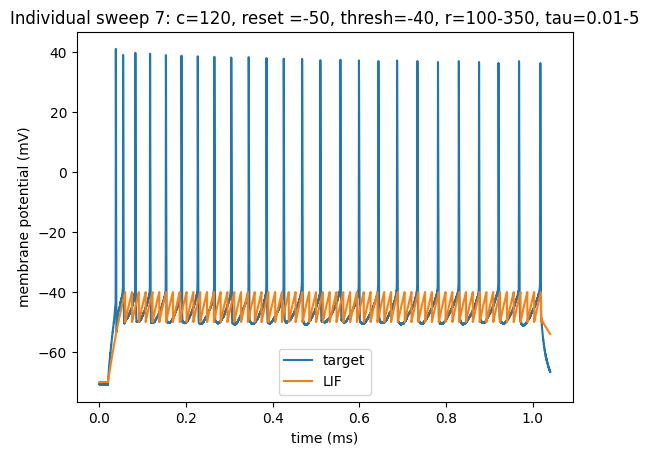

In [65]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_8[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-350, tau=0.01-5')

In [66]:
# r_max=310
lif_sweep7_9 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=310*10**6, t_max=5)

first fit:
Round 0: Best parameters R=276.54758069 Mohm, tau=0.89839099 s (error: 226.3789348 mV^2)
Round 1: Best parameters R=292.01003587 Mohm, tau=0.4110045 s (error: 180.65422376 mV^2)
Round 2: Best parameters R=295.34921611 Mohm, tau=292.47466867 ms (error: 167.76477093 mV^2)
Round 3: Best parameters R=297.20494724 Mohm, tau=213.54747192 ms (error: 157.96602949 mV^2)
Round 4: Best parameters R=297.46730881 Mohm, tau=191.45195823 ms (error: 153.12082322 mV^2)
Round 5: Best parameters R=296.43567524 Mohm, tau=189.10649724 ms (error: 150.50405694 mV^2)
Round 6: Best parameters R=296.97002287 Mohm, tau=167.46386657 ms (error: 149.74710676 mV^2)
Round 7: Best parameters R=301.15751902 Mohm, tau=124.07110144 ms (error: 149.11407034 mV^2)
Round 8: Best parameters R=299.84983751 Mohm, tau=99.93761237 ms (error: 143.36801446 mV^2)
Round 9: Best parameters R=298.32180011 Mohm, tau=95.2903713 ms (error: 142.86835013 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-310, tau=0.01-5')

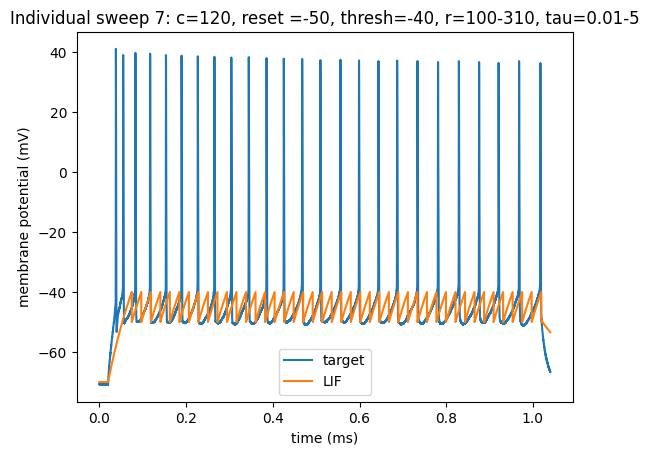

In [67]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_9[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-310, tau=0.01-5')

In [68]:
# r_max=305
lif_sweep7_10 = run_lif(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, cm_var=120, \
                       reset_var='v=-50*mV', thresh_var='v>-40*mV', r_max=305*10**6, t_max=5)

first fit:
Round 0: Best parameters R=212.11262278 Mohm, tau=0.54192016 s (error: 211.62800001 mV^2)
Round 1: Best parameters R=251.00999315 Mohm, tau=0.32788543 s (error: 180.03557473 mV^2)
Round 2: Best parameters R=251.71504069 Mohm, tau=208.79776039 ms (error: 164.75204592 mV^2)
Round 3: Best parameters R=277.76411009 Mohm, tau=172.31276785 ms (error: 158.04277254 mV^2)
Round 4: Best parameters R=267.93592201 Mohm, tau=158.49991063 ms (error: 153.63311501 mV^2)
Round 5: Best parameters R=267.93592201 Mohm, tau=158.49991063 ms (error: 153.63311501 mV^2)
Round 6: Best parameters R=271.4771759 Mohm, tau=162.96381707 ms (error: 152.35717533 mV^2)
Round 7: Best parameters R=271.4771759 Mohm, tau=162.96381707 ms (error: 152.35717533 mV^2)
Round 8: Best parameters R=271.4771759 Mohm, tau=162.96381707 ms (error: 152.35717533 mV^2)
Round 9: Best parameters R=271.4771759 Mohm, tau=162.96381707 ms (error: 152.35717533 mV^2)


Text(0.5, 1.0, 'Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-305, tau=0.01-5')

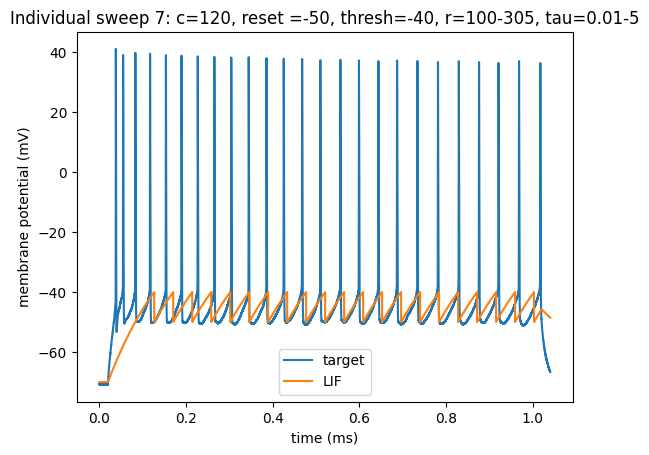

In [69]:
create_comparison_together(reshaped_ls_sweep7_out[0], lif_sweep7_10[0]*1000, d2_title='LIF')
title('Individual sweep 7: c=120, reset =-50, thresh=-40, r=100-305, tau=0.01-5')

***

***

Sweep 4: AdEx

In [12]:
adex_sweep4_0 = run_adex(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out)

first fit:
Round 0: Best parameters a=3.45795465 nS, b=58.90539342 pA, tauw=124.91434427 ms (error: 211.36908913 mV^2)
Round 1: Best parameters a=3.48887471 nS, b=25.34124005 pA, tauw=130.66218108 ms (error: 188.31568961 mV^2)
Round 2: Best parameters a=3.71091493 nS, b=27.48652052 pA, tauw=122.426772 ms (error: 175.97141394 mV^2)
Round 3: Best parameters a=3.63843769 nS, b=15.13457461 pA, tauw=123.20532168 ms (error: 172.92541662 mV^2)
Round 4: Best parameters a=3.71900706 nS, b=26.96649093 pA, tauw=123.33430764 ms (error: 172.7325632 mV^2)
Round 5: Best parameters a=3.70458875 nS, b=27.00217676 pA, tauw=124.64142417 ms (error: 172.37461573 mV^2)
Round 6: Best parameters a=3.70458875 nS, b=27.00217676 pA, tauw=124.64142417 ms (error: 172.37461573 mV^2)
Round 7: Best parameters a=3.70458875 nS, b=27.00217676 pA, tauw=124.64142417 ms (error: 172.37461573 mV^2)
Round 8: Best parameters a=3.70458875 nS, b=27.00217676 pA, tauw=124.64142417 ms (error: 172.37461573 mV^2)
Round 9: Best parame

Text(0.5, 1.0, 'Individual run: sweep 4')

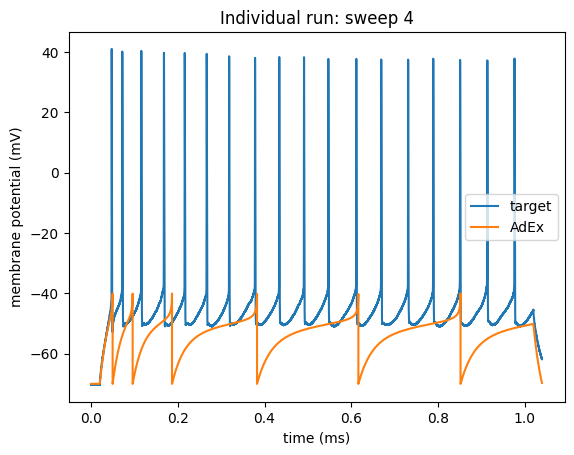

In [20]:
create_comparison_together(reshaped_ls_sweep4_out[0], adex_sweep4_0[0]*1000, d2_title='AdEx')
title('Individual run: sweep 4')

In [16]:
adex_sweep4_1 = run_adex(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, vr=-50, a_max=2, b_max=0.0001)

first fit:
Round 0: Best parameters a=1.45958832 nS, b=76.39858202 fA, tauw=129.02765651 ms (error: 94.88526652 mV^2)
Round 1: Best parameters a=1.14441154 nS, b=79.32340752 fA, tauw=143.6188104 ms (error: 94.61993468 mV^2)
Round 2: Best parameters a=1.14441154 nS, b=79.32340752 fA, tauw=143.6188104 ms (error: 94.61993468 mV^2)
Round 3: Best parameters a=1.14441154 nS, b=79.32340752 fA, tauw=143.6188104 ms (error: 94.61993468 mV^2)
Round 4: Best parameters a=1.4593875 nS, b=60.53773504 fA, tauw=127.83380235 ms (error: 94.48159384 mV^2)
Round 5: Best parameters a=1.4593875 nS, b=60.53773504 fA, tauw=127.83380235 ms (error: 94.48159384 mV^2)
Round 6: Best parameters a=1.4593875 nS, b=60.53773504 fA, tauw=127.83380235 ms (error: 94.48159384 mV^2)
Round 7: Best parameters a=1.4593875 nS, b=60.53773504 fA, tauw=127.83380235 ms (error: 94.48159384 mV^2)
Round 8: Best parameters a=1.4593875 nS, b=60.53773504 fA, tauw=127.83380235 ms (error: 94.48159384 mV^2)
Round 9: Best parameters a=1.45938

Text(0.5, 1.0, 'Individual sweep 4: vr=-50, a=1-2, b=0-0.0001')

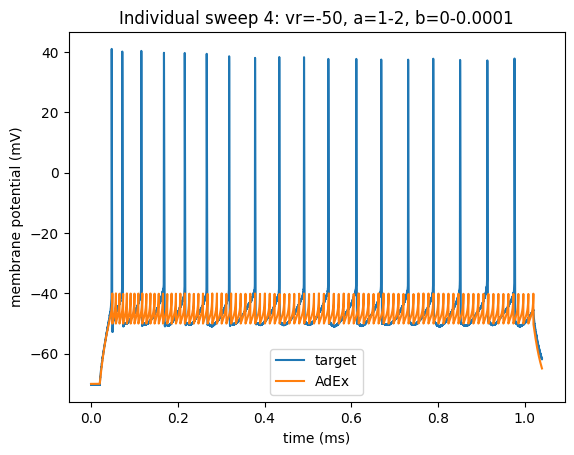

In [25]:
create_comparison_together(reshaped_ls_sweep4_out[0], adex_sweep4_1[0]*1000, d2_title='AdEx')
title('Individual sweep 4: vr=-50, a=1-2, b=0-0.0001')

# BEST ADEX SWEEP 4

In [22]:
adex_sweep4_2 = run_adex(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, vr=-50, a_max=3, b_max=0.001)

first fit:
Round 0: Best parameters a=1.81683834 nS, b=0.73997286 pA, tauw=153.41687902 ms (error: 95.23273108 mV^2)
Round 1: Best parameters a=1.81683834 nS, b=0.73997286 pA, tauw=153.41687902 ms (error: 95.23273108 mV^2)
Round 2: Best parameters a=1.48565123 nS, b=213.4895632 fA, tauw=153.39881763 ms (error: 94.42024511 mV^2)
Round 3: Best parameters a=1.48565123 nS, b=213.4895632 fA, tauw=153.39881763 ms (error: 94.42024511 mV^2)
Round 4: Best parameters a=1.3228941 nS, b=0.32327695 pA, tauw=128.72599949 ms (error: 94.15681413 mV^2)
Round 5: Best parameters a=1.3228941 nS, b=0.32327695 pA, tauw=128.72599949 ms (error: 94.15681413 mV^2)
Round 6: Best parameters a=1.3228941 nS, b=0.32327695 pA, tauw=128.72599949 ms (error: 94.15681413 mV^2)
Round 7: Best parameters a=1.3228941 nS, b=0.32327695 pA, tauw=128.72599949 ms (error: 94.15681413 mV^2)
Round 8: Best parameters a=1.3228941 nS, b=0.32327695 pA, tauw=128.72599949 ms (error: 94.15681413 mV^2)
Round 9: Best parameters a=1.3228941 n

Text(0.5, 1.0, 'Individual sweep 4: vr=-50, a=1-3, b=0-0.001')

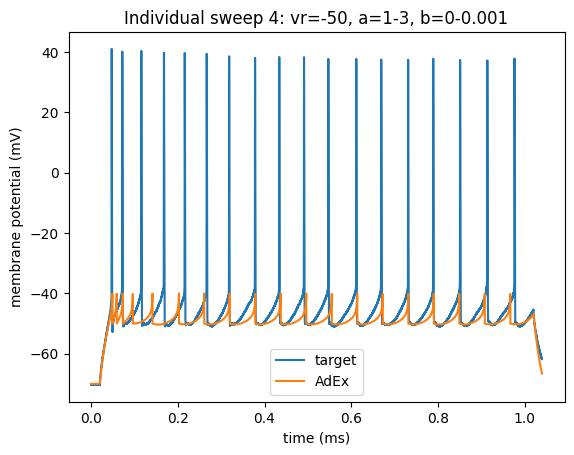

In [26]:
create_comparison_together(reshaped_ls_sweep4_out[0], adex_sweep4_2[0]*1000, d2_title='AdEx')
title('Individual sweep 4: vr=-50, a=1-3, b=0-0.001')

In [27]:
adex_sweep4_3 = run_adex(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, vr=-50, a_max=3)

first fit:
Round 0: Best parameters a=1.25197894 nS, b=64.2678706 pA, tauw=146.23923782 ms (error: 146.1037569 mV^2)
Round 1: Best parameters a=1.57161769 nS, b=36.25972119 pA, tauw=146.15813368 ms (error: 116.01717348 mV^2)
Round 2: Best parameters a=1.3319173 nS, b=24.36151799 pA, tauw=129.99183836 ms (error: 104.36811079 mV^2)
Round 3: Best parameters a=1.44166582 nS, b=20.29158757 pA, tauw=126.7102728 ms (error: 97.48584681 mV^2)
Round 4: Best parameters a=1.39719571 nS, b=18.82610197 pA, tauw=144.58502267 ms (error: 97.11001421 mV^2)
Round 5: Best parameters a=1.17738123 nS, b=9.91230865 pA, tauw=123.71185295 ms (error: 97.06139077 mV^2)
Round 6: Best parameters a=1.18559496 nS, b=8.57715772 pA, tauw=151.09109634 ms (error: 97.02300656 mV^2)
Round 7: Best parameters a=1.44168709 nS, b=8.60574122 pA, tauw=127.46399195 ms (error: 96.27328395 mV^2)
Round 8: Best parameters a=1.14806512 nS, b=7.47254402 pA, tauw=155.13550632 ms (error: 95.70882624 mV^2)
Round 9: Best parameters a=1.13

Text(0.5, 1.0, 'Individual sweep 4: vr=-50, a=1-3')

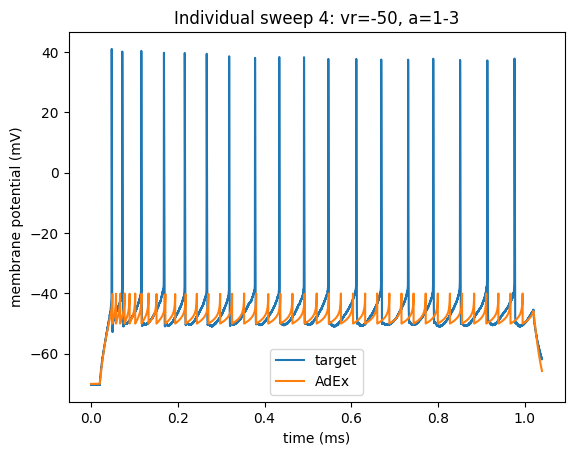

In [28]:
create_comparison_together(reshaped_ls_sweep4_out[0], adex_sweep4_3[0]*1000, d2_title='AdEx')
title('Individual sweep 4: vr=-50, a=1-3')

In [29]:
adex_sweep4_4 = run_adex(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, vr=-50)

first fit:
Round 0: Best parameters a=2.82279895 nS, b=55.79190842 pA, tauw=128.97967064 ms (error: 143.34600813 mV^2)
Round 1: Best parameters a=1.80655065 nS, b=45.7311397 pA, tauw=132.82807581 ms (error: 124.16845169 mV^2)
Round 2: Best parameters a=1.79221058 nS, b=22.45022563 pA, tauw=126.92311938 ms (error: 106.5170304 mV^2)
Round 3: Best parameters a=1.26014853 nS, b=24.0442256 pA, tauw=124.63081329 ms (error: 100.07518463 mV^2)
Round 4: Best parameters a=1.39335669 nS, b=21.11730385 pA, tauw=123.63093864 ms (error: 96.29665396 mV^2)
Round 5: Best parameters a=1.39335669 nS, b=21.11730385 pA, tauw=123.63093864 ms (error: 96.29665396 mV^2)
Round 6: Best parameters a=1.39335669 nS, b=21.11730385 pA, tauw=123.63093864 ms (error: 96.29665396 mV^2)
Round 7: Best parameters a=1.39335669 nS, b=21.11730385 pA, tauw=123.63093864 ms (error: 96.29665396 mV^2)
Round 8: Best parameters a=1.91496945 nS, b=16.85384419 pA, tauw=124.19385879 ms (error: 95.96446421 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'Individual sweep 4: vr=-50')

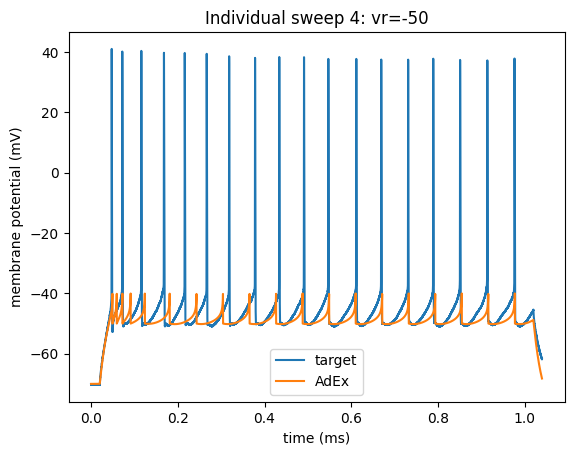

In [30]:
create_comparison_together(reshaped_ls_sweep4_out[0], adex_sweep4_4[0]*1000, d2_title='AdEx')
title('Individual sweep 4: vr=-50')

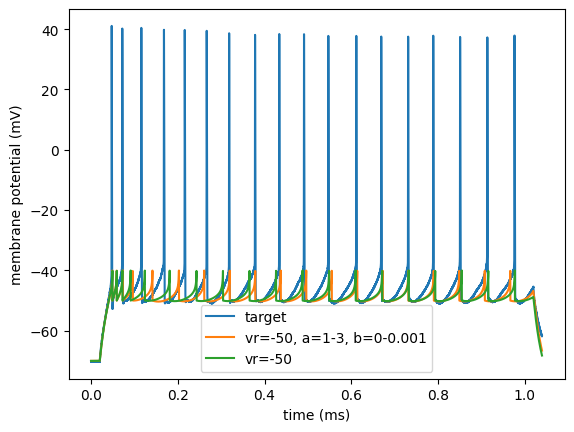

In [32]:
create_comparison_together_three(reshaped_ls_sweep4_out[0], adex_sweep4_2[0]*1000, adex_sweep4_4[0]*1000,\
                                 d2_title='vr=-50, a=1-3, b=0-0.001', d3_title='vr=-50')

run 2 slightly closer... vr=-50, a=1-3, b=0.001

In [33]:
adex_sweep4_5 = run_adex(reshaped_ls_sweep4_in, reshaped_ls_sweep4_out, vr=-50, a_max=3, b_max=0.0001)

first fit:
Round 0: Best parameters a=1.27970379 nS, b=13.494705 fA, tauw=138.33460402 ms (error: 94.75257999 mV^2)
Round 1: Best parameters a=1.45414473 nS, b=69.43806859 fA, tauw=127.70986261 ms (error: 94.57169511 mV^2)
Round 2: Best parameters a=1.45414473 nS, b=69.43806859 fA, tauw=127.70986261 ms (error: 94.57169511 mV^2)
Round 3: Best parameters a=1.45414473 nS, b=69.43806859 fA, tauw=127.70986261 ms (error: 94.57169511 mV^2)
Round 4: Best parameters a=1.44212752 nS, b=79.05390957 fA, tauw=123.78534911 ms (error: 94.17959246 mV^2)
Round 5: Best parameters a=1.45147972 nS, b=58.91331599 fA, tauw=123.89017001 ms (error: 94.11946228 mV^2)
Round 6: Best parameters a=1.45147972 nS, b=58.91331599 fA, tauw=123.89017001 ms (error: 94.11946228 mV^2)
Round 7: Best parameters a=1.45147972 nS, b=58.91331599 fA, tauw=123.89017001 ms (error: 94.11946228 mV^2)
Round 8: Best parameters a=1.45147972 nS, b=58.91331599 fA, tauw=123.89017001 ms (error: 94.11946228 mV^2)
Round 9: Best parameters a=1

Text(0.5, 1.0, 'Individual sweep 4: vr=-50, a=1-3, b=0-0.0001')

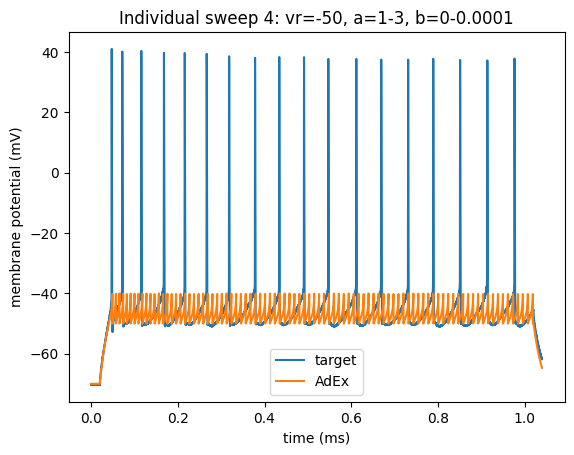

In [34]:
create_comparison_together(reshaped_ls_sweep4_out[0], adex_sweep4_5[0]*1000, d2_title='AdEx')
title('Individual sweep 4: vr=-50, a=1-3, b=0-0.0001')

In [35]:
adex_sweep5_0 = run_adex(reshaped_ls_sweep5_in, reshaped_ls_sweep5_out, vr=-50)

first fit:
Round 0: Best parameters a=1.50304275 nS, b=90.81272427 pA, tauw=133.93457677 ms (error: 191.66900184 mV^2)
Round 1: Best parameters a=1.24103586 nS, b=38.32471991 pA, tauw=130.98149969 ms (error: 128.75510081 mV^2)
Round 2: Best parameters a=1.16559278 nS, b=27.83361425 pA, tauw=130.15879926 ms (error: 118.11266905 mV^2)
Round 3: Best parameters a=1.13242762 nS, b=26.4740461 pA, tauw=128.58809226 ms (error: 114.60564516 mV^2)
Round 4: Best parameters a=1.28402257 nS, b=25.71475717 pA, tauw=126.58570531 ms (error: 114.34783909 mV^2)
Round 5: Best parameters a=1.28402257 nS, b=25.71475717 pA, tauw=126.58570531 ms (error: 114.34783909 mV^2)
Round 6: Best parameters a=1.28402257 nS, b=25.71475717 pA, tauw=126.58570531 ms (error: 114.34783909 mV^2)
Round 7: Best parameters a=1.28402257 nS, b=25.71475717 pA, tauw=126.58570531 ms (error: 114.34783909 mV^2)
Round 8: Best parameters a=1.28402257 nS, b=25.71475717 pA, tauw=126.58570531 ms (error: 114.34783909 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 5: vr=-50')

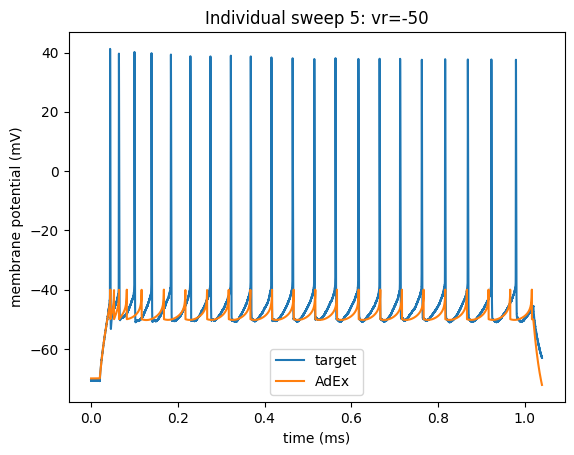

In [36]:
create_comparison_together(reshaped_ls_sweep5_out[0], adex_sweep5_0[0]*1000, d2_title='AdEx')
title('Individual sweep 5: vr=-50')

In [37]:
adex_sweep5_1 = run_adex(reshaped_ls_sweep5_in, reshaped_ls_sweep5_out, vr=-50, b_max=1)

first fit:
Round 0: Best parameters a=1.52091241 nS, b=119.69712872 pA, tauw=143.63742779 ms (error: 233.74126924 mV^2)
Round 1: Best parameters a=1.21792241 nS, b=65.20659665 pA, tauw=139.6668642 ms (error: 156.15138966 mV^2)
Round 2: Best parameters a=1.21081365 nS, b=41.68217321 pA, tauw=142.44005579 ms (error: 133.70665366 mV^2)
Round 3: Best parameters a=1.10463797 nS, b=27.89044531 pA, tauw=131.72383241 ms (error: 118.3678349 mV^2)
Round 4: Best parameters a=1.16440592 nS, b=24.96750328 pA, tauw=137.74172752 ms (error: 115.37007116 mV^2)
Round 5: Best parameters a=1.23935167 nS, b=26.3857868 pA, tauw=124.22408589 ms (error: 114.33508068 mV^2)
Round 6: Best parameters a=1.23935167 nS, b=26.3857868 pA, tauw=124.22408589 ms (error: 114.33508068 mV^2)
Round 7: Best parameters a=1.23935167 nS, b=26.3857868 pA, tauw=124.22408589 ms (error: 114.33508068 mV^2)
Round 8: Best parameters a=1.23935167 nS, b=26.3857868 pA, tauw=124.22408589 ms (error: 114.33508068 mV^2)
Round 9: Best paramete

# CLOSEST ADEX SWEEP 5

Text(0.5, 1.0, 'Individual sweep 5: vr=-50, b=0-1')

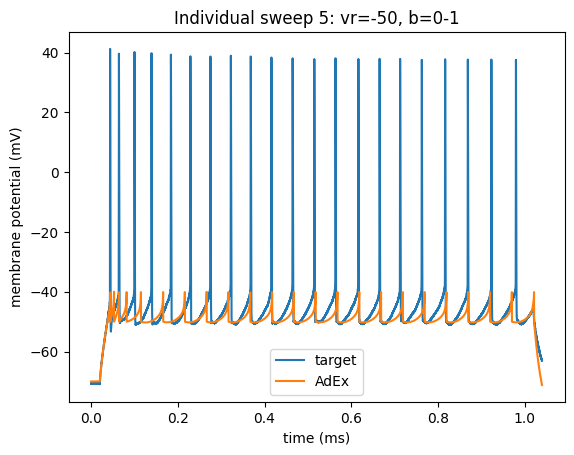

In [38]:
create_comparison_together(reshaped_ls_sweep5_out[0], adex_sweep5_1[0]*1000, d2_title='AdEx')
title('Individual sweep 5: vr=-50, b=0-1')

In [39]:
adex_sweep6_0 = run_adex(reshaped_ls_sweep6_in, reshaped_ls_sweep6_out, vr=-50)

first fit:
Round 0: Best parameters a=2.08648618 nS, b=76.57372812 pA, tauw=145.94516467 ms (error: 188.27514429 mV^2)
Round 1: Best parameters a=2.01500516 nS, b=43.38084197 pA, tauw=152.98400805 ms (error: 150.37762324 mV^2)
Round 2: Best parameters a=1.40671844 nS, b=28.97141382 pA, tauw=134.72996016 ms (error: 135.1006812 mV^2)
Round 3: Best parameters a=1.26653558 nS, b=22.17624514 pA, tauw=144.79055515 ms (error: 132.24283902 mV^2)
Round 4: Best parameters a=1.27360144 nS, b=27.24933288 pA, tauw=125.45957756 ms (error: 128.97002404 mV^2)
Round 5: Best parameters a=1.27360144 nS, b=27.24933288 pA, tauw=125.45957756 ms (error: 128.97002404 mV^2)
Round 6: Best parameters a=1.27360144 nS, b=27.24933288 pA, tauw=125.45957756 ms (error: 128.97002404 mV^2)
Round 7: Best parameters a=1.27360144 nS, b=27.24933288 pA, tauw=125.45957756 ms (error: 128.97002404 mV^2)
Round 8: Best parameters a=1.27360144 nS, b=27.24933288 pA, tauw=125.45957756 ms (error: 128.97002404 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 6: vr=-50')

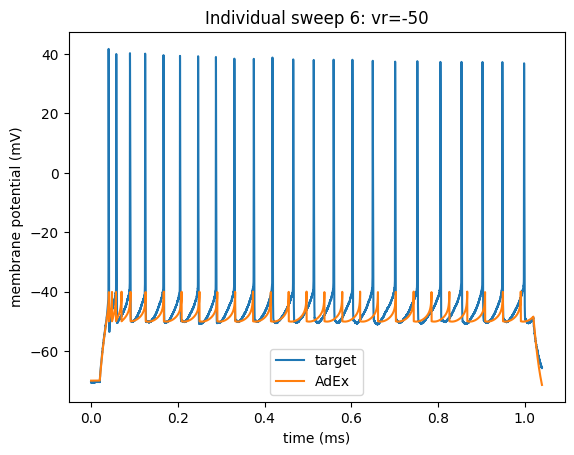

In [40]:
create_comparison_together(reshaped_ls_sweep6_out[0], adex_sweep6_0[0]*1000, d2_title='AdEx')
title('Individual sweep 6: vr=-50')

In [41]:
adex_sweep6_1 = run_adex(reshaped_ls_sweep6_in, reshaped_ls_sweep6_out, vr=-50, b_max=1)

first fit:
Round 0: Best parameters a=1.80063405 nS, b=140.19980272 pA, tauw=133.93979594 ms (error: 278.29449842 mV^2)
Round 1: Best parameters a=1.41947035 nS, b=91.21390694 pA, tauw=128.41891275 ms (error: 197.30653891 mV^2)
Round 2: Best parameters a=1.41066764 nS, b=46.9941514 pA, tauw=152.86325796 ms (error: 150.95061563 mV^2)
Round 3: Best parameters a=1.32272246 nS, b=32.76389583 pA, tauw=127.84682233 ms (error: 136.55874191 mV^2)
Round 4: Best parameters a=1.32272246 nS, b=26.3758594 pA, tauw=154.95312784 ms (error: 131.47320071 mV^2)
Round 5: Best parameters a=1.4966427 nS, b=25.69668344 pA, tauw=152.8148899 ms (error: 130.56993447 mV^2)
Round 6: Best parameters a=1.6477687 nS, b=24.69079347 pA, tauw=153.3412878 ms (error: 129.58907217 mV^2)
Round 7: Best parameters a=1.25582256 nS, b=11.83701849 pA, tauw=128.14042826 ms (error: 126.81535162 mV^2)
Round 8: Best parameters a=1.25582256 nS, b=11.83701849 pA, tauw=128.14042826 ms (error: 126.81535162 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'Individual sweep 6: vr=-50, b=0-1')

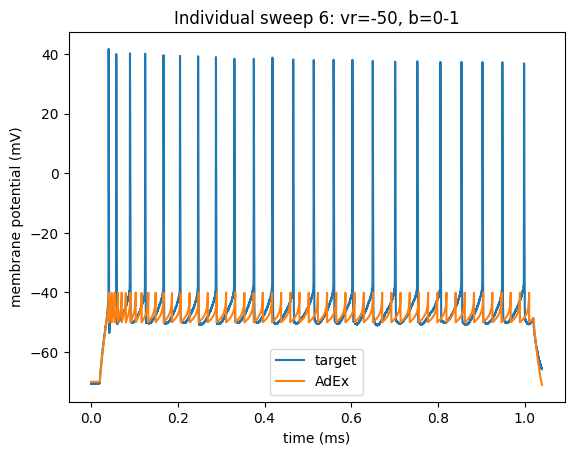

In [42]:
create_comparison_together(reshaped_ls_sweep6_out[0], adex_sweep6_1[0]*1000, d2_title='AdEx')
title('Individual sweep 6: vr=-50, b=0-1')

# BEST ADEX INDIV SWEEP 6?   check run 0

Interesting (?) as run 1_1, same as above, although very different results...

In [43]:
adex_sweep6_1_1 = run_adex(reshaped_ls_sweep6_in, reshaped_ls_sweep6_out, vr=-50, b_max=1)

first fit:
Round 0: Best parameters a=1.95913903 nS, b=120.75652617 pA, tauw=136.88180179 ms (error: 256.10395125 mV^2)
Round 1: Best parameters a=1.40282809 nS, b=69.87797576 pA, tauw=143.42763333 ms (error: 171.61549222 mV^2)
Round 2: Best parameters a=1.51231846 nS, b=47.1022121 pA, tauw=133.37877378 ms (error: 149.63385537 mV^2)
Round 3: Best parameters a=1.40282809 nS, b=30.06641384 pA, tauw=128.52344058 ms (error: 133.85149704 mV^2)
Round 4: Best parameters a=1.83802359 nS, b=24.47047252 pA, tauw=146.99100729 ms (error: 130.88754369 mV^2)
Round 5: Best parameters a=1.50326098 nS, b=20.98629478 pA, tauw=152.6281679 ms (error: 130.66876294 mV^2)
Round 6: Best parameters a=1.20424114 nS, b=26.75695157 pA, tauw=155.61469407 ms (error: 128.99850784 mV^2)
Round 7: Best parameters a=1.25652247 nS, b=26.22143166 pA, tauw=157.85489346 ms (error: 128.62529299 mV^2)
Round 8: Best parameters a=1.25652247 nS, b=26.22143166 pA, tauw=157.85489346 ms (error: 128.62529299 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 6: vr=-50, b=0-1')

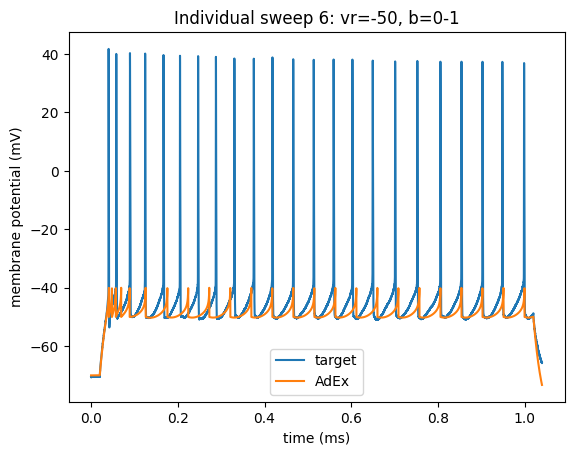

In [45]:
create_comparison_together(reshaped_ls_sweep6_out[0], adex_sweep6_1_1[0]*1000, d2_title='AdEx')
title('Individual sweep 6: vr=-50, b=0-1')

In [46]:
adex_sweep7_0 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50)

first fit:
Round 0: Best parameters a=3.07419756 nS, b=74.45524671 pA, tauw=137.66674932 ms (error: 198.44104881 mV^2)
Round 1: Best parameters a=2.43706439 nS, b=36.45628449 pA, tauw=131.62998744 ms (error: 157.08889922 mV^2)
Round 2: Best parameters a=2.09248263 nS, b=30.17797044 pA, tauw=125.90110491 ms (error: 147.00314406 mV^2)
Round 3: Best parameters a=2.09248263 nS, b=30.17797044 pA, tauw=125.90110491 ms (error: 147.00314406 mV^2)
Round 4: Best parameters a=1.61047502 nS, b=13.05295949 pA, tauw=130.83875928 ms (error: 144.27729204 mV^2)
Round 5: Best parameters a=1.22132117 nS, b=14.3160326 pA, tauw=123.46446502 ms (error: 142.71609634 mV^2)
Round 6: Best parameters a=1.29560943 nS, b=14.0272542 pA, tauw=124.95297334 ms (error: 141.10497466 mV^2)
Round 7: Best parameters a=1.29560943 nS, b=14.0272542 pA, tauw=124.95297334 ms (error: 141.10497466 mV^2)
Round 8: Best parameters a=1.3469089 nS, b=10.22634926 pA, tauw=123.62502774 ms (error: 141.04771015 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'Individual sweep 7: vr=-50')

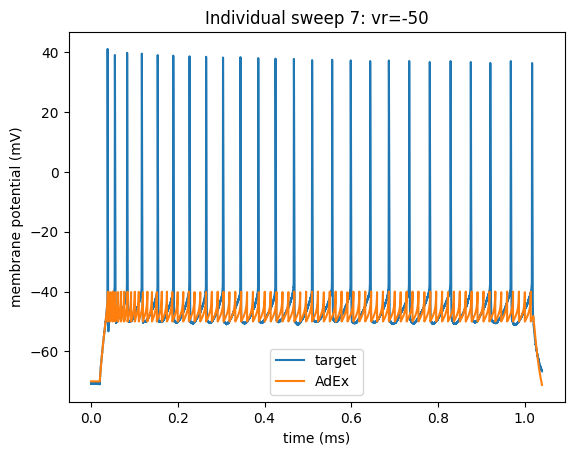

In [47]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_0[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50')

In [48]:
adex_sweep7_1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=10, b_max=2)

first fit:
Round 0: Best parameters a=7.80641229 nS, b=310.66612586 pA, tauw=143.50429806 ms (error: 243.64679388 mV^2)
Round 1: Best parameters a=7.00446671 nS, b=131.00601109 pA, tauw=132.22858831 ms (error: 161.72211527 mV^2)
Round 2: Best parameters a=7.00446671 nS, b=131.00601109 pA, tauw=132.22858831 ms (error: 161.72211527 mV^2)
Round 3: Best parameters a=7.00446671 nS, b=131.00601109 pA, tauw=132.22858831 ms (error: 161.72211527 mV^2)
Round 4: Best parameters a=6.95957328 nS, b=126.75931531 pA, tauw=141.39686245 ms (error: 159.38247538 mV^2)
Round 5: Best parameters a=6.95957328 nS, b=126.75931531 pA, tauw=141.39686245 ms (error: 159.38247538 mV^2)
Round 6: Best parameters a=6.95957328 nS, b=126.75931531 pA, tauw=141.39686245 ms (error: 159.38247538 mV^2)
Round 7: Best parameters a=6.95957328 nS, b=126.75931531 pA, tauw=141.39686245 ms (error: 159.38247538 mV^2)
Round 8: Best parameters a=6.95957328 nS, b=126.75931531 pA, tauw=141.39686245 ms (error: 159.38247538 mV^2)
Round 9:

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-10, b=0-2')

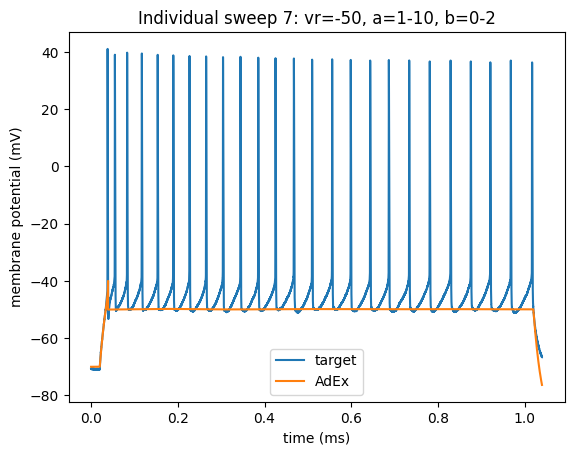

In [49]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_1[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-10, b=0-2')

In [50]:
adex_sweep7_1_1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=10, b_max=2)

first fit:
Round 0: Best parameters a=7.61784272 nS, b=0.32564013 nA, tauw=142.18384858 ms (error: 247.19575866 mV^2)
Round 1: Best parameters a=7.16445004 nS, b=135.9808189 pA, tauw=138.55193686 ms (error: 166.87259654 mV^2)
Round 2: Best parameters a=7.03282219 nS, b=137.73917152 pA, tauw=126.43320636 ms (error: 163.86018299 mV^2)
Round 3: Best parameters a=7.03282219 nS, b=137.73917152 pA, tauw=126.43320636 ms (error: 163.86018299 mV^2)
Round 4: Best parameters a=6.96257439 nS, b=124.90968454 pA, tauw=127.921255 ms (error: 159.35462329 mV^2)
Round 5: Best parameters a=6.96257439 nS, b=124.90968454 pA, tauw=127.921255 ms (error: 159.35462329 mV^2)
Round 6: Best parameters a=6.96257439 nS, b=124.90968454 pA, tauw=127.921255 ms (error: 159.35462329 mV^2)
Round 7: Best parameters a=6.96257439 nS, b=124.90968454 pA, tauw=127.921255 ms (error: 159.35462329 mV^2)
Round 8: Best parameters a=6.96257439 nS, b=124.90968454 pA, tauw=127.921255 ms (error: 159.35462329 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-10, b=0-2')

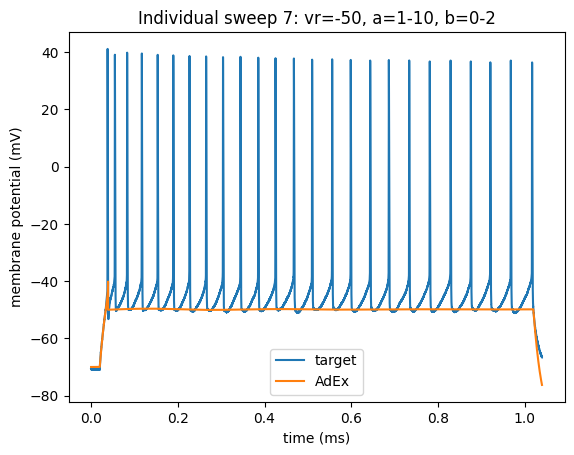

In [52]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_1_1[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-10, b=0-2')

In [53]:
adex_sweep7_2 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=5, b_max=2)

first fit:
Round 0: Best parameters a=1.64207537 nS, b=234.87428286 pA, tauw=125.97073086 ms (error: 496.28522209 mV^2)
Round 1: Best parameters a=1.80468729 nS, b=152.09708254 pA, tauw=125.84356846 ms (error: 303.05406279 mV^2)
Round 2: Best parameters a=1.45194579 nS, b=94.39541825 pA, tauw=146.15912299 ms (error: 214.43780481 mV^2)
Round 3: Best parameters a=1.17828991 nS, b=72.30674602 pA, tauw=153.98367177 ms (error: 184.21982086 mV^2)
Round 4: Best parameters a=1.32423311 nS, b=51.61443873 pA, tauw=123.35945519 ms (error: 165.2957157 mV^2)
Round 5: Best parameters a=1.2912553 nS, b=39.94306742 pA, tauw=124.01390274 ms (error: 153.13723812 mV^2)
Round 6: Best parameters a=1.13514726 nS, b=31.69741536 pA, tauw=125.93250567 ms (error: 148.33359917 mV^2)
Round 7: Best parameters a=1.10981742 nS, b=32.36283147 pA, tauw=123.35945519 ms (error: 147.74338727 mV^2)
Round 8: Best parameters a=1.3272757 nS, b=16.69981138 pA, tauw=129.00758537 ms (error: 143.90037654 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-5, b=0-2')

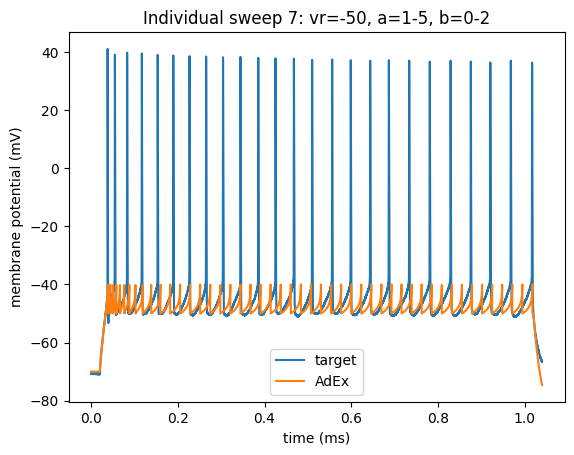

In [54]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_2[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-5, b=0-2')

In [55]:
adex_sweep7_2_1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=5, b_max=2)

first fit:
Round 0: Best parameters a=3.5228573 nS, b=283.2917038 pA, tauw=145.87017624 ms (error: 648.39267309 mV^2)
Round 1: Best parameters a=2.32716882 nS, b=162.12564698 pA, tauw=145.88314001 ms (error: 347.96118416 mV^2)
Round 2: Best parameters a=1.7769338 nS, b=105.71081958 pA, tauw=130.01135489 ms (error: 229.24941338 mV^2)
Round 3: Best parameters a=2.17117777 nS, b=54.70636403 pA, tauw=124.84625916 ms (error: 169.93291124 mV^2)
Round 4: Best parameters a=1.56125335 nS, b=37.48513241 pA, tauw=127.26042444 ms (error: 150.09436421 mV^2)
Round 5: Best parameters a=1.61774484 nS, b=25.72644374 pA, tauw=139.10578036 ms (error: 149.63792169 mV^2)
Round 6: Best parameters a=1.340739 nS, b=15.3272269 pA, tauw=142.23330067 ms (error: 142.94920675 mV^2)
Round 7: Best parameters a=1.340739 nS, b=15.3272269 pA, tauw=142.23330067 ms (error: 142.94920675 mV^2)
Round 8: Best parameters a=1.340739 nS, b=15.3272269 pA, tauw=142.23330067 ms (error: 142.94920675 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-5, b=0-2')

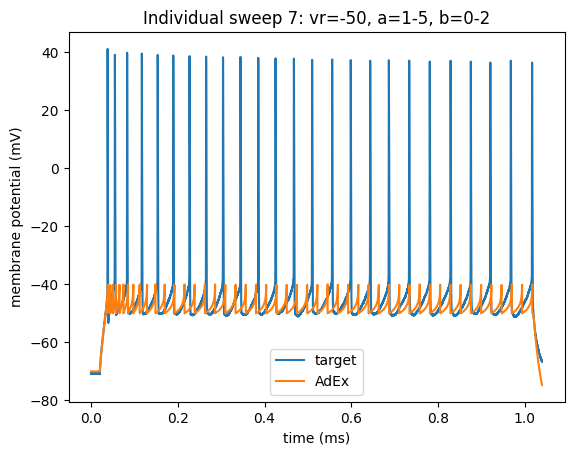

In [56]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_2_1[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-5, b=0-2')

In [57]:
adex_sweep7_3 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=8, b_max=2)

first fit:
Round 0: Best parameters a=2.19624598 nS, b=200.40645149 pA, tauw=127.30095717 ms (error: 409.47140166 mV^2)
Round 1: Best parameters a=2.89111576 nS, b=123.28507957 pA, tauw=122.98311967 ms (error: 270.49832313 mV^2)
Round 2: Best parameters a=7.0319409 nS, b=142.27545063 pA, tauw=124.78111406 ms (error: 164.69005568 mV^2)
Round 3: Best parameters a=6.95227286 nS, b=129.73292061 pA, tauw=148.38282675 ms (error: 159.6348947 mV^2)
Round 4: Best parameters a=6.95227286 nS, b=129.73292061 pA, tauw=148.38282675 ms (error: 159.6348947 mV^2)
Round 5: Best parameters a=6.95227286 nS, b=129.73292061 pA, tauw=148.38282675 ms (error: 159.6348947 mV^2)
Round 6: Best parameters a=6.95227286 nS, b=129.73292061 pA, tauw=148.38282675 ms (error: 159.6348947 mV^2)
Round 7: Best parameters a=6.95227286 nS, b=129.73292061 pA, tauw=148.38282675 ms (error: 159.6348947 mV^2)
Round 8: Best parameters a=6.95227286 nS, b=129.73292061 pA, tauw=148.38282675 ms (error: 159.6348947 mV^2)
Round 9: Best p

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-8, b=0-2')

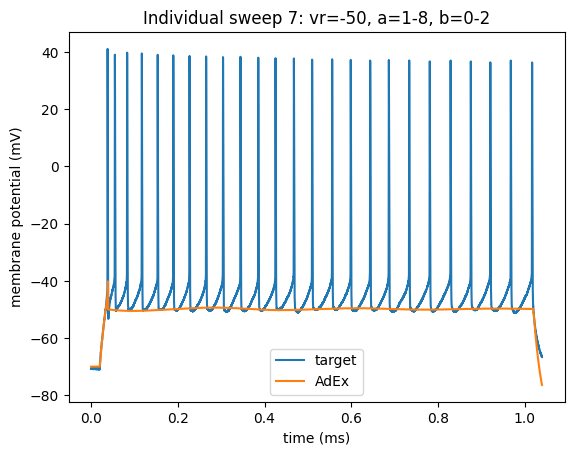

In [58]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_3[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-8, b=0-2')

# CLOSEST INDV SWEEP 7?

adex_sweep7_4 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

In [59]:
adex_sweep7_4 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

first fit:
Round 0: Best parameters a=2.6453876 nS, b=0.36210867 nA, tauw=138.0664206 ms (error: 934.23922145 mV^2)
Round 1: Best parameters a=4.60480363 nS, b=199.98873147 pA, tauw=130.43443019 ms (error: 424.65820221 mV^2)
Round 2: Best parameters a=3.00584662 nS, b=121.44584698 pA, tauw=139.32382875 ms (error: 272.41045644 mV^2)
Round 3: Best parameters a=1.62263769 nS, b=63.85257334 pA, tauw=130.68998123 ms (error: 175.62732506 mV^2)
Round 4: Best parameters a=1.35984578 nS, b=50.9163693 pA, tauw=126.19111905 ms (error: 162.68210561 mV^2)
Round 5: Best parameters a=1.43811164 nS, b=33.14415756 pA, tauw=128.14043383 ms (error: 152.70486897 mV^2)
Round 6: Best parameters a=1.76313486 nS, b=34.85083928 pA, tauw=123.82762772 ms (error: 147.0449605 mV^2)
Round 7: Best parameters a=1.76313486 nS, b=34.85083928 pA, tauw=123.82762772 ms (error: 147.0449605 mV^2)
Round 8: Best parameters a=1.76313486 nS, b=34.85083928 pA, tauw=123.82762772 ms (error: 147.0449605 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

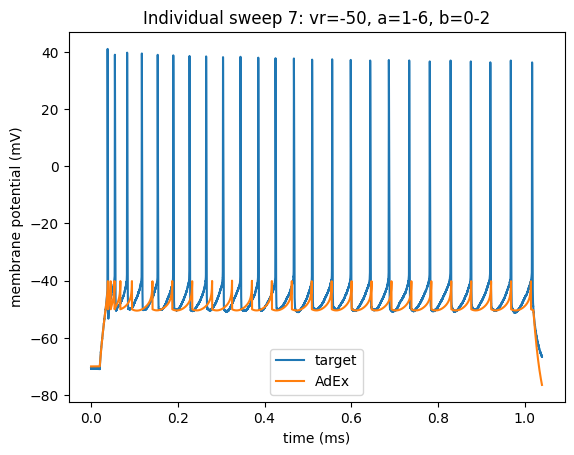

In [60]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_4[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

In [61]:
adex_sweep7_4_1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

first fit:
Round 0: Best parameters a=4.7925056 nS, b=269.00869908 pA, tauw=128.13079854 ms (error: 561.80267311 mV^2)
Round 1: Best parameters a=5.31139661 nS, b=146.34027935 pA, tauw=127.49761385 ms (error: 309.98102879 mV^2)
Round 2: Best parameters a=5.48814076 nS, b=97.84964759 pA, tauw=123.52986662 ms (error: 245.72766424 mV^2)
Round 3: Best parameters a=3.50680938 nS, b=75.86835037 pA, tauw=123.84626384 ms (error: 199.64228844 mV^2)
Round 4: Best parameters a=2.50352698 nS, b=70.36237781 pA, tauw=130.90660115 ms (error: 190.95825442 mV^2)
Round 5: Best parameters a=3.50680938 nS, b=65.39684424 pA, tauw=127.4949911 ms (error: 187.95371751 mV^2)
Round 6: Best parameters a=3.50680938 nS, b=65.39684424 pA, tauw=127.4949911 ms (error: 187.95371751 mV^2)
Round 7: Best parameters a=3.50680938 nS, b=65.39684424 pA, tauw=127.4949911 ms (error: 187.95371751 mV^2)
Round 8: Best parameters a=3.50680938 nS, b=65.39684424 pA, tauw=127.4949911 ms (error: 187.95371751 mV^2)
Round 9: Best parame

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

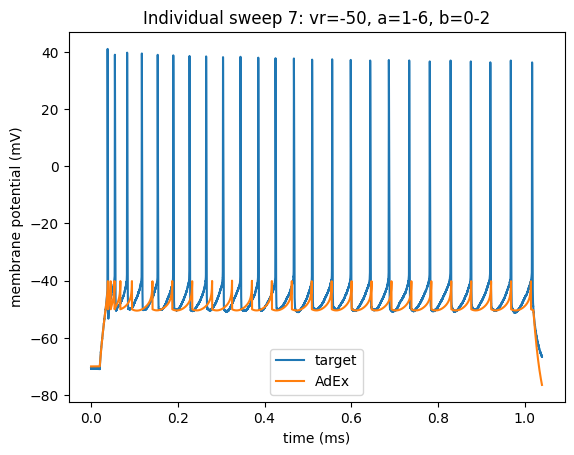

In [62]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_4[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

Interesting that best result seems to be within range of original params, yet much closer...

Also, results much more accurate when run individually, even though most sweeps untouched regarding params...

In [63]:
# see what happens if run again...
adex_sweep7_0_1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50)

first fit:
Round 0: Best parameters a=1.76283098 nS, b=68.83906711 pA, tauw=134.69327117 ms (error: 181.65624593 mV^2)
Round 1: Best parameters a=1.85117019 nS, b=39.32677026 pA, tauw=126.57371007 ms (error: 157.13477354 mV^2)
Round 2: Best parameters a=2.7409046 nS, b=24.37896778 pA, tauw=127.24470196 ms (error: 147.28520285 mV^2)
Round 3: Best parameters a=1.69756285 nS, b=16.21541704 pA, tauw=125.03351661 ms (error: 144.91730074 mV^2)
Round 4: Best parameters a=1.69756285 nS, b=13.87771202 pA, tauw=125.03351661 ms (error: 143.41509831 mV^2)
Round 5: Best parameters a=1.82947604 nS, b=8.37700458 pA, tauw=126.00199247 ms (error: 142.48385343 mV^2)
Round 6: Best parameters a=1.81362692 nS, b=8.35331531 pA, tauw=126.74418862 ms (error: 141.29574518 mV^2)
Round 7: Best parameters a=2.02097171 nS, b=6.86220133 pA, tauw=130.9938068 ms (error: 141.16945134 mV^2)
Round 8: Best parameters a=2.02097171 nS, b=6.86220133 pA, tauw=130.9938068 ms (error: 141.16945134 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'Individual sweep 7: vr=-50')

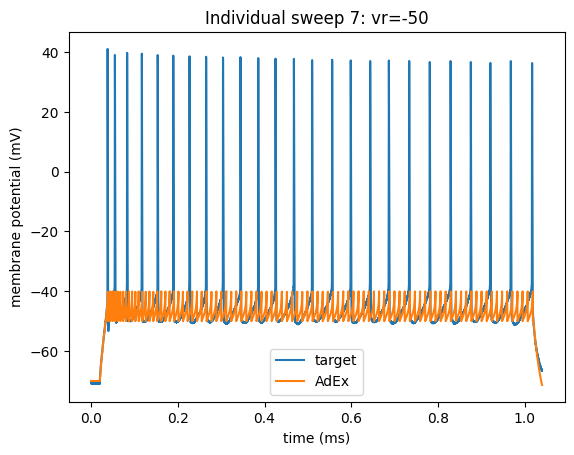

In [64]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_0_1[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50')

***

In [72]:
adex_sweep7_closest = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

first fit:
Round 0: Best parameters a=3.93236174 nS, b=220.26119039 pA, tauw=142.58373336 ms (error: 478.9086301 mV^2)
Round 1: Best parameters a=3.66910532 nS, b=140.94144121 pA, tauw=126.75677127 ms (error: 304.64312122 mV^2)
Round 2: Best parameters a=1.80716377 nS, b=87.89966555 pA, tauw=124.96339881 ms (error: 205.09999121 mV^2)
Round 3: Best parameters a=1.45397976 nS, b=65.31268956 pA, tauw=126.51000719 ms (error: 175.85714153 mV^2)
Round 4: Best parameters a=1.21994641 nS, b=47.45403109 pA, tauw=133.72935119 ms (error: 158.13800111 mV^2)
Round 5: Best parameters a=1.29745389 nS, b=32.75822623 pA, tauw=125.66940496 ms (error: 151.81041963 mV^2)
Round 6: Best parameters a=1.12539494 nS, b=32.64368434 pA, tauw=123.34674475 ms (error: 147.26779003 mV^2)
Round 7: Best parameters a=1.29745389 nS, b=19.43167376 pA, tauw=122.56105674 ms (error: 146.63791894 mV^2)
Round 8: Best parameters a=1.19723259 nS, b=18.47951021 pA, tauw=122.0745753 ms (error: 143.58364105 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

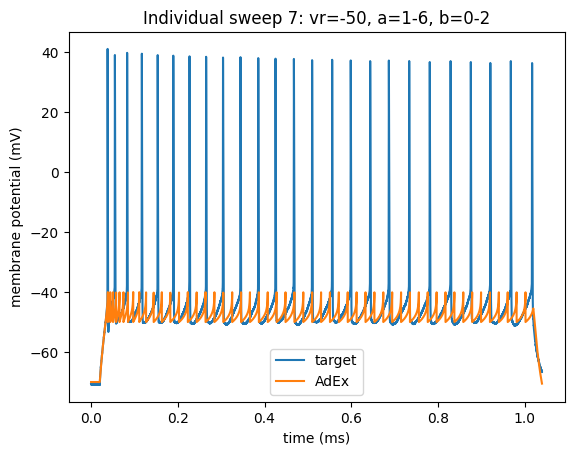

In [76]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

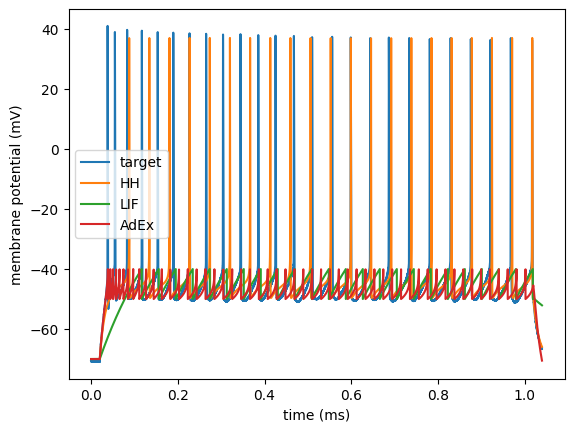

In [73]:
create_comparison_together_four(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000, adex_sweep7_closest[0]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')

(-60.0, -30.0)

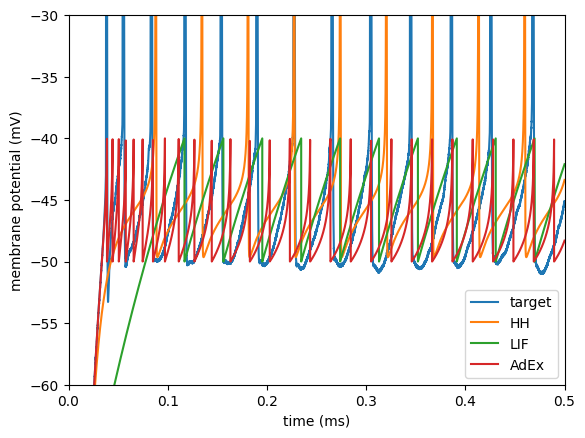

In [75]:
create_comparison_together_four(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000, adex_sweep7_closest[0]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
xlim(0, 0.5)
ylim(-60, -30)

interesting, adex diff...

In [ ]:
adex_sweep7_closest_1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

# # from above, same params...:
# Round 9: Best parameters a=1.76313486 nS, b=34.85083928 pA, tauw=123.82762772 ms (error: 147.0449605 mV^2)
# interesting that error higher but trace closer...

first fit:
Round 0: Best parameters a=4.95633919 nS, b=268.2688271 pA, tauw=135.8127782 ms (error: 578.61455575 mV^2)
Round 1: Best parameters a=4.84486748 nS, b=139.90736489 pA, tauw=147.85634439 ms (error: 317.20888345 mV^2)
Round 2: Best parameters a=4.59357828 nS, b=81.67845068 pA, tauw=154.04877017 ms (error: 226.95621867 mV^2)
Round 3: Best parameters a=1.60927483 nS, b=60.49732146 pA, tauw=150.56447389 ms (error: 180.03899371 mV^2)
Round 4: Best parameters a=1.33200078 nS, b=45.03663677 pA, tauw=127.14048997 ms (error: 159.75574924 mV^2)
Round 5: Best parameters a=1.56756673 nS, b=35.15365794 pA, tauw=128.50125886 ms (error: 147.8443266 mV^2)
Round 6: Best parameters a=1.20121193 nS, b=31.9013288 pA, tauw=125.6587955 ms (error: 147.03960646 mV^2)
Round 7: Best parameters a=1.17440815 nS, b=22.73603585 pA, tauw=127.46671946 ms (error: 146.11321792 mV^2)
Round 8: Best parameters a=1.09948559 nS, b=18.68684593 pA, tauw=123.2343286 ms (error: 143.11580613 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

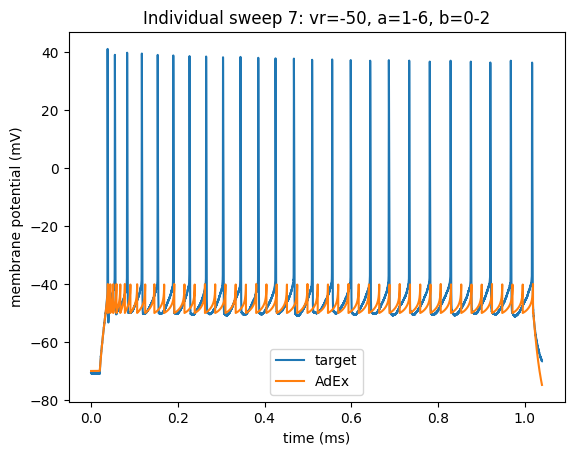

In [78]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_1[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

In [79]:
adex_sweep7_closest_2 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

first fit:
Round 0: Best parameters a=3.08483639 nS, b=230.91867198 pA, tauw=140.24682469 ms (error: 515.93378381 mV^2)
Round 1: Best parameters a=2.46060373 nS, b=131.80049755 pA, tauw=125.20586088 ms (error: 280.04167495 mV^2)
Round 2: Best parameters a=3.53136283 nS, b=75.45844525 pA, tauw=124.10559116 ms (error: 199.0610508 mV^2)
Round 3: Best parameters a=2.44606521 nS, b=49.5238005 pA, tauw=124.10559116 ms (error: 167.16012239 mV^2)
Round 4: Best parameters a=1.51106929 nS, b=30.35802795 pA, tauw=128.50621016 ms (error: 149.66724911 mV^2)
Round 5: Best parameters a=1.36574564 nS, b=22.96185643 pA, tauw=122.7558813 ms (error: 146.85663797 mV^2)
Round 6: Best parameters a=1.30531778 nS, b=15.05466466 pA, tauw=123.00599539 ms (error: 144.42845859 mV^2)
Round 7: Best parameters a=1.20077193 nS, b=10.54475029 pA, tauw=124.85654588 ms (error: 141.43933648 mV^2)
Round 8: Best parameters a=1.20077193 nS, b=10.54475029 pA, tauw=124.85654588 ms (error: 141.43933648 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

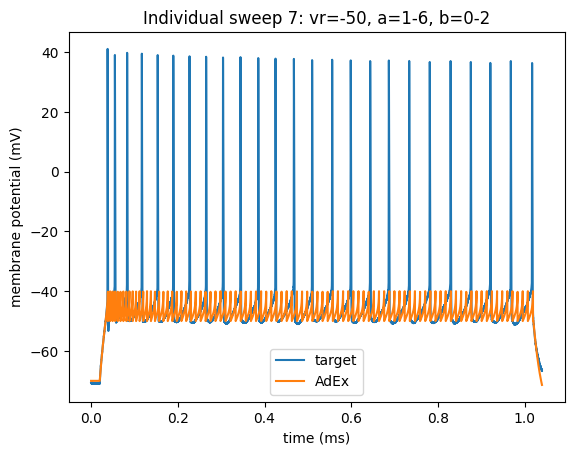

In [80]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_2[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

interesting...

In [81]:
adex_sweep7_closest_3 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)

first fit:
Round 0: Best parameters a=2.62304853 nS, b=240.75796195 pA, tauw=146.73776589 ms (error: 538.59894674 mV^2)
Round 1: Best parameters a=4.0313974 nS, b=145.7274966 pA, tauw=148.19002068 ms (error: 317.29335355 mV^2)
Round 2: Best parameters a=3.42696813 nS, b=97.25073161 pA, tauw=142.82775058 ms (error: 236.14429071 mV^2)
Round 3: Best parameters a=2.88865165 nS, b=55.54338595 pA, tauw=152.17127208 ms (error: 177.77662993 mV^2)
Round 4: Best parameters a=1.56478827 nS, b=40.88167413 pA, tauw=154.35751782 ms (error: 161.18269607 mV^2)
Round 5: Best parameters a=1.55066372 nS, b=28.43422241 pA, tauw=155.99703413 ms (error: 147.67454002 mV^2)
Round 6: Best parameters a=2.16307343 nS, b=22.03620131 pA, tauw=155.79505557 ms (error: 145.40123993 mV^2)
Round 7: Best parameters a=2.16307343 nS, b=22.03620131 pA, tauw=155.79505557 ms (error: 145.40123993 mV^2)
Round 8: Best parameters a=1.3985221 nS, b=15.82968189 pA, tauw=129.7141678 ms (error: 143.66256214 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

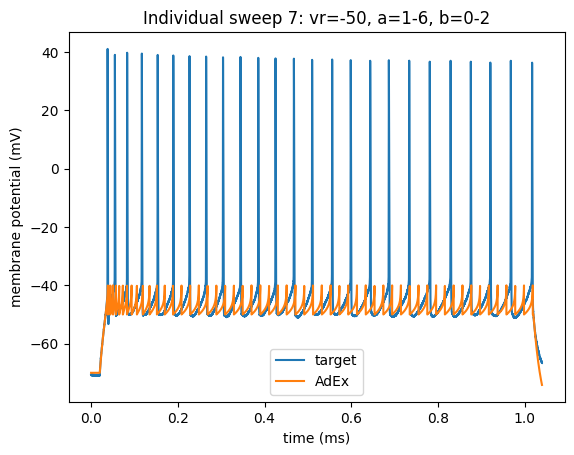

In [82]:
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_3[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=2.90573227 nS, b=290.2201979 pA, tauw=135.5646331 ms (error: 664.7553001 mV^2)
Round 1: Best parameters a=5.46365997 nS, b=157.77381892 pA, tauw=144.11879177 ms (error: 338.83414561 mV^2)
Round 2: Best parameters a=1.98623302 nS, b=101.95288507 pA, tauw=133.17600557 ms (error: 228.06663545 mV^2)
Round 3: Best parameters a=1.65347067 nS, b=72.10961431 pA, tauw=126.5447078 ms (error: 181.53180764 mV^2)
Round 4: Best parameters a=1.9433295 nS, b=47.7438747 pA, tauw=142.64770058 ms (error: 164.35917334 mV^2)
Round 5: Best parameters a=1.24529314 nS, b=42.69288283 pA, tauw=125.06613284 ms (error: 155.23031311 mV^2)
Round 6: Best parameters a=2.15601149 nS, b=30.31044697 pA, tauw=134.04485401 ms (error: 147.11886998 mV^2)
Round 7: Best parameters a=1.46415704 nS, b=36.08589736 pA, tauw=127.0858869 ms (error: 145.78246731 mV^2)
Round 8: Best parameters a=1.46415704 nS, b=36.08589736 pA, tauw=127.0858869 ms (error: 145.78246731 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

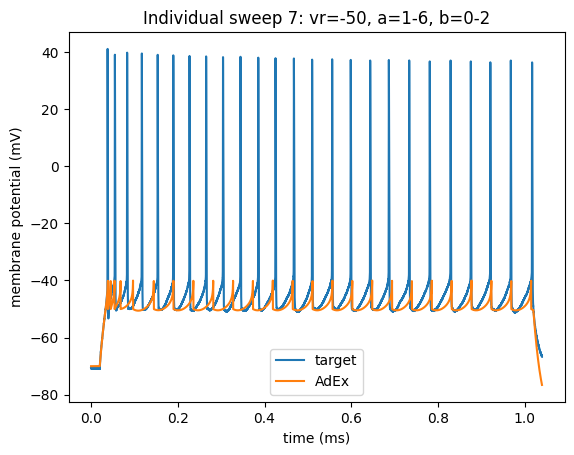

In [83]:
adex_sweep7_closest_4 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_4[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

***


***

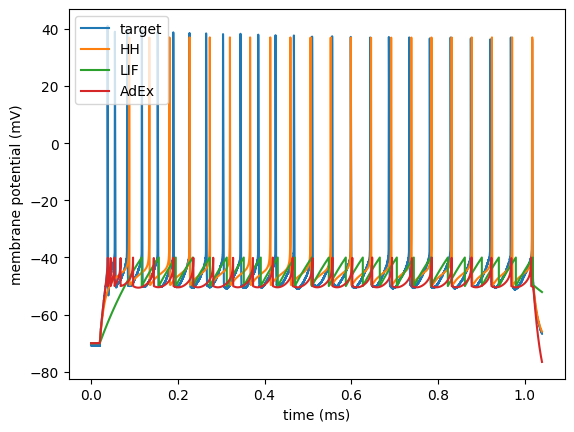

In [94]:
create_comparison_together_four(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000, adex_sweep7_closest_4[0]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')

(-60.0, -30.0)

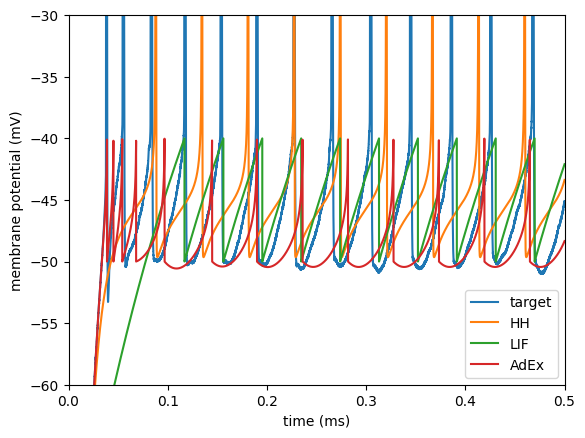

In [95]:
create_comparison_together_four(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000, adex_sweep7_closest_4[0]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
xlim(0, 0.5)
ylim(-60, -30)

(-60.0, -30.0)

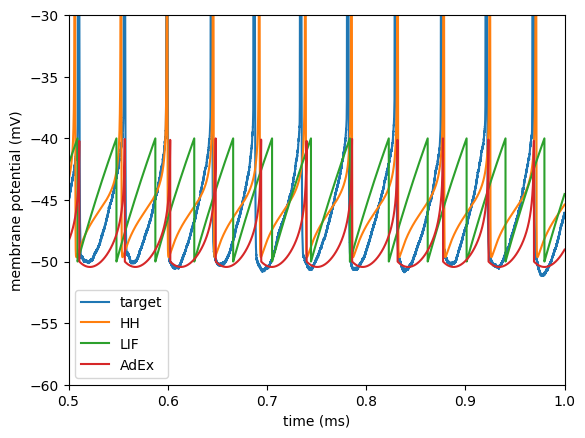

In [96]:
create_comparison_together_four(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000, adex_sweep7_closest_4[0]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
xlim(0.5, 1)
ylim(-60, -30)

Second half more accurate for all three. LIF doesn't match as well as HH and AdEx.

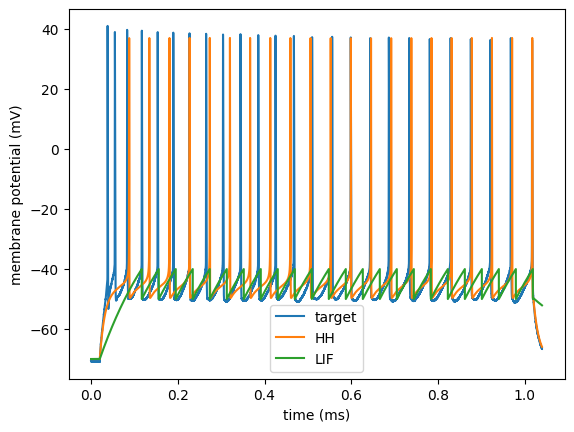

In [97]:
create_comparison_together_three(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000,\
                                d2_title='HH', d3_title='LIF')

(-60.0, -30.0)

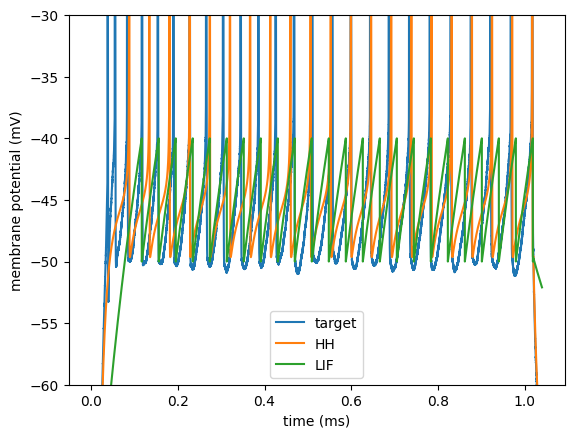

In [98]:
create_comparison_together_three(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, lif_sweep7_5[0]*1000,\
                                d2_title='HH', d3_title='LIF')
ylim(-60, -30)

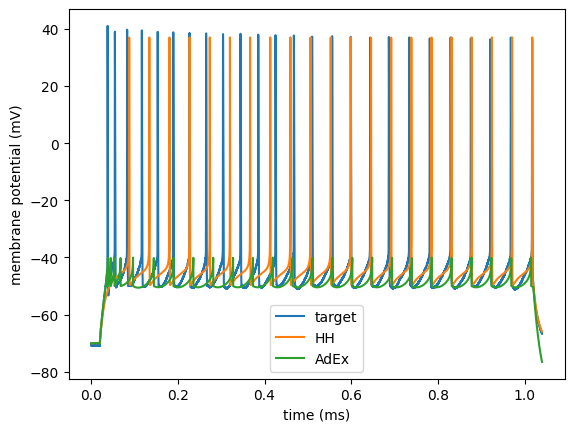

In [99]:
create_comparison_together_three(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, adex_sweep7_closest_4[0]*1000,\
                                d2_title='HH', d3_title='AdEx')

(-60.0, -30.0)

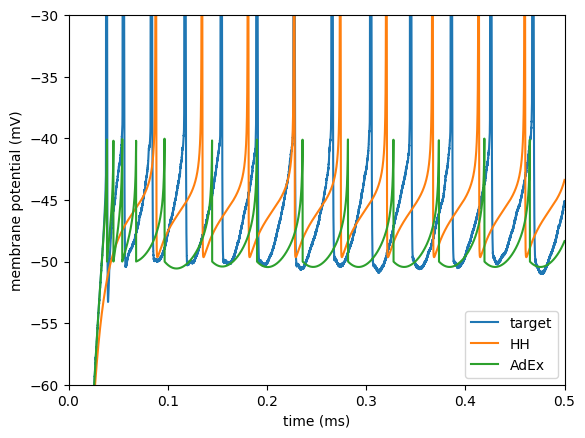

In [100]:
create_comparison_together_three(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, adex_sweep7_closest_4[0]*1000,\
                                d2_title='HH', d3_title='AdEx')
xlim(0, 0.5)
ylim(-60, -30)

(-60.0, -30.0)

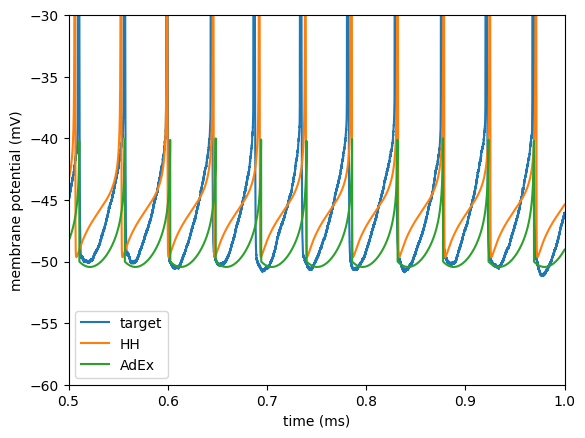

In [101]:
create_comparison_together_three(reshaped_ls_sweep7_out[0], hh_sweep7_16[0]*1000, adex_sweep7_closest_4[0]*1000,\
                                d2_title='HH', d3_title='AdEx')
xlim(0.5, 1)
ylim(-60, -30)

***

***

first fit:
Round 0: Best parameters a=2.49292075 nS, b=257.73064433 pA, tauw=150.31901233 ms (error: 570.03894543 mV^2)
Round 1: Best parameters a=2.18285713 nS, b=149.18116587 pA, tauw=152.91144438 ms (error: 323.88637887 mV^2)
Round 2: Best parameters a=4.65092904 nS, b=82.10524082 pA, tauw=151.15215327 ms (error: 227.14217439 mV^2)
Round 3: Best parameters a=2.15066572 nS, b=56.38105263 pA, tauw=151.04777482 ms (error: 177.94839364 mV^2)
Round 4: Best parameters a=1.81578499 nS, b=56.38105263 pA, tauw=150.66295039 ms (error: 171.6664896 mV^2)
Round 5: Best parameters a=1.81578499 nS, b=56.38105263 pA, tauw=150.66295039 ms (error: 171.6664896 mV^2)
Round 6: Best parameters a=1.81578499 nS, b=56.38105263 pA, tauw=150.66295039 ms (error: 171.6664896 mV^2)
Round 7: Best parameters a=1.81578499 nS, b=56.38105263 pA, tauw=150.66295039 ms (error: 171.6664896 mV^2)
Round 8: Best parameters a=1.81578499 nS, b=56.38105263 pA, tauw=150.66295039 ms (error: 171.6664896 mV^2)
Round 9: Best parame

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

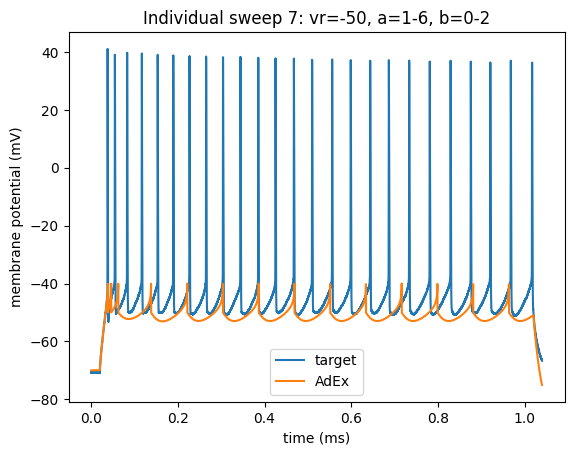

In [84]:
adex_sweep7_closest_5 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_5[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=4.80523597 nS, b=295.19650497 pA, tauw=150.74412922 ms (error: 707.03796416 mV^2)
Round 1: Best parameters a=5.08611176 nS, b=200.31668589 pA, tauw=138.45144912 ms (error: 412.18981442 mV^2)
Round 2: Best parameters a=3.00714168 nS, b=120.20321087 pA, tauw=157.0214857 ms (error: 281.91257916 mV^2)
Round 3: Best parameters a=3.8818977 nS, b=75.95660947 pA, tauw=155.90187079 ms (error: 214.8751132 mV^2)
Round 4: Best parameters a=2.33625121 nS, b=51.75870859 pA, tauw=138.81569464 ms (error: 171.05694832 mV^2)
Round 5: Best parameters a=1.88384923 nS, b=37.89457255 pA, tauw=125.283846 ms (error: 155.44033046 mV^2)
Round 6: Best parameters a=1.33484339 nS, b=31.25754349 pA, tauw=123.62267228 ms (error: 148.66288619 mV^2)
Round 7: Best parameters a=2.33625121 nS, b=24.2047057 pA, tauw=122.22585529 ms (error: 146.60352572 mV^2)
Round 8: Best parameters a=1.38560205 nS, b=19.23756217 pA, tauw=132.73686164 ms (error: 146.33260507 mV^2)
Round 9: Best parame

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

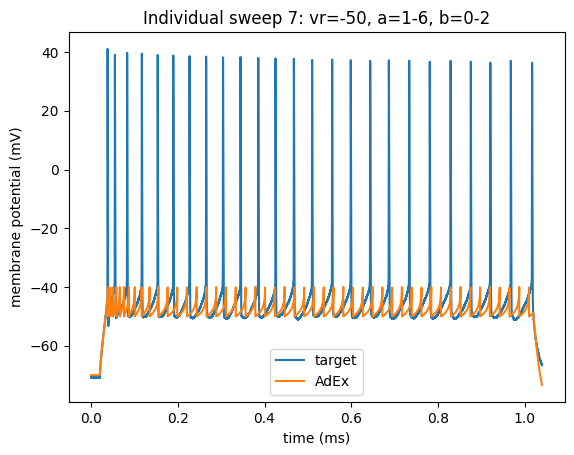

In [85]:
adex_sweep7_closest_6 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_6[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=4.34670361 nS, b=224.0806201 pA, tauw=154.11898396 ms (error: 486.48321456 mV^2)
Round 1: Best parameters a=2.85103276 nS, b=142.71986331 pA, tauw=131.63702975 ms (error: 304.60069785 mV^2)
Round 2: Best parameters a=2.90865755 nS, b=78.02476325 pA, tauw=125.49510384 ms (error: 197.85231398 mV^2)
Round 3: Best parameters a=1.41378388 nS, b=60.2511651 pA, tauw=126.72331326 ms (error: 172.22252178 mV^2)
Round 4: Best parameters a=1.50489044 nS, b=39.19504637 pA, tauw=129.84109613 ms (error: 154.37936636 mV^2)
Round 5: Best parameters a=1.80801743 nS, b=32.43100922 pA, tauw=123.62737836 ms (error: 149.70512252 mV^2)
Round 6: Best parameters a=1.32080653 nS, b=31.56191068 pA, tauw=121.9300402 ms (error: 147.69655813 mV^2)
Round 7: Best parameters a=1.58154625 nS, b=24.53624652 pA, tauw=153.81097988 ms (error: 147.10043285 mV^2)
Round 8: Best parameters a=2.26899713 nS, b=14.93622355 pA, tauw=122.25953713 ms (error: 146.70400928 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

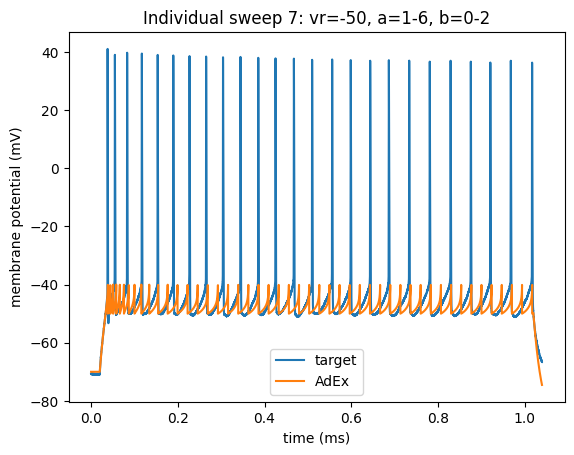

In [86]:
adex_sweep7_closest_7 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_7[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=3.46859356 nS, b=227.99582973 pA, tauw=149.82828938 ms (error: 493.53564511 mV^2)
Round 1: Best parameters a=2.18745618 nS, b=130.93929163 pA, tauw=134.46644854 ms (error: 277.94635661 mV^2)
Round 2: Best parameters a=1.69904177 nS, b=87.45499015 pA, tauw=141.73041822 ms (error: 206.97933723 mV^2)
Round 3: Best parameters a=1.99627676 nS, b=54.32145619 pA, tauw=128.53402562 ms (error: 169.40276992 mV^2)
Round 4: Best parameters a=1.76920466 nS, b=40.33851597 pA, tauw=126.15955794 ms (error: 155.23038172 mV^2)
Round 5: Best parameters a=1.75787046 nS, b=25.55746003 pA, tauw=123.2440727 ms (error: 147.46020568 mV^2)
Round 6: Best parameters a=2.19609132 nS, b=24.00047164 pA, tauw=131.58930873 ms (error: 146.61550402 mV^2)
Round 7: Best parameters a=1.54646178 nS, b=15.03067006 pA, tauw=148.26450405 ms (error: 145.57271152 mV^2)
Round 8: Best parameters a=1.54020282 nS, b=13.47641726 pA, tauw=123.11687818 ms (error: 142.71057259 mV^2)
Round 9: Best pa

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

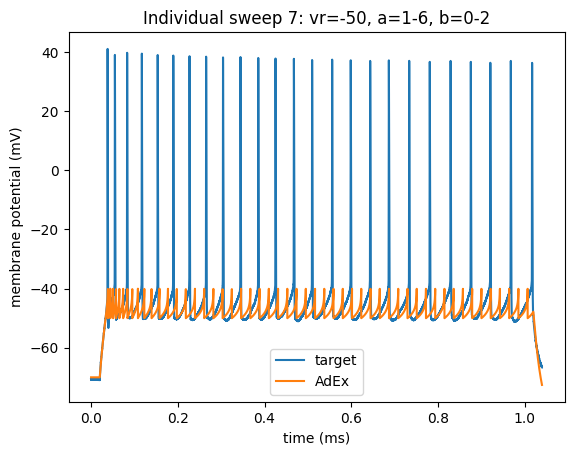

In [87]:
adex_sweep7_closest_8 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_8[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=4.46922853 nS, b=293.26860079 pA, tauw=131.39993067 ms (error: 631.77085606 mV^2)
Round 1: Best parameters a=4.86957394 nS, b=168.90910801 pA, tauw=152.79022188 ms (error: 363.8736208 mV^2)
Round 2: Best parameters a=3.26255843 nS, b=117.83117778 pA, tauw=133.23714577 ms (error: 265.90286614 mV^2)
Round 3: Best parameters a=5.1467604 nS, b=66.27380658 pA, tauw=148.71165219 ms (error: 209.84225399 mV^2)
Round 4: Best parameters a=1.74479579 nS, b=51.20344105 pA, tauw=152.0504622 ms (error: 165.71869654 mV^2)
Round 5: Best parameters a=1.35775431 nS, b=33.79395543 pA, tauw=155.72796841 ms (error: 157.30173803 mV^2)
Round 6: Best parameters a=1.66476962 nS, b=28.24155543 pA, tauw=154.5946927 ms (error: 146.4910676 mV^2)
Round 7: Best parameters a=1.66476962 nS, b=28.24155543 pA, tauw=154.5946927 ms (error: 146.4910676 mV^2)
Round 8: Best parameters a=1.66476962 nS, b=28.24155543 pA, tauw=154.5946927 ms (error: 146.4910676 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

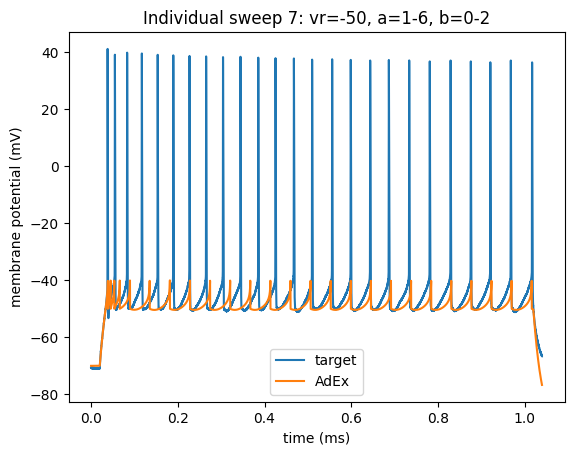

In [88]:
adex_sweep7_closest_9 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_9[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=2.86468314 nS, b=260.67453871 pA, tauw=131.26294884 ms (error: 584.11125544 mV^2)
Round 1: Best parameters a=3.80169587 nS, b=141.95399513 pA, tauw=152.11381765 ms (error: 322.98436867 mV^2)
Round 2: Best parameters a=2.20487157 nS, b=92.79736883 pA, tauw=138.767384 ms (error: 218.05288582 mV^2)
Round 3: Best parameters a=1.31315344 nS, b=62.19178237 pA, tauw=131.16149735 ms (error: 174.46835909 mV^2)
Round 4: Best parameters a=1.25799211 nS, b=41.79022462 pA, tauw=129.47070071 ms (error: 157.63705346 mV^2)
Round 5: Best parameters a=1.14598083 nS, b=37.65800178 pA, tauw=129.47070071 ms (error: 149.33053757 mV^2)
Round 6: Best parameters a=1.66615641 nS, b=31.10089328 pA, tauw=134.31273435 ms (error: 147.5439373 mV^2)
Round 7: Best parameters a=2.13683393 nS, b=24.49917114 pA, tauw=125.181067 ms (error: 146.81231836 mV^2)
Round 8: Best parameters a=1.1652835 nS, b=18.50812348 pA, tauw=126.52704299 ms (error: 145.98598961 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

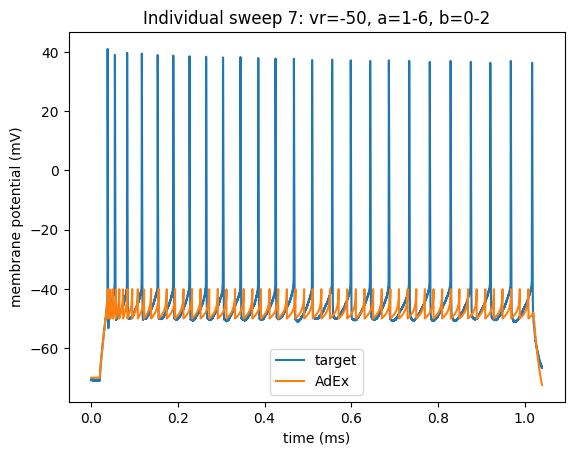

In [89]:
adex_sweep7_closest_10 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_10[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=1.81524723 nS, b=190.18951448 pA, tauw=147.68902019 ms (error: 400.95317972 mV^2)
Round 1: Best parameters a=1.62211396 nS, b=131.39703209 pA, tauw=129.79026847 ms (error: 275.8001288 mV^2)
Round 2: Best parameters a=1.35132994 nS, b=84.89298208 pA, tauw=127.43313524 ms (error: 195.71150771 mV^2)
Round 3: Best parameters a=1.51557354 nS, b=57.13168978 pA, tauw=131.27474607 ms (error: 170.38994935 mV^2)
Round 4: Best parameters a=1.43772528 nS, b=48.81053155 pA, tauw=132.38671322 ms (error: 160.45297706 mV^2)
Round 5: Best parameters a=1.26792308 nS, b=40.64416929 pA, tauw=122.76498824 ms (error: 148.78018177 mV^2)
Round 6: Best parameters a=1.20937138 nS, b=25.50462285 pA, tauw=149.30453846 ms (error: 146.25372213 mV^2)
Round 7: Best parameters a=1.32463369 nS, b=18.45784602 pA, tauw=122.24299965 ms (error: 146.16777074 mV^2)
Round 8: Best parameters a=1.31721671 nS, b=14.22513972 pA, tauw=123.48476933 ms (error: 143.31420579 mV^2)
Round 9: Best pa

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

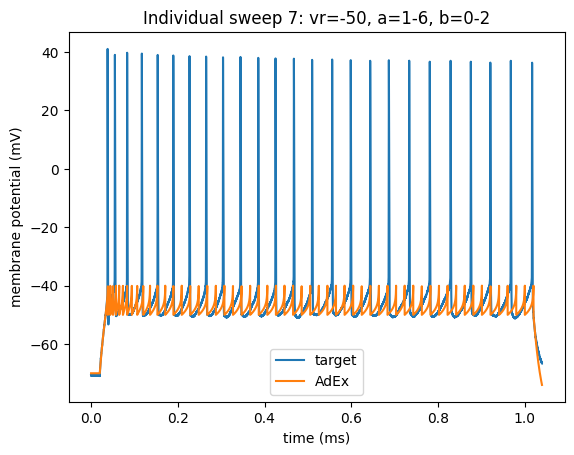

In [90]:
adex_sweep7_closest_11 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_11[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=3.02046574 nS, b=268.35727476 pA, tauw=129.44338831 ms (error: 608.07896237 mV^2)
Round 1: Best parameters a=3.18879966 nS, b=169.01793548 pA, tauw=125.869223 ms (error: 346.40776483 mV^2)
Round 2: Best parameters a=1.81482916 nS, b=109.70419015 pA, tauw=128.55475179 ms (error: 237.44102891 mV^2)
Round 3: Best parameters a=1.78917336 nS, b=73.73527436 pA, tauw=125.07175753 ms (error: 185.84744208 mV^2)
Round 4: Best parameters a=1.49928729 nS, b=53.05076452 pA, tauw=122.29991705 ms (error: 164.85845904 mV^2)
Round 5: Best parameters a=1.31907918 nS, b=35.46333175 pA, tauw=124.09318522 ms (error: 152.24260908 mV^2)
Round 6: Best parameters a=1.21517079 nS, b=38.77067152 pA, tauw=122.77732386 ms (error: 148.15288562 mV^2)
Round 7: Best parameters a=1.17872523 nS, b=23.44881077 pA, tauw=121.67890252 ms (error: 147.56438223 mV^2)
Round 8: Best parameters a=1.13578304 nS, b=16.69662085 pA, tauw=121.32460483 ms (error: 143.77663439 mV^2)
Round 9: Best pa

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

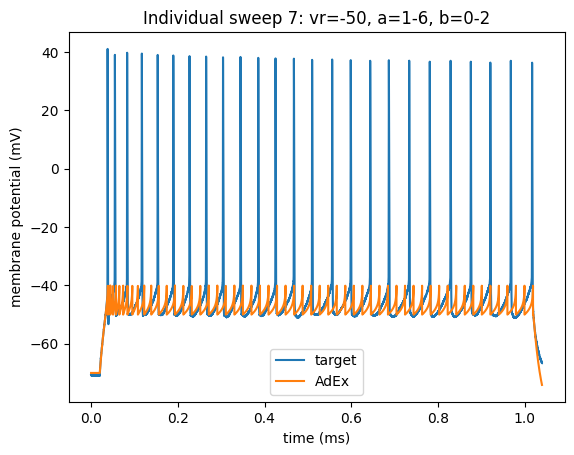

In [91]:
adex_sweep7_closest_12 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_closest_12[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

***


***

quick experiment with increasing rounds to see if always same result...

first fit:
Round 0: Best parameters a=5.1763687 nS, b=226.2432353 pA, tauw=139.96883943 ms (error: 472.06184616 mV^2)
Round 1: Best parameters a=4.34791702 nS, b=139.12294146 pA, tauw=147.24176041 ms (error: 308.30418422 mV^2)
Round 2: Best parameters a=5.62642194 nS, b=85.94066372 pA, tauw=149.64713003 ms (error: 239.37804317 mV^2)
Round 3: Best parameters a=2.12982379 nS, b=59.27717547 pA, tauw=149.57062121 ms (error: 175.58064699 mV^2)
Round 4: Best parameters a=2.0541357 nS, b=41.0151058 pA, tauw=141.75923981 ms (error: 159.16234202 mV^2)
Round 5: Best parameters a=1.46755866 nS, b=29.18408714 pA, tauw=142.41987547 ms (error: 152.6067531 mV^2)
Round 6: Best parameters a=1.74246258 nS, b=23.43508213 pA, tauw=154.20375853 ms (error: 147.4583135 mV^2)
Round 7: Best parameters a=1.34261186 nS, b=22.11157174 pA, tauw=138.22760675 ms (error: 145.80318579 mV^2)
Round 8: Best parameters a=1.68429823 nS, b=17.10563034 pA, tauw=127.07110271 ms (error: 145.64288525 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'Individual sweep 7, test 0: vr=-50, a=1-6, b=0-2')

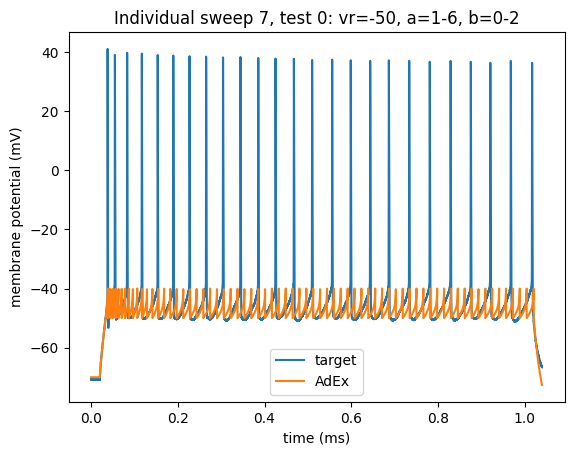

In [17]:
adex_sweep7_best_test0 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test0[0]*1000, d2_title='AdEx')
title('Individual sweep 7, test 0: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=5.41135081 nS, b=253.94664352 pA, tauw=132.79688587 ms (error: 533.52614724 mV^2)
Round 1: Best parameters a=2.60148272 nS, b=140.62321157 pA, tauw=138.14766746 ms (error: 303.93848821 mV^2)
Round 2: Best parameters a=4.47379732 nS, b=80.44803967 pA, tauw=144.85362144 ms (error: 220.6426881 mV^2)
Round 3: Best parameters a=1.50869834 nS, b=63.97298495 pA, tauw=154.10957019 ms (error: 179.41003142 mV^2)
Round 4: Best parameters a=1.37628297 nS, b=44.04483824 pA, tauw=153.95163221 ms (error: 161.78330113 mV^2)
Round 5: Best parameters a=1.34887778 nS, b=32.82870516 pA, tauw=135.4397661 ms (error: 150.20290235 mV^2)
Round 6: Best parameters a=1.22692152 nS, b=31.74438709 pA, tauw=143.95011774 ms (error: 146.95993921 mV^2)
Round 7: Best parameters a=1.22692152 nS, b=31.74438709 pA, tauw=143.95011774 ms (error: 146.95993921 mV^2)
Round 8: Best parameters a=1.22692152 nS, b=31.74438709 pA, tauw=143.95011774 ms (error: 146.95993921 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

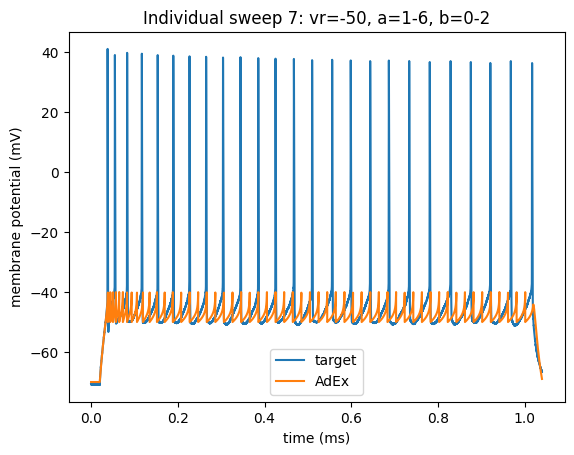

In [7]:
adex_sweep7_best_test1 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test1[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=5.12219516 nS, b=227.15807083 pA, tauw=147.09102022 ms (error: 494.80310523 mV^2)
Round 1: Best parameters a=5.60727259 nS, b=119.9512027 pA, tauw=151.86635096 ms (error: 296.62086241 mV^2)
Round 2: Best parameters a=5.59105917 nS, b=72.46082266 pA, tauw=139.96998195 ms (error: 211.3593767 mV^2)
Round 3: Best parameters a=4.68020938 nS, b=52.13330588 pA, tauw=143.30215239 ms (error: 186.41094737 mV^2)
Round 4: Best parameters a=2.14359896 nS, b=31.83113698 pA, tauw=129.46892958 ms (error: 155.35750502 mV^2)
Round 5: Best parameters a=1.83601627 nS, b=24.94443792 pA, tauw=132.42020495 ms (error: 147.12152765 mV^2)
Round 6: Best parameters a=2.03992833 nS, b=22.65210406 pA, tauw=152.42855236 ms (error: 146.80823735 mV^2)
Round 7: Best parameters a=1.59268756 nS, b=16.42899884 pA, tauw=127.70812096 ms (error: 143.25636946 mV^2)
Round 8: Best parameters a=1.31719006 nS, b=11.99817882 pA, tauw=145.86232954 ms (error: 141.85022085 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

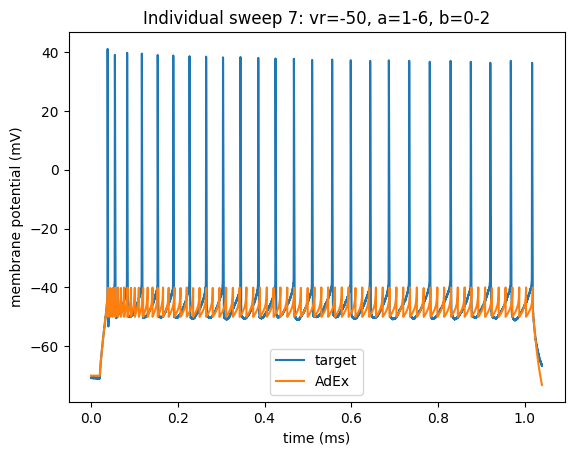

In [8]:
adex_sweep7_best_test2 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test2[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=1.83344876 nS, b=253.36168577 pA, tauw=128.31513523 ms (error: 534.25897037 mV^2)
Round 1: Best parameters a=2.41063054 nS, b=156.5572319 pA, tauw=127.99347113 ms (error: 321.2097735 mV^2)
Round 2: Best parameters a=2.56558269 nS, b=93.14302391 pA, tauw=125.43525951 ms (error: 213.18779559 mV^2)
Round 3: Best parameters a=1.443618 nS, b=67.58739376 pA, tauw=122.35657316 ms (error: 175.77172159 mV^2)
Round 4: Best parameters a=1.26041278 nS, b=41.26235232 pA, tauw=121.8111149 ms (error: 153.5748909 mV^2)
Round 5: Best parameters a=1.30558483 nS, b=31.85429416 pA, tauw=121.83184628 ms (error: 147.33522829 mV^2)
Round 6: Best parameters a=1.19816909 nS, b=32.52199218 pA, tauw=121.56312092 ms (error: 147.14994243 mV^2)
Round 7: Best parameters a=1.19816909 nS, b=32.52199218 pA, tauw=121.56312092 ms (error: 147.14994243 mV^2)
Round 8: Best parameters a=1.19971032 nS, b=19.82948327 pA, tauw=121.8601301 ms (error: 146.96476946 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

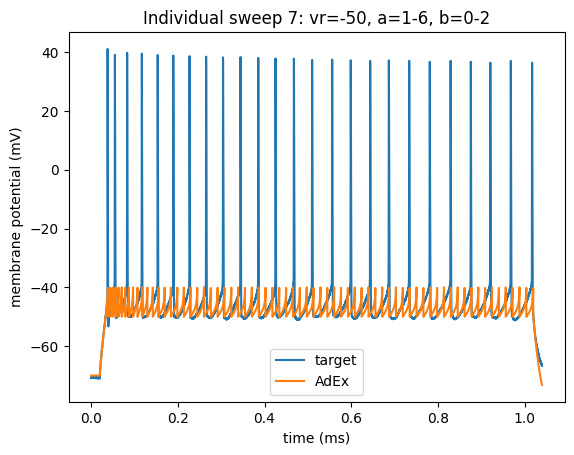

In [9]:
adex_sweep7_best_test3 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test3[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=2.63759299 nS, b=218.51115257 pA, tauw=128.73535549 ms (error: 447.48548194 mV^2)
Round 1: Best parameters a=1.65095411 nS, b=138.05338851 pA, tauw=127.85324644 ms (error: 285.94443059 mV^2)
Round 2: Best parameters a=1.75894007 nS, b=88.23961055 pA, tauw=130.21951156 ms (error: 200.80684841 mV^2)
Round 3: Best parameters a=1.50331181 nS, b=54.28645875 pA, tauw=126.71187032 ms (error: 165.23940162 mV^2)
Round 4: Best parameters a=1.38796757 nS, b=41.71488799 pA, tauw=124.90519817 ms (error: 154.79679605 mV^2)
Round 5: Best parameters a=1.2686286 nS, b=38.27383098 pA, tauw=123.48364357 ms (error: 147.94070015 mV^2)
Round 6: Best parameters a=1.22148392 nS, b=32.02300328 pA, tauw=123.14543018 ms (error: 147.59420434 mV^2)
Round 7: Best parameters a=1.23055261 nS, b=34.51081502 pA, tauw=140.81929621 ms (error: 145.78954103 mV^2)
Round 8: Best parameters a=1.23055261 nS, b=34.51081502 pA, tauw=140.81929621 ms (error: 145.78954103 mV^2)
Round 9: Best pa

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

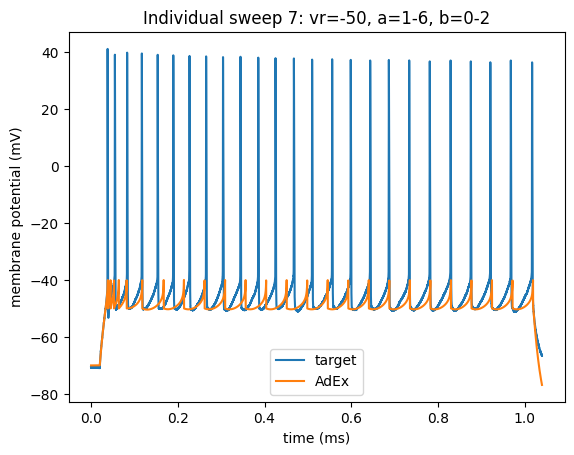

In [10]:
adex_sweep7_best_test4 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test4[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=4.64599815 nS, b=274.94276162 pA, tauw=127.02569613 ms (error: 589.13009097 mV^2)
Round 1: Best parameters a=3.03624762 nS, b=143.63714609 pA, tauw=130.80193423 ms (error: 309.55613324 mV^2)
Round 2: Best parameters a=2.02519053 nS, b=94.85004588 pA, tauw=129.55157689 ms (error: 215.69677784 mV^2)
Round 3: Best parameters a=1.68080311 nS, b=54.51857958 pA, tauw=124.54709102 ms (error: 165.816773 mV^2)
Round 4: Best parameters a=2.02020373 nS, b=41.75367963 pA, tauw=125.30138815 ms (error: 157.55214096 mV^2)
Round 5: Best parameters a=1.41061029 nS, b=31.03322068 pA, tauw=128.5813897 ms (error: 150.27244913 mV^2)
Round 6: Best parameters a=2.88098644 nS, b=22.85472104 pA, tauw=146.84492089 ms (error: 147.50015371 mV^2)
Round 7: Best parameters a=2.01811101 nS, b=16.45198087 pA, tauw=153.77562027 ms (error: 146.70142659 mV^2)
Round 8: Best parameters a=1.90543955 nS, b=14.82950653 pA, tauw=126.83294138 ms (error: 143.05798028 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

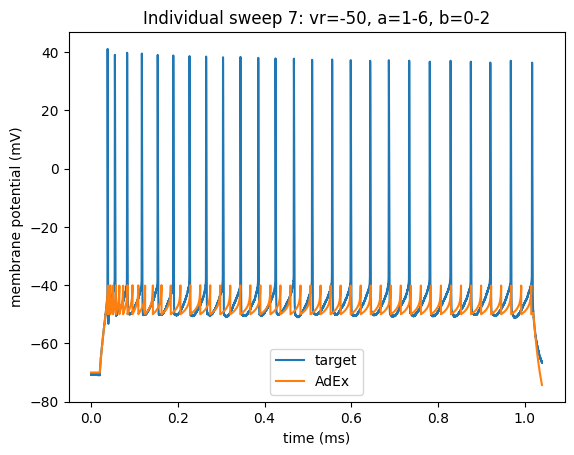

In [11]:
adex_sweep7_best_test5 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test5[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=3.71222101 nS, b=263.71120367 pA, tauw=137.19022172 ms (error: 578.80052858 mV^2)
Round 1: Best parameters a=4.23362267 nS, b=156.15007441 pA, tauw=132.31438026 ms (error: 334.98251155 mV^2)
Round 2: Best parameters a=3.30568715 nS, b=97.23691594 pA, tauw=125.49410769 ms (error: 226.67282757 mV^2)
Round 3: Best parameters a=5.41741701 nS, b=66.78957169 pA, tauw=123.53952763 ms (error: 204.15468542 mV^2)
Round 4: Best parameters a=2.23261285 nS, b=54.46639805 pA, tauw=126.26821032 ms (error: 169.1568026 mV^2)
Round 5: Best parameters a=1.9811962 nS, b=32.8031644 pA, tauw=129.73544583 ms (error: 156.01894732 mV^2)
Round 6: Best parameters a=1.5601468 nS, b=35.9282985 pA, tauw=125.4652241 ms (error: 147.69516868 mV^2)
Round 7: Best parameters a=1.5601468 nS, b=35.9282985 pA, tauw=125.4652241 ms (error: 147.69516868 mV^2)
Round 8: Best parameters a=1.60552503 nS, b=31.03261187 pA, tauw=148.08291457 ms (error: 145.90050793 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

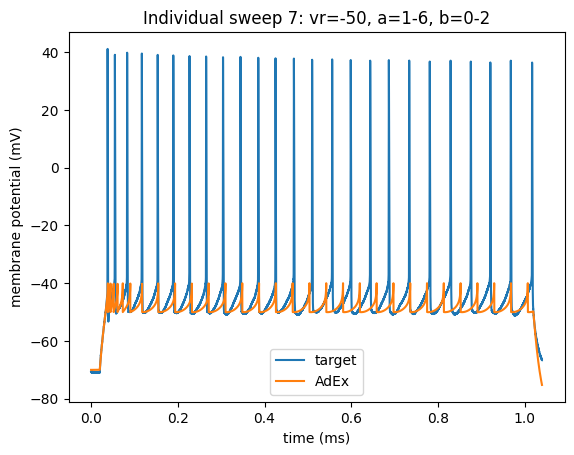

In [12]:
adex_sweep7_best_test6 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test6[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=2.91485843 nS, b=233.44986139 pA, tauw=128.30900008 ms (error: 487.98854449 mV^2)
Round 1: Best parameters a=1.88930184 nS, b=148.46880353 pA, tauw=127.6100234 ms (error: 298.48789972 mV^2)
Round 2: Best parameters a=1.79647562 nS, b=105.23131367 pA, tauw=139.47194312 ms (error: 236.64909435 mV^2)
Round 3: Best parameters a=1.76408139 nS, b=77.95904795 pA, tauw=123.92626469 ms (error: 193.22686643 mV^2)
Round 4: Best parameters a=1.87574426 nS, b=50.57912966 pA, tauw=123.43045034 ms (error: 164.51803796 mV^2)
Round 5: Best parameters a=1.31940593 nS, b=37.97591194 pA, tauw=122.65755354 ms (error: 149.56942673 mV^2)
Round 6: Best parameters a=1.27924383 nS, b=32.22393759 pA, tauw=151.38751825 ms (error: 147.14711757 mV^2)
Round 7: Best parameters a=1.23745467 nS, b=32.08408268 pA, tauw=121.9528164 ms (error: 147.00037018 mV^2)
Round 8: Best parameters a=1.47693083 nS, b=31.31266575 pA, tauw=121.09619973 ms (error: 146.5884484 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

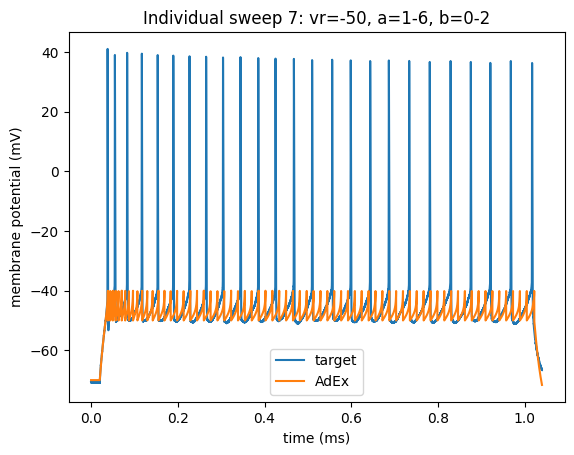

In [13]:
adex_sweep7_best_test7 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test7[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=4.30635875 nS, b=224.81058434 pA, tauw=129.19480799 ms (error: 485.3350788 mV^2)
Round 1: Best parameters a=4.929095 nS, b=128.47677162 pA, tauw=145.54768345 ms (error: 296.6595878 mV^2)
Round 2: Best parameters a=4.0840601 nS, b=82.36282469 pA, tauw=123.86646001 ms (error: 211.28941366 mV^2)
Round 3: Best parameters a=1.7700177 nS, b=57.04931563 pA, tauw=131.35372935 ms (error: 171.6893936 mV^2)
Round 4: Best parameters a=1.43361035 nS, b=33.12525464 pA, tauw=129.06020273 ms (error: 151.56639016 mV^2)
Round 5: Best parameters a=1.39854863 nS, b=30.87263773 pA, tauw=125.86946228 ms (error: 147.9210382 mV^2)
Round 6: Best parameters a=1.95381013 nS, b=23.94786737 pA, tauw=140.86885042 ms (error: 146.59019331 mV^2)
Round 7: Best parameters a=1.68487291 nS, b=27.93431202 pA, tauw=155.95828803 ms (error: 146.26450428 mV^2)
Round 8: Best parameters a=1.32988268 nS, b=34.21741135 pA, tauw=139.37183324 ms (error: 145.77000037 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

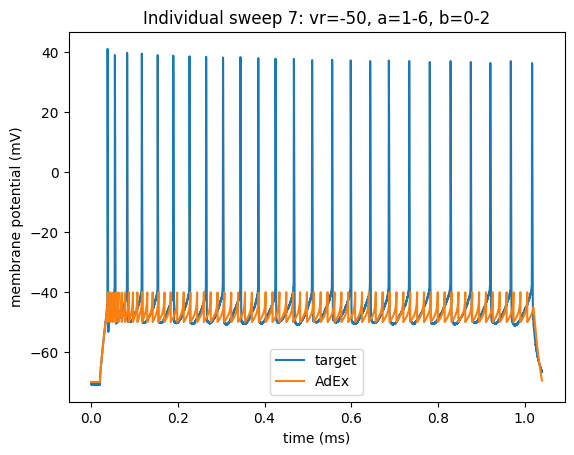

In [14]:
adex_sweep7_best_test8 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test8[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=4.64841518 nS, b=210.24189757 pA, tauw=148.3603261 ms (error: 442.33011133 mV^2)
Round 1: Best parameters a=4.64841518 nS, b=127.81504122 pA, tauw=148.3603261 ms (error: 307.10285822 mV^2)
Round 2: Best parameters a=2.74354323 nS, b=84.96654621 pA, tauw=129.10608568 ms (error: 207.74340422 mV^2)
Round 3: Best parameters a=1.72613357 nS, b=61.48791032 pA, tauw=136.89070447 ms (error: 173.87589555 mV^2)
Round 4: Best parameters a=2.4347805 nS, b=34.84486188 pA, tauw=133.80317925 ms (error: 156.93253321 mV^2)
Round 5: Best parameters a=1.67960749 nS, b=30.62295609 pA, tauw=136.77316689 ms (error: 147.75290827 mV^2)
Round 6: Best parameters a=1.68563507 nS, b=25.23429505 pA, tauw=135.97833628 ms (error: 147.72785123 mV^2)
Round 7: Best parameters a=3.40600374 nS, b=19.29682753 pA, tauw=128.02788659 ms (error: 146.3242754 mV^2)
Round 8: Best parameters a=3.40600374 nS, b=19.29682753 pA, tauw=128.02788659 ms (error: 146.3242754 mV^2)
Round 9: Best parame

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

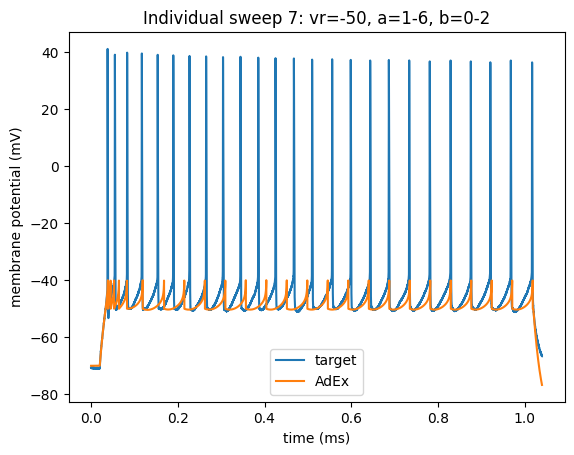

In [15]:
adex_sweep7_best_test9 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test9[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

first fit:
Round 0: Best parameters a=2.15288891 nS, b=251.92877337 pA, tauw=152.04681002 ms (error: 565.29663704 mV^2)
Round 1: Best parameters a=1.64138318 nS, b=117.11242805 pA, tauw=139.10631345 ms (error: 248.22247558 mV^2)
Round 2: Best parameters a=1.94567762 nS, b=74.41664972 pA, tauw=150.49360476 ms (error: 194.341621 mV^2)
Round 3: Best parameters a=1.77713135 nS, b=50.30379274 pA, tauw=131.27680703 ms (error: 165.52036458 mV^2)
Round 4: Best parameters a=1.77713135 nS, b=50.30379274 pA, tauw=131.27680703 ms (error: 165.52036458 mV^2)
Round 5: Best parameters a=2.53724209 nS, b=40.82085414 pA, tauw=154.38999795 ms (error: 164.02306347 mV^2)
Round 6: Best parameters a=1.34893734 nS, b=45.55202732 pA, tauw=151.52328271 ms (error: 160.50378281 mV^2)
Round 7: Best parameters a=1.34893734 nS, b=45.55202732 pA, tauw=151.52328271 ms (error: 160.50378281 mV^2)
Round 8: Best parameters a=1.63839894 nS, b=40.82085414 pA, tauw=157.44653261 ms (error: 159.0320083 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'Individual sweep 7: vr=-50, a=1-6, b=0-2')

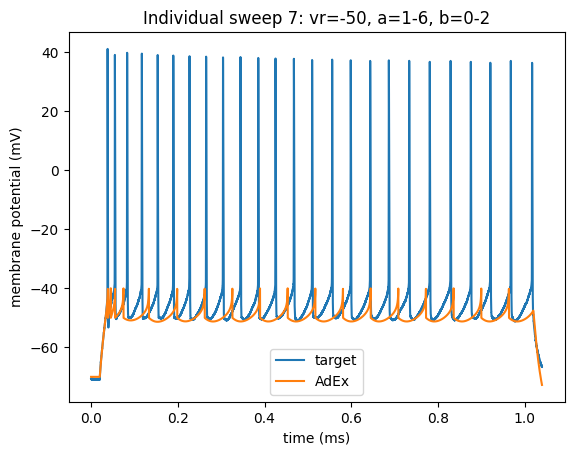

In [16]:
adex_sweep7_best_test10 = run_adex(reshaped_ls_sweep7_in, reshaped_ls_sweep7_out, vr=-50, round_num=20, a_max=6, b_max=2)
create_comparison_together(reshaped_ls_sweep7_out[0], adex_sweep7_best_test10[0]*1000, d2_title='AdEx')
title('Individual sweep 7: vr=-50, a=1-6, b=0-2')

***